#**El Problema:**

Se desea identificar las variables académicas y socioeconómicas que influyen en la probabilidad del acceso a la Educación Superior.
Para ello se recopilo los datos de años 2021 de los aspirantes al proceso de Nivelación de los aspirantes a una Facultad de Ingenierías de una Universidad de la ciudad de Guayaquil. Para ello se solicitó los datos a la autoridad respectiva obteniéndose el apoyo para el impulso del estudio con datos anonimizados. Durante el análisis de los datos se identificó que las materias de ingreso para las tres carreras entre 2021 fueron Matemáticas, Lenguaje, Física y una nota adicional de un Proyecto Integrador. El Alumno que aprueba debe obtener 70% o más de asistencia en cada materia y nota igual o superior a 7/10. Se cuenta con registros de alumnos que aprobaron y que reprobaron. No se considera en este estudio aquellos que habiendo reprobado aplicaron al proceso de Recuperación dejando ese análisis para un estudio futuro por la cantidad muy baja de datos disponibles en ese escenario. Con lo antes expuesto se procede a la construcción del proceso EDA para limpieza y selección de variables relevantes y el proceso KDD para crear u modelo que permita predecir la probabilidad de aprobación de nuevos aspirantes para que sea de utilidad a la Unidad de Nivelación de la Facultad en estudio.    


# 1 - Cargar Librerias

In [1]:
#Librerías básicas de manejo de datos
import numpy as np
import pandas as pd

#Librerías parta de manejo de gráficos
import matplotlib.pyplot as plt

#Librerías para de división de datos en train y test
from sklearn.model_selection import train_test_split

#Librerías de modelos a aplicar en la búsqueda del modelo más adecuado para la predicción
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import StandardScaler


#**2. Se cargan los Datos Crudos**

In [2]:
# Se apertura acceso a repositorio googgle drive

from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
# Definir las rutas de los archivos en Google Drive
ruta_base = '/content/drive/MyDrive/Colab Notebooks/VIU/TFM/Datos/'

# Archivos para el DataFrame de Encuestas
archivo_encuesta1 = ruta_base + '2021_C1_INF_ENCUESTA.xlsx'
archivo_encuesta2 = ruta_base + '2021_C2_INF_ENCUESTA.xlsx'

# Archivos para el DataFrame de Notas Generales
archivo_notas1 = ruta_base + '2021_C1_INF_ACADÉMICA.xlsx'
archivo_notas2 = ruta_base + '2021_C2_INF_ACADÉMICA.xlsx'

# Leer los archivos de encuestas en un solo DataFrame
df_Inf_Encuesta = pd.concat([pd.read_excel(archivo_encuesta1), pd.read_excel(archivo_encuesta2)], ignore_index=True)

# Leer los archivos de notas generales en otro DataFrame
df_Inf_Académica = pd.concat([pd.read_excel(archivo_notas1), pd.read_excel(archivo_notas2)], ignore_index=True)

# Mostrar información sobre los DataFrames resultantes
print(f"Dimensiones del DataFrame de Encuestas: {df_Inf_Encuesta.shape}")
print(f"Dimensiones del DataFrame de Notas Generales: {df_Inf_Académica.shape}")

Dimensiones del DataFrame de Encuestas: (1427, 38)
Dimensiones del DataFrame de Notas Generales: (1636, 32)


#**3. Fase de Exploración**

In [4]:
# Se identifican registros duplicados en todos sus campos conservando solo una vez cada ocurrencia
import pandas as pd

# Asumiendo que df_Inf_Académica es tu DataFrame

# Paso 1: Mostrar información inicial
print("Número de registros iniciales df_Inf_Academica:", len(df_Inf_Académica))

# Paso 2: Eliminar duplicados exactos (coinciden en todos los campos)
df_Inf_Académica_sin_duplicados_exactos = df_Inf_Académica.drop_duplicates()
print("Número de registros después de eliminar duplicados exactos:", len(df_Inf_Académica_sin_duplicados_exactos))
print("Número de duplicados exactos eliminados:", len(df_Inf_Académica) - len(df_Inf_Académica_sin_duplicados_exactos))

Número de registros iniciales df_Inf_Academica: 1636
Número de registros después de eliminar duplicados exactos: 1636
Número de duplicados exactos eliminados: 0


In [5]:
# Se identifican registros duplicados en el ID_ALUMNO conservando solo una vez cada ocurrencia

# Paso 3: Identificar y eliminar duplicados basados solo en ID_ALUMNO
duplicados_id = df_Inf_Académica_sin_duplicados_exactos[df_Inf_Académica_sin_duplicados_exactos.duplicated(subset=['ID_ALUMNO'], keep=False)]
print("\nNúmero de registros con ID_ALUMNO duplicado en df_Inf_Academica::", len(duplicados_id))

# Paso 4: Conservar solo el primer registro para cada ID_ALUMNO duplicado
df_Inf_Académica_depurado = df_Inf_Académica_sin_duplicados_exactos.drop_duplicates(subset=['ID_ALUMNO'], keep='first')

# Paso 5: Mostrar información final
print("\nNúmero de registros finales después de la depuración en df_Inf_Academica:", len(df_Inf_Académica_depurado))
print("Número total de registros eliminados de df_Inf_Academica:", len(df_Inf_Académica) - len(df_Inf_Académica_depurado))



Número de registros con ID_ALUMNO duplicado en df_Inf_Academica:: 2

Número de registros finales después de la depuración en df_Inf_Academica: 1635
Número total de registros eliminados de df_Inf_Academica: 1


In [6]:
# Se retiran los alumnos que no iniciaron el proceso registros con LEGALIZADO_IES = "NO"

# conservando los registros validos de alumnos que si realizaron el proceso, LEGALIZADO_IES = "SI"
# que corresponden a los alumnos que regularizaron la matricula al curso de Nivelación

df_Inf_Académica_depurado = df_Inf_Académica_depurado[df_Inf_Académica_depurado['LEGALIZADO_IES'] == 'SI']

In [7]:
# Se analiza el volumen de registros con datos de colegio vacío (NaN)

jornada_counts = df_Inf_Académica_depurado['JORNADA_COLEGIO'].value_counts(dropna=False)

print("\nTotal de ocurrencias de cada clase en JORNADA_COLEGIO:")
print(jornada_counts)


Total de ocurrencias de cada clase en JORNADA_COLEGIO:
JORNADA_COLEGIO
MATUTINA Y VESPERTINA              397
Matutina                           292
Matutina y Vespertina              255
MATUTINA                           217
Vespertina                          74
MATUTINA, VESPERTINA Y NOCTURNA     70
Matutina, Vespertina y Nocturna     42
VESPERTINA                          17
NaN                                 12
Matutina y Nocturna                  5
MATUTINA Y NOCTURNA                  2
Nocturna                             2
Name: count, dtype: int64


In [8]:
#Dada la baja cantidad de 12 de 1636 (0.73%) menos de 1 % de registros con datos de colegio vacíos
#se opta por retirar esos registros

df_Inf_Académica_depurado = df_Inf_Académica_depurado.dropna(subset=['ZONA_COLEGIO'])

In [9]:
# Resetear el índice del dataframe resultante
df_Inf_Académica_depurado2 = df_Inf_Académica_depurado.reset_index(drop=True)

# Mostrar información sobre el dataframe resultante
print("Número de registros después de filtrar:", len(df_Inf_Académica_depurado2))

Número de registros después de filtrar: 1359


In [10]:
# Se analiza posibles casos de datos inconsistentes con Asistencia Alta (70% o más) y Nota alta (7 o más) y con estado inconsistente en REPRONBADO

# Se consulta al proveedor de datos y mencionan que por cambio de normativa los alumnos no cumplían la nueva normativa
# de tener más de 7/10 en todas las materias además del promedio general, por lo que reprobaron.
# Por lo que se retira esos casos no consistentes por cambio de normativa.

import pandas as pd

# Se identifican registros con inconsistencias que indican asistencia y nota alta, pero con campo APROBADO="NO"
# corresponde a alumnos en proceso de cambio de la normativa del estado, que ya no cubrieron la nueva normativa
# de contar con todas las notas de las materias en cifra igual o superior a 7.0.

# Crear el DataFrame df_casos_en_analisis con los registros que cumplen las condiciones
df_casos_en_analisis = df_Inf_Académica_depurado2[
    (df_Inf_Académica_depurado2['ASISTENCIA_FINAL_IES'] >= 70) &
    (df_Inf_Académica_depurado2['NOTA_FINAL_IES'] >= 7) &
    (df_Inf_Académica_depurado2['APROBADO_FINAL_IES'] == 'NO')
]

# Verificar el número de registros antes de la eliminación
print(f"Número de registros en df_consolidado antes de la eliminación: {len(df_Inf_Académica_depurado2)}")

# Crear una máscara booleana para identificar los registros a eliminar
mascara = df_Inf_Académica_depurado2.apply(tuple, axis=1).isin(df_casos_en_analisis.apply(tuple, axis=1))

# Eliminar los registros identificados
df_Inf_Académica_depurado3 = df_Inf_Académica_depurado2[~mascara]

# Verificar el número de registros después de la eliminación
print(f"Número de registros en df_consolidado después de la eliminación: {len(df_Inf_Académica_depurado3)}")

# Calcular cuántos registros fueron eliminados
registros_eliminados = len(df_Inf_Académica_depurado2) - len(df_Inf_Académica_depurado3)
print(f"Número de registros eliminados: {registros_eliminados}")

Número de registros en df_consolidado antes de la eliminación: 1359
Número de registros en df_consolidado después de la eliminación: 1312
Número de registros eliminados: 47


In [11]:
df_Inf_Académica_depurado3.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1312 entries, 0 to 1358
Data columns (total 32 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   ID_ALUMNO                      1312 non-null   int64  
 1   SEXO                           1312 non-null   object 
 2   ETNIA                          1312 non-null   object 
 3   DISCAPACIDAD                   7 non-null      object 
 4   PORCENTAJE_DISCAPACIDAD        1312 non-null   int64  
 5   JORNADA_COLEGIO                1312 non-null   object 
 6   ZONA_COLEGIO                   1312 non-null   object 
 7   PROVINCIA_COLEGIO              1312 non-null   object 
 8   CANTÓN_COLEGIO                 1312 non-null   object 
 9   PARROQUIA_COLEGIO              1312 non-null   object 
 10  TIPO_EDUCACIÓN_COLEGIO         1312 non-null   object 
 11  NIVEL_EDUCACIÓN_COLEGIO        1312 non-null   object 
 12  SOSTENIMIENTO_COLEGIO          1312 non-null   object

In [12]:
df_Inf_Académica_depurado3.head(5)

,ID_ALUMNO,SEXO,ETNIA,DISCAPACIDAD,PORCENTAJE_DISCAPACIDAD,JORNADA_COLEGIO,ZONA_COLEGIO,PROVINCIA_COLEGIO,CANTÓN_COLEGIO,PARROQUIA_COLEGIO,...,LEGALIZADO_IES,MATRÍCULA_IES,GRATUIDAD_IES,VALOR_MATRÍCULA_IES,ESTADO_ALUMNO_IES,APROBADO_FINAL_IES,NOTA_FINAL_IES,ASISTENCIA_FINAL_IES,OBSERVACIÓN_CURSO_IES,EXONERACIÓN_IES
0,2101724,MASCULINO,Mestizos,NaN,0,MATUTINA Y VESPERTINA,ZONA 8,GUAYAS,GUAYAQUIL,TARQUI,...,SI,PRIMERA MATRÍCULA,GRATUIDAD (Postulantes MTN),0.0,ACTIVO,SI,9.1,100.00,NaN,NO
1,2101334,MASCULINO,Mestizos,NaN,0,MATUTINA Y VESPERTINA,ZONA 8,GUAYAS,GUAYAQUIL,XIMENA,...,SI,PRIMERA MATRÍCULA,GRATUIDAD (Postulantes MTN),0.0,ACTIVO,NO,0.5,22.67,Perd.x Asist. (A0),NO
2,2101239,FEMENINO,Mestizos,NaN,0,MATUTINA,ZONA 8,GUAYAS,SAMBORONDON,SAMBORONDON,...,SI,PRIMERA MATRÍCULA,GRATUIDAD (Postulantes MTN),0.0,ACTIVO,SI,8.4,100.00,NaN,NO
3,2101307,MASCULINO,Mestizos,NaN,0,MATUTINA Y VESPERTINA,ZONA 8,GUAYAS,GUAYAQUIL,TARQUI,...,SI,PRIMERA MATRÍCULA,GRATUIDAD (Postulantes MTN),0.0,ACTIVO,SI,8.1,97.67,NaN,NO
4,2101624,MASCULINO,Mestizos,NaN,0,MATUTINA,ZONA 8,GUAYAS,GUAYAQUIL,TARQUI,...,SI,PRIMERA MATRÍCULA,GRATUIDAD (Postulantes MTN),0.0,ACTIVO,SI,7.3,99.00,NaN,NO


In [13]:
import pandas as pd

# Paso 1: Mostrar información inicial
print("Número de registros iniciales:", len(df_Inf_Encuesta))

# Paso 2: Eliminar duplicados exactos (coinciden en todos los campos)
df_Inf_Encuesta_sin_duplicados_exactos = df_Inf_Encuesta.drop_duplicates()
print("Número de registros después de eliminar duplicados exactos:", len(df_Inf_Encuesta_sin_duplicados_exactos))
print("Número de duplicados exactos eliminados:", len(df_Inf_Encuesta) - len(df_Inf_Encuesta_sin_duplicados_exactos))

# Paso 3: Identificar y eliminar duplicados basados solo en ID_ALUMNO
duplicados_id = df_Inf_Encuesta_sin_duplicados_exactos[df_Inf_Encuesta_sin_duplicados_exactos.duplicated(subset=['ID_ALUMNO'], keep=False)]
print("\nNúmero de registros con ID_ALUMNO duplicado:", len(duplicados_id))

# Paso 4: Conservar solo el primer registro para cada ID_ALUMNO duplicado
df_Inf_Encuesta_depurado = df_Inf_Encuesta_sin_duplicados_exactos.drop_duplicates(subset=['ID_ALUMNO'], keep='first')

# Paso 5: Mostrar información final
print("\nNúmero de registros finales después de la depuración:", len(df_Inf_Encuesta_depurado))
print("Número total de registros eliminados:", len(df_Inf_Encuesta) - len(df_Inf_Encuesta_depurado))


Número de registros iniciales: 1427
Número de registros después de eliminar duplicados exactos: 1427
Número de duplicados exactos eliminados: 0

Número de registros con ID_ALUMNO duplicado: 0

Número de registros finales después de la depuración: 1427
Número total de registros eliminados: 0


In [14]:
df_Inf_Encuesta_depurado.head(5)

,ID_ALUMNO,EDAD,PROVINCIA_RESIDENCIA,CANTÓN_RESIDENCIA,ESTADO_CIVIL,FACULTAD_IES,NOTA_PROCE_GOB,PERÍODO_APLICO_IES,TIPO_COLEGIO_GRADUADO,PROMEDIO_GRADUACIÓN,...,CONOCES_SISTEMA_POSTULACIÓN,ESTAS_DEACUERDO_SISTEMA_POST,AL_POSTULAR_CONOCIAS_OFERTA_ACADEMICA,MEDIO_ENTERASTE_CARRERA,ELEGIO_CARRERA_POR,MOTIVACIÓN_ELECCIÓN_CARRERA,TIENE_CUALIDADES_PARA_CARRERA,PLANEA_CAMBIARSE_DE_CARRERA,PERFIL_SOCIOECONOMICO,ORDEN_PAGO_IES
0,2101724,25,GUAYAS,GUAYAQUIL,Soltero(a),INGENIERIA INDUSTRIAL ...,823,2021 - 2022 CN1,FISCAL,7 - 7.99,...,POCO,SI,SI,PÁGINA WEB DE LA UNIVERSIDAD DE GUAYAQUIL,PERSONAL,OPORTUNIDADES LABORALES QUE LA CARRERA OFRECE,SI,NO,C+ (medio-tipico),PAGADA
1,2101334,18,GUAYAS,GUAYAQUIL,Soltero(a),INGENIERIA INDUSTRIAL ...,810,2021 - 2022 CN1,PARTICULAR,8 - 8.99,...,POCO,SI,SI,PÁGINA WEB DE LA UNIVERSIDAD DE GUAYAQUIL,PERSONAL,OPORTUNIDADES LABORALES QUE LA CARRERA OFRECE,SI,NO,C+ (medio-tipico),PAGADA
2,2101239,17,GUAYAS,SAMBORONDON,Soltero(a),INGENIERIA INDUSTRIAL ...,842,2021 - 2022 CN1,PARTICULAR,9 - 9.99,...,POCO,NO,NO,EXPOSICIONES / FERIAS / CASAS ABIERTAS,PERSONAL,OPORTUNIDADES LABORALES QUE LA CARRERA OFRECE,SI,NO,C- (medio-bajo),PAGADA
3,2101307,17,GUAYAS,DAULE,Soltero(a),INGENIERIA INDUSTRIAL ...,808,2021 - 2022 CN1,FISCAL,9 - 9.99,...,POCO,SI,SI,PÁGINA WEB DE LA UNIVERSIDAD DE GUAYAQUIL,PERSONAL,VOCACIÓN PERSONAL,SI,NO,C- (medio-bajo),PAGADA
4,2101624,17,GUAYAS,GUAYAQUIL,Soltero(a),INGENIERIA INDUSTRIAL ...,796,2021 - 2022 CN1,FISCAL,8 - 8.99,...,POCO,SI,NO,PÁGINA WEB DE LA UNIVERSIDAD DE GUAYAQUIL,PERSONAL,OPORTUNIDADES LABORALES QUE LA CARRERA OFRECE,SI,NO,C+ (medio-tipico),PAGADA


In [15]:
df_Inf_Académica_depurado3.info(5)

<class 'pandas.core.frame.DataFrame'>
Index: 1312 entries, 0 to 1358
Data columns (total 32 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   ID_ALUMNO                      1312 non-null   int64  
 1   SEXO                           1312 non-null   object 
 2   ETNIA                          1312 non-null   object 
 3   DISCAPACIDAD                   7 non-null      object 
 4   PORCENTAJE_DISCAPACIDAD        1312 non-null   int64  
 5   JORNADA_COLEGIO                1312 non-null   object 
 6   ZONA_COLEGIO                   1312 non-null   object 
 7   PROVINCIA_COLEGIO              1312 non-null   object 
 8   CANTÓN_COLEGIO                 1312 non-null   object 
 9   PARROQUIA_COLEGIO              1312 non-null   object 
 10  TIPO_EDUCACIÓN_COLEGIO         1312 non-null   object 
 11  NIVEL_EDUCACIÓN_COLEGIO        1312 non-null   object 
 12  SOSTENIMIENTO_COLEGIO          1312 non-null   object

In [16]:
df_Inf_Encuesta_depurado.info(5)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1427 entries, 0 to 1426
Data columns (total 38 columns):
 #   Column                                 Non-Null Count  Dtype 
---  ------                                 --------------  ----- 
 0   ID_ALUMNO                              1427 non-null   int64 
 1   EDAD                                   1427 non-null   int64 
 2   PROVINCIA_RESIDENCIA                   1427 non-null   object
 3   CANTÓN_RESIDENCIA                      1426 non-null   object
 4   ESTADO_CIVIL                           1427 non-null   object
 5   FACULTAD_IES                           1427 non-null   object
 6   NOTA_PROCE_GOB                         1427 non-null   int64 
 7   PERÍODO_APLICO_IES                     1427 non-null   object
 8   TIPO_COLEGIO_GRADUADO                  1427 non-null   object
 9   PROMEDIO_GRADUACIÓN                    1427 non-null   object
 10  TIPO_BACHILLERATO                      1427 non-null   object
 11  AÑO_GRADUACIÓN   

In [17]:
# Se realiza la unión de los DataFrames usando inner join
df_consolidado1 = df_Inf_Académica_depurado3.merge(df_Inf_Encuesta_depurado, on='ID_ALUMNO', how='inner', suffixes=('', '_E'))

In [18]:
df_consolidado1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1309 entries, 0 to 1308
Data columns (total 69 columns):
 #   Column                                 Non-Null Count  Dtype  
---  ------                                 --------------  -----  
 0   ID_ALUMNO                              1309 non-null   int64  
 1   SEXO                                   1309 non-null   object 
 2   ETNIA                                  1309 non-null   object 
 3   DISCAPACIDAD                           7 non-null      object 
 4   PORCENTAJE_DISCAPACIDAD                1309 non-null   int64  
 5   JORNADA_COLEGIO                        1309 non-null   object 
 6   ZONA_COLEGIO                           1309 non-null   object 
 7   PROVINCIA_COLEGIO                      1309 non-null   object 
 8   CANTÓN_COLEGIO                         1309 non-null   object 
 9   PARROQUIA_COLEGIO                      1309 non-null   object 
 10  TIPO_EDUCACIÓN_COLEGIO                 1309 non-null   object 
 11  NIVE

In [19]:
df_consolidado1.head(5)

,ID_ALUMNO,SEXO,ETNIA,DISCAPACIDAD,PORCENTAJE_DISCAPACIDAD,JORNADA_COLEGIO,ZONA_COLEGIO,PROVINCIA_COLEGIO,CANTÓN_COLEGIO,PARROQUIA_COLEGIO,...,CONOCES_SISTEMA_POSTULACIÓN,ESTAS_DEACUERDO_SISTEMA_POST,AL_POSTULAR_CONOCIAS_OFERTA_ACADEMICA,MEDIO_ENTERASTE_CARRERA,ELEGIO_CARRERA_POR,MOTIVACIÓN_ELECCIÓN_CARRERA,TIENE_CUALIDADES_PARA_CARRERA,PLANEA_CAMBIARSE_DE_CARRERA,PERFIL_SOCIOECONOMICO,ORDEN_PAGO_IES
0,2101724,MASCULINO,Mestizos,NaN,0,MATUTINA Y VESPERTINA,ZONA 8,GUAYAS,GUAYAQUIL,TARQUI,...,POCO,SI,SI,PÁGINA WEB DE LA UNIVERSIDAD DE GUAYAQUIL,PERSONAL,OPORTUNIDADES LABORALES QUE LA CARRERA OFRECE,SI,NO,C+ (medio-tipico),PAGADA
1,2101334,MASCULINO,Mestizos,NaN,0,MATUTINA Y VESPERTINA,ZONA 8,GUAYAS,GUAYAQUIL,XIMENA,...,POCO,SI,SI,PÁGINA WEB DE LA UNIVERSIDAD DE GUAYAQUIL,PERSONAL,OPORTUNIDADES LABORALES QUE LA CARRERA OFRECE,SI,NO,C+ (medio-tipico),PAGADA
2,2101239,FEMENINO,Mestizos,NaN,0,MATUTINA,ZONA 8,GUAYAS,SAMBORONDON,SAMBORONDON,...,POCO,NO,NO,EXPOSICIONES / FERIAS / CASAS ABIERTAS,PERSONAL,OPORTUNIDADES LABORALES QUE LA CARRERA OFRECE,SI,NO,C- (medio-bajo),PAGADA
3,2101307,MASCULINO,Mestizos,NaN,0,MATUTINA Y VESPERTINA,ZONA 8,GUAYAS,GUAYAQUIL,TARQUI,...,POCO,SI,SI,PÁGINA WEB DE LA UNIVERSIDAD DE GUAYAQUIL,PERSONAL,VOCACIÓN PERSONAL,SI,NO,C- (medio-bajo),PAGADA
4,2101624,MASCULINO,Mestizos,NaN,0,MATUTINA,ZONA 8,GUAYAS,GUAYAQUIL,TARQUI,...,POCO,SI,NO,PÁGINA WEB DE LA UNIVERSIDAD DE GUAYAQUIL,PERSONAL,OPORTUNIDADES LABORALES QUE LA CARRERA OFRECE,SI,NO,C+ (medio-tipico),PAGADA


In [20]:
df_consolidado1.tail(5)

,ID_ALUMNO,SEXO,ETNIA,DISCAPACIDAD,PORCENTAJE_DISCAPACIDAD,JORNADA_COLEGIO,ZONA_COLEGIO,PROVINCIA_COLEGIO,CANTÓN_COLEGIO,PARROQUIA_COLEGIO,...,CONOCES_SISTEMA_POSTULACIÓN,ESTAS_DEACUERDO_SISTEMA_POST,AL_POSTULAR_CONOCIAS_OFERTA_ACADEMICA,MEDIO_ENTERASTE_CARRERA,ELEGIO_CARRERA_POR,MOTIVACIÓN_ELECCIÓN_CARRERA,TIENE_CUALIDADES_PARA_CARRERA,PLANEA_CAMBIARSE_DE_CARRERA,PERFIL_SOCIOECONOMICO,ORDEN_PAGO_IES
1304,2102849,MASCULINO,Mestizos,NaN,0,Matutina,Zona 5,GUAYAS,PLAYAS,GENERAL VILLAMIL (PLAYAS),...,POCO,SI,SI,PÁGINA WEB DE LA UNIVERSIDAD DE GUAYAQUIL,PERSONAL,VOCACIÓN PERSONAL,SI,NO,C+ (medio-tipico),PAGADA
1305,2102852,FEMENINO,Mestizos,NaN,0,Matutina,Zona 5,SANTA ELENA,LA LIBERTAD,LA LIBERTAD,...,POCO,SI,SI,PÁGINA WEB DE LA UNIVERSIDAD DE GUAYAQUIL,PERSONAL,OPORTUNIDADES LABORALES QUE LA CARRERA OFRECE,SI,NO,C- (medio-bajo),PAGADA
1306,2102853,MASCULINO,Mestizos,NaN,0,Matutina y Nocturna,Zona 5,SANTA ELENA,SANTA ELENA,SANTA ELENA,...,POCO,SI,SI,PÁGINA WEB DE LA UNIVERSIDAD DE GUAYAQUIL,PERSONAL,VOCACIÓN PERSONAL,SI,NO,B (medio-alto),PAGADA
1307,2102854,MASCULINO,Mestizos,NaN,0,Matutina y Vespertina,Zona 8,GUAYAS,GUAYAQUIL,TARQUI,...,POCO,SI,NO,EXPOSICIONES / FERIAS / CASAS ABIERTAS,PERSONAL,OPORTUNIDADES LABORALES QUE LA CARRERA OFRECE,SI,NO,C+ (medio-tipico),PAGADA
1308,2102855,MASCULINO,Blancos,NaN,0,Matutina,Zona 7,EL ORO,SANTA ROSA,SANTA ROSA,...,POCO,SI,SI,PÁGINA WEB DE LA UNIVERSIDAD DE GUAYAQUIL,PERSONAL,OPORTUNIDADES LABORALES QUE LA CARRERA OFRECE,SI,NO,C+ (medio-tipico),PAGADA


In [21]:
#Se muestra los valores que trae el campo LEGALIZADO

print(df_consolidado1['LEGALIZADO_IES'].unique())

['SI']


In [22]:
# Se verifica que no existan registros con Nota vacía del proceso de Nivelación
df_consolidado1[df_consolidado1['APROBADO_FINAL_IES'] == np.nan]

,ID_ALUMNO,SEXO,ETNIA,DISCAPACIDAD,PORCENTAJE_DISCAPACIDAD,JORNADA_COLEGIO,ZONA_COLEGIO,PROVINCIA_COLEGIO,CANTÓN_COLEGIO,PARROQUIA_COLEGIO,...,CONOCES_SISTEMA_POSTULACIÓN,ESTAS_DEACUERDO_SISTEMA_POST,AL_POSTULAR_CONOCIAS_OFERTA_ACADEMICA,MEDIO_ENTERASTE_CARRERA,ELEGIO_CARRERA_POR,MOTIVACIÓN_ELECCIÓN_CARRERA,TIENE_CUALIDADES_PARA_CARRERA,PLANEA_CAMBIARSE_DE_CARRERA,PERFIL_SOCIOECONOMICO,ORDEN_PAGO_IES


In [23]:
df_consolidado1.columns

Index(['ID_ALUMNO', 'SEXO', 'ETNIA', 'DISCAPACIDAD', 'PORCENTAJE_DISCAPACIDAD',
       'JORNADA_COLEGIO', 'ZONA_COLEGIO', 'PROVINCIA_COLEGIO',
       'CANTÓN_COLEGIO', 'PARROQUIA_COLEGIO', 'TIPO_EDUCACIÓN_COLEGIO',
       'NIVEL_EDUCACIÓN_COLEGIO', 'SOSTENIMIENTO_COLEGIO', 'ÁREA_COLEGIO',
       'RÉGIMEN_ESCOLAR_COLEGIO', 'JURISDICCIÓN_COLEGIO', 'MODALIDAD_COLEGIO',
       'PARTICIPACIÓN_DOCENTE_COLEGIO', 'CARRERA_POSTULACIÓN_IES',
       'JORNADA_MTN_POSTULACIÓN_IES', 'REPETIDOR_IES', 'AULA_NIVELACIÓN_IES',
       'LEGALIZADO_IES', 'MATRÍCULA_IES', 'GRATUIDAD_IES',
       'VALOR_MATRÍCULA_IES', 'ESTADO_ALUMNO_IES', 'APROBADO_FINAL_IES',
       'NOTA_FINAL_IES', 'ASISTENCIA_FINAL_IES', 'OBSERVACIÓN_CURSO_IES',
       'EXONERACIÓN_IES', 'EDAD', 'PROVINCIA_RESIDENCIA', 'CANTÓN_RESIDENCIA',
       'ESTADO_CIVIL', 'FACULTAD_IES', 'NOTA_PROCE_GOB', 'PERÍODO_APLICO_IES',
       'TIPO_COLEGIO_GRADUADO', 'PROMEDIO_GRADUACIÓN', 'TIPO_BACHILLERATO',
       'AÑO_GRADUACIÓN', 'POSEE_TÍTULO_IES', '


Estadísticas para Dispersión: Asistencia vs Nota (Legalizados):
Total de registros: 1309
Asistencia promedio: 89.68
Nota promedio: 7.27
Porcentaje de aprobados: 82.35%

Gráficos guardados como 'dispersion_asistencia_nota_legalizados.png' y 'dispersion_asistencia_nota_no_legalizados.png'

Estadísticas Generales:
Total de registros: 1309
Registros legalizados: 1309 (100.00%)


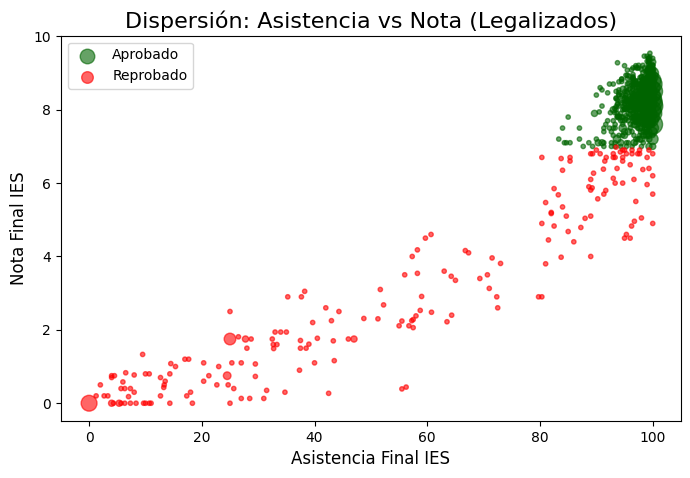

In [24]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Considerando que se cuenta con las columnas 'LEGALIZADO', 'ASISTENCIA', 'NOTA', y 'APROBADO'

def crear_grafico_dispersion(data, titulo):
    # Se crea una tabla de frecuencias
    freq_table = data.groupby(['ASISTENCIA_FINAL_IES', 'NOTA_FINAL_IES', 'APROBADO_FINAL_IES']).size().reset_index(name='COUNT')

    # Se crea el gráfico
    plt.figure(figsize=(8, 5))

    # Se dibuja puntos para APROBADO="SI"
    aprobados = freq_table[freq_table['APROBADO_FINAL_IES'] == 'SI']
    plt.scatter(aprobados['ASISTENCIA_FINAL_IES'],
                aprobados['NOTA_FINAL_IES'],
                s=aprobados['COUNT']*10,  # Ajusta el factor de escala según sea necesario
                alpha=0.6,
                color='darkgreen',
                label='Aprobado')

    # Se dibuja puntos para APROBADO="NO"
    no_aprobados = freq_table[freq_table['APROBADO_FINAL_IES'] == 'NO']
    plt.scatter(no_aprobados['ASISTENCIA_FINAL_IES'],
                no_aprobados['NOTA_FINAL_IES'],
                s=no_aprobados['COUNT']*10,  # Ajusta el factor de escala según sea necesario
                alpha=0.6,
                color='red',
                label='Reprobado')

    # Se personaliza el gráfico
    plt.title(titulo, fontsize=16)
    plt.xlabel('Asistencia Final IES', fontsize=12)
    plt.ylabel('Nota Final IES', fontsize=12)
    plt.legend(fontsize=10, loc='best')

    # Se imprime estadísticas
    print(f"\nEstadísticas para {titulo}:")
    print(f"Total de registros: {freq_table['COUNT'].sum()}")
    print(f"Asistencia promedio: {(freq_table['ASISTENCIA_FINAL_IES'] * freq_table['COUNT']).sum() / freq_table['COUNT'].sum():.2f}")
    print(f"Nota promedio: {(freq_table['NOTA_FINAL_IES'] * freq_table['COUNT']).sum() / freq_table['COUNT'].sum():.2f}")
    print(f"Porcentaje de aprobados: {freq_table[freq_table['APROBADO_FINAL_IES'] == 'SI']['COUNT'].sum() / freq_table['COUNT'].sum() * 100:.2f}%")

# Se crea gráfico para registros legalizados
data_legalizado = df_consolidado1[df_consolidado1['LEGALIZADO_IES'] == 'SI']
crear_grafico_dispersion(data_legalizado, 'Dispersión: Asistencia vs Nota (Legalizados)')

# Opcional: Se guarda los gráficos
plt.savefig('dispersion_asistencia_nota_legalizados.png', dpi=300, bbox_inches='tight')
#plt.savefig('dispersion_asistencia_nota_no_legalizados.png', dpi=300, bbox_inches='tight')
print("\nGráficos guardados como 'dispersion_asistencia_nota_legalizados.png' y 'dispersion_asistencia_nota_no_legalizados.png'")

# Estadísticas generales
total_registros = len(df_consolidado1)
registros_legalizados = len(data_legalizado)

print("\nEstadísticas Generales:")
print(f"Total de registros: {total_registros}")
print(f"Registros legalizados: {registros_legalizados} ({registros_legalizados/total_registros*100:.2f}%)")


Estadísticas para Dispersión: Asistencia vs Nota (Legalizados):
Total de registros: 1309
Asistencia promedio: 89.68
Nota promedio: 7.27
Porcentaje de aprobados: 82.35%

Gráfico guardado como 'dispersion_asistencia_nota_legalizados.png'

Estadísticas Generales:
Total de registros: 1309
Registros legalizados: 1309 (100.00%)


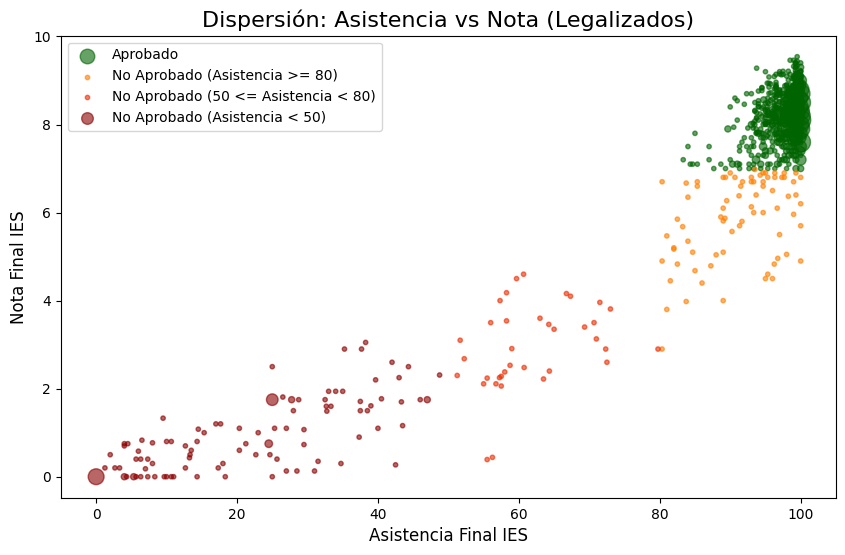

In [25]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

def crear_grafico_dispersion(data, titulo):
    # Crear una tabla de frecuencias
    freq_table = data.groupby(['ASISTENCIA_FINAL_IES', 'NOTA_FINAL_IES', 'APROBADO_FINAL_IES']).size().reset_index(name='COUNT')

    # Crear el gráfico
    plt.figure(figsize=(10, 6))

    # Dibujar puntos para APROBADO="SI"
    aprobados = freq_table[freq_table['APROBADO_FINAL_IES'] == 'SI']
    plt.scatter(aprobados['ASISTENCIA_FINAL_IES'],
                aprobados['NOTA_FINAL_IES'],
                s=aprobados['COUNT']*10,
                alpha=0.6,
                color='darkgreen',
                label='Aprobado')

    # Dibujar puntos para APROBADO="NO" con diferentes colores según la asistencia
    no_aprobados = freq_table[freq_table['APROBADO_FINAL_IES'] == 'NO']

    # Asistencia >= 80 y No Aprobado
    alta_asistencia = no_aprobados[no_aprobados['ASISTENCIA_FINAL_IES'] >= 80]
    plt.scatter(alta_asistencia['ASISTENCIA_FINAL_IES'],
                alta_asistencia['NOTA_FINAL_IES'],
                s=alta_asistencia['COUNT']*10,
                alpha=0.6,
                color='#FF8000',
                label='No Aprobado (Asistencia >= 80)')

    # 50 <= Asistencia < 80 y No Aprobado
    media_asistencia = no_aprobados[(no_aprobados['ASISTENCIA_FINAL_IES'] >= 50) & (no_aprobados['ASISTENCIA_FINAL_IES'] < 80)]
    plt.scatter(media_asistencia['ASISTENCIA_FINAL_IES'],
                media_asistencia['NOTA_FINAL_IES'],
                s=media_asistencia['COUNT']*10,
                alpha=0.6,
                color='#EC2D01',
                label='No Aprobado (50 <= Asistencia < 80)')

    # Asistencia < 50 y No Aprobado
    baja_asistencia = no_aprobados[no_aprobados['ASISTENCIA_FINAL_IES'] < 50]
    plt.scatter(baja_asistencia['ASISTENCIA_FINAL_IES'],
                baja_asistencia['NOTA_FINAL_IES'],
                s=baja_asistencia['COUNT']*10,
                alpha=0.6,
                color='darkred',
                label='No Aprobado (Asistencia < 50)')

    # Personalizar el gráfico
    plt.title(titulo, fontsize=16)
    plt.xlabel('Asistencia Final IES', fontsize=12)
    plt.ylabel('Nota Final IES', fontsize=12)
    plt.legend(fontsize=10, loc='best')

    # Imprimir estadísticas
    print(f"\nEstadísticas para {titulo}:")
    print(f"Total de registros: {freq_table['COUNT'].sum()}")
    print(f"Asistencia promedio: {(freq_table['ASISTENCIA_FINAL_IES'] * freq_table['COUNT']).sum() / freq_table['COUNT'].sum():.2f}")
    print(f"Nota promedio: {(freq_table['NOTA_FINAL_IES'] * freq_table['COUNT']).sum() / freq_table['COUNT'].sum():.2f}")
    print(f"Porcentaje de aprobados: {freq_table[freq_table['APROBADO_FINAL_IES'] == 'SI']['COUNT'].sum() / freq_table['COUNT'].sum() * 100:.2f}%")

# Crear gráfico para registros legalizados
data_legalizado = df_consolidado1[df_consolidado1['LEGALIZADO_IES'] == 'SI']
crear_grafico_dispersion(data_legalizado, 'Dispersión: Asistencia vs Nota (Legalizados)')

# Opcional: Guardar los gráficos
plt.savefig('dispersion_asistencia_nota_legalizados.png', dpi=300, bbox_inches='tight')
print("\nGráfico guardado como 'dispersion_asistencia_nota_legalizados.png'")

# Estadísticas generales
total_registros = len(df_consolidado1)
registros_legalizados = len(data_legalizado)

print("\nEstadísticas Generales:")
print(f"Total de registros: {total_registros}")
print(f"Registros legalizados: {registros_legalizados} ({registros_legalizados/total_registros*100:.2f}%)")

Se valida la existencia de 4 clustes en los datos de calificiones versus asistencia con KMeans y Cluster Aglomerativo

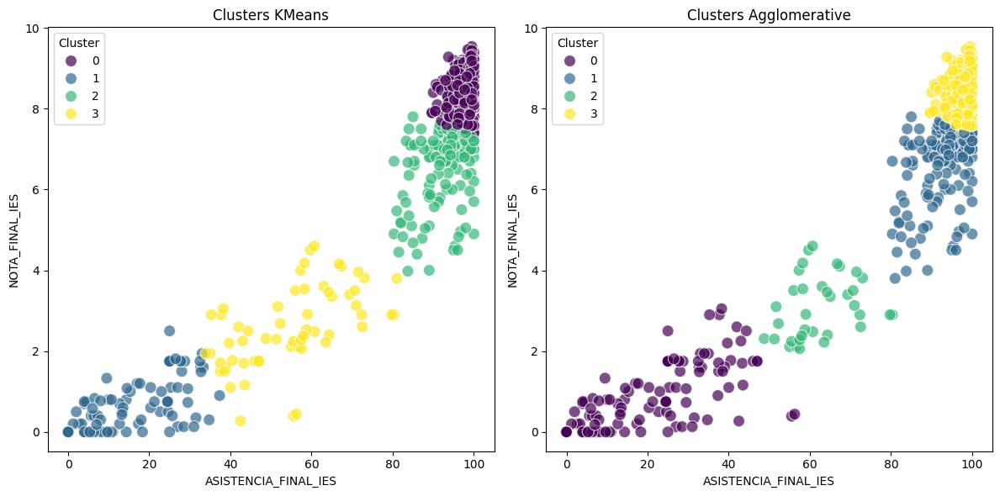

Total de registros: 1309

Estadísticas KMeans:
CATEGORIA_KMEANS
0    991
2    161
1     97
3     60
Name: count, dtype: int64

Estadísticas Agglomerative Clustering:
CATEGORIA_AGGLO
3    978
1    175
0    120
2     36
Name: count, dtype: int64


In [26]:
import pandas as pd
from sklearn.cluster import KMeans, AgglomerativeClustering
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

#df_consolidado1 = pd.DataFrame(data)
df_consolidado1_clus = df_consolidado1.copy()

# Seleccionar las características relevantes para la clusterización
Xc = df_consolidado1_clus[['ASISTENCIA_FINAL_IES', 'NOTA_FINAL_IES']]

# Escalar los datos para la clusterización
scaler = StandardScaler()
Xc_scaled = scaler.fit_transform(Xc)

# Algoritmo 1: KMeans
kmeans = KMeans(n_clusters=4, random_state=42)
clusters_kmeans = kmeans.fit_predict(Xc_scaled)

# Algoritmo 2: Agglomerative Clustering
agglo = AgglomerativeClustering(n_clusters=4)
clusters_agglo = agglo.fit_predict(Xc_scaled)

# Agregar los clusters al DataFrame original
df_consolidado1_clus['CATEGORIA_KMEANS'] = clusters_kmeans
df_consolidado1_clus['CATEGORIA_AGGLO'] = clusters_agglo

# Visualizar clusters obtenidos por KMeans y Agglomerative Clustering
plt.figure(figsize=(12, 6))

# Gráfico de KMeans
plt.subplot(1, 2, 1)
sns.scatterplot(data=df_consolidado1_clus, x='ASISTENCIA_FINAL_IES', y='NOTA_FINAL_IES', hue='CATEGORIA_KMEANS', palette='viridis', s=100, alpha=0.7)
plt.title('Clusters KMeans')
plt.legend(title='Cluster')

# Gráfico de Agglomerative Clustering
plt.subplot(1, 2, 2)
sns.scatterplot(data=df_consolidado1_clus, x='ASISTENCIA_FINAL_IES', y='NOTA_FINAL_IES', hue='CATEGORIA_AGGLO', palette='viridis', s=100, alpha=0.7)
plt.title('Clusters Agglomerative')
plt.legend(title='Cluster')

plt.tight_layout()
plt.show()

# Mostrar estadísticas generales de los clusters formados por ambos algoritmos
total_registros = len(df_consolidado1_clus)
registros_kmeans = df_consolidado1_clus['CATEGORIA_KMEANS'].value_counts()
registros_agglo = df_consolidado1_clus['CATEGORIA_AGGLO'].value_counts()

print(f"Total de registros: {total_registros}")
print("\nEstadísticas KMeans:")
print(registros_kmeans)

print("\nEstadísticas Agglomerative Clustering:")
print(registros_agglo)

array([[<Axes: title={'center': 'ID_ALUMNO'}>,
        <Axes: title={'center': 'PORCENTAJE_DISCAPACIDAD'}>,
        <Axes: title={'center': 'VALOR_MATRÍCULA_IES'}>],
       [<Axes: title={'center': 'NOTA_FINAL_IES'}>,
        <Axes: title={'center': 'ASISTENCIA_FINAL_IES'}>,
        <Axes: title={'center': 'EDAD'}>],
       [<Axes: title={'center': 'NOTA_PROCE_GOB'}>, <Axes: >, <Axes: >]],
      dtype=object)

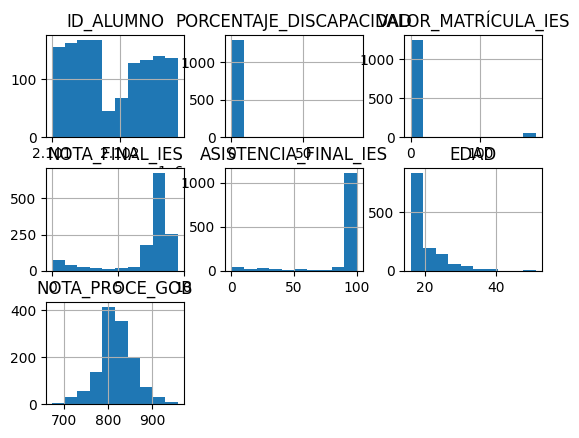

In [27]:
df_consolidado1.hist()

<ipython-input-28-6230d38b2e92>:41: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  ax.annotate(f"{conteo.index[i]}\n{conteo[i]} ({porcentajes[i]:.1f}%)",


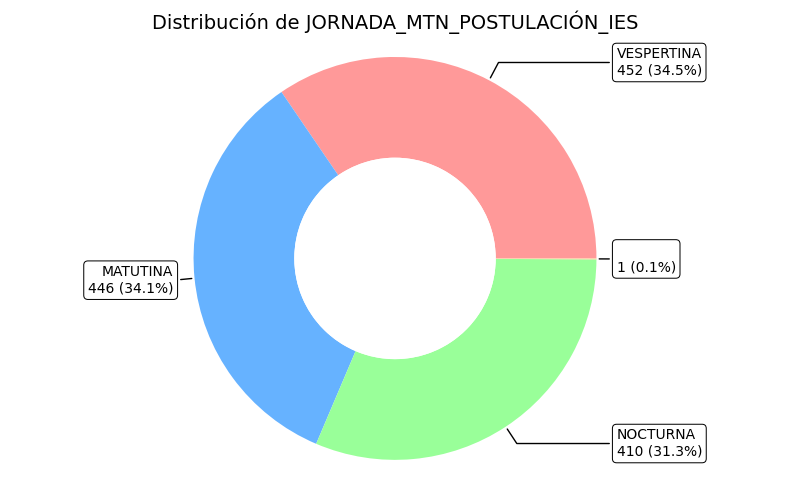

In [28]:
import pandas as pd
import matplotlib.pyplot as plt

# Suponiendo que ya tienes df_consolidado1 cargado

# Contar las ocurrencias de cada clase
conteo = df_consolidado1['JORNADA_MTN_POSTULACIÓN_IES'].value_counts()

# Calcular los porcentajes
porcentajes = conteo / len(df_consolidado1) * 100

# Crear la figura y los ejes
fig, ax = plt.subplots(figsize=(8, 5))

# Colores para cada clase
colores = ['#FF9999', '#66B2FF', '#99FF99', '#FFCC99']

# Crear el gráfico de pastel
wedges, texts, autotexts = ax.pie(conteo,
                                  colors=colores,
                                  autopct='',
                                  pctdistance=0.55,
                                  wedgeprops=dict(width=0.5))

# Añadir un círculo en el centro para crear un efecto de donut
centre_circle = plt.Circle((0,0), 0.50, fc='white')
fig.gca().add_artist(centre_circle)

# Configurar las etiquetas externas
bbox_props = dict(boxstyle="round,pad=0.3", fc="w", ec="k", lw=0.72)
kw = dict(arrowprops=dict(arrowstyle="-"),
          bbox=bbox_props, zorder=0, va="center")

for i, p in enumerate(wedges):
    ang = (p.theta2 - p.theta1) / 2. + p.theta1
    y = np.sin(np.deg2rad(ang))
    x = np.cos(np.deg2rad(ang))
    horizontalalignment = {-1: "right", 1: "left"}[int(np.sign(x))]
    connectionstyle = f"angle,angleA=0,angleB={ang}"
    kw["arrowprops"].update({"connectionstyle": connectionstyle})
    ax.annotate(f"{conteo.index[i]}\n{conteo[i]} ({porcentajes[i]:.1f}%)",
                xy=(x, y), xytext=(1.1*np.sign(x), 1.1*y),
                horizontalalignment=horizontalalignment, **kw)

# Ajustar el diseño y mostrar el gráfico
plt.title('Distribución de JORNADA_MTN_POSTULACIÓN_IES', fontsize=14)
plt.axis('equal')
plt.tight_layout()
plt.show()

In [29]:
df_consolidado1.columns

Index(['ID_ALUMNO', 'SEXO', 'ETNIA', 'DISCAPACIDAD', 'PORCENTAJE_DISCAPACIDAD',
       'JORNADA_COLEGIO', 'ZONA_COLEGIO', 'PROVINCIA_COLEGIO',
       'CANTÓN_COLEGIO', 'PARROQUIA_COLEGIO', 'TIPO_EDUCACIÓN_COLEGIO',
       'NIVEL_EDUCACIÓN_COLEGIO', 'SOSTENIMIENTO_COLEGIO', 'ÁREA_COLEGIO',
       'RÉGIMEN_ESCOLAR_COLEGIO', 'JURISDICCIÓN_COLEGIO', 'MODALIDAD_COLEGIO',
       'PARTICIPACIÓN_DOCENTE_COLEGIO', 'CARRERA_POSTULACIÓN_IES',
       'JORNADA_MTN_POSTULACIÓN_IES', 'REPETIDOR_IES', 'AULA_NIVELACIÓN_IES',
       'LEGALIZADO_IES', 'MATRÍCULA_IES', 'GRATUIDAD_IES',
       'VALOR_MATRÍCULA_IES', 'ESTADO_ALUMNO_IES', 'APROBADO_FINAL_IES',
       'NOTA_FINAL_IES', 'ASISTENCIA_FINAL_IES', 'OBSERVACIÓN_CURSO_IES',
       'EXONERACIÓN_IES', 'EDAD', 'PROVINCIA_RESIDENCIA', 'CANTÓN_RESIDENCIA',
       'ESTADO_CIVIL', 'FACULTAD_IES', 'NOTA_PROCE_GOB', 'PERÍODO_APLICO_IES',
       'TIPO_COLEGIO_GRADUADO', 'PROMEDIO_GRADUACIÓN', 'TIPO_BACHILLERATO',
       'AÑO_GRADUACIÓN', 'POSEE_TÍTULO_IES', '

Histogramas de variables numéricas:


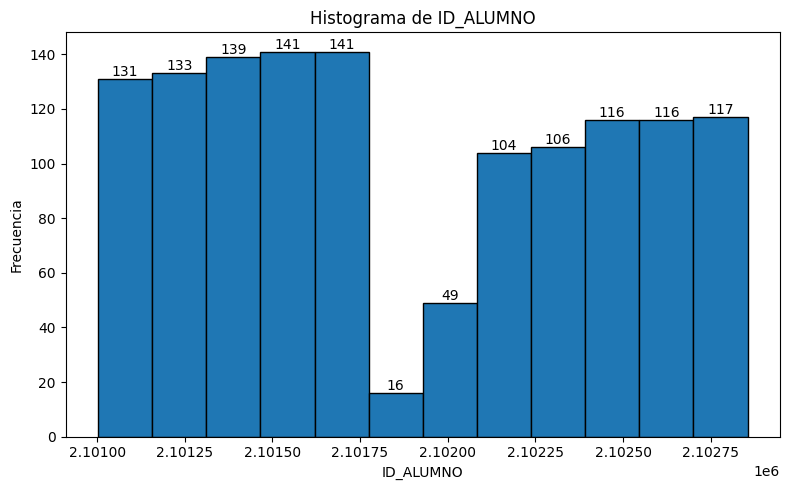

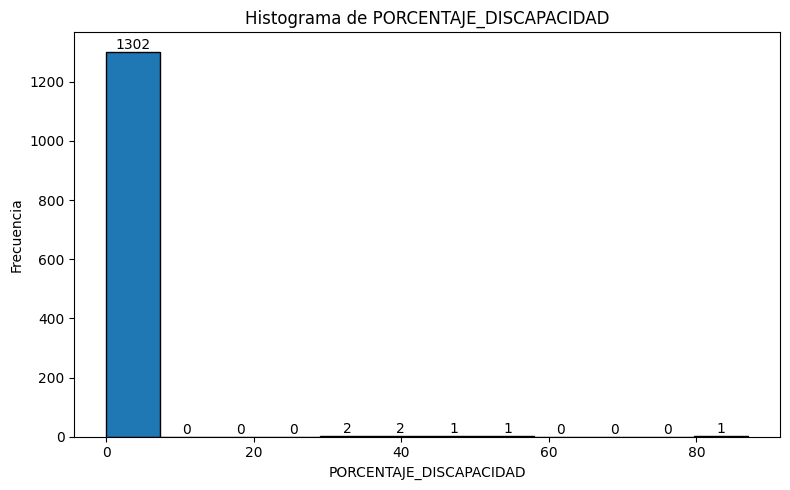

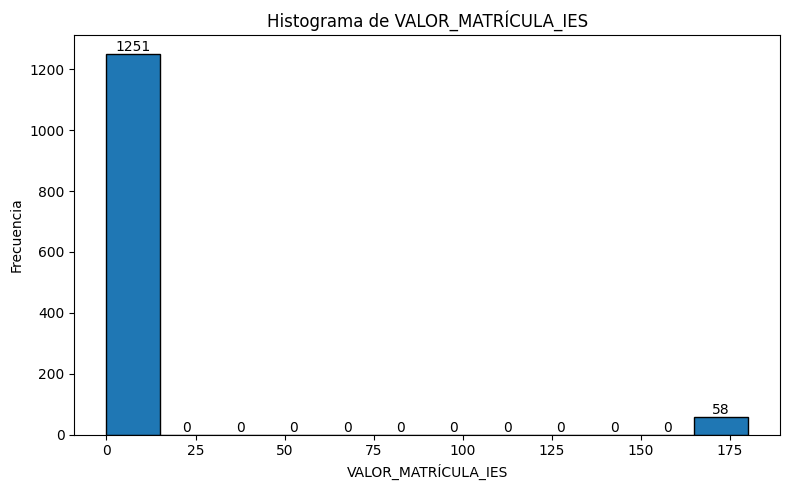

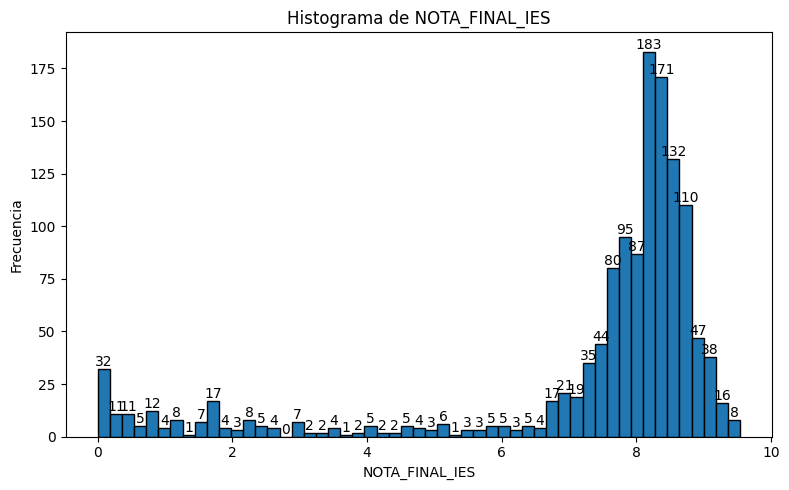

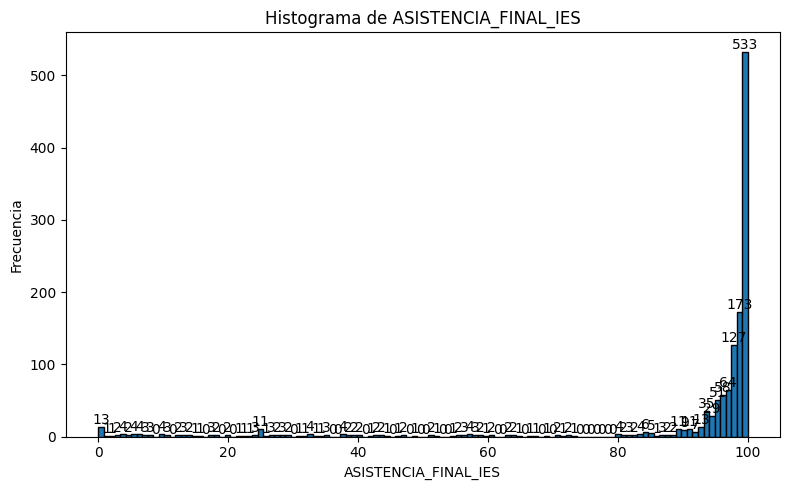

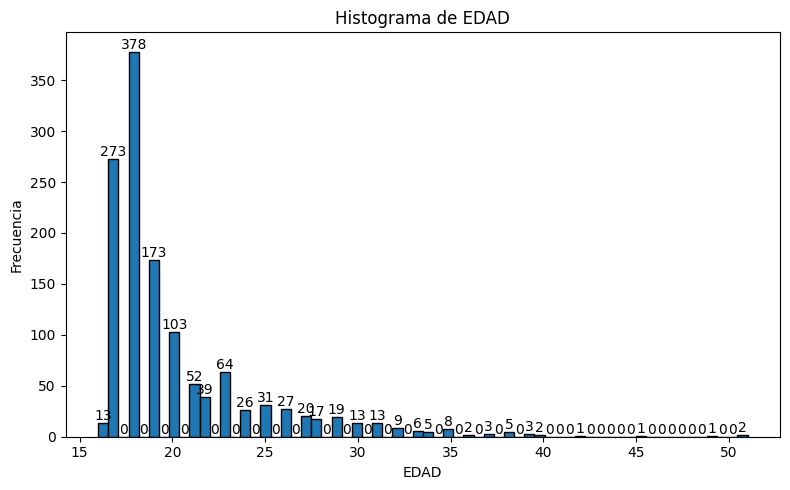

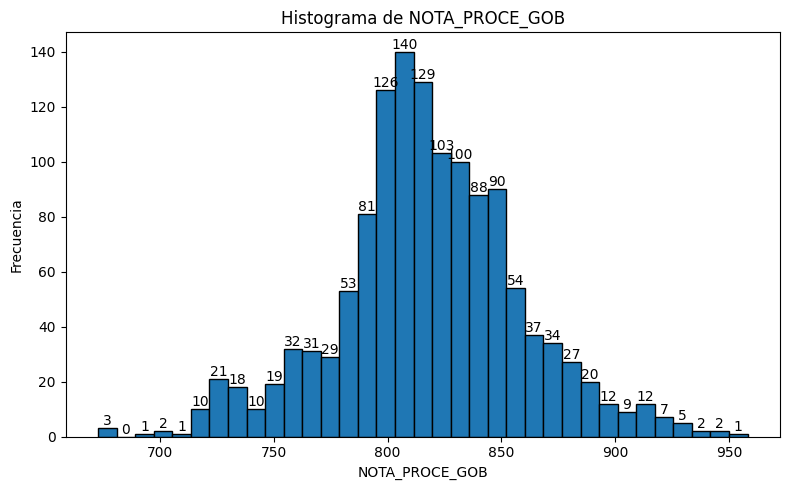


Diagramas de barras de variables categóricas:


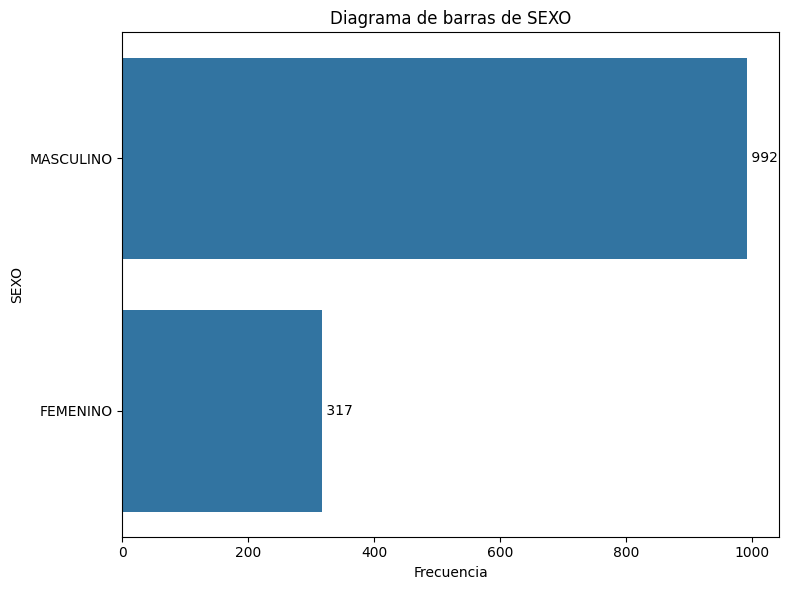

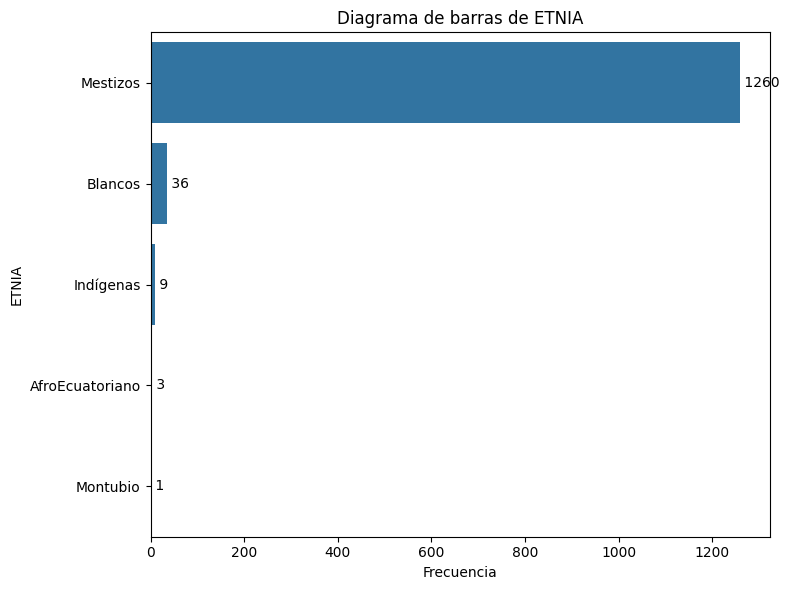

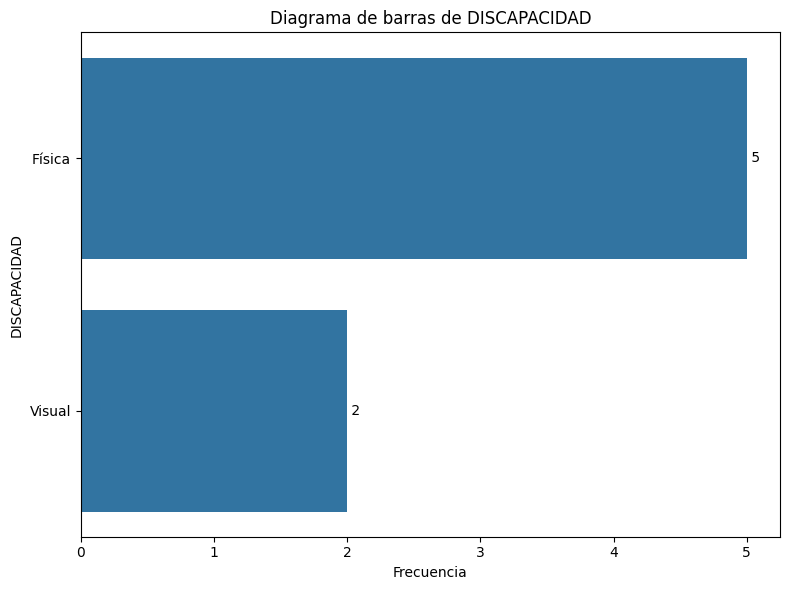

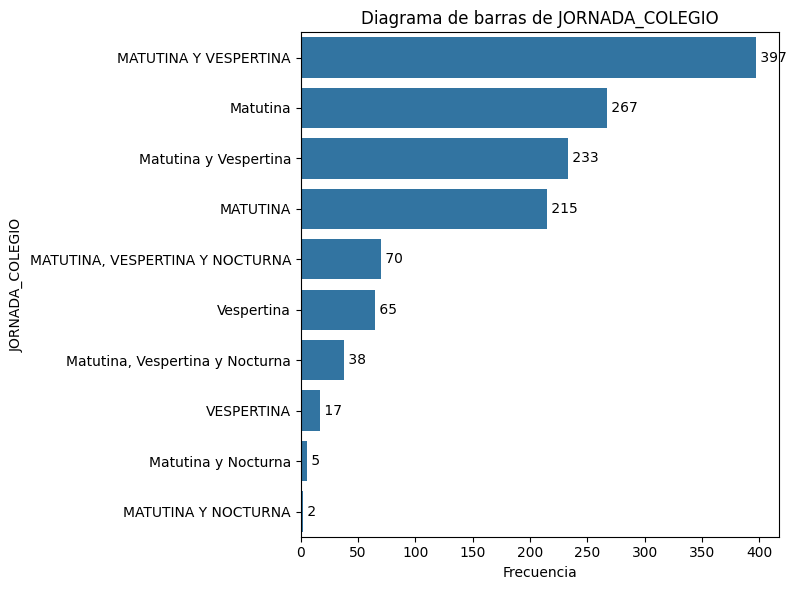

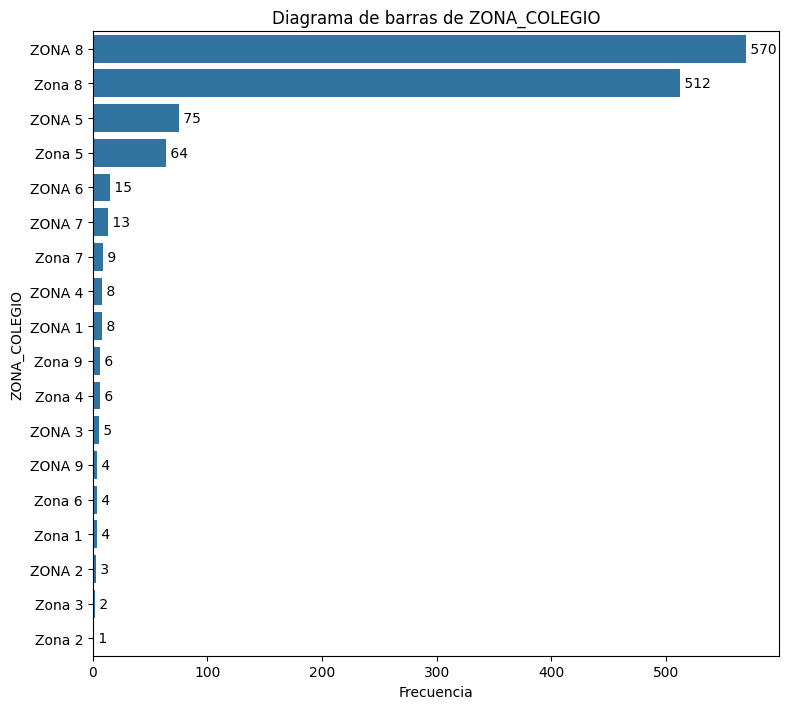

...

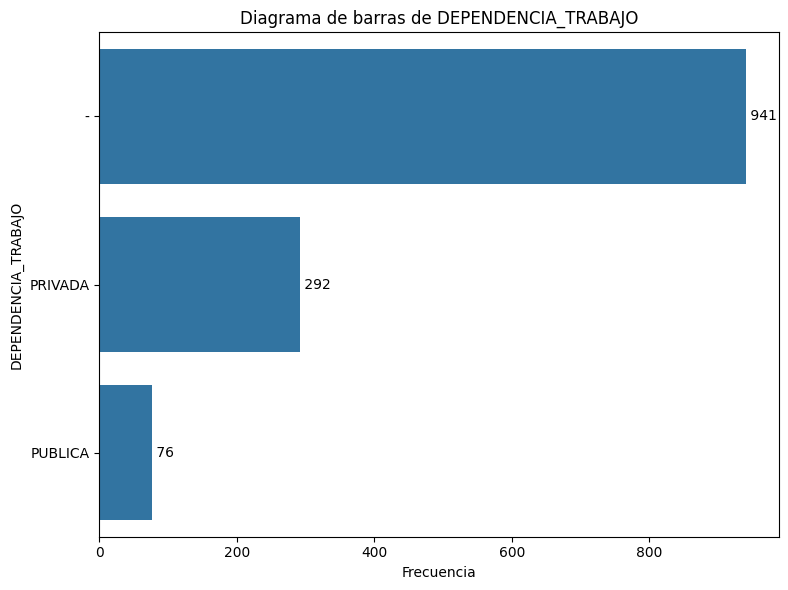

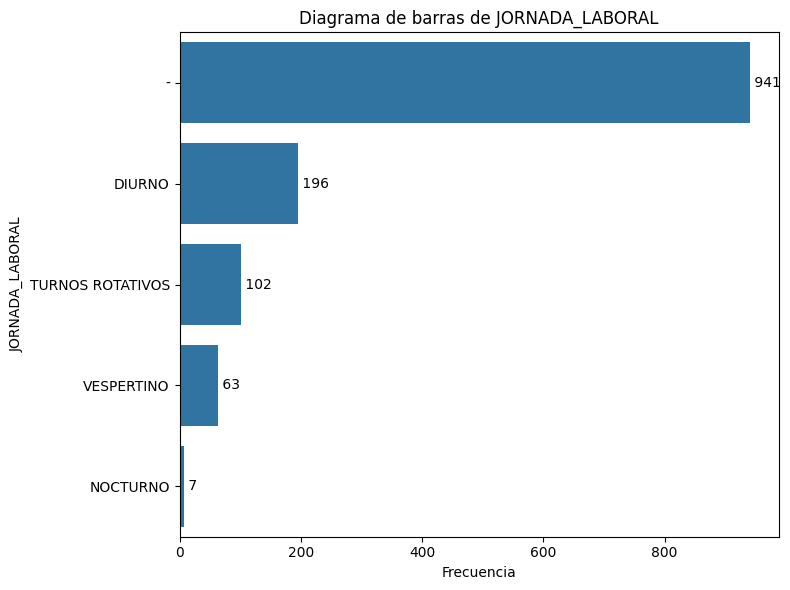

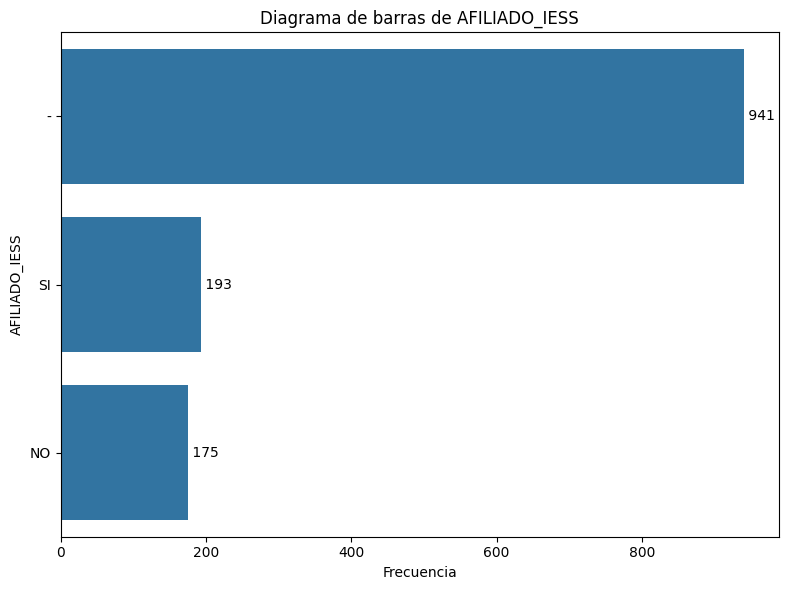

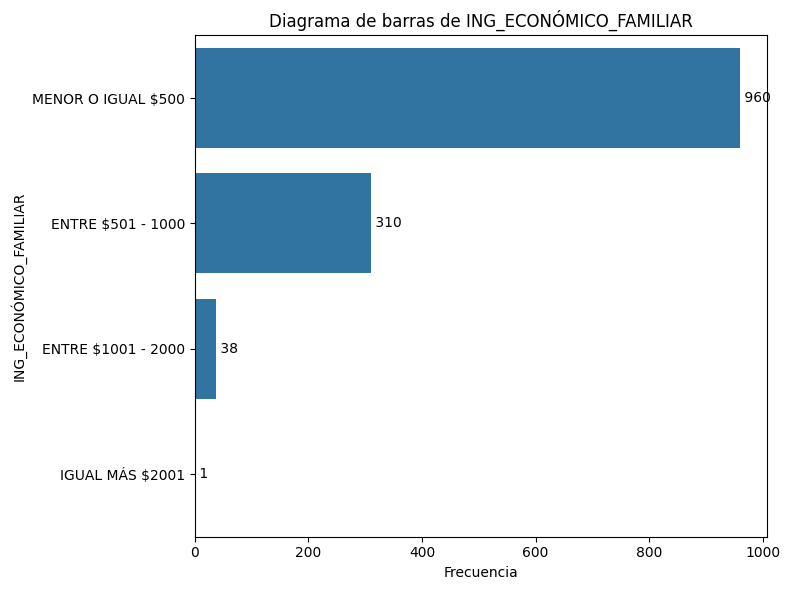

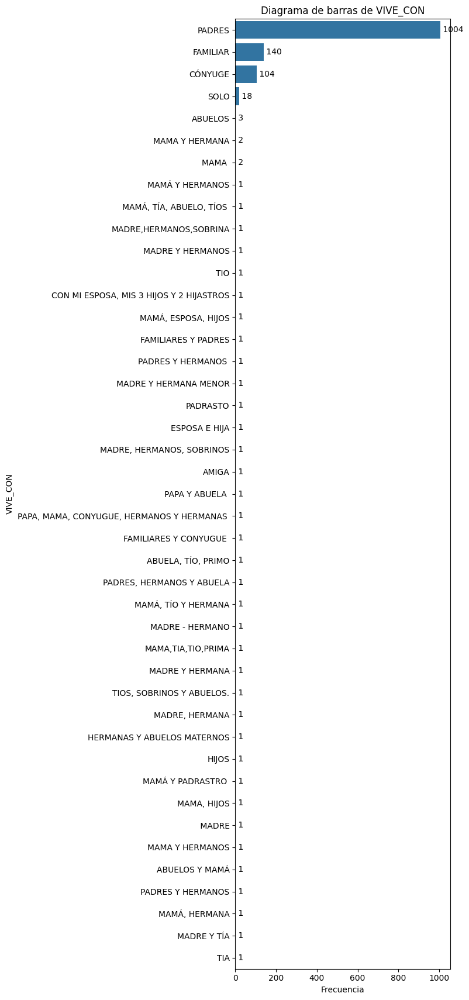

<ipython-input-30-fecedd0b4c11>:43: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


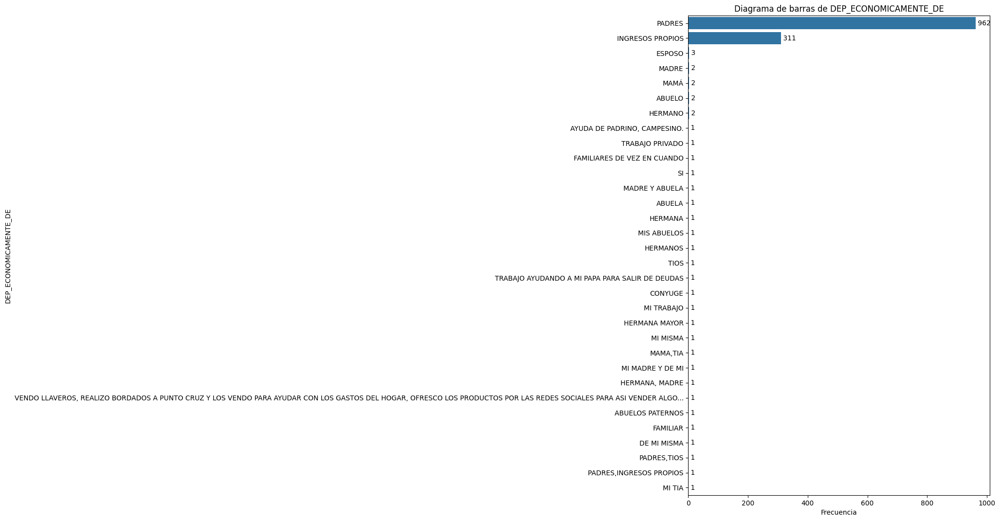

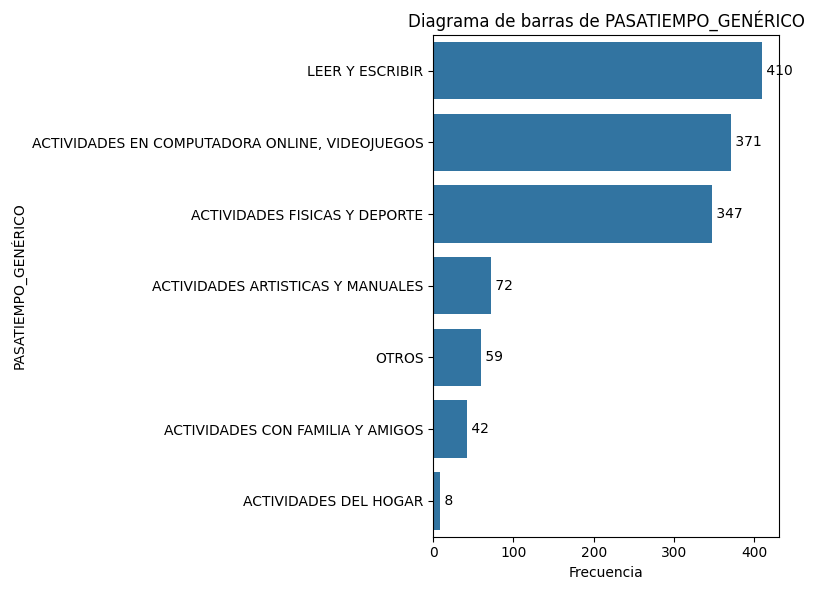

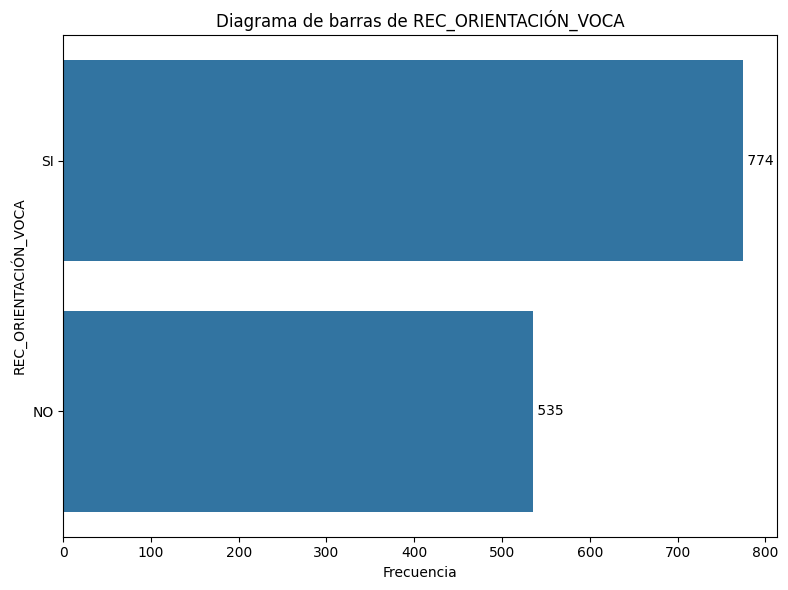

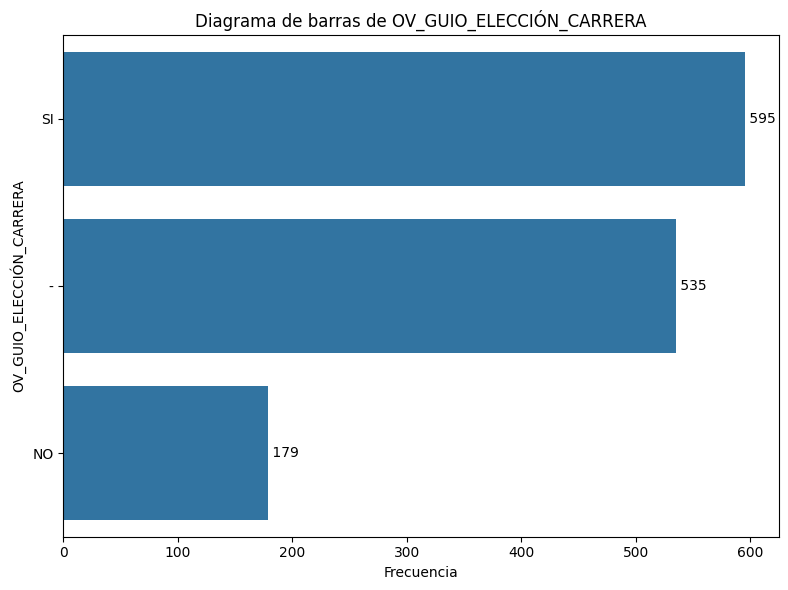

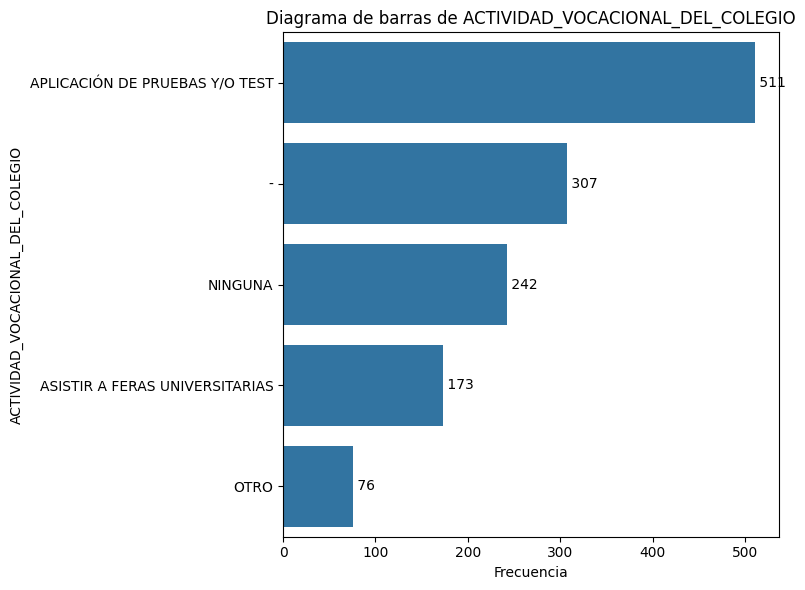

...

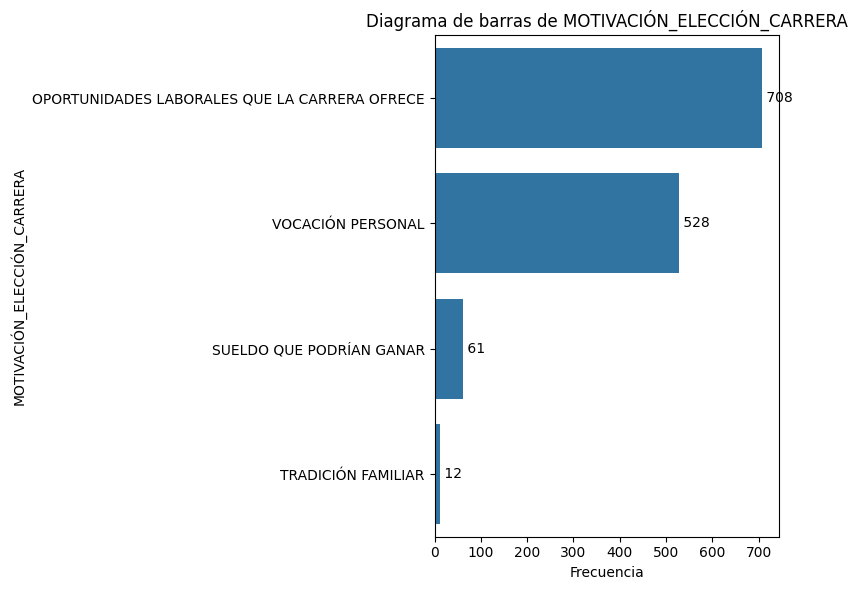

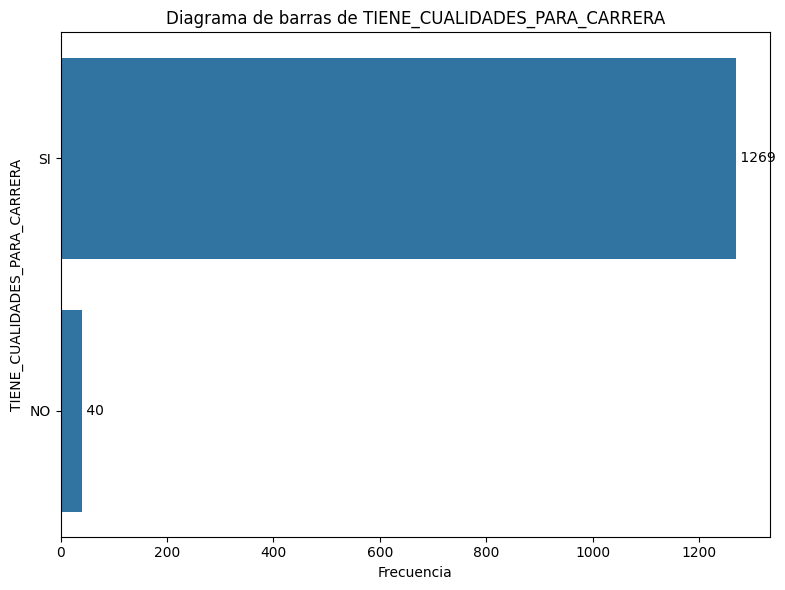

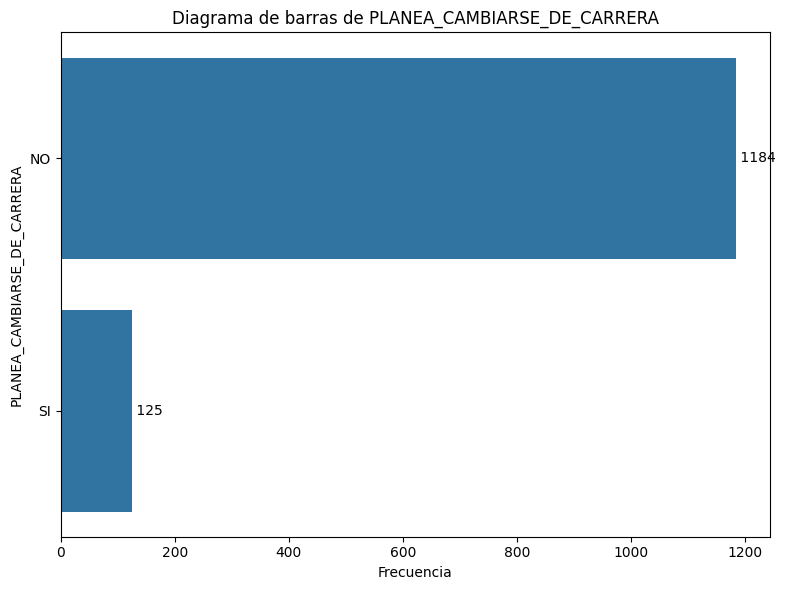

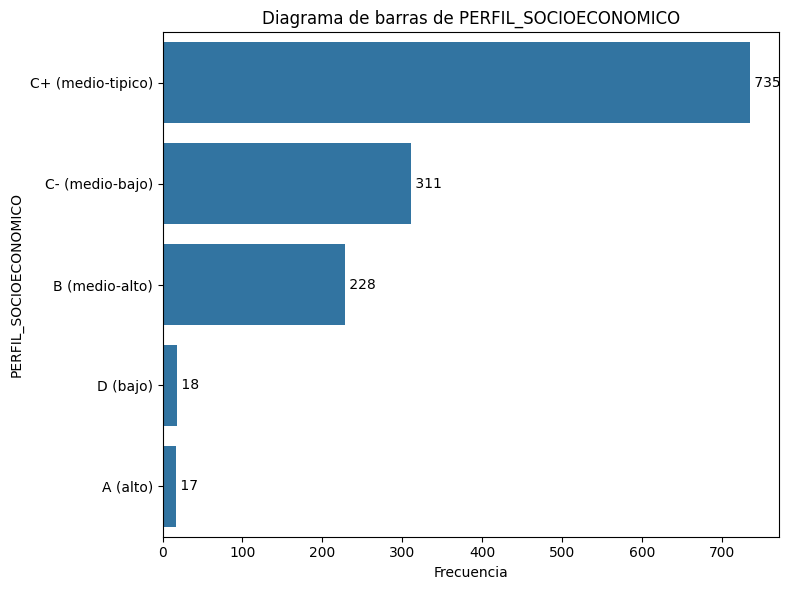

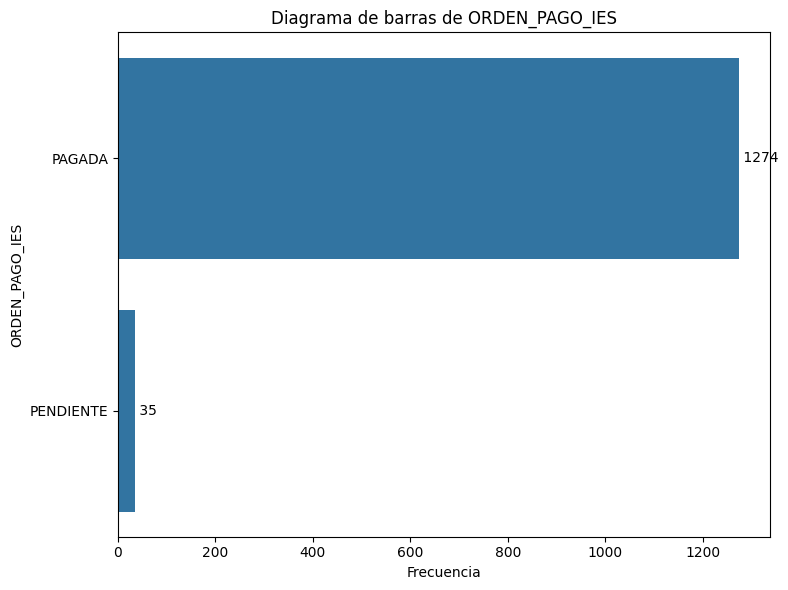


Estadísticas básicas de variables numéricas:
          ID_ALUMNO  PORCENTAJE_DISCAPACIDAD  VALOR_MATRÍCULA_IES  \
count  1.309000e+03              1309.000000          1309.000000   
mean   2.101887e+06                 0.256684             7.975554   
std    5.684183e+02                 3.739384            37.054543   
min    2.101003e+06                 0.000000             0.000000   
25%    2.101385e+06                 0.000000             0.000000   
50%    2.101742e+06                 0.000000             0.000000   
75%    2.102414e+06                 0.000000             0.000000   
max    2.102855e+06                87.000000           180.000000   

       NOTA_FINAL_IES  ASISTENCIA_FINAL_IES         EDAD  NOTA_PROCE_GOB  
count     1309.000000           1309.000000  1309.000000     1309.000000  
mean         7.269763             89.676944    20.341482      817.789916  
std          2.327938             23.459013     4.582606       40.724434  
min          0.000000           

In [30]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Se separa las variables numéricas y categóricas
numeric_cols = df_consolidado1.select_dtypes(include=['int64', 'float64']).columns
categorical_cols = df_consolidado1.select_dtypes(include=['object', 'category']).columns

# Función para crear histogramas
def plot_histograms(df, columns):
    for col in columns:
        plt.figure(figsize=(8, 5))
        counts, bins, patches = plt.hist(df[col], bins='auto', edgecolor='black')

        # Añadir etiquetas con el conteo en la cúspide de cada barra
        for count, patch in zip(counts, patches):
            height = patch.get_height()
            plt.text(patch.get_x() + patch.get_width()/2., height,
                     f'{int(count)}',
                     ha='center', va='bottom')

        plt.title(f'Histograma de {col}')
        plt.xlabel(col)
        plt.ylabel('Frecuencia')
        plt.tight_layout()
        plt.show()

# Función para crear diagramas de barras
def plot_bar_charts(df, columns):
    for col in columns:
        value_counts = df[col].value_counts()
        plt.figure(figsize=(8, max(6, len(value_counts)*0.4)))
        ax = sns.barplot(y=value_counts.index, x=value_counts.values, orient='h')
        plt.title(f'Diagrama de barras de {col}')
        plt.xlabel('Frecuencia')
        plt.ylabel(col)

        # Añadir etiquetas de valor en las barras
        for i, v in enumerate(value_counts.values):
            ax.text(v, i, f' {v}', va='center')

        plt.tight_layout()
        plt.show()

# Se crea histogramas para variables numéricas
print("Histogramas de variables numéricas:")
plot_histograms(df_consolidado1, numeric_cols)

# Se crea diagramas de barras para variables categóricas
print("\nDiagramas de barras de variables categóricas:")
plot_bar_charts(df_consolidado1, categorical_cols)

# Se imprime estadísticas básicas para variables numéricas
print("\nEstadísticas básicas de variables numéricas:")
print(df_consolidado1[numeric_cols].describe())

# Se imprime frecuencias para variables categóricas
print("\nFrecuencias de variables categóricas:")
for col in categorical_cols:
    print(f"\n{col}:")
    print(df_consolidado1[col].value_counts())
    print(f"Clases menos frecuentes en {col}:")
    print(df_consolidado1[col].value_counts().nsmallest(5))

In [31]:
def plot_bar_charts(df, columns):
    for col in columns:
        value_counts = df[col].value_counts()
        n_classes = len(value_counts)

        if n_classes > 10:
            # Tomar las 9 clases más frecuentes y agrupar el resto
            top_9 = value_counts.nlargest(9)
            others = pd.Series({'Otras': value_counts.nsmallest(n_classes - 9).sum()})
            plot_data = pd.concat([top_9, others])
        else:
            plot_data = value_counts

        plt.figure(figsize=(12, 6))
        ax = sns.barplot(x=plot_data.index, y=plot_data.values)
        plt.title(f'Diagrama de barras de {col}')
        plt.xlabel(col)
        plt.ylabel('Frecuencia')
        plt.xticks(rotation=90)

        # Añadir etiquetas de valor sobre las barras
        for i, v in enumerate(plot_data.values):
            ax.text(i, v, str(v), ha='center', va='bottom')

        plt.tight_layout()
        plt.show()

        print(f"Número de clases distintas en {col}: {n_classes}")

#**4. Fase de Limpieza, Estandarización, Normalización, Imputación**

In [32]:
import numpy as np

# Se reemplaza NaN por "NINGUNA" en la columna 'DISCAPACIDAD'
df_consolidado1['DISCAPACIDAD'] = df_consolidado1['DISCAPACIDAD'].replace({np.nan: "NINGUNA"})


In [33]:
df_Inf_Encuesta_depurado['TIPO_BACHILLERATO'].unique()

array(['BACHILLERATO TÉCNICO', 'BACHILLERATO GENERAL UNIFICADO', 'OTROS',
       'BACHILLERATO INTERNACIONAL', 'MIXTOS', 'CIENCIAS',
       'ESPECIALIZACION SOCIALES', 'CIENCIA', 'BACHILLER EN CIENCIAS',
       'ESPECIALIZACION : INFORMATICA', 'CON ESPEALIZACION',
       'FISICO MATEMATICO', 'ESPECIALIZACION', 'CON ESPECIALIZACION',
       'CON ESPECIALIDAD', 'COMERCIO', 'FISICO MATEMÁTICO',
       'ESPECIALIDAD', 'BACHILLERATO EN CIENCIAS',
       'BACHILLERATO DE ESPECIALIZACIÓN', 'QUIBIO', 'FIMA',
       'ESPECIALIZACIÓN', 'CON ESPECIALIZACION EN INFORMATICA',
       'FIMA- QUIBIO', 'QUIMICO BIOLOGICO', 'QUIMICO - BIOLOGO',
       'CON ESPECIALIZACIÓN', 'BGU CIENCIAS',
       'DE ESPECIALIZACION FISICO MATEMATICO', 'ESPECIALIZADO',
       'INFORMATICA', 'COMERCIO Y ADMINISTRACIÒN',
       'BACHILLER EN CONTABILIDAD', 'BACHILLERATO CON ESPECIALIZACION',
       'SOCIALES', 'FISICO NATEMATICO'], dtype=object)

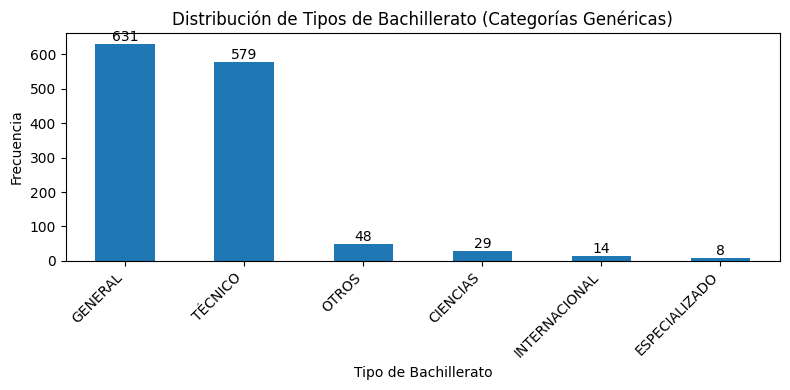


Porcentajes de cada categoría genérica:
TIPO_BACHILLERATO
GENERAL          48.204736
TÉCNICO          44.232238
OTROS             3.666921
CIENCIAS          2.215432
INTERNACIONAL     1.069519
ESPECIALIZADO     0.611154
Name: count, dtype: float64


In [34]:
import pandas as pd
import matplotlib.pyplot as plt

# Diccionario de mapeo de clases específicas a genéricas

mapeo_clases = {
    'BACHILLERATO GENERAL UNIFICADO': 'GENERAL',
    'BACHILLERATO TÉCNICO': 'TÉCNICO',
    'OTROS': 'OTROS',
    'CIENCIAS': 'CIENCIAS',
    'BACHILLERATO INTERNACIONAL': 'INTERNACIONAL',
    'FISICO MATEMATICO': 'CIENCIAS',
    'BACHILLER EN CIENCIAS': 'CIENCIAS',
    'BACHILLERATO EN CIENCIAS': 'CIENCIAS',
    'CON ESPECIALIZACIÓN': 'ESPECIALIZADO',
    'ESPECIALIZACION': 'ESPECIALIZADO',
    'DE ESPECIALIZACION FISICO MATEMATICO': 'CIENCIAS',
    'FIMA': 'CIENCIAS',
    'CON ESPEALIZACION': 'ESPECIALIZADO',
    'MIXTOS': 'OTROS',
    'ESPECIALIDAD': 'ESPECIALIZADO',
    'CON ESPECIALIZACION EN INFORMATICA': 'TÉCNICO',
    'BACHILLER EN CONTABILIDAD': 'TÉCNICO',
    'QUIMICO - BIOLOGO': 'CIENCIAS',
    'COMERCIO Y ADMINISTRACIÒN': 'TÉCNICO',
    'CON ESPECIALIZACION': 'ESPECIALIZADO',
    'CON ESPECIALIDAD': 'ESPECIALIZADO',
    'BACHILLERATO CON ESPECIALIZACION': 'ESPECIALIZADO',
    'INFORMATICA': 'TÉCNICO',
    'ESPECIALIZACIÓN': 'ESPECIALIZADO',
    'CIENCIA': 'CIENCIAS',
    'COMERCIO': 'TÉCNICO',
    'ESPECIALIZACION : INFORMATICA': 'TÉCNICO',
    'QUIBIO': 'CIENCIAS',
    'QUIMICO BIOLOGICO': 'CIENCIAS',
    'FIMA- QUIBIO': 'CIENCIAS',
    'FISICO NATEMATICO': 'CIENCIAS',
    'BGU CIENCIAS': 'CIENCIAS',
    'ESPECIALIZACION SOCIALES': 'CIENCIAS',
    'SOCIALES': 'CIENCIAS'
}

# Se reemplaza los valores específicos por los genéricos
df_consolidado1['TIPO_BACHILLERATO'] = df_consolidado1['TIPO_BACHILLERATO'].map(mapeo_clases).fillna('OTROS')

# Se cuenta la frecuencia de cada categoría genérica
conteo_generico = df_consolidado1['TIPO_BACHILLERATO'].value_counts()

# Se crea el gráfico de barras
plt.figure(figsize=(8, 4))
conteo_generico.plot(kind='bar')
plt.title('Distribución de Tipos de Bachillerato (Categorías Genéricas)')
plt.xlabel('Tipo de Bachillerato')
plt.ylabel('Frecuencia')
plt.xticks(rotation=45, ha='right')

# Se añade etiquetas de valor en las barras
for i, v in enumerate(conteo_generico):
    plt.text(i, v, str(v), ha='center', va='bottom')

plt.tight_layout()
plt.show()

# Se imprime los porcentajes
print("\nPorcentajes de cada categoría genérica:")
print(conteo_generico / len(df_consolidado1) * 100)

In [35]:
import pandas as pd

# Sec identifica columnas categóricas
categorical_columns = df_consolidado1.select_dtypes(include=['object']).columns

# Función para limpiar y convertir a mayúsculas
def clean_and_uppercase(text):
    if pd.notna(text):  # Verificar si el valor no es nulo
        return str(text).strip().upper()
    return text

# Se crea el DataFrame estandarizado
df_consolidado2 = df_consolidado1.copy()

# Se aplica la función a todas las columnas categóricas en el DataFrame estandarizado
for col in categorical_columns:
    df_consolidado2[col] = df_consolidado2[col].apply(clean_and_uppercase)

# Se crea una tabla comparativa
comparison_table = []

for col in categorical_columns:
    classes_before = set(df_consolidado1[col].astype(str).unique())
    classes_after = set(df_consolidado2[col].astype(str).unique())

    comparison_table.append({
        'Variable': col,
        'Clases_Antes_St': ', '.join(sorted(classes_before)),
        'Clases_Despues_St': ', '.join(sorted(classes_after))
    })

# Se convierte la tabla comparativa a un DataFrame
comparison_df = pd.DataFrame(comparison_table)

# Se muestra la tabla comparativa
print(comparison_df.to_string(index=False))

# Se guarda la tabla comparativa en un archivo CSV
comparison_df.to_csv('comparacion_estandarizacion.csv', index=False)
print("\nLa tabla comparativa se ha guardado en 'comparacion_estandarizacion.csv'")

                             Variable                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                   

In [36]:
comparison_df

,Variable,Clases_Antes_St,Clases_Despues_St
0,SEXO,"FEMENINO, MASCULINO","FEMENINO, MASCULINO"
1,ETNIA,"AfroEcuatoriano, Blancos, Indígenas, Mestizos,...","AFROECUATORIANO, BLANCOS, INDÍGENAS, MESTIZOS,..."
2,DISCAPACIDAD,"Física, NINGUNA, Visual","FÍSICA, NINGUNA, VISUAL"
3,JORNADA_COLEGIO,"MATUTINA, MATUTINA Y NOCTURNA, MATUTINA Y VESP...","MATUTINA, MATUTINA Y NOCTURNA, MATUTINA Y VESP..."
4,ZONA_COLEGIO,"ZONA 1, ZONA 2, ZONA 3, ZONA 4, ZONA 5, ZONA 6...","ZONA 1, ZONA 2, ZONA 3, ZONA 4, ZONA 5, ZONA 6..."
...,...,...,...
57,MOTIVACIÓN_ELECCIÓN_CARRERA,"OPORTUNIDADES LABORALES QUE LA CARRERA OFRECE,...","OPORTUNIDADES LABORALES QUE LA CARRERA OFRECE,..."
58,TIENE_CUALIDADES_PARA_CARRERA,"NO, SI","NO, SI"
59,PLANEA_CAMBIARSE_DE_CARRERA,"NO, SI","NO, SI"
60,PERFIL_SOCIOECONOMICO,"A (alto), B (medio-alto), C+ (medio-tipico), C...","A (ALTO), B (MEDIO-ALTO), C+ (MEDIO-TIPICO), C..."


In [37]:
import pandas as pd

# Uso value_counts() para contar las ocurrencias de cada clase
conteo_clases = df_consolidado2['JORNADA_COLEGIO'].value_counts(dropna=False)

# Se muestra cada nombre de clase y su acumulador
for clase, conteo in conteo_clases.items():
    if pd.isna(clase):
        print(f'NaN: {conteo}')
    else:
        print(f'{clase}: {conteo}')

MATUTINA Y VESPERTINA: 630
MATUTINA: 482
MATUTINA, VESPERTINA Y NOCTURNA: 108
VESPERTINA: 82
MATUTINA Y NOCTURNA: 7


In [38]:
# Se calcula la moda de la columna JORNADA_COLEGIO
moda = df_consolidado2['JORNADA_COLEGIO'].mode().iloc[0]

# Se reemplaza NaN con la moda
df_consolidado2['JORNADA_COLEGIO'].fillna(moda, inplace=True)

<ipython-input-38-977034c2fe1c>:5: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df_consolidado2['JORNADA_COLEGIO'].fillna(moda, inplace=True)


In [39]:
import pandas as pd

# Uso value_counts() para contar las ocurrencias de cada clase
conteo_clases = df_consolidado2['JORNADA_COLEGIO'].value_counts(dropna=False)

# Se muetra cada nombre de clase y su acumulador
for clase, conteo in conteo_clases.items():
    if pd.isna(clase):
        print(f'NaN: {conteo}')
    else:
        print(f'{clase}: {conteo}')

MATUTINA Y VESPERTINA: 630
MATUTINA: 482
MATUTINA, VESPERTINA Y NOCTURNA: 108
VESPERTINA: 82
MATUTINA Y NOCTURNA: 7


In [40]:
#  Procedo con la agrupacion de clases en maximo 10 para variables con más de 9 categorías

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

def plot_horizontal_bar(df, column):
    # Contar las frecuencias de cada categoría
    value_counts = df[column].value_counts()

    # Si hay más de 9 categorías, se agrupa las menos frecuentes en "Otros"
    if len(value_counts) > 9:
        top_9 = value_counts.nlargest(9)
        others = pd.Series({'Otros': value_counts.nsmallest(len(value_counts) - 9).sum()})
        value_counts = pd.concat([top_9, others])

    # Se Ordena los valores de menor a mayor, manteniendo "Otros" al final
    if 'Otros' in value_counts.index:
        others_value = value_counts['Otros']
        value_counts = value_counts.sort_values(ascending=False)
        value_counts = value_counts.drop('Otros')
        value_counts['Otros'] = others_value
    else:
        value_counts = value_counts.sort_values(ascending=False)

    # Se crea el gráfico
    plt.figure(figsize=(8, max(6, len(value_counts)*0.4)))
    ax = sns.barplot(x=value_counts.values, y=value_counts.index, orient='h', palette='viridis')

    # Se añade las etiquetas de valor en las barras
    for i, v in enumerate(value_counts.values):
        ax.text(v, i, f' {v}', va='center')

    plt.title(f'Distribución de {column}')
    plt.xlabel('Frecuencia')
    plt.ylabel(column)
    plt.tight_layout()
    plt.show()

    # Imprimir estadísticas
    print(f"\nEstadísticas para {column}:")
    print(f"Total de categorías: {len(df[column].unique())}")
    print(f"Total de registros: {df[column].count()}")
    print("\nTop 10 categorías más frecuentes:")
    print(value_counts)


In [41]:
# df_consolidado1  - Datos Numericoa Originales y categóricos Originales
# df_consolidado2  - Datos Numericoa Estandarizado y categóricos con mayusculas

In [42]:
df_consolidado2.describe().T

,count,mean,std,min,25%,50%,75%,max
ID_ALUMNO,1309.0,2.101887e+06,568.418331,2101003.0,2101385.00,2101742.0,2102414.00,2102855.00
PORCENTAJE_DISCAPACIDAD,1309.0,2.566845e-01,3.739384,0.0,0.00,0.0,0.00,87.00
VALOR_MATRÍCULA_IES,1309.0,7.975554e+00,37.054543,0.0,0.00,0.0,0.00,180.00
NOTA_FINAL_IES,1309.0,7.269763e+00,2.327938,0.0,7.50,8.1,8.49,9.54
ASISTENCIA_FINAL_IES,1309.0,8.967694e+01,23.459013,0.0,95.33,98.5,100.00,100.00
EDAD,1309.0,2.034148e+01,4.582606,16.0,18.00,18.0,21.00,51.00
NOTA_PROCE_GOB,1309.0,8.177899e+02,40.724434,673.0,797.00,816.0,842.00,958.00


In [43]:
# Se realiza un barrido por las variables buscando datos no llenados y puestos "-"

import pandas as pd

# Se selecciona solo las columnas categóricas
categorical_columns = df_consolidado2.select_dtypes(include=['object']).columns

# Función para verificar si una columna contiene "-"
def contains_dash(column):
    return (column == '-').any()

# Se itera sobre las columnas categóricas
for column in categorical_columns:
    if contains_dash(df_consolidado2[column]):
        print(f"\nColumna: {column}")
        print("Clases:")
        print(df_consolidado2[column].value_counts(dropna=False))
        print(f"Número de valores '-': {(df_consolidado2[column] == '-').sum()}")
        print("-" * 50)

# Opcionalmente, se guarda los resultados en un archivo
with open('categorical_variables_analysis.txt', 'w') as f:
    for column in categorical_columns:
        if contains_dash(df_consolidado2[column]):
            f.write(f"\nColumna: {column}\n")
            f.write("Clases:\n")
            f.write(str(df_consolidado2[column].value_counts(dropna=False)))
            f.write(f"\nNúmero de valores '-': {(df_consolidado2[column] == '-').sum()}\n")
            f.write("-" * 50 + "\n")

print("\nLos resultados también se han guardado en 'categorical_variables_analysis.txt'")


Columna: TIPO_TÍTULO_IES_POSEE
Clases:
TIPO_TÍTULO_IES_POSEE
-                                                                     1255
CIENCIAS                                                                 8
BACHILLER                                                                3
TÉCNICO SUPERIOR EN ENFERMERÍA                                           2
TECNÓLOGO EN MECÁNICA INDUSTRIAL                                         2
TÍTULO DE BACHILLER                                                      2
TECNOLOGO MECANICA INDUSTRIAL                                            2
TECNICO SUPERIOR EN ENFERMERIA                                           2
TÉCNICO-POLIVALENTE CONTABILIDAD Y ADMINISTRACIÓN                        1
BACHILLER EN CIENCIAS                                                    1
TÉCNICO-DE SERVICIOS CONTABILIDAD                                        1
CIENCIAS GENERALES                                                       1
TECNICO                               

In [44]:
import pandas as pd

# Se crea un diccionario de mapeo basado en la tabla proporcionada
titulo_mapping = {
    '-': 'NINGUNO',
    'NaN': 'NINGUNO',
    'CIENCIAS': 'NINGUNO',
    'TECNICO SUPERIOR EN ENFERMERIA': 'TECNICO SUPERIOR EN ENFERMERIA',
    'BACHILLER': 'NINGUNO',
    'TECNOLOGO MECANICA INDUSTRIAL': 'TECNÓLOGO EN MECÁNICA INDUSTRIAL',
    'TECNÓLOGO EN MECÁNICA INDUSTRIAL': 'TECNÓLOGO EN MECÁNICA INDUSTRIAL',
    'TÉCNICO SUPERIOR EN ENFERMERÍA': 'NINGUNO',
    'TÍTULO DE BACHILLER': 'NINGUNO',
    'POSEO EL TITULO DE BACHILLER EN CIENCIAS.': 'NINGUNO',
    'COMERCIO Y CIENCIAS ADMINISTRATIVA': 'NINGUNO',
    'TECNOLOGA EN MARKETING Y PUBLICIDAD': 'TECNOLOGO EN MARKETING Y PUBLICIDAD',
    'INGENIERO EN CONTABILIDAD Y AUDITORIA': 'INGENIERO EN CONTABILIDAD Y AUDITORIA',
    'TÉCNICO- DE SERVICIOS CONTABILIDAD': 'NINGUNO',
    'TECNÓLOGO SUPERIOR EN MECÁNICA NAVAL': 'TECNÓLOGO SUPERIOR EN MECÁNICA NAVAL',
    'CIENCIAS GENERALES': 'NINGUNO',
    'TECNICO PRODUCCION MUSICAL': 'NINGUNO',
    'TÉCNICO-DE SERVICIOS CONTABILIDAD': 'NINGUNO',
    'BACHILLER EN CIENCIAS': 'NINGUNO',
    'TÉCNICO-POLIVALENTE CONTABILIDAD Y ADMINISTRACIÓN': 'NINGUNO',
    'TITULO INFORMÁTICO': 'NINGUNO',
    'TÉCNICO ARTÍSTICO': 'NINGUNO',
    'TÉCNICO - DE SERVICIOS INFORMÁTICA': 'NINGUNO',
    'CIENCIA': 'NINGUNO',
    'CONTABLE': 'NINGUNO',
    'TECNOLOGA EN MECANICA INDUSTRIAL': 'TECNÓLOGO EN MECÁNICA INDUSTRIAL',
    'TÉCNICO - INDUSTRIAL ELECTROMECÁNICA AUTOMOTRIZ': 'NINGUNO',
    'LICENCIATURA EN CIENCIAS DE LA EDUCACIÓN MENCIÓN FÍSICA MATEMÁTICAS': 'LICENCIATURA EN CIENCIAS DE LA EDUCACIÓN',
    'BACHILLER FISICO MATEMATICO': 'NINGUNO',
    'LICENCIADO EN CIENCIAS NAVALES': 'LICENCIADO EN CIENCIAS NAVALES',
    'LICENCIADO EN CIENCIAS DE LA EDUCACION MENCION SISTEMAS MULTIMEDIA': 'LICENCIATURA EN CIENCIAS DE LA EDUCACIÓN',
    'CONTABILIDAD Y ADMINISTRACION': 'CONTABILIDAD Y ADMINISTRACION',
    'INGENIERO COMERCIO EXTERIOR': 'INGENIERO COMERCIO EXTERIOR',
    'TECNICO EN SERVICIOS DE CONTABILIDAD': 'NINGUNO',
    'CONTABILIDAD Y ADMINISTRACIÓN': 'NINGUNO',
    'TECNICO - DE SERVICIO DE INFORMATICA': 'NINGUNO',
    'TITULO DE BACHILLER TECNICO- DE SERVICIOS INFORMATICA': 'NINGUNO',
    'TITULO DE BACHILLER': 'NINGUNO',
    'SI': 'NINGUNO',
    'TECNICO': 'NINGUNO',
    'BACHILLER: CIENCIAS': 'NINGUNO',
    'TECNOLOGO EN INFORMATICA MENCION EN NETWORKING': 'TECNOLOGO EN INFORMATICA MENCION EN NETWORKING',
    'BACHILLER TÉCNICO - DE SERVICIOS ADMINISTRACIÓN DE SISTEMAS': 'NINGUNO',
    'TECNOLOGA EN ANÁLISIS DE SISTEMAS': 'TECNOLOGA EN ANÁLISIS DE SISTEMAS',
    'CIENCIAS DE COMERCIO Y ADMINISTRACION': 'NINGUNO',
    'LICENCIADO EN CIECIAS DE LA EDUCACION MERCADOTECNIA Y PUBLICIDAD': 'LICENCIATURA EN CIENCIAS DE LA EDUCACIÓN',
    'TECNÓLOGO EN MECÁNICA AUTOMOTRIZ': 'TECNÓLOGO EN MECÁNICA AUTOMOTRIZ',
    'TECNOLOGO EN DESARROLLO DE SOFTWARE': 'TECNOLOGO EN DESARROLLO DE SOFTWARE'
}

# Función para estandarizar el título
def estandarizar_titulo(titulo):
    # Convertir a mayúsculas y eliminar espacios al inicio y al final
    titulo = str(titulo).upper().strip()
    # Buscar en el diccionario de mapeo
    return titulo_mapping.get(titulo, titulo)  # Si no está en el diccionario, mantener el título original

# Se invoca la función de estandarización
df_consolidado2['TIPO_TÍTULO_IES_POSEE_ESTANDARIZADO'] = df_consolidado2['TIPO_TÍTULO_IES_POSEE'].apply(estandarizar_titulo)

# Se muestra los resultados
print(df_consolidado2[['TIPO_TÍTULO_IES_POSEE', 'TIPO_TÍTULO_IES_POSEE_ESTANDARIZADO']].head(20))

# Se cuenta los valores únicos después de la estandarización
print("\nValores únicos después de la estandarización:")
print(df_consolidado2['TIPO_TÍTULO_IES_POSEE_ESTANDARIZADO'].value_counts())

# Se guarda el DataFrame actualizado
df_consolidado2.to_csv('df_consolidado_estandarizado.csv', index=False)
print("\nDataFrame actualizado guardado como 'df_consolidado_estandarizado.csv'")

   TIPO_TÍTULO_IES_POSEE TIPO_TÍTULO_IES_POSEE_ESTANDARIZADO
0                      -                             NINGUNO
1               CIENCIAS                             NINGUNO
2                      -                             NINGUNO
3                      -                             NINGUNO
4                      -                             NINGUNO
5                      -                             NINGUNO
6                      -                             NINGUNO
7                      -                             NINGUNO
8                      -                             NINGUNO
9                      -                             NINGUNO
10                     -                             NINGUNO
11                     -                             NINGUNO
12                     -                             NINGUNO
13                     -                             NINGUNO
14                     -                             NINGUNO
15                     -

In [45]:
# Se copia el contenido de TIPO_TITULO_IES_POSEE_ESTANDARIZADO a TIPO_TITULO_IES_POSEE
df_consolidado2['TIPO_TÍTULO_IES_POSEE'] = df_consolidado2['TIPO_TÍTULO_IES_POSEE_ESTANDARIZADO']

# Se borra la columna TIPO_TITULO_IES_POSEE_ESTANDARIZADO
df_consolidado2 = df_consolidado2.drop('TIPO_TÍTULO_IES_POSEE_ESTANDARIZADO', axis=1)

In [46]:
import pandas as pd
import numpy as np

# Se reemplaza NaN, 'NaN' y '-' con 'NINGUNA'
df_consolidado2['NOM_ENFERMEDAD_CRÓNICA'] = df_consolidado2['NOM_ENFERMEDAD_CRÓNICA'].replace({np.nan: 'NINGUNA', 'NaN': 'NINGUNA', '-': 'NINGUNA'})

# Para tratar string vacío o espacios para pasarlos a valor 'NINGUNA' se procede:
df_consolidado2['NOM_ENFERMEDAD_CRÓNICA'] = df_consolidado2['NOM_ENFERMEDAD_CRÓNICA'].replace({np.nan: 'NINGUNA', 'NaN': 'NINGUNA', '-': 'NINGUNA', '': 'NINGUNA'})
df_consolidado2['NOM_ENFERMEDAD_CRÓNICA'] = df_consolidado2['NOM_ENFERMEDAD_CRÓNICA'].str.strip().replace('', 'NINGUNA')

# Se verifica los cambios
print(df_consolidado2['NOM_ENFERMEDAD_CRÓNICA'].value_counts(dropna=False))


NOM_ENFERMEDAD_CRÓNICA
NINGUNA                                           1291
ASMA                                                 6
EPILEPSIA                                            2
VIH                                                  2
ALERGIA                                              2
PROLAPSO DE LA VÁLVULA NITRAL                        2
ARITMIA CARDIACA(TAQUICARDIA SUPRAVENTRICULAR)       1
AMIGDALITIS CRONICA                                  1
VITILIGO                                             1
OSTEOMILITTIS                                        1
Name: count, dtype: int64


In [47]:
import pandas as pd
import numpy as np

# Se reemplaza '-' y NaN con 'NINGUNO' en la columna DEPENCIA_TRABAJO
df_consolidado2['DEPENDENCIA_TRABAJO'] = df_consolidado2['DEPENDENCIA_TRABAJO'].replace({'-': 'NINGUNO', np.nan: 'NINGUNO'})

# Se verifica los cambios
print(df_consolidado2['DEPENDENCIA_TRABAJO'].value_counts(dropna=False))


DEPENDENCIA_TRABAJO
NINGUNO    941
PRIVADA    292
PUBLICA     76
Name: count, dtype: int64


In [48]:
import pandas as pd
import numpy as np

# Se reemplaza '-' y NaN con 'NINGUNA' en la columna JORNADA_LAB
df_consolidado2['JORNADA_LABORAL'] = df_consolidado2['JORNADA_LABORAL'].replace({'-': 'NINGUNA', np.nan: 'NINGUNA'})

# Se verifica los cambios
print(df_consolidado2['JORNADA_LABORAL'].value_counts(dropna=False))


JORNADA_LABORAL
NINGUNA             941
DIURNO              196
TURNOS ROTATIVOS    102
VESPERTINO           63
NOCTURNO              7
Name: count, dtype: int64


In [49]:
import pandas as pd
import numpy as np

# Se reemplaza '-' y NaN con 'NO' en la columna AFILIADO_IESS
df_consolidado2['AFILIADO_IESS'] = df_consolidado2['AFILIADO_IESS'].replace({'-': 'NO', np.nan: 'NO'})

# Se verifica los cambios
print(df_consolidado2['AFILIADO_IESS'].value_counts(dropna=False))

# Opcionalmente: Se guarda el DataFrame actualizado
df_consolidado2.to_csv('df_consolidado_actualizado.csv', index=False)
print("\nDataFrame actualizado guardado como 'df_consolidado_actualizado.csv'")

AFILIADO_IESS
NO    1116
SI     193
Name: count, dtype: int64

DataFrame actualizado guardado como 'df_consolidado_actualizado.csv'


In [50]:
import pandas as pd
import numpy as np

# Se reemplaza '-' y NaN con 'NO' en la columna OV_GUIO_ELEC_CARR
df_consolidado2['OV_GUIO_ELECCIÓN_CARRERA'] = df_consolidado2['OV_GUIO_ELECCIÓN_CARRERA'].replace({'-': 'NO', np.nan: 'NO'})

# Se verifica los cambios
print(df_consolidado2['OV_GUIO_ELECCIÓN_CARRERA'].value_counts(dropna=False))

OV_GUIO_ELECCIÓN_CARRERA
NO    714
SI    595
Name: count, dtype: int64


In [51]:
import pandas as pd
import numpy as np

# Se reemplaza '-' y NaN con 'NINGUNA' en la columna ACT_VOCACIONAL_DEL_COLEGIO
df_consolidado2['ACTIVIDAD_VOCACIONAL_DEL_COLEGIO'] = df_consolidado2['ACTIVIDAD_VOCACIONAL_DEL_COLEGIO'].replace({'-': 'NINGUNA', np.nan: 'NINGUNA'})

# Se verifica los cambios
print(df_consolidado2['ACTIVIDAD_VOCACIONAL_DEL_COLEGIO'].value_counts(dropna=False))

# Opcionalmente: Se guarda el DataFrame actualizado
df_consolidado2.to_csv('df_consolidado_actualizado.csv', index=False)
print("\nDataFrame actualizado guardado como 'df_consolidado_actualizado.csv'")

ACTIVIDAD_VOCACIONAL_DEL_COLEGIO
NINGUNA                           549
APLICACIÓN DE PRUEBAS Y/O TEST    511
ASISTIR A FERAS UNIVERSITARIAS    173
OTRO                               76
Name: count, dtype: int64

DataFrame actualizado guardado como 'df_consolidado_actualizado.csv'


In [52]:
df_consolidado2['SEXO'].unique()

array(['MASCULINO', 'FEMENINO'], dtype=object)

In [53]:
import pandas as pd
import numpy as np

# Se verifica los valores únicos y sus conteos en la columna SEXO
print("Valores únicos en la columna SEXO antes de la imputación:")
print(df_consolidado2['SEXO'].value_counts(dropna=False))

# Función para limpiar y estandarizar los valores de SEXO
def clean_gender(value):
    if pd.isna(value) or value == 0 or value == '0':
        return np.nan
    elif value.upper() in ['MASCULINO', 'M', 'HOMBRE']:
        return 'MASCULINO'
    elif value.upper() in ['FEMENINO', 'F', 'MUJER']:
        return 'FEMENINO'
    else:
        return np.nan

# Se aplica la función de limpieza
df_consolidado2['SEXO'] = df_consolidado2['SEXO'].apply(clean_gender)

# Se identifica el valor de la clase mayoritaria
clase_mayoritaria = df_consolidado2['SEXO'].mode()[0]

print(f"\nLa clase mayoritaria es: {clase_mayoritaria}")

# Se realiza la imputación
df_consolidado2['SEXO'].fillna(clase_mayoritaria, inplace=True)

# Se verifica los valores únicos y sus conteos después de la imputación
print("\nValores únicos en la columna SEXO después de la imputación:")
print(df_consolidado2['SEXO'].value_counts(dropna=False))

# Se calcula y mostrar el porcentaje para cada género
total_registros = len(df_consolidado2)
print("\nPorcentaje de cada género:")
genero_porcentaje = (df_consolidado2['SEXO'].value_counts() / total_registros * 100).round(2)
for genero, porcentaje in genero_porcentaje.items():
    print(f"{genero}: {porcentaje}%")

Valores únicos en la columna SEXO antes de la imputación:
SEXO
MASCULINO    992
FEMENINO     317
Name: count, dtype: int64

La clase mayoritaria es: MASCULINO

Valores únicos en la columna SEXO después de la imputación:
SEXO
MASCULINO    992
FEMENINO     317
Name: count, dtype: int64

Porcentaje de cada género:
MASCULINO: 75.78%
FEMENINO: 24.22%


<ipython-input-53-a769b5bf27b9>:28: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df_consolidado2['SEXO'].fillna(clase_mayoritaria, inplace=True)


In [54]:
import pandas as pd
import numpy as np

def analizar_variable(df, variable):
    total = len(df)
    freq = df[variable].value_counts(normalize=True)
    max_freq = freq.max()
    max_class = freq.idxmax()

    print(f"\nAnálisis de {variable}:")
    print(f"Clase mayoritaria: {max_class}")
    print(f"Porcentaje de la clase mayoritaria: {max_freq*100:.2f}%")

    if max_freq >= 0.99:
        print(f"La variable {variable} se comporta como una constante (>= 99% en una clase).")
        return True
    else:
        return False

variables_a_analizar = ['EXONERACIÓN_IES', 'MATRÍCULA_IES', 'FACULTAD_IES']
variables_a_eliminar = []

for var in variables_a_analizar:
    if analizar_variable(df_consolidado2, var):
        variables_a_eliminar.append(var)

if variables_a_eliminar:
    print("\nVariables a eliminar por comportarse como constantes:")
    print(variables_a_eliminar)
    df_consolidado2 = df_consolidado2.drop(columns=variables_a_eliminar)
    print("\nVariables eliminadas del DataFrame.")
else:
    print("\nNinguna variable se comporta como constante.")

print("\nDimensiones del DataFrame después del análisis:")
print(df_consolidado2.shape)


Análisis de EXONERACIÓN_IES:
Clase mayoritaria: NO
Porcentaje de la clase mayoritaria: 100.00%
La variable EXONERACIÓN_IES se comporta como una constante (>= 99% en una clase).

Análisis de MATRÍCULA_IES:
Clase mayoritaria: PRIMERA MATRÍCULA
Porcentaje de la clase mayoritaria: 99.08%
La variable MATRÍCULA_IES se comporta como una constante (>= 99% en una clase).

Análisis de FACULTAD_IES:
Clase mayoritaria: INGENIERIA INDUSTRIAL
Porcentaje de la clase mayoritaria: 100.00%
La variable FACULTAD_IES se comporta como una constante (>= 99% en una clase).

Variables a eliminar por comportarse como constantes:
['EXONERACIÓN_IES', 'MATRÍCULA_IES', 'FACULTAD_IES']

Variables eliminadas del DataFrame.

Dimensiones del DataFrame después del análisis:
(1309, 66)


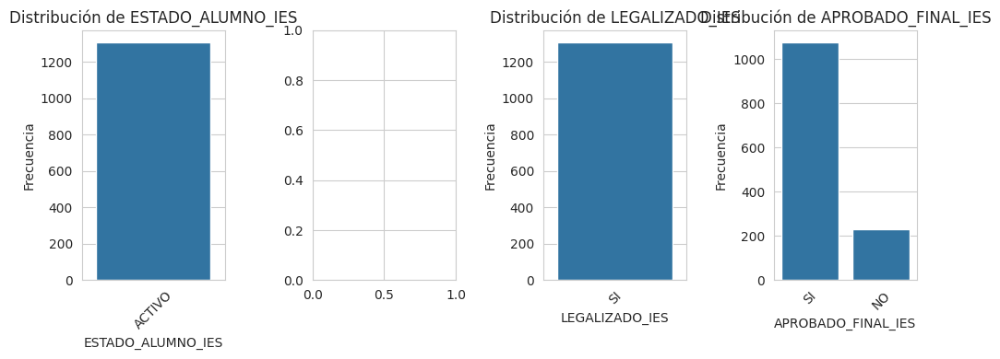

In [55]:
import matplotlib.pyplot as plt
import seaborn as sns

# Se configura el estilo de seaborn para gráficos más atractivos
sns.set_style("whitegrid")

# Se crea una figura con tres subplots
fig, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize=(10, 4))

# Se lista de variables para los histogramas
variables_histograma = ['ESTADO_ALUMNO_IES', 'LEGALIZADO_IES', 'APROBADO_FINAL_IES']

# Se presenta el gráfico para ESTADO
sns.countplot(data=df_consolidado2, x='ESTADO_ALUMNO_IES', ax=ax1)
ax1.set_title('Distribución de ESTADO_ALUMNO_IES')
ax1.set_xlabel('ESTADO_ALUMNO_IES')
ax1.set_ylabel('Frecuencia')
ax1.tick_params(axis='x', rotation=45)

# Se presenta el gráfico para LEGALIZADO
sns.countplot(data=df_consolidado2, x='LEGALIZADO_IES', ax=ax3)
ax3.set_title('Distribución de LEGALIZADO_IES')
ax3.set_xlabel('LEGALIZADO_IES')
ax3.set_ylabel('Frecuencia')
ax3.tick_params(axis='x', rotation=45)

# Se presenta el gráfico para APROBADO
sns.countplot(data=df_consolidado2, x='APROBADO_FINAL_IES', ax=ax4)
ax4.set_title('Distribución de APROBADO_FINAL_IES')
ax4.set_xlabel('APROBADO_FINAL_IES')
ax4.set_ylabel('Frecuencia')
ax4.tick_params(axis='x', rotation=45)

# Se ajusta el diseño y mostrar la figura
plt.tight_layout()
plt.show()

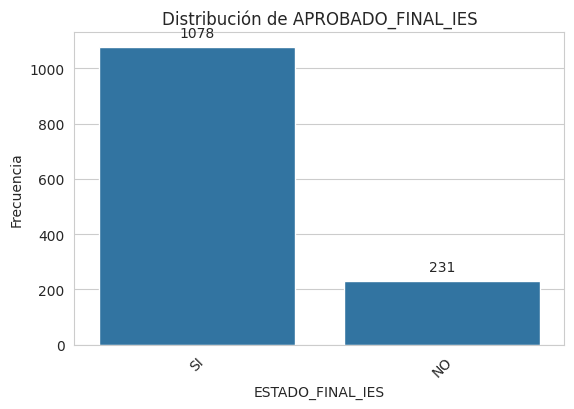

In [56]:
import matplotlib.pyplot as plt
import seaborn as sns

# Se configura el estilo de seaborn para gráficos más atractivos
sns.set_style("whitegrid")

# Se crea una figura con un tamaño ajustado al 70% del ancho de la pantalla
fig, ax1 = plt.subplots(1, 1, figsize=(7, 4.2))  # 70% de 10 es 7

# Se presenta el gráfico para APROBADO
sns_plot = sns.countplot(data=df_consolidado2, x='APROBADO_FINAL_IES', ax=ax1)
ax1.set_title('Distribución de APROBADO_FINAL_IES')
ax1.set_xlabel('ESTADO_FINAL_IES')
ax1.set_ylabel('Frecuencia')
ax1.tick_params(axis='x', rotation=45)

# Se añade el valor de cada barra en su cima
for p in ax1.patches:
    ax1.annotate(f'{int(p.get_height())}',
                 (p.get_x() + p.get_width() / 2., p.get_height()),
                 ha = 'center', va = 'center',
                 xytext = (0, 10),
                 textcoords = 'offset points')

# Se ajusta el diseño
plt.tight_layout()

# Se ajusta los márgenes para centrar el gráfico
plt.subplots_adjust(left=0.15, right=0.85)

# Se muetra la figura
plt.show()

In [57]:
# Se calcula los porcentajes y las cantidades para cada clase
discapacidad_counts = df_consolidado2['DISCAPACIDAD'].value_counts()
porcentajes = discapacidad_counts / len(df_consolidado2) * 100

# Se crea un DataFrame con los resultados
resultados = pd.DataFrame({
    'Clase': discapacidad_counts.index,
    'Proporción (%)': porcentajes.values,
    'Cantidad de Registros': discapacidad_counts.values
})

# Se comprueba si alguna clase tiene 99% o más de los registros
if (porcentajes >= 99).any():
    # Se identifica la clase mayoritaria
    clase_mayoritaria = porcentajes.idxmax()

    # Se retira los registros con valores atípicos
    df_filtrado = df_consolidado2[df_consolidado2['DISCAPACIDAD'] == clase_mayoritaria]

    # Se muestra información
    print(f"La clase mayoritaria es '{clase_mayoritaria}' con un {porcentajes.max()}% de los registros.")
else:
    df_filtrado = df_consolidado2
    print("No hay clase con 99% o más de los registros.")

# Se muestra el DataFrame con resultados
print(resultados)

La clase mayoritaria es 'NINGUNA' con un 99.46524064171123% de los registros.
     Clase  Proporción (%)  Cantidad de Registros
0  NINGUNA       99.465241                   1302
1   FÍSICA        0.381971                      5
2   VISUAL        0.152788                      2


In [58]:
import pandas as pd

# Se crea el DataFrame con discapacitados (aquellos que tienen un valor en DISCAPACIDAD)
df_discapacitados = df_consolidado2[df_consolidado2['DISCAPACIDAD'].notna() & (df_consolidado2['DISCAPACIDAD'] != '')]

# Se muestra información sobre los DataFrames resultantes
print("DataFrame de discapacitados:")
print(df_discapacitados['DISCAPACIDAD'].value_counts())
print(f"Total de registros: {len(df_discapacitados)}")


DataFrame de discapacitados:
DISCAPACIDAD
NINGUNA    1302
FÍSICA        5
VISUAL        2
Name: count, dtype: int64
Total de registros: 1309


In [59]:
#Se retira variable de dato secuencial sintetico del ID del Alunmo
df_consolidado2 = df_consolidado2.drop('ID_ALUMNO', axis=1)

In [60]:
# Se cuenta los registros por clase en el campo PERIODO
registros_por_clase = df_consolidado2['PERÍODO_APLICO_IES'].value_counts().sort_index()

# Se muestra los resultados
print("Registros por clase en el campo PERÍODO_APLICO_IES:\n", registros_por_clase)


Registros por clase en el campo PERÍODO_APLICO_IES:
 PERÍODO_APLICO_IES
2021 - 2022 CN1    701
2021 - 2022 CN2    608
Name: count, dtype: int64


In [61]:
import pandas as pd

# Función para procesar el texto
def procesar_periodo(texto):
    # Eliminar espacios en blanco de los extremos
    texto_limpio = texto.strip()
    # Tomar el último carácter
    ultimo_caracter = texto_limpio[-1]
    return ultimo_caracter

# Se aplica la función al campo PERÍODO_APLICO_IES
df_consolidado2['PERÍODO_APLICO_IES'] = df_consolidado2['PERÍODO_APLICO_IES'].apply(procesar_periodo)

# Se muestra los primeros registros para verificar
print(df_consolidado2['PERÍODO_APLICO_IES'].head())

# Opcionalmente: Se muestra los valores únicos y sus conteos
print("\nValores únicos en PERÍODO_APLICO_IES:")
print(df_consolidado2['PERÍODO_APLICO_IES'].value_counts())

0    1
1    1
2    1
3    1
4    1
Name: PERÍODO_APLICO_IES, dtype: object

Valores únicos en PERÍODO_APLICO_IES:
PERÍODO_APLICO_IES
1    701
2    608
Name: count, dtype: int64


array([[<Axes: title={'center': 'PORCENTAJE_DISCAPACIDAD'}>,
        <Axes: title={'center': 'VALOR_MATRÍCULA_IES'}>],
       [<Axes: title={'center': 'NOTA_FINAL_IES'}>,
        <Axes: title={'center': 'ASISTENCIA_FINAL_IES'}>],
       [<Axes: title={'center': 'EDAD'}>,
        <Axes: title={'center': 'NOTA_PROCE_GOB'}>]], dtype=object)

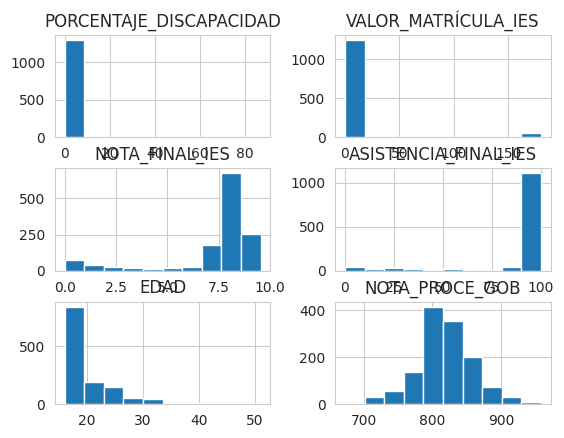

In [62]:
df_consolidado2.hist()

In [63]:
# Se define las columnas a analizar para identificar si presentan una clase mayoritaria
# contendencia a ser una constante por lo cual se las retitaría del análisis.
# 'REGISTRO',

columnas = ['PERÍODO_APLICO_IES', 'LEGALIZADO_IES', 'ESTADO_ALUMNO_IES', 'REPETIDOR_IES']

# Se calcula los volúmenes de clases para cada columna
resultados = {}
for columna in columnas:
    resultados[columna] = df_consolidado2[columna].value_counts()

# Se muestra los resultados
for columna, conteos in resultados.items():
    print(f"Volumen de clases en la columna {columna}:\n{conteos}\n")


Volumen de clases en la columna PERÍODO_APLICO_IES:
PERÍODO_APLICO_IES
1    701
2    608
Name: count, dtype: int64

Volumen de clases en la columna LEGALIZADO_IES:
LEGALIZADO_IES
SI    1309
Name: count, dtype: int64

Volumen de clases en la columna ESTADO_ALUMNO_IES:
ESTADO_ALUMNO_IES
ACTIVO    1309
Name: count, dtype: int64

Volumen de clases en la columna REPETIDOR_IES:
REPETIDOR_IES
NO           1297
REPETIDOR      12
Name: count, dtype: int64



In [64]:
# Se retira las columnas con una clase mayoritaria o clase unica
# Se elimina las columnas especificadas

columnas_a_eliminar = [ 'LEGALIZADO_IES', 'ESTADO_ALUMNO_IES']
df_consolidado2 = df_consolidado2.drop(columns=columnas_a_eliminar)

In [65]:
# Se reemplaza 'REPETIDOR' por 'SI' en la columna 'REPETIDOR_IES'
df_consolidado2['REPETIDOR_IES'] = df_consolidado2['REPETIDOR_IES'].replace('REPETIDOR', 'SI')

In [66]:
# Se define las columnas a analizar para identificar si presentan una clase mayoritaria
# contendencia a ser una constante por lo cual se las retitaría del análisi.

columnas = ['GRATUIDAD_IES', 'VALOR_MATRÍCULA_IES']

# Se calcula los volúmenes de clases para cada columna
resultados = {}
for columna in columnas:
    resultados[columna] = df_consolidado2[columna].value_counts()

# Se muestra los resultados
for columna, conteos in resultados.items():
    print(f"Volumen de clases en la columna {columna}:\n{conteos}\n")

Volumen de clases en la columna GRATUIDAD_IES:
GRATUIDAD_IES
GRATUIDAD (POSTULANTES MTN)                       1252
SIN GRATUIDAD (POSTULANTES MTN, SIN GRATUIDAD)      45
PARCIAL (REPETIDORES)                               12
Name: count, dtype: int64

Volumen de clases en la columna VALOR_MATRÍCULA_IES:
VALOR_MATRÍCULA_IES
0.0      1251
180.0      58
Name: count, dtype: int64



In [67]:
# Se define las columnas a analizar
columnas = ['JORNADA_MTN_POSTULACIÓN_IES']
# Se calcula los volúmenes de clases para cada columna
resultados = {}
for columna in columnas:
    resultados[columna] = df_consolidado2[columna].value_counts()

# Se muestra los resultados
for columna, conteos in resultados.items():
    print(f"Volumen de clases en la columna {columna}:\n{conteos}\n")


Volumen de clases en la columna JORNADA_MTN_POSTULACIÓN_IES:
JORNADA_MTN_POSTULACIÓN_IES
VESPERTINA    452
MATUTINA      446
NOCTURNA      410
                1
Name: count, dtype: int64



In [68]:
import pandas as pd
import numpy as np

# Se define la columna a analizar
columna = 'JORNADA_MTN_POSTULACIÓN_IES'

# Se limpia los espacios en blanco
df_consolidado2[columna] = df_consolidado2[columna].str.strip()

# Se calcula los volúmenes de clases
conteos = df_consolidado2[columna].value_counts()
print(f"Volumen de clases en la columna {columna}:\n{conteos}\n")

# Se encuentra la moda
moda = conteos.index[0]
print(f"La moda es: {moda}\n")

# Se actualiza campos vacíos con la moda
df_consolidado2[columna] = df_consolidado2[columna].replace('', np.nan).fillna(moda)

# Se muestra los nuevos volúmenes de clases
nuevos_conteos = df_consolidado2[columna].value_counts()
print(f"Nuevos volúmenes de clases en la columna {columna}:\n{nuevos_conteos}\n")

# Se verifica si quedan valores vacíos
valores_vacios = df_consolidado2[columna].isnull().sum()
print(f"Número de valores vacíos restantes: {valores_vacios}")

Volumen de clases en la columna JORNADA_MTN_POSTULACIÓN_IES:
JORNADA_MTN_POSTULACIÓN_IES
VESPERTINA    452
MATUTINA      446
NOCTURNA      410
                1
Name: count, dtype: int64

La moda es: VESPERTINA

Nuevos volúmenes de clases en la columna JORNADA_MTN_POSTULACIÓN_IES:
JORNADA_MTN_POSTULACIÓN_IES
VESPERTINA    453
MATUTINA      446
NOCTURNA      410
Name: count, dtype: int64

Número de valores vacíos restantes: 0


<ipython-input-69-3bfd15505b57>:39: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  ax.annotate(f"{conteo.index[i]}\n{conteo[i]} ({porcentajes[i]:.1f}%)",


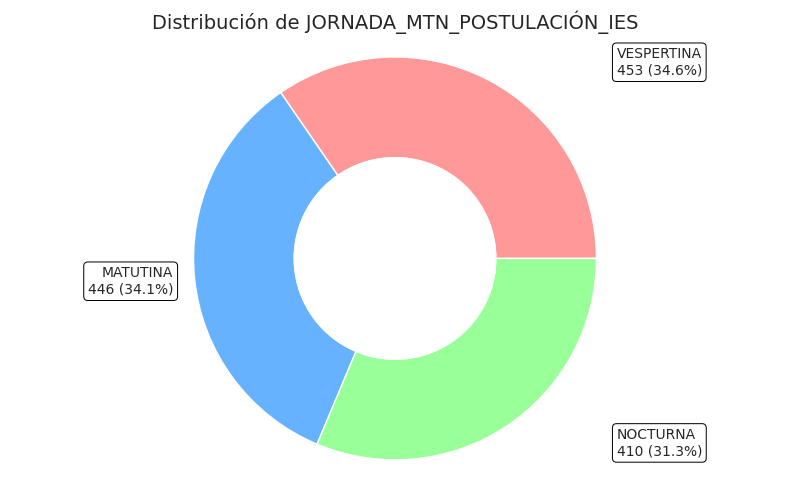

In [69]:
import pandas as pd
import matplotlib.pyplot as plt

# Se cuenta las ocurrencias de cada clase
conteo = df_consolidado2['JORNADA_MTN_POSTULACIÓN_IES'].value_counts()

# Se calcula los porcentajes
porcentajes = conteo / len(df_consolidado1) * 100

# Se crea la figura y los ejes
fig, ax = plt.subplots(figsize=(8, 5))

# Se define los colores a emplear en cada clase
colores = ['#FF9999', '#66B2FF', '#99FF99', '#FFCC99']

# Se crea el gráfico de pastel
wedges, texts, autotexts = ax.pie(conteo,
                                  colors=colores,
                                  autopct='',
                                  pctdistance=0.55,
                                  wedgeprops=dict(width=0.5))

# Se añade un círculo en el centro para crear un efecto de donut
centre_circle = plt.Circle((0,0), 0.50, fc='white')
fig.gca().add_artist(centre_circle)

# Se configura las etiquetas externas
bbox_props = dict(boxstyle="round,pad=0.3", fc="w", ec="k", lw=0.72)
kw = dict(arrowprops=dict(arrowstyle="-"),
          bbox=bbox_props, zorder=0, va="center")

for i, p in enumerate(wedges):
    ang = (p.theta2 - p.theta1) / 2. + p.theta1
    y = np.sin(np.deg2rad(ang))
    x = np.cos(np.deg2rad(ang))
    horizontalalignment = {-1: "right", 1: "left"}[int(np.sign(x))]
    connectionstyle = f"angle,angleA=0,angleB={ang}"
    kw["arrowprops"].update({"connectionstyle": connectionstyle})
    ax.annotate(f"{conteo.index[i]}\n{conteo[i]} ({porcentajes[i]:.1f}%)",
                xy=(x, y), xytext=(1.1*np.sign(x), 1.1*y),
                horizontalalignment=horizontalalignment, **kw)

# Se ajusta el diseño y mostrar el gráfico
plt.title('Distribución de JORNADA_MTN_POSTULACIÓN_IES', fontsize=14)
plt.axis('equal')
plt.tight_layout()
plt.show()

In [70]:
import pandas as pd

# Se verifica si la columna existe
if 'OBSERVACIÓN_CURSO_IES' in df_consolidado2.columns:
    # Se cuenta los registros para cada clase
    class_counts = df_consolidado2['OBSERVACIÓN_CURSO_IES'].value_counts()

    print("Conteo de registros por clase en la columna 'OBSERVACIÓN_CURSO_IES':")
    print(class_counts)

    # Se muestra el total de registros
    total_registros = len(df_consolidado2)
    print(f"\nTotal de registros: {total_registros}")

    # Se calcula y muestra los porcentajes
    percentages = (class_counts / total_registros * 100).round(2)
    print("\nPorcentajes:")
    print(percentages)

    # Opcionalmente: Se guarda los resultados en un archivo CSV
    results_df = pd.DataFrame({'Conteo': class_counts, 'Porcentaje': percentages})
    results_df.to_csv('observacion_curso_ies_conteo.csv')
    print("\nResultados guardados en 'observacion_curso_ies_conteo.csv'")
else:
    print("La columna 'OBSERVACIÓN_CURSO_IES' no existe en el DataFrame.")

Conteo de registros por clase en la columna 'OBSERVACIÓN_CURSO_IES':
OBSERVACIÓN_CURSO_IES
APROBADO                                             496
PERD.X ASIST. (A0)                                    60
PERD.X ASIST. (A3)                                    43
PERD.X ASIST. (A2)                                    32
PERD.X ASIST. (A1)                                    22
PERD.X ASIST. (A4)                                    18
REPROBADO                                             13
APROBADO RESOLUCIÓN R-CSU-UG-SE010-77-08-07-2021.      1
Name: count, dtype: int64

Total de registros: 1309

Porcentajes:
OBSERVACIÓN_CURSO_IES
APROBADO                                             37.89
PERD.X ASIST. (A0)                                    4.58
PERD.X ASIST. (A3)                                    3.28
PERD.X ASIST. (A2)                                    2.44
PERD.X ASIST. (A1)                                    1.68
PERD.X ASIST. (A4)                                    1.38
REPROBADO  

In [71]:
# Se elimina la columnas de comentarios varios de ejecutivos de causa de perdida por asustencia
df_consolidado2 = df_consolidado2.drop(columns=['OBSERVACIÓN_CURSO_IES'])

In [72]:
import pandas as pd

# Función para mostrar las clases y cantidades de una columna
def mostrar_clases_y_cantidades(df, columna):
    print(f"\nClases y cantidades en la columna '{columna}':")
    conteo = df[columna].value_counts(dropna=False)
    porcentajes = df[columna].value_counts(normalize=True, dropna=False) * 100

    for clase, cantidad in conteo.items():
        porcentaje = porcentajes[clase]
        print(f"{clase}: {cantidad} ({porcentaje:.2f}%)")

# Se muestra las clases y cantidades para 'ORDEN_PAGO_IES'
mostrar_clases_y_cantidades(df_consolidado2, 'ORDEN_PAGO_IES')


Clases y cantidades en la columna 'ORDEN_PAGO_IES':
PAGADA: 1274 (97.33%)
PENDIENTE: 35 (2.67%)


In [73]:
# Se retira la columna ORDEN_PAGO por poseen una clase mayoritaria
df_consolidado2 = df_consolidado2.drop(columns=['ORDEN_PAGO_IES'])

In [74]:
# Imputación de variables que cuyo llenado devariables "No Procede" o "No Aplica"
# cuando el aspirante no se encuentra en esa condición se remplaza el valor "-" por "NO APLICA"

In [75]:
# Para FILAS donde la columna "TRABAJA"=="NO" la columnas  "AFILIADO_IESS", "JORNADA_LAB" y  "DEPENCIA_TRABAJO"
# que posean en valor de "-" se lo Rremplaza por el valor "NO APLICA"

# Para los registros donde la variable "PADECE_ENF_CRONICA" posee "NO" remplaza por el valor de NOM_ENF_CRONICA con el valor de "NO APLICA"
# para las filas donde la columna "POSEE_TITULO_IES" posee "NO" se remplaza la variable "TIPO_TITULO_IES_POSEE" con  el valor "NO APLICA"

In [76]:
# Para las filas donde TRABAJA == "NO"
mask_no_trabaja = df_consolidado2['TRABAJA'] == "NO"
columnas_a_reemplazar = ['AFILIADO_IESS', 'JORNADA_LABORAL', 'DEPENDENCIA_TRABAJO']

for columna in columnas_a_reemplazar:
    df_consolidado2.loc[mask_no_trabaja & (df_consolidado2[columna] == "-"), columna] = "NO APLICA"

# Para las filas donde PADECE_ENF_CRONICA == "NO"
mask_no_enf_cronica = df_consolidado2['PADECE_ENFERMEDAD_CRÓNICA'] == "NO"
df_consolidado2.loc[mask_no_enf_cronica, 'NOM_ENFERMEDAD_CRÓNICA'] = "NO APLICA"

# Para las filas donde POSEE_TITULO_IES == "NO"
mask_no_titulo_ies = df_consolidado2['POSEE_TÍTULO_IES'] == "NO"
df_consolidado2.loc[mask_no_titulo_ies, 'TIPO_TÍTULO_IES_POSEE'] = "NO APLICA"

# Se verifica los cambios
print("Cambios realizados:")
print("\nDistribución de AFILIADO_IESS:")
print(df_consolidado2['AFILIADO_IESS'].value_counts(dropna=False))

print("\nDistribución de JORNADA_LABORAL:")
print(df_consolidado2['JORNADA_LABORAL'].value_counts(dropna=False))

print("\nDistribución de DEPENDENCIA_TRABAJO:")
print(df_consolidado2['DEPENDENCIA_TRABAJO'].value_counts(dropna=False))

print("\nDistribución de NOM_ENFERMEDAD_CRÓNICA:")
print(df_consolidado2['NOM_ENFERMEDAD_CRÓNICA'].value_counts(dropna=False))

print("\nDistribución de TIPO_TÍTULO_IES_POSEE:")
print(df_consolidado2['TIPO_TÍTULO_IES_POSEE'].value_counts(dropna=False))

print("\nDistribución de DiSCAPACIDAD:")
print(df_consolidado2['DISCAPACIDAD'].value_counts(dropna=False))

Cambios realizados:

Distribución de AFILIADO_IESS:
AFILIADO_IESS
NO    1116
SI     193
Name: count, dtype: int64

Distribución de JORNADA_LABORAL:
JORNADA_LABORAL
NINGUNA             941
DIURNO              196
TURNOS ROTATIVOS    102
VESPERTINO           63
NOCTURNO              7
Name: count, dtype: int64

Distribución de DEPENDENCIA_TRABAJO:
DEPENDENCIA_TRABAJO
NINGUNO    941
PRIVADA    292
PUBLICA     76
Name: count, dtype: int64

Distribución de NOM_ENFERMEDAD_CRÓNICA:
NOM_ENFERMEDAD_CRÓNICA
NO APLICA                                         1291
ASMA                                                 6
EPILEPSIA                                            2
VIH                                                  2
ALERGIA                                              2
PROLAPSO DE LA VÁLVULA NITRAL                        2
ARITMIA CARDIACA(TAQUICARDIA SUPRAVENTRICULAR)       1
AMIGDALITIS CRONICA                                  1
VITILIGO                                             1
OS

In [77]:
# Para modelos de prediccion de probabilidad de aprobacion
# se definir la variables objetivo
Y1 = df_consolidado2['APROBADO_FINAL_IES']

# Para trabajos futuros puede emplearse las variables Y2 para predecir la nota general predicha o Y3 para la asistencia predicha.
Y2 = df_consolidado2['NOTA_FINAL_IES']
Y3 = df_consolidado2['ASISTENCIA_FINAL_IES']

In [78]:
# Se retira las variblas de objetivos Y2 y Y3 para trabajos futuros
# ya que en este proyecto se considera una creación de un modelo que se emplee
# con alumnos nuevos que ingresan en el proceso y esos datos no existen en el inicio
df_consolidado2 = df_consolidado2.drop(columns=['NOTA_FINAL_IES', 'ASISTENCIA_FINAL_IES'])

In [79]:
# Se mueve la columna objetivo y1 'APROBADO' al final del DataFrame
columna = df_consolidado2.pop('APROBADO_FINAL_IES')
df_consolidado2['APROBADO_FINAL_IES'] = columna

In [80]:
# Se verifica los valores perdidos o missing values
# se los remplaza por la media en numericos y por la moda en categoricos.

import pandas as pd
import numpy as np

# Se identifica las columnas con valores NaN
columnas_con_nan = df_consolidado2.columns[df_consolidado2.isna().any()].tolist()

print("Columnas con valores NaN:")
for columna in columnas_con_nan:
    nan_count = df_consolidado2[columna].isna().sum()
    print(f"{columna}: {nan_count} valores NaN")

# Se separa las columnas numéricas y categóricas
columnas_numericas = df_consolidado2.select_dtypes(include=[np.number]).columns
columnas_categoricas = df_consolidado2.select_dtypes(exclude=[np.number]).columns

# Función para imputar valores
def imputar_valores(df, columna):
    if columna in columnas_numericas:
        # Imputar con la media para columnas numéricas
        media = df[columna].mean()
        df[columna].fillna(media, inplace=True)
        print(f"Columna {columna}: Imputada con la media ({media})")
    elif columna in columnas_categoricas:
        # Imputar con la moda para columnas categóricas
        moda = df[columna].mode()
        if not moda.empty:
            moda_valor = moda[0]
            df[columna].fillna(moda_valor, inplace=True)
            print(f"Columna {columna}: Imputada con la moda ({moda_valor})")
        else:
            # Si no hay moda (todos los valores son NaN), usar un valor predeterminado
            valor_predeterminado = "DESCONOCIDO"
            df[columna].fillna(valor_predeterminado, inplace=True)
            print(f"Columna {columna}: No hay valores no nulos. Imputada con '{valor_predeterminado}'")

# Se imputa los valores NaN
for columna in columnas_con_nan:
    imputar_valores(df_consolidado2, columna)

# Se verifica si aún quedan valores NaN
nan_restantes = df_consolidado2.isna().sum().sum()
if nan_restantes == 0:
    print("\nTodos los valores NaN han sido imputados.")
else:
    print(f"\nQuedan {nan_restantes} valores NaN en el DataFrame.")


Columnas con valores NaN:

Todos los valores NaN han sido imputados.


In [81]:
## Verifico las variabilidad de la variable de 'PASATIEMPO_GENERICO'

In [82]:
# Se obtiene el conteo de cada valor único en PASATIEMPOS
pasatiempos_count = df_consolidado2['PASATIEMPO_GENÉRICO'].value_counts()

# Se muestra los resultados
print("Conteo de registros por PASATIEMPO_GENÉRICO:")
print(pasatiempos_count)

# Se muestra el total de registros
total_registros = df_consolidado2['PASATIEMPO_GENÉRICO'].count()
print(f"\nTotal de registros: {total_registros}")

#Se calcula y muestra el porcentaje para cada pasatiempo
print("\nPorcentaje de cada PASATIEMPO_GENÉRICO:")
pasatiempos_percentage = (pasatiempos_count / total_registros * 100).round(2)
for pasatiempo, porcentaje in pasatiempos_percentage.items():
    print(f"{pasatiempo}: {porcentaje}%")


Conteo de registros por PASATIEMPO_GENÉRICO:
PASATIEMPO_GENÉRICO
LEER Y ESCRIBIR                                   410
ACTIVIDADES EN COMPUTADORA ONLINE, VIDEOJUEGOS    371
ACTIVIDADES FISICAS Y DEPORTE                     347
ACTIVIDADES ARTISTICAS Y MANUALES                  72
OTROS                                              59
ACTIVIDADES CON FAMILIA Y AMIGOS                   42
ACTIVIDADES DEL HOGAR                               8
Name: count, dtype: int64

Total de registros: 1309

Porcentaje de cada PASATIEMPO_GENÉRICO:
LEER Y ESCRIBIR: 31.32%
ACTIVIDADES EN COMPUTADORA ONLINE, VIDEOJUEGOS: 28.34%
ACTIVIDADES FISICAS Y DEPORTE: 26.51%
ACTIVIDADES ARTISTICAS Y MANUALES: 5.5%
OTROS: 4.51%
ACTIVIDADES CON FAMILIA Y AMIGOS: 3.21%
ACTIVIDADES DEL HOGAR: 0.61%


In [83]:
df_consolidado2['PASATIEMPO_GENÉRICO'].unique()

array(['ACTIVIDADES EN COMPUTADORA ONLINE, VIDEOJUEGOS',
       'ACTIVIDADES FISICAS Y DEPORTE', 'OTROS', 'LEER Y ESCRIBIR',
       'ACTIVIDADES DEL HOGAR', 'ACTIVIDADES ARTISTICAS Y MANUALES',
       'ACTIVIDADES CON FAMILIA Y AMIGOS'], dtype=object)

In [84]:
# Se aplica el mapeo
df_consolidado2['PASATIEMPO'] = df_consolidado2['PASATIEMPO_GENÉRICO'].copy()


In [85]:
df_consolidado2['TIPO_BACHILLERATO'].unique()

array(['TÉCNICO', 'GENERAL', 'OTROS', 'INTERNACIONAL', 'CIENCIAS',
       'ESPECIALIZADO'], dtype=object)

In [86]:
import pandas as pd
import matplotlib.pyplot as plt

# Función para mapear las clases específicas a genéricas
def map_vive_con(x):
    x = str(x).upper()

    if 'PADRES' in x or 'PAPÁ' in x or 'PAPA' in x or 'PADRE' in x or 'MAMA' in x  or 'MAMÁ' in x  or 'MADRE' in x or 'HERMANO' in x or 'HERMANA' in x:
        return 'FAMILEA NUCLEAR'
    elif 'ABUELA' in x or 'ABUELO' in x or 'TIO' in x or 'TIA' in x or 'TÍO' in x or 'TÍA' in x or 'FAMILIAR' in x or 'PRIMO' in x or 'PRIMA' in x:
        return 'FAMILIA EXTENDIDA'
    elif 'CÓNYUGE' in x or 'ESPOSA' in x or 'ESPOSO' in x or 'PAREJA' in x:
        return 'PAREJA'
    elif x == 'SOLO':
        return 'SOLO'
    else:
        return 'OTROS'

# Se aplica el mapeo
df_consolidado2['VIVE_CON_GENERICO'] = df_consolidado2['VIVE_CON'].apply(map_vive_con)

# Se muestra las nuevas clases genéricas y sus frecuencias
vive_con_generico_counts = df_consolidado2['VIVE_CON_GENERICO'].value_counts()
print("Clases genéricas y ocurrencias en VIVE_CON_GENERICO:")
print(vive_con_generico_counts)

Clases genéricas y ocurrencias en VIVE_CON_GENERICO:
VIVE_CON_GENERICO
FAMILEA NUCLEAR      1034
FAMILIA EXTENDIDA     148
PAREJA                106
SOLO                   18
OTROS                   3
Name: count, dtype: int64


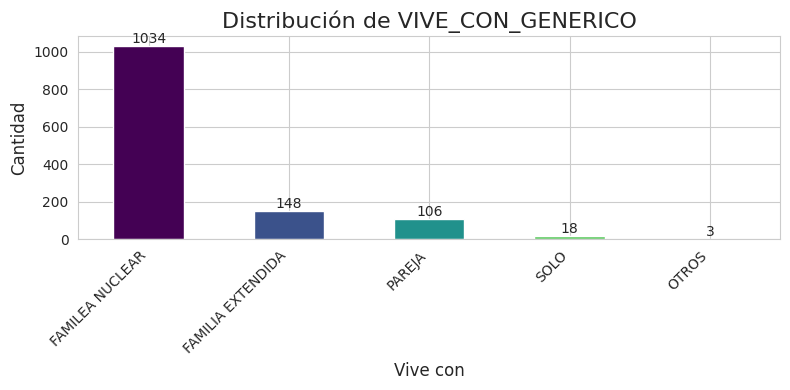


Ejemplos de mapeo:
PADRES                                   -> FAMILEA NUCLEAR
FAMILIAR                                 -> FAMILIA EXTENDIDA
CÓNYUGE                                  -> PAREJA
MADRE - HERMANO                          -> FAMILEA NUCLEAR
MAMA,TIA,TIO,PRIMA                       -> FAMILEA NUCLEAR
SOLO                                     -> SOLO
MADRE Y HERMANA                          -> FAMILEA NUCLEAR
TIOS, SOBRINOS Y ABUELOS.                -> FAMILIA EXTENDIDA
MADRE, HERMANA                           -> FAMILEA NUCLEAR
HERMANAS Y ABUELOS MATERNOS              -> FAMILEA NUCLEAR


In [87]:
import matplotlib.pyplot as plt
import pandas as pd

# Se genera los colores para cada categoría
colores = plt.cm.viridis(np.linspace(0, 1, len(vive_con_generico_counts)))

# Se visualiza los resultados en un gráfico de barras
plt.figure(figsize=(8, 4))
bars = vive_con_generico_counts.plot(kind='bar', color=colores)
plt.title('Distribución de VIVE_CON_GENERICO', fontsize=16)
plt.xlabel('Vive con', fontsize=12)
plt.ylabel('Cantidad', fontsize=12)
plt.xticks(rotation=45, ha='right')

# Se añade las etiquetas de frecuencia sobre las barras
for bar in bars.patches:
    plt.text(
        bar.get_x() + bar.get_width() / 2,
        bar.get_height(),
        f'{int(bar.get_height())}',
        ha='center', va='bottom'
    )

plt.tight_layout()
plt.show()

# Se muestra el mapeo para algunas clases específicas como ejemplo
print("\nEjemplos de mapeo:")
for clase_especifica in df_consolidado2['VIVE_CON'].unique()[:10]:  # Mostrar los primeros 10 ejemplos
    clase_generica = map_vive_con(clase_especifica)
    print(f"{clase_especifica:<40} -> {clase_generica}")


In [88]:
# Paso final: Grabar los datos en la columna VIVE_CON y eliminar VIVE_CON_GENERICO
df_consolidado2['VIVE_CON'] = df_consolidado2['VIVE_CON_GENERICO']
df_consolidado2.drop(columns=['VIVE_CON_GENERICO'], inplace=True)

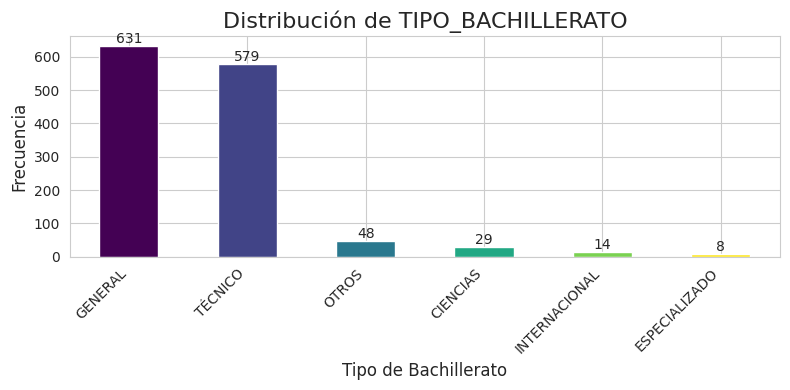

In [89]:
import matplotlib.pyplot as plt
import numpy as np

# Se cuenta las ocurrencias de cada tipo de bachillerato
bachillerato_counts = df_consolidado2['TIPO_BACHILLERATO'].value_counts()

# Se genera colores para cada categoría usando una paleta similar a viridis
colores = plt.cm.viridis(np.linspace(0, 1, len(bachillerato_counts)))

# Se visualiza los resultados en un gráfico de barras
plt.figure(figsize=(8, 4))
bars = bachillerato_counts.plot(kind='bar', color=colores)
plt.title('Distribución de TIPO_BACHILLERATO', fontsize=16)
plt.xlabel('Tipo de Bachillerato', fontsize=12)
plt.ylabel('Frecuencia', fontsize=12)
plt.xticks(rotation=45, ha='right')

# Se añade las etiquetas de frecuencia sobre las barras
for bar in bars.patches:
    plt.text(
        bar.get_x() + bar.get_width() / 2,
        bar.get_height(),
        f'{int(bar.get_height())}',
        ha='center', va='bottom'
    )

plt.tight_layout()
plt.show()


In [90]:
df_consolidado1.shape

(1309, 69)

In [91]:
df_consolidado2.shape

(1309, 60)

<ipython-input-92-b704f7ceef97>:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x=value_counts.values, y=value_counts.index, orient='h', palette='viridis')


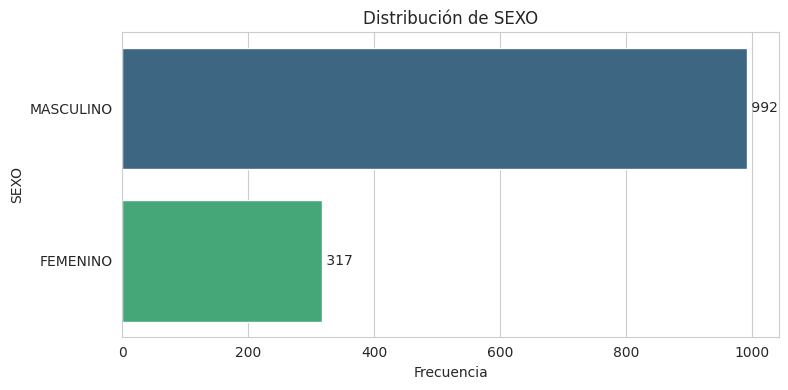


Estadísticas para SEXO:
Total de categorías: 2
Total de registros: 1309

Categorías y sus frecuencias:
SEXO
MASCULINO    992
FEMENINO     317
Name: count, dtype: int64


<ipython-input-92-b704f7ceef97>:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x=value_counts.values, y=value_counts.index, orient='h', palette='viridis')


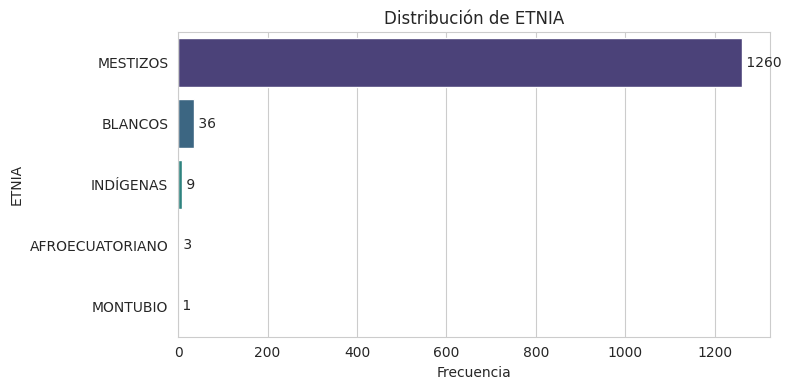


Estadísticas para ETNIA:
Total de categorías: 5
Total de registros: 1309

Categorías y sus frecuencias:
ETNIA
MESTIZOS           1260
BLANCOS              36
INDÍGENAS             9
AFROECUATORIANO       3
MONTUBIO              1
Name: count, dtype: int64


<ipython-input-92-b704f7ceef97>:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x=value_counts.values, y=value_counts.index, orient='h', palette='viridis')


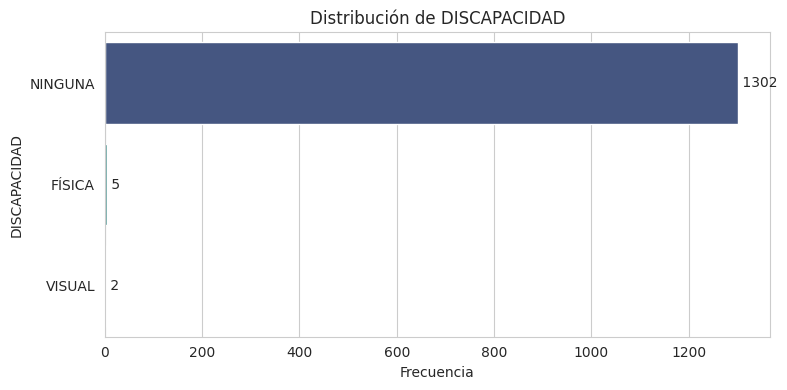


Estadísticas para DISCAPACIDAD:
Total de categorías: 3
Total de registros: 1309

Categorías y sus frecuencias:
DISCAPACIDAD
NINGUNA    1302
FÍSICA        5
VISUAL        2
Name: count, dtype: int64


<ipython-input-92-b704f7ceef97>:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x=value_counts.values, y=value_counts.index, orient='h', palette='viridis')


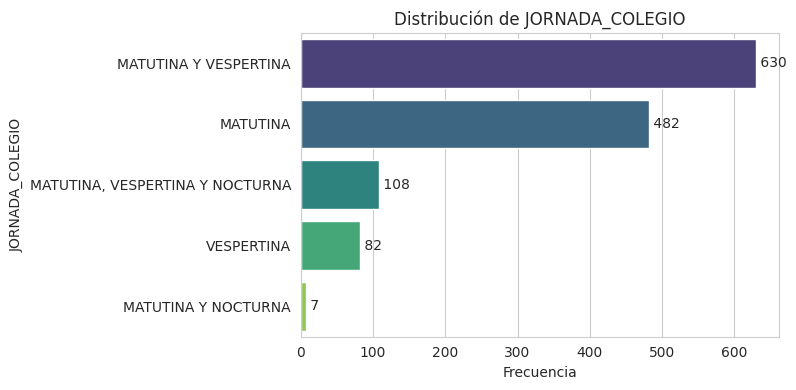


Estadísticas para JORNADA_COLEGIO:
Total de categorías: 5
Total de registros: 1309

Categorías y sus frecuencias:
JORNADA_COLEGIO
MATUTINA Y VESPERTINA              630
MATUTINA                           482
MATUTINA, VESPERTINA Y NOCTURNA    108
VESPERTINA                          82
MATUTINA Y NOCTURNA                  7
Name: count, dtype: int64


<ipython-input-92-b704f7ceef97>:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x=value_counts.values, y=value_counts.index, orient='h', palette='viridis')


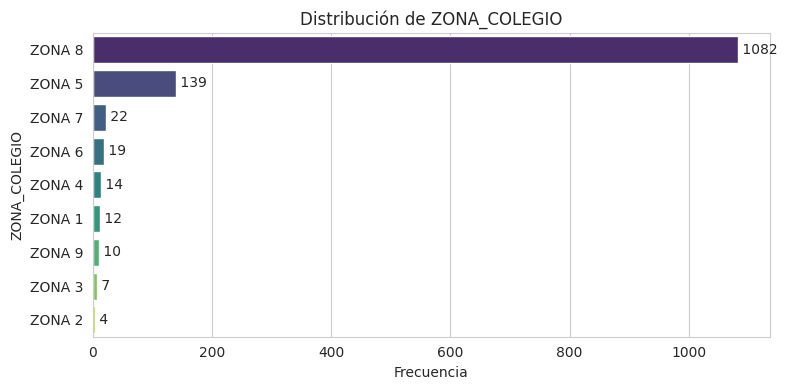


Estadísticas para ZONA_COLEGIO:
Total de categorías: 9
Total de registros: 1309

Categorías y sus frecuencias:
ZONA_COLEGIO
ZONA 8    1082
ZONA 5     139
ZONA 7      22
ZONA 6      19
ZONA 4      14
ZONA 1      12
ZONA 9      10
ZONA 3       7
ZONA 2       4
Name: count, dtype: int64


<ipython-input-92-b704f7ceef97>:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x=value_counts.values, y=value_counts.index, orient='h', palette='viridis')


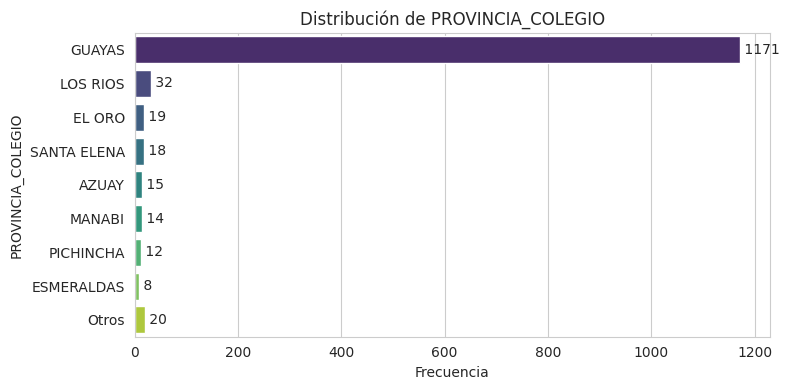


Estadísticas para PROVINCIA_COLEGIO:
Total de categorías: 9
Total de registros: 1309

Categorías y sus frecuencias:
GUAYAS         1171
LOS RIOS         32
EL ORO           19
SANTA ELENA      18
AZUAY            15
MANABI           14
PICHINCHA        12
ESMERALDAS        8
Otros            20
dtype: int64


<ipython-input-92-b704f7ceef97>:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x=value_counts.values, y=value_counts.index, orient='h', palette='viridis')


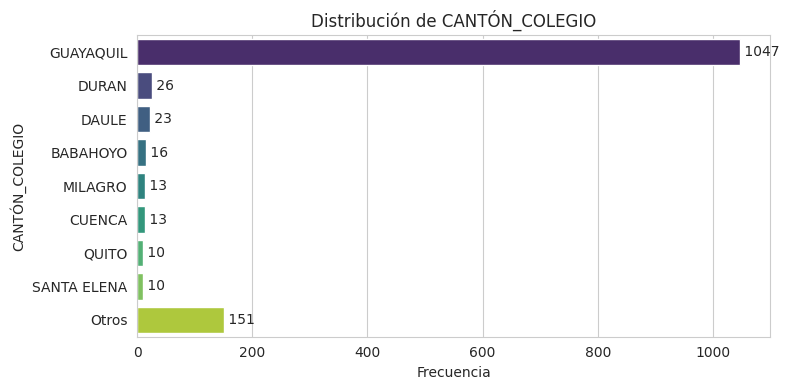


Estadísticas para CANTÓN_COLEGIO:
Total de categorías: 9
Total de registros: 1309

Categorías y sus frecuencias:
GUAYAQUIL      1047
DURAN            26
DAULE            23
BABAHOYO         16
MILAGRO          13
CUENCA           13
QUITO            10
SANTA ELENA      10
Otros           151
dtype: int64


<ipython-input-92-b704f7ceef97>:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x=value_counts.values, y=value_counts.index, orient='h', palette='viridis')


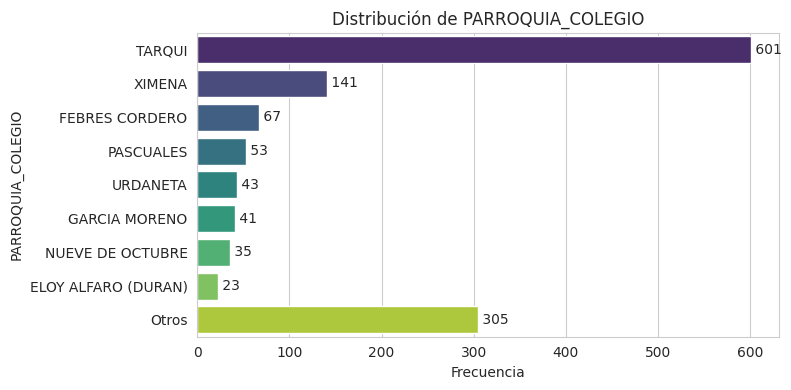


Estadísticas para PARROQUIA_COLEGIO:
Total de categorías: 9
Total de registros: 1309

Categorías y sus frecuencias:
TARQUI                 601
XIMENA                 141
FEBRES CORDERO          67
PASCUALES               53
URDANETA                43
GARCIA MORENO           41
NUEVE DE OCTUBRE        35
ELOY ALFARO (DURAN)     23
Otros                  305
dtype: int64


<ipython-input-92-b704f7ceef97>:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x=value_counts.values, y=value_counts.index, orient='h', palette='viridis')


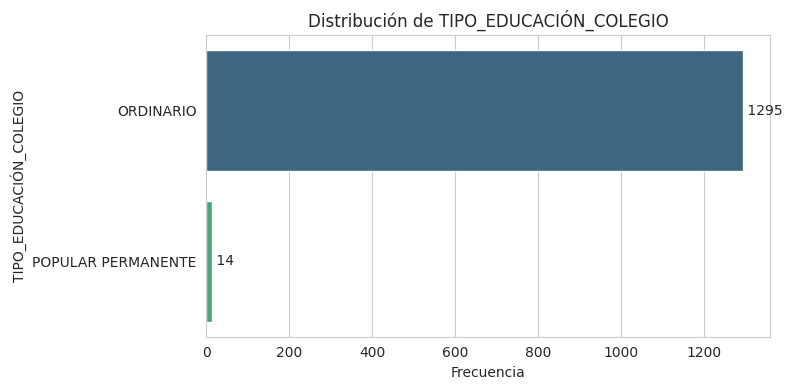


Estadísticas para TIPO_EDUCACIÓN_COLEGIO:
Total de categorías: 2
Total de registros: 1309

Categorías y sus frecuencias:
TIPO_EDUCACIÓN_COLEGIO
ORDINARIO             1295
POPULAR PERMANENTE      14
Name: count, dtype: int64


<ipython-input-92-b704f7ceef97>:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x=value_counts.values, y=value_counts.index, orient='h', palette='viridis')


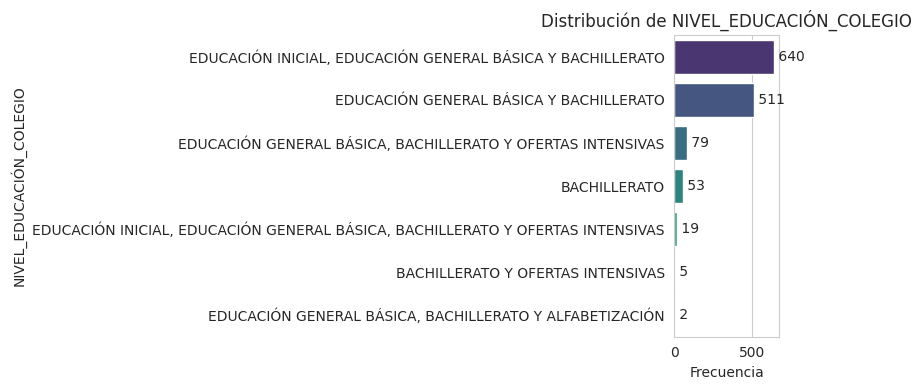


Estadísticas para NIVEL_EDUCACIÓN_COLEGIO:
Total de categorías: 7
Total de registros: 1309

Categorías y sus frecuencias:
NIVEL_EDUCACIÓN_COLEGIO
EDUCACIÓN INICIAL, EDUCACIÓN GENERAL BÁSICA Y BACHILLERATO                        640
EDUCACIÓN GENERAL BÁSICA Y BACHILLERATO                                           511
EDUCACIÓN GENERAL BÁSICA, BACHILLERATO Y OFERTAS INTENSIVAS                        79
BACHILLERATO                                                                       53
EDUCACIÓN INICIAL, EDUCACIÓN GENERAL BÁSICA, BACHILLERATO Y OFERTAS INTENSIVAS     19
BACHILLERATO Y OFERTAS INTENSIVAS                                                   5
EDUCACIÓN GENERAL BÁSICA, BACHILLERATO Y ALFABETIZACIÓN                             2
Name: count, dtype: int64


<ipython-input-92-b704f7ceef97>:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x=value_counts.values, y=value_counts.index, orient='h', palette='viridis')


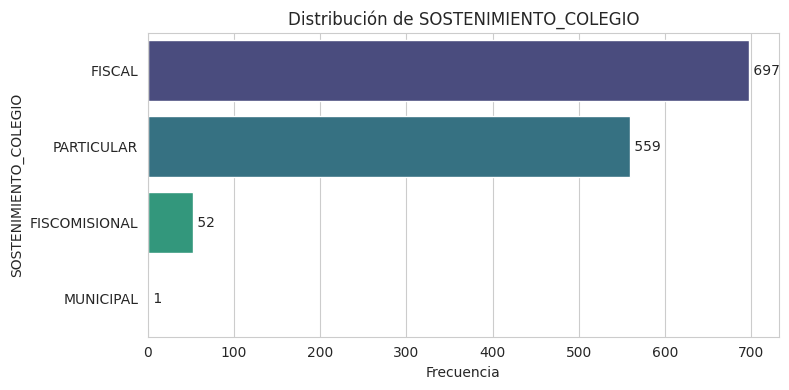


Estadísticas para SOSTENIMIENTO_COLEGIO:
Total de categorías: 4
Total de registros: 1309

Categorías y sus frecuencias:
SOSTENIMIENTO_COLEGIO
FISCAL           697
PARTICULAR       559
FISCOMISIONAL     52
MUNICIPAL          1
Name: count, dtype: int64


<ipython-input-92-b704f7ceef97>:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x=value_counts.values, y=value_counts.index, orient='h', palette='viridis')


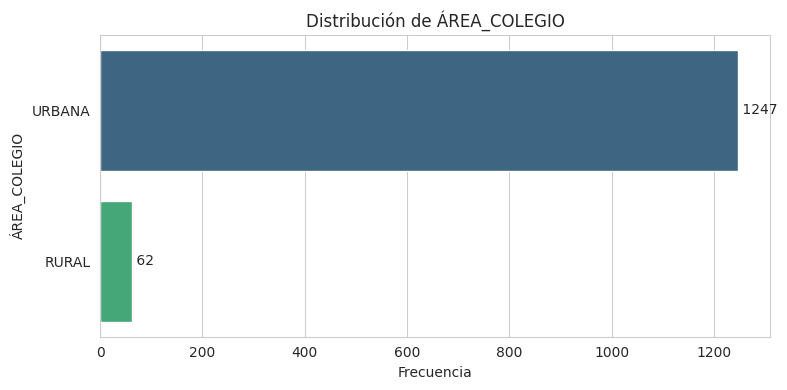


Estadísticas para ÁREA_COLEGIO:
Total de categorías: 2
Total de registros: 1309

Categorías y sus frecuencias:
ÁREA_COLEGIO
URBANA    1247
RURAL       62
Name: count, dtype: int64


<ipython-input-92-b704f7ceef97>:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x=value_counts.values, y=value_counts.index, orient='h', palette='viridis')


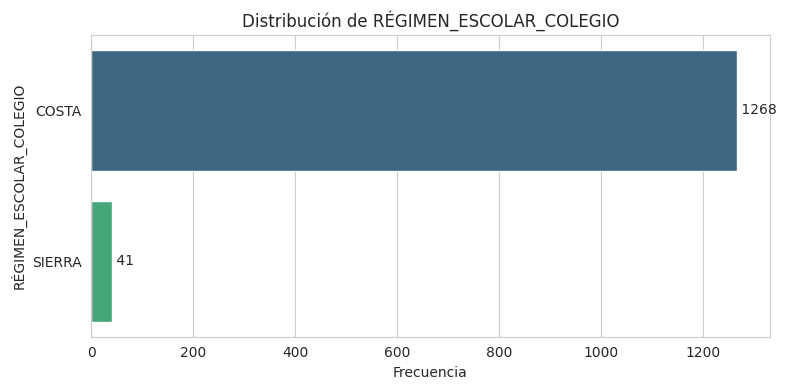


Estadísticas para RÉGIMEN_ESCOLAR_COLEGIO:
Total de categorías: 2
Total de registros: 1309

Categorías y sus frecuencias:
RÉGIMEN_ESCOLAR_COLEGIO
COSTA     1268
SIERRA      41
Name: count, dtype: int64


<ipython-input-92-b704f7ceef97>:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x=value_counts.values, y=value_counts.index, orient='h', palette='viridis')


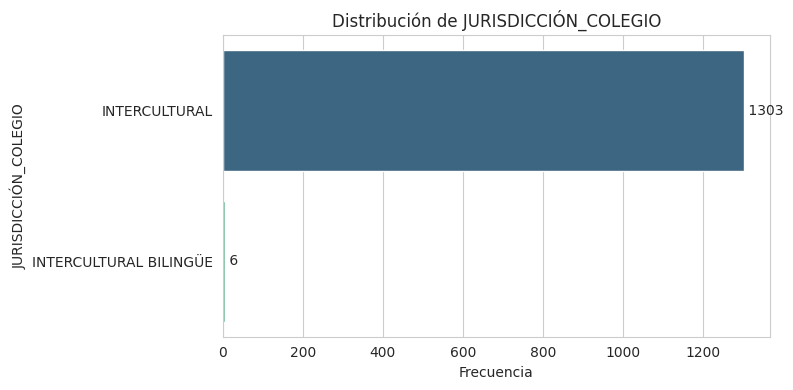


Estadísticas para JURISDICCIÓN_COLEGIO:
Total de categorías: 2
Total de registros: 1309

Categorías y sus frecuencias:
JURISDICCIÓN_COLEGIO
INTERCULTURAL             1303
INTERCULTURAL BILINGÜE       6
Name: count, dtype: int64


<ipython-input-92-b704f7ceef97>:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x=value_counts.values, y=value_counts.index, orient='h', palette='viridis')


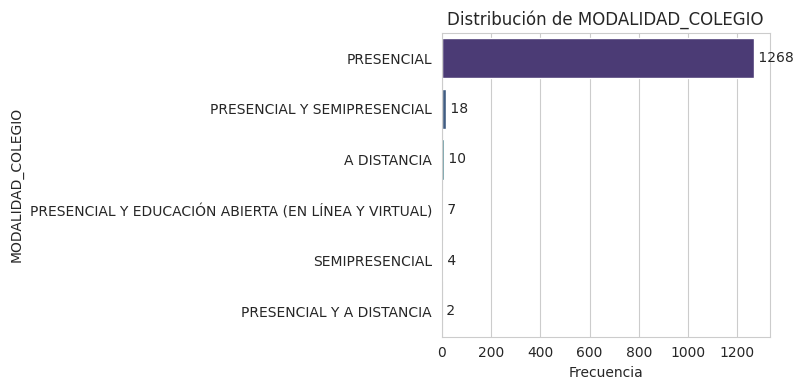


Estadísticas para MODALIDAD_COLEGIO:
Total de categorías: 6
Total de registros: 1309

Categorías y sus frecuencias:
MODALIDAD_COLEGIO
PRESENCIAL                                             1268
PRESENCIAL Y SEMIPRESENCIAL                              18
A DISTANCIA                                              10
PRESENCIAL Y EDUCACIÓN ABIERTA (EN LÍNEA Y VIRTUAL)       7
SEMIPRESENCIAL                                            4
PRESENCIAL Y A DISTANCIA                                  2
Name: count, dtype: int64


<ipython-input-92-b704f7ceef97>:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x=value_counts.values, y=value_counts.index, orient='h', palette='viridis')


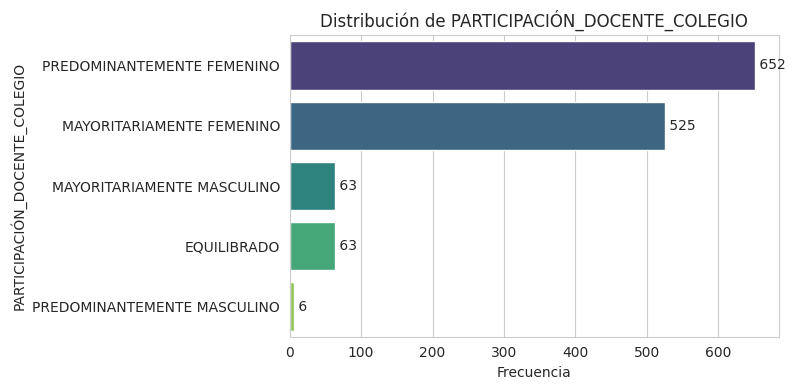


Estadísticas para PARTICIPACIÓN_DOCENTE_COLEGIO:
Total de categorías: 5
Total de registros: 1309

Categorías y sus frecuencias:
PARTICIPACIÓN_DOCENTE_COLEGIO
PREDOMINANTEMENTE FEMENINO     652
MAYORITARIAMENTE FEMENINO      525
MAYORITARIAMENTE MASCULINO      63
EQUILIBRADO                     63
PREDOMINANTEMENTE MASCULINO      6
Name: count, dtype: int64


<ipython-input-92-b704f7ceef97>:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x=value_counts.values, y=value_counts.index, orient='h', palette='viridis')


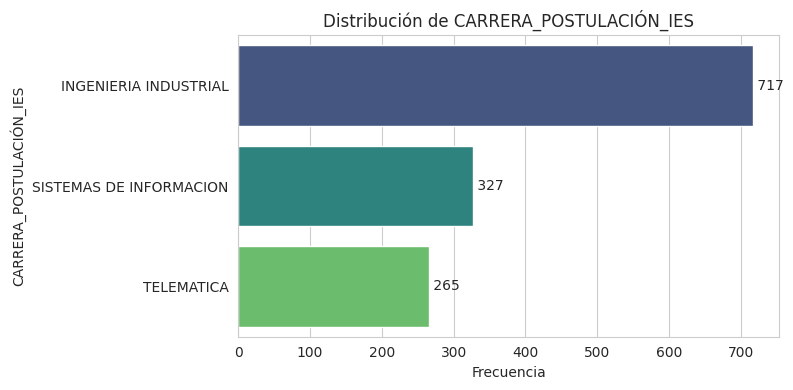


Estadísticas para CARRERA_POSTULACIÓN_IES:
Total de categorías: 3
Total de registros: 1309

Categorías y sus frecuencias:
CARRERA_POSTULACIÓN_IES
INGENIERIA INDUSTRIAL      717
SISTEMAS DE INFORMACION    327
TELEMATICA                 265
Name: count, dtype: int64


<ipython-input-92-b704f7ceef97>:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x=value_counts.values, y=value_counts.index, orient='h', palette='viridis')


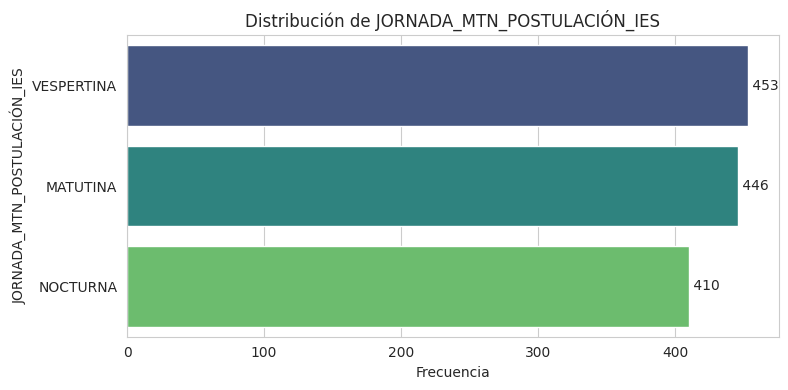


Estadísticas para JORNADA_MTN_POSTULACIÓN_IES:
Total de categorías: 3
Total de registros: 1309

Categorías y sus frecuencias:
JORNADA_MTN_POSTULACIÓN_IES
VESPERTINA    453
MATUTINA      446
NOCTURNA      410
Name: count, dtype: int64


<ipython-input-92-b704f7ceef97>:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x=value_counts.values, y=value_counts.index, orient='h', palette='viridis')


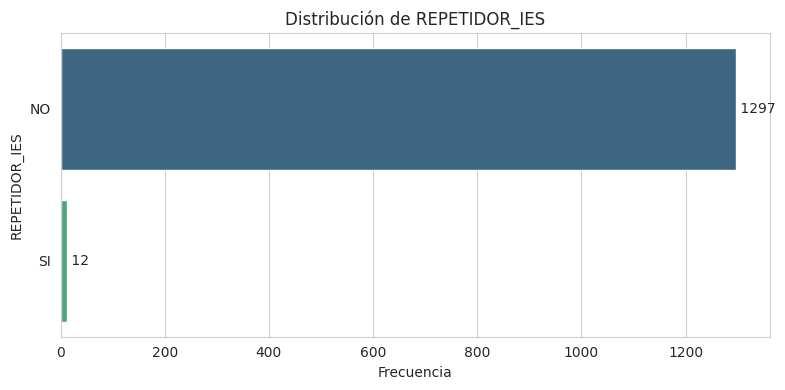


Estadísticas para REPETIDOR_IES:
Total de categorías: 2
Total de registros: 1309

Categorías y sus frecuencias:
REPETIDOR_IES
NO    1297
SI      12
Name: count, dtype: int64


<ipython-input-92-b704f7ceef97>:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x=value_counts.values, y=value_counts.index, orient='h', palette='viridis')


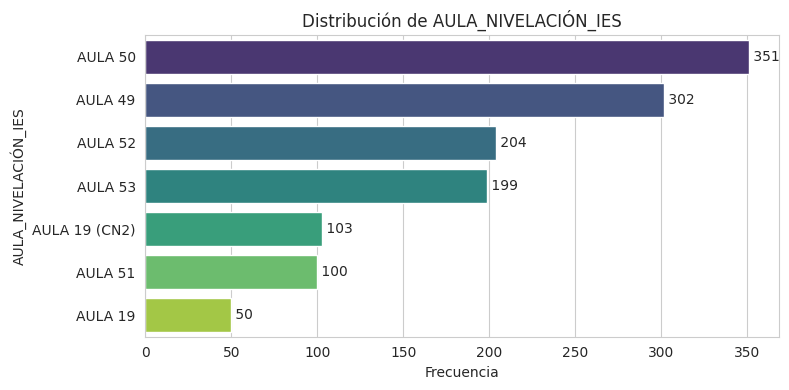


Estadísticas para AULA_NIVELACIÓN_IES:
Total de categorías: 7
Total de registros: 1309

Categorías y sus frecuencias:
AULA_NIVELACIÓN_IES
AULA 50          351
AULA 49          302
AULA 52          204
AULA 53          199
AULA 19 (CN2)    103
AULA 51          100
AULA 19           50
Name: count, dtype: int64


<ipython-input-92-b704f7ceef97>:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x=value_counts.values, y=value_counts.index, orient='h', palette='viridis')


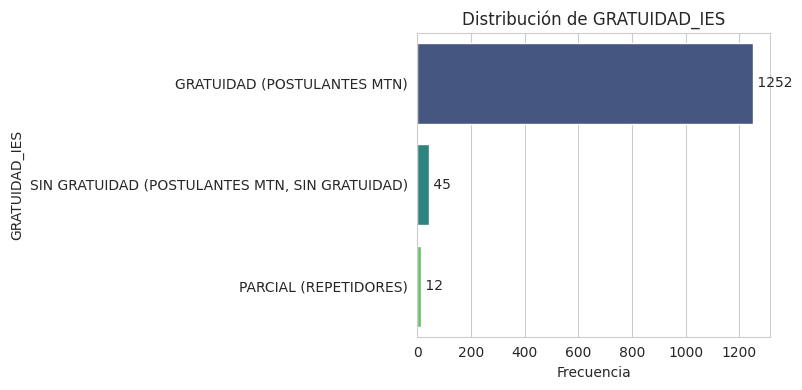


Estadísticas para GRATUIDAD_IES:
Total de categorías: 3
Total de registros: 1309

Categorías y sus frecuencias:
GRATUIDAD_IES
GRATUIDAD (POSTULANTES MTN)                       1252
SIN GRATUIDAD (POSTULANTES MTN, SIN GRATUIDAD)      45
PARCIAL (REPETIDORES)                               12
Name: count, dtype: int64


<ipython-input-92-b704f7ceef97>:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x=value_counts.values, y=value_counts.index, orient='h', palette='viridis')


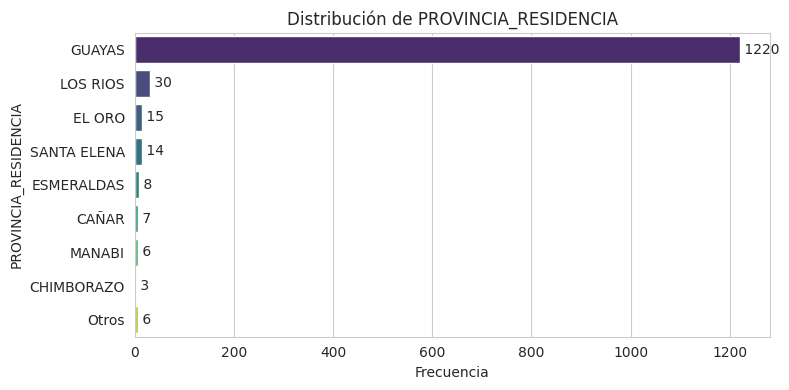


Estadísticas para PROVINCIA_RESIDENCIA:
Total de categorías: 9
Total de registros: 1309

Categorías y sus frecuencias:
GUAYAS         1220
LOS RIOS         30
EL ORO           15
SANTA ELENA      14
ESMERALDAS        8
CAÑAR             7
MANABI            6
CHIMBORAZO        3
Otros             6
dtype: int64


<ipython-input-92-b704f7ceef97>:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x=value_counts.values, y=value_counts.index, orient='h', palette='viridis')


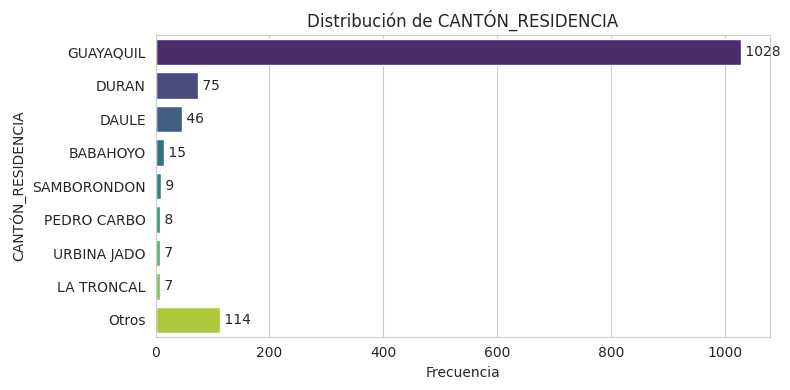


Estadísticas para CANTÓN_RESIDENCIA:
Total de categorías: 9
Total de registros: 1309

Categorías y sus frecuencias:
GUAYAQUIL      1028
DURAN            75
DAULE            46
BABAHOYO         15
SAMBORONDON       9
PEDRO CARBO       8
URBINA JADO       7
LA TRONCAL        7
Otros           114
dtype: int64


<ipython-input-92-b704f7ceef97>:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x=value_counts.values, y=value_counts.index, orient='h', palette='viridis')


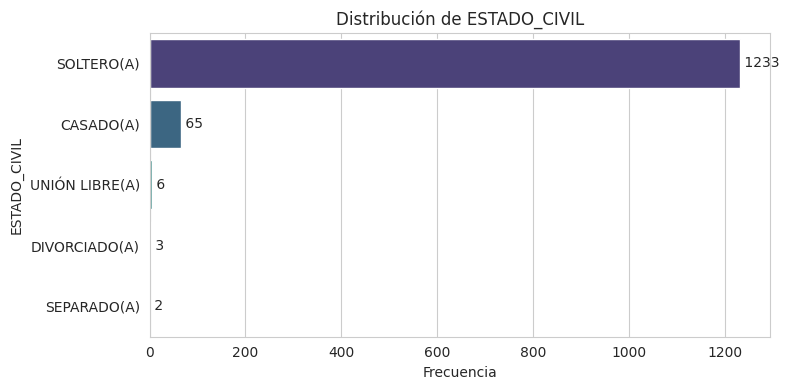


Estadísticas para ESTADO_CIVIL:
Total de categorías: 5
Total de registros: 1309

Categorías y sus frecuencias:
ESTADO_CIVIL
SOLTERO(A)        1233
CASADO(A)           65
UNIÓN LIBRE(A)       6
DIVORCIADO(A)        3
SEPARADO(A)          2
Name: count, dtype: int64


<ipython-input-92-b704f7ceef97>:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x=value_counts.values, y=value_counts.index, orient='h', palette='viridis')


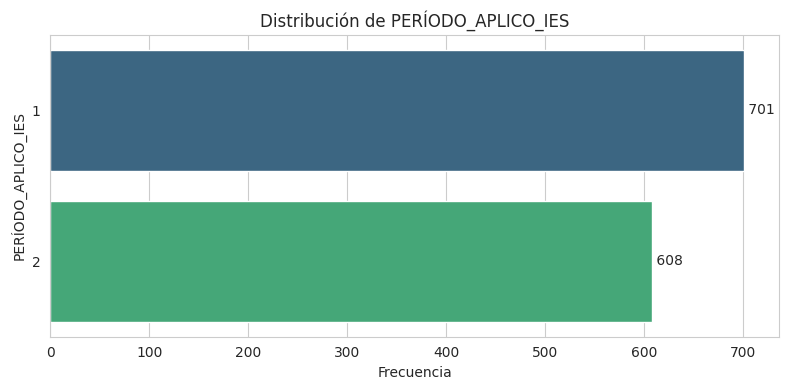


Estadísticas para PERÍODO_APLICO_IES:
Total de categorías: 2
Total de registros: 1309

Categorías y sus frecuencias:
PERÍODO_APLICO_IES
1    701
2    608
Name: count, dtype: int64


<ipython-input-92-b704f7ceef97>:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x=value_counts.values, y=value_counts.index, orient='h', palette='viridis')


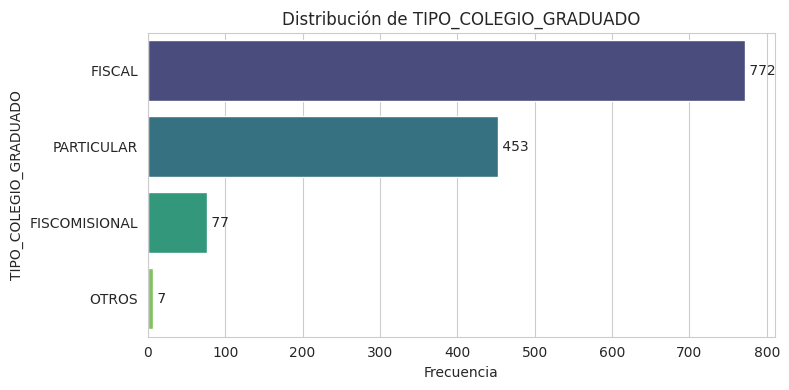


Estadísticas para TIPO_COLEGIO_GRADUADO:
Total de categorías: 4
Total de registros: 1309

Categorías y sus frecuencias:
TIPO_COLEGIO_GRADUADO
FISCAL           772
PARTICULAR       453
FISCOMISIONAL     77
OTROS              7
Name: count, dtype: int64


<ipython-input-92-b704f7ceef97>:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x=value_counts.values, y=value_counts.index, orient='h', palette='viridis')


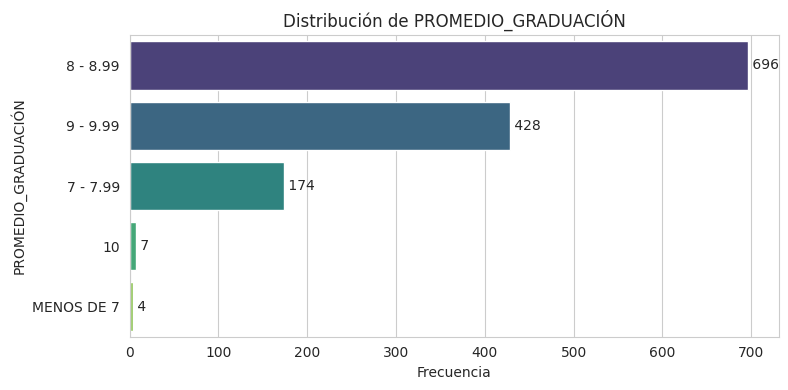


Estadísticas para PROMEDIO_GRADUACIÓN:
Total de categorías: 5
Total de registros: 1309

Categorías y sus frecuencias:
PROMEDIO_GRADUACIÓN
8 - 8.99      696
9 - 9.99      428
7 - 7.99      174
10              7
MENOS DE 7      4
Name: count, dtype: int64


<ipython-input-92-b704f7ceef97>:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x=value_counts.values, y=value_counts.index, orient='h', palette='viridis')


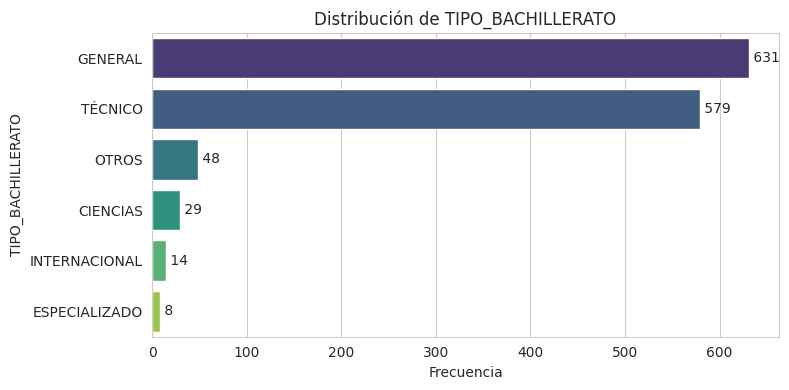


Estadísticas para TIPO_BACHILLERATO:
Total de categorías: 6
Total de registros: 1309

Categorías y sus frecuencias:
TIPO_BACHILLERATO
GENERAL          631
TÉCNICO          579
OTROS             48
CIENCIAS          29
INTERNACIONAL     14
ESPECIALIZADO      8
Name: count, dtype: int64


<ipython-input-92-b704f7ceef97>:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x=value_counts.values, y=value_counts.index, orient='h', palette='viridis')


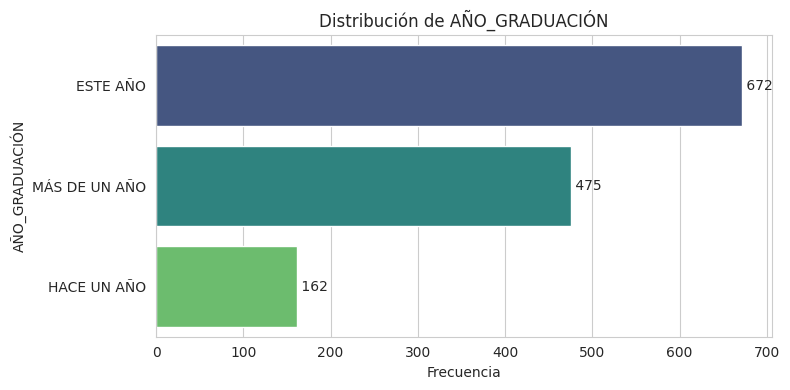


Estadísticas para AÑO_GRADUACIÓN:
Total de categorías: 3
Total de registros: 1309

Categorías y sus frecuencias:
AÑO_GRADUACIÓN
ESTE AÑO         672
MÁS DE UN AÑO    475
HACE UN AÑO      162
Name: count, dtype: int64


<ipython-input-92-b704f7ceef97>:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x=value_counts.values, y=value_counts.index, orient='h', palette='viridis')


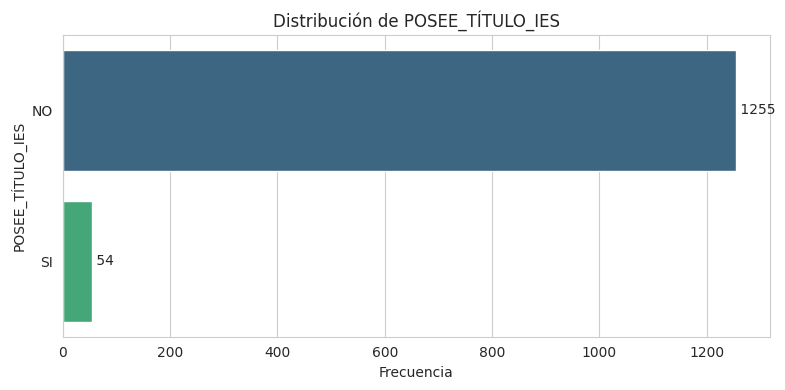


Estadísticas para POSEE_TÍTULO_IES:
Total de categorías: 2
Total de registros: 1309

Categorías y sus frecuencias:
POSEE_TÍTULO_IES
NO    1255
SI      54
Name: count, dtype: int64


<ipython-input-92-b704f7ceef97>:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x=value_counts.values, y=value_counts.index, orient='h', palette='viridis')


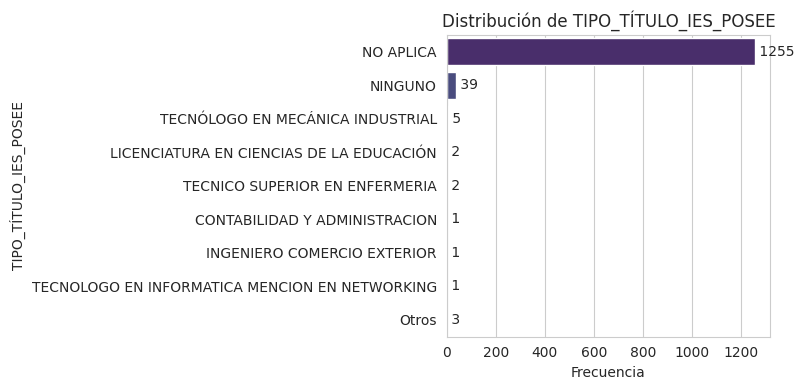


Estadísticas para TIPO_TÍTULO_IES_POSEE:
Total de categorías: 9
Total de registros: 1309

Categorías y sus frecuencias:
NO APLICA                                         1255
NINGUNO                                             39
TECNÓLOGO EN MECÁNICA INDUSTRIAL                     5
LICENCIATURA EN CIENCIAS DE LA EDUCACIÓN             2
TECNICO SUPERIOR EN ENFERMERIA                       2
CONTABILIDAD Y ADMINISTRACION                        1
INGENIERO COMERCIO EXTERIOR                          1
TECNOLOGO EN INFORMATICA MENCION EN NETWORKING       1
Otros                                                3
dtype: int64


<ipython-input-92-b704f7ceef97>:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x=value_counts.values, y=value_counts.index, orient='h', palette='viridis')


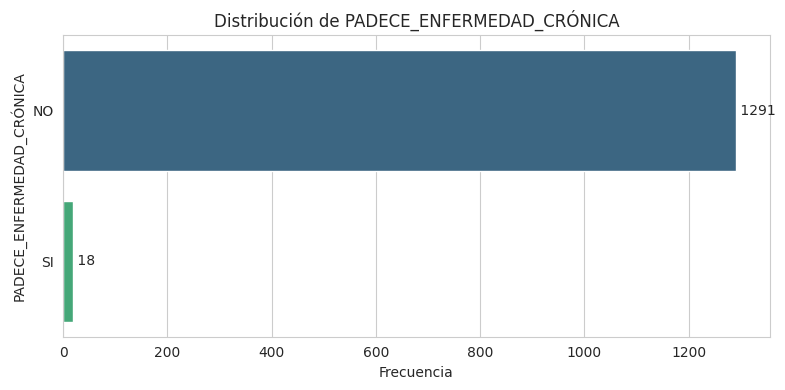


Estadísticas para PADECE_ENFERMEDAD_CRÓNICA:
Total de categorías: 2
Total de registros: 1309

Categorías y sus frecuencias:
PADECE_ENFERMEDAD_CRÓNICA
NO    1291
SI      18
Name: count, dtype: int64


<ipython-input-92-b704f7ceef97>:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x=value_counts.values, y=value_counts.index, orient='h', palette='viridis')


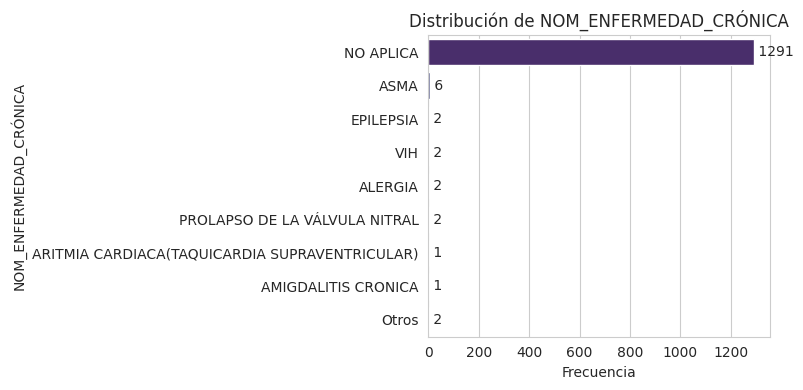


Estadísticas para NOM_ENFERMEDAD_CRÓNICA:
Total de categorías: 9
Total de registros: 1309

Categorías y sus frecuencias:
NO APLICA                                         1291
ASMA                                                 6
EPILEPSIA                                            2
VIH                                                  2
ALERGIA                                              2
PROLAPSO DE LA VÁLVULA NITRAL                        2
ARITMIA CARDIACA(TAQUICARDIA SUPRAVENTRICULAR)       1
AMIGDALITIS CRONICA                                  1
Otros                                                2
dtype: int64


<ipython-input-92-b704f7ceef97>:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x=value_counts.values, y=value_counts.index, orient='h', palette='viridis')


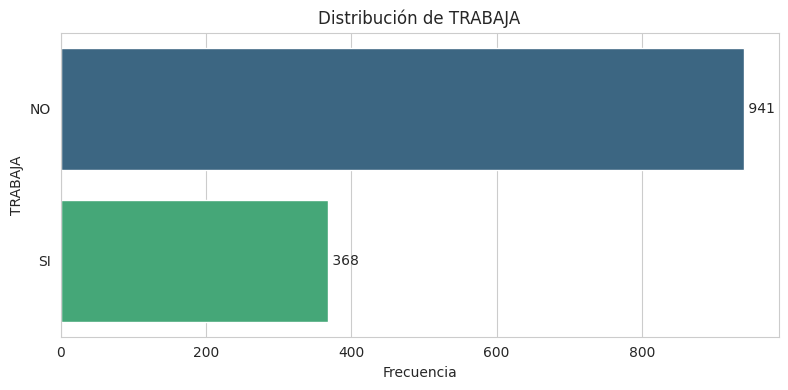


Estadísticas para TRABAJA:
Total de categorías: 2
Total de registros: 1309

Categorías y sus frecuencias:
TRABAJA
NO    941
SI    368
Name: count, dtype: int64


<ipython-input-92-b704f7ceef97>:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x=value_counts.values, y=value_counts.index, orient='h', palette='viridis')


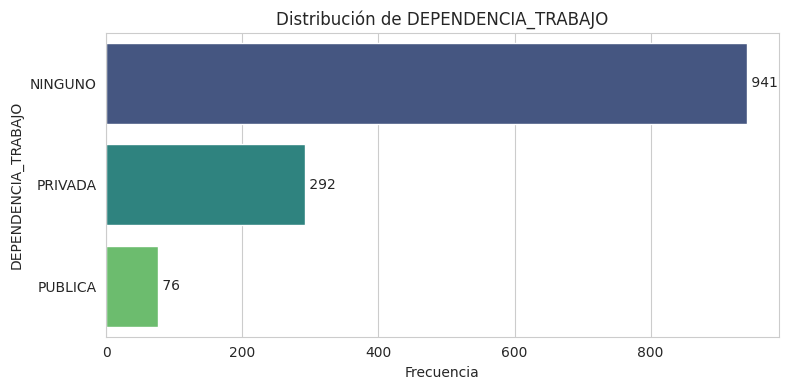


Estadísticas para DEPENDENCIA_TRABAJO:
Total de categorías: 3
Total de registros: 1309

Categorías y sus frecuencias:
DEPENDENCIA_TRABAJO
NINGUNO    941
PRIVADA    292
PUBLICA     76
Name: count, dtype: int64


<ipython-input-92-b704f7ceef97>:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x=value_counts.values, y=value_counts.index, orient='h', palette='viridis')


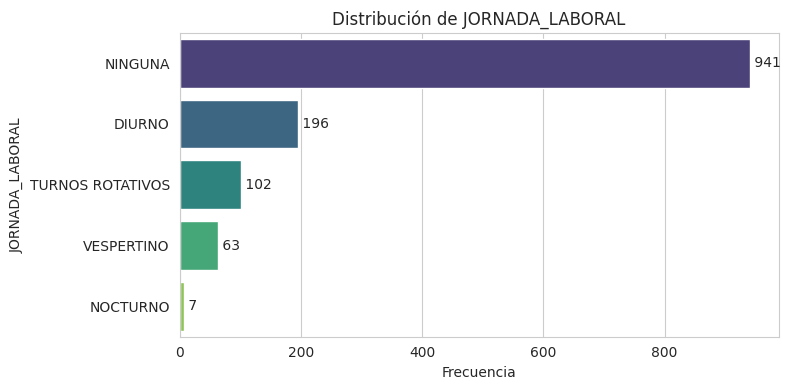


Estadísticas para JORNADA_LABORAL:
Total de categorías: 5
Total de registros: 1309

Categorías y sus frecuencias:
JORNADA_LABORAL
NINGUNA             941
DIURNO              196
TURNOS ROTATIVOS    102
VESPERTINO           63
NOCTURNO              7
Name: count, dtype: int64


<ipython-input-92-b704f7ceef97>:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x=value_counts.values, y=value_counts.index, orient='h', palette='viridis')


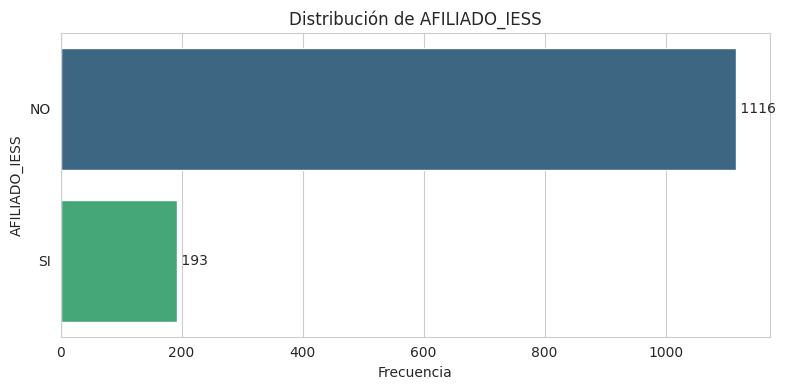


Estadísticas para AFILIADO_IESS:
Total de categorías: 2
Total de registros: 1309

Categorías y sus frecuencias:
AFILIADO_IESS
NO    1116
SI     193
Name: count, dtype: int64


<ipython-input-92-b704f7ceef97>:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x=value_counts.values, y=value_counts.index, orient='h', palette='viridis')


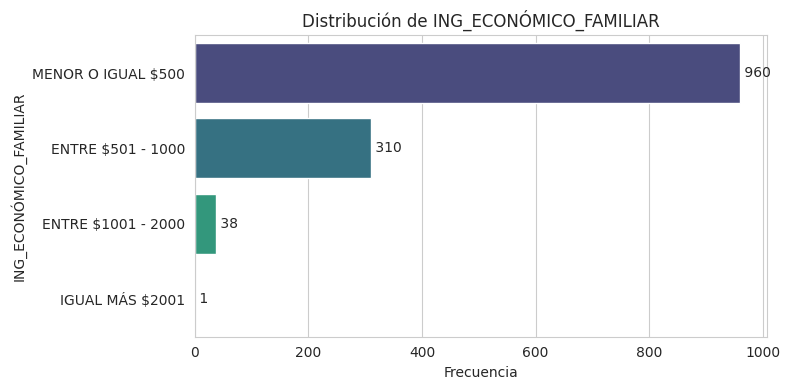


Estadísticas para ING_ECONÓMICO_FAMILIAR:
Total de categorías: 4
Total de registros: 1309

Categorías y sus frecuencias:
ING_ECONÓMICO_FAMILIAR
MENOR O IGUAL $500    960
ENTRE $501 - 1000     310
ENTRE $1001 - 2000     38
IGUAL MÁS $2001         1
Name: count, dtype: int64


<ipython-input-92-b704f7ceef97>:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x=value_counts.values, y=value_counts.index, orient='h', palette='viridis')


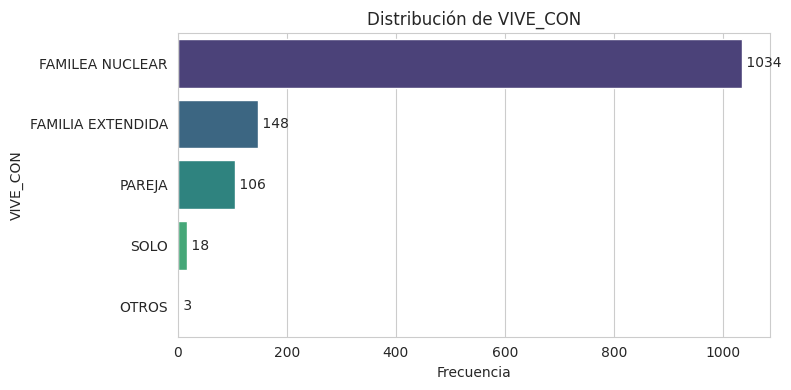


Estadísticas para VIVE_CON:
Total de categorías: 5
Total de registros: 1309

Categorías y sus frecuencias:
VIVE_CON
FAMILEA NUCLEAR      1034
FAMILIA EXTENDIDA     148
PAREJA                106
SOLO                   18
OTROS                   3
Name: count, dtype: int64


<ipython-input-92-b704f7ceef97>:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x=value_counts.values, y=value_counts.index, orient='h', palette='viridis')


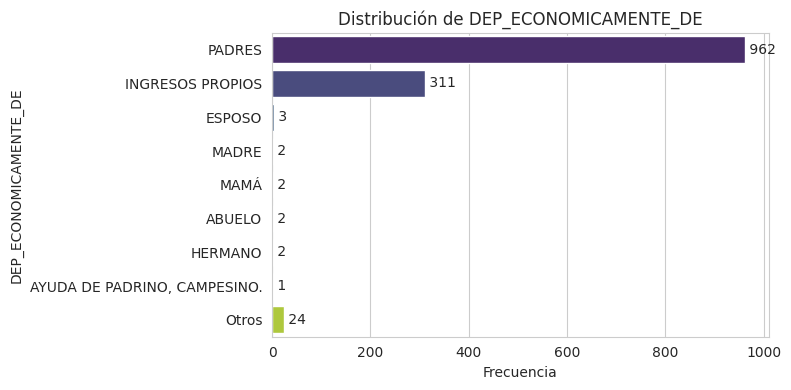


Estadísticas para DEP_ECONOMICAMENTE_DE:
Total de categorías: 9
Total de registros: 1309

Categorías y sus frecuencias:
PADRES                          962
INGRESOS PROPIOS                311
ESPOSO                            3
MADRE                             2
MAMÁ                              2
ABUELO                            2
HERMANO                           2
AYUDA DE PADRINO, CAMPESINO.      1
Otros                            24
dtype: int64


<ipython-input-92-b704f7ceef97>:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x=value_counts.values, y=value_counts.index, orient='h', palette='viridis')


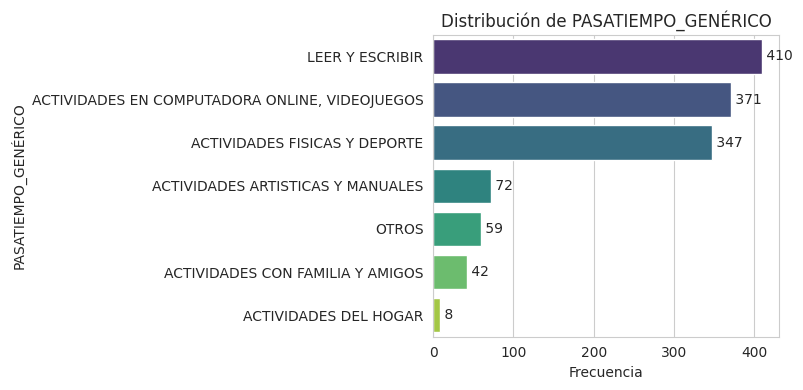


Estadísticas para PASATIEMPO_GENÉRICO:
Total de categorías: 7
Total de registros: 1309

Categorías y sus frecuencias:
PASATIEMPO_GENÉRICO
LEER Y ESCRIBIR                                   410
ACTIVIDADES EN COMPUTADORA ONLINE, VIDEOJUEGOS    371
ACTIVIDADES FISICAS Y DEPORTE                     347
ACTIVIDADES ARTISTICAS Y MANUALES                  72
OTROS                                              59
ACTIVIDADES CON FAMILIA Y AMIGOS                   42
ACTIVIDADES DEL HOGAR                               8
Name: count, dtype: int64


<ipython-input-92-b704f7ceef97>:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x=value_counts.values, y=value_counts.index, orient='h', palette='viridis')


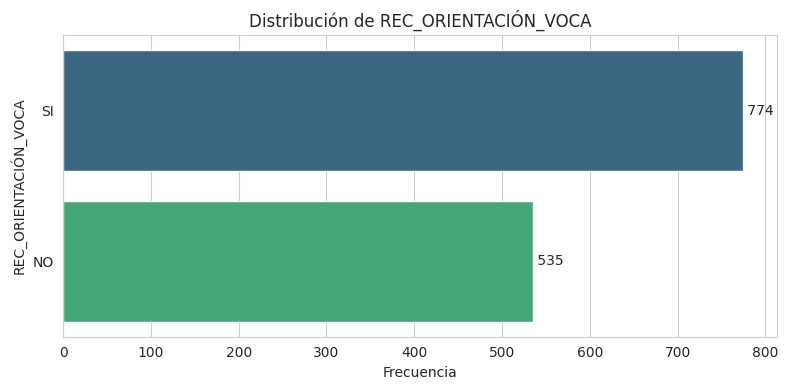


Estadísticas para REC_ORIENTACIÓN_VOCA:
Total de categorías: 2
Total de registros: 1309

Categorías y sus frecuencias:
REC_ORIENTACIÓN_VOCA
SI    774
NO    535
Name: count, dtype: int64


<ipython-input-92-b704f7ceef97>:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x=value_counts.values, y=value_counts.index, orient='h', palette='viridis')


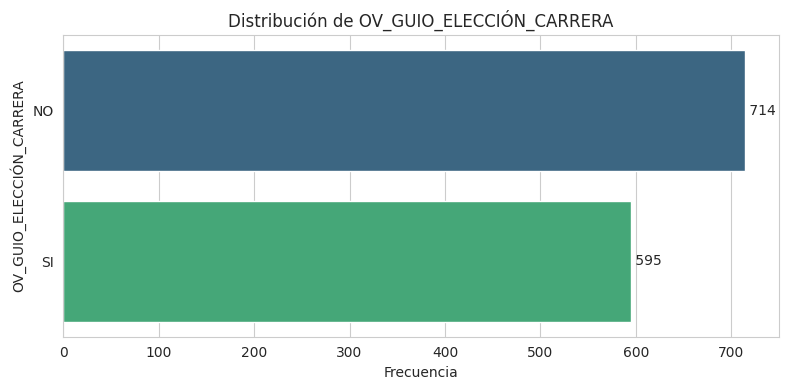


Estadísticas para OV_GUIO_ELECCIÓN_CARRERA:
Total de categorías: 2
Total de registros: 1309

Categorías y sus frecuencias:
OV_GUIO_ELECCIÓN_CARRERA
NO    714
SI    595
Name: count, dtype: int64


<ipython-input-92-b704f7ceef97>:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x=value_counts.values, y=value_counts.index, orient='h', palette='viridis')


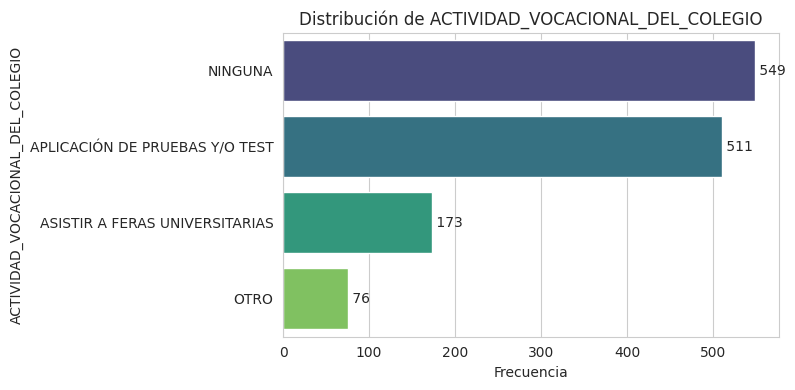


Estadísticas para ACTIVIDAD_VOCACIONAL_DEL_COLEGIO:
Total de categorías: 4
Total de registros: 1309

Categorías y sus frecuencias:
ACTIVIDAD_VOCACIONAL_DEL_COLEGIO
NINGUNA                           549
APLICACIÓN DE PRUEBAS Y/O TEST    511
ASISTIR A FERAS UNIVERSITARIAS    173
OTRO                               76
Name: count, dtype: int64


<ipython-input-92-b704f7ceef97>:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x=value_counts.values, y=value_counts.index, orient='h', palette='viridis')


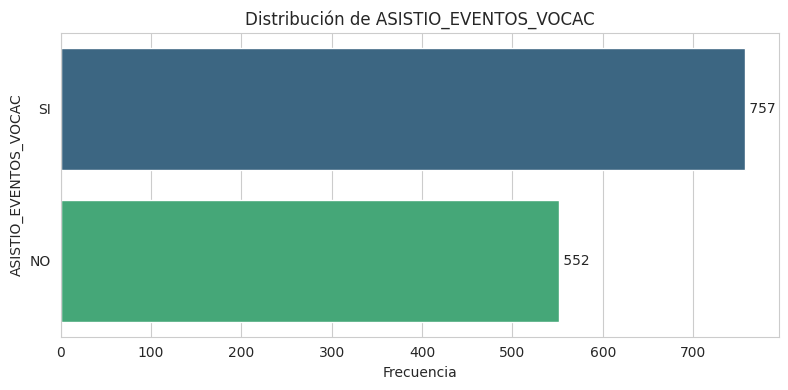


Estadísticas para ASISTIO_EVENTOS_VOCAC:
Total de categorías: 2
Total de registros: 1309

Categorías y sus frecuencias:
ASISTIO_EVENTOS_VOCAC
SI    757
NO    552
Name: count, dtype: int64


<ipython-input-92-b704f7ceef97>:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x=value_counts.values, y=value_counts.index, orient='h', palette='viridis')


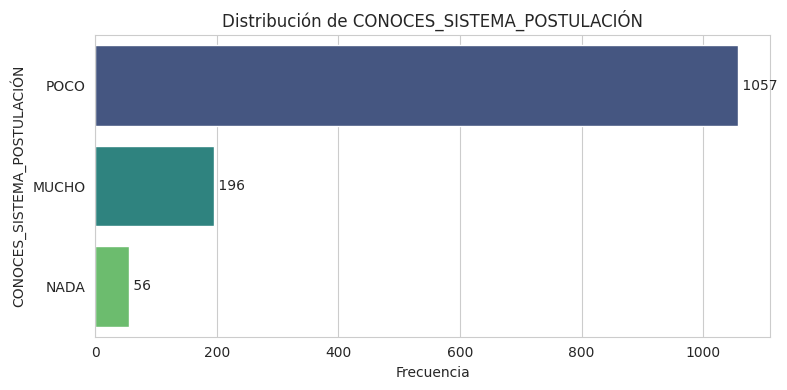


Estadísticas para CONOCES_SISTEMA_POSTULACIÓN:
Total de categorías: 3
Total de registros: 1309

Categorías y sus frecuencias:
CONOCES_SISTEMA_POSTULACIÓN
POCO     1057
MUCHO     196
NADA       56
Name: count, dtype: int64


<ipython-input-92-b704f7ceef97>:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x=value_counts.values, y=value_counts.index, orient='h', palette='viridis')


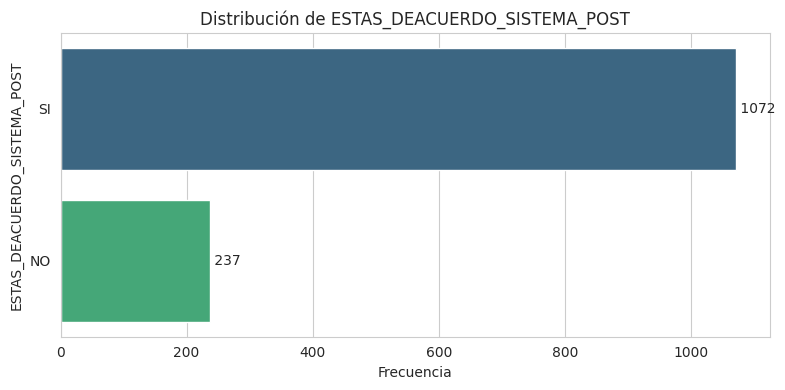


Estadísticas para ESTAS_DEACUERDO_SISTEMA_POST:
Total de categorías: 2
Total de registros: 1309

Categorías y sus frecuencias:
ESTAS_DEACUERDO_SISTEMA_POST
SI    1072
NO     237
Name: count, dtype: int64


<ipython-input-92-b704f7ceef97>:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x=value_counts.values, y=value_counts.index, orient='h', palette='viridis')


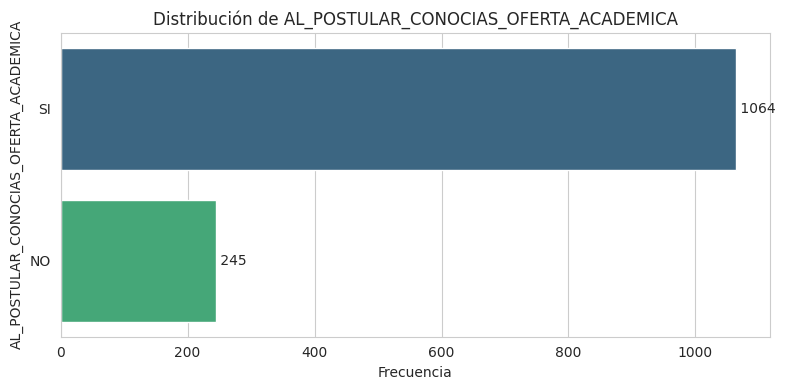


Estadísticas para AL_POSTULAR_CONOCIAS_OFERTA_ACADEMICA:
Total de categorías: 2
Total de registros: 1309

Categorías y sus frecuencias:
AL_POSTULAR_CONOCIAS_OFERTA_ACADEMICA
SI    1064
NO     245
Name: count, dtype: int64


<ipython-input-92-b704f7ceef97>:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x=value_counts.values, y=value_counts.index, orient='h', palette='viridis')


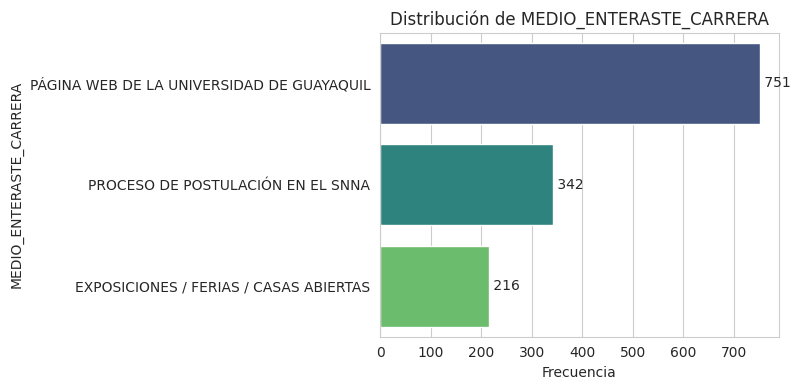


Estadísticas para MEDIO_ENTERASTE_CARRERA:
Total de categorías: 3
Total de registros: 1309

Categorías y sus frecuencias:
MEDIO_ENTERASTE_CARRERA
PÁGINA WEB DE LA UNIVERSIDAD DE GUAYAQUIL    751
PROCESO DE POSTULACIÓN EN EL SNNA            342
EXPOSICIONES / FERIAS / CASAS ABIERTAS       216
Name: count, dtype: int64


<ipython-input-92-b704f7ceef97>:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x=value_counts.values, y=value_counts.index, orient='h', palette='viridis')


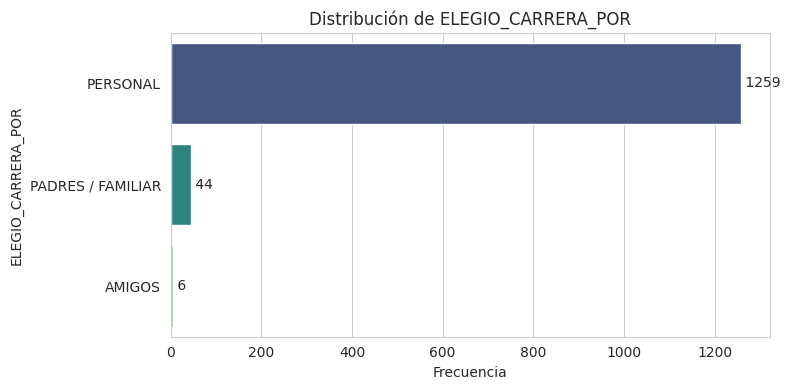


Estadísticas para ELEGIO_CARRERA_POR:
Total de categorías: 3
Total de registros: 1309

Categorías y sus frecuencias:
ELEGIO_CARRERA_POR
PERSONAL             1259
PADRES / FAMILIAR      44
AMIGOS                  6
Name: count, dtype: int64


<ipython-input-92-b704f7ceef97>:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x=value_counts.values, y=value_counts.index, orient='h', palette='viridis')


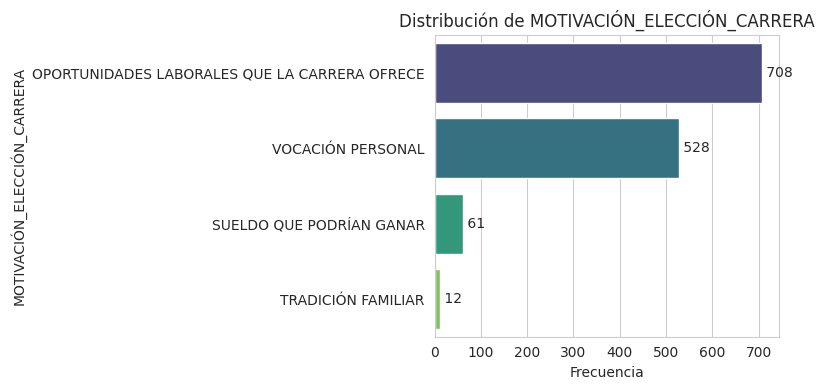


Estadísticas para MOTIVACIÓN_ELECCIÓN_CARRERA:
Total de categorías: 4
Total de registros: 1309

Categorías y sus frecuencias:
MOTIVACIÓN_ELECCIÓN_CARRERA
OPORTUNIDADES LABORALES QUE LA CARRERA OFRECE    708
VOCACIÓN PERSONAL                                528
SUELDO QUE PODRÍAN GANAR                          61
TRADICIÓN FAMILIAR                                12
Name: count, dtype: int64


<ipython-input-92-b704f7ceef97>:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x=value_counts.values, y=value_counts.index, orient='h', palette='viridis')


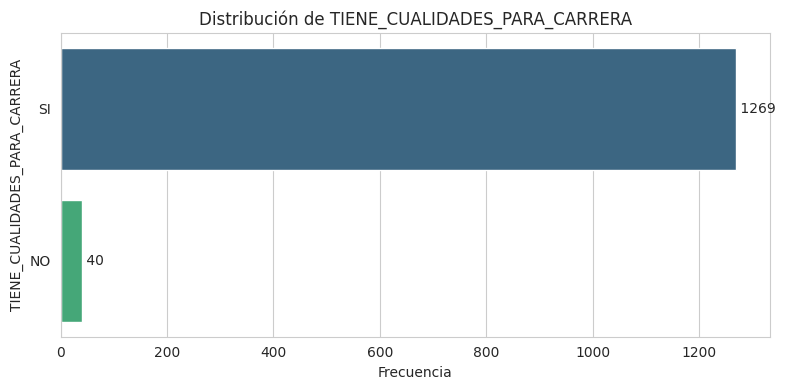


Estadísticas para TIENE_CUALIDADES_PARA_CARRERA:
Total de categorías: 2
Total de registros: 1309

Categorías y sus frecuencias:
TIENE_CUALIDADES_PARA_CARRERA
SI    1269
NO      40
Name: count, dtype: int64


<ipython-input-92-b704f7ceef97>:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x=value_counts.values, y=value_counts.index, orient='h', palette='viridis')


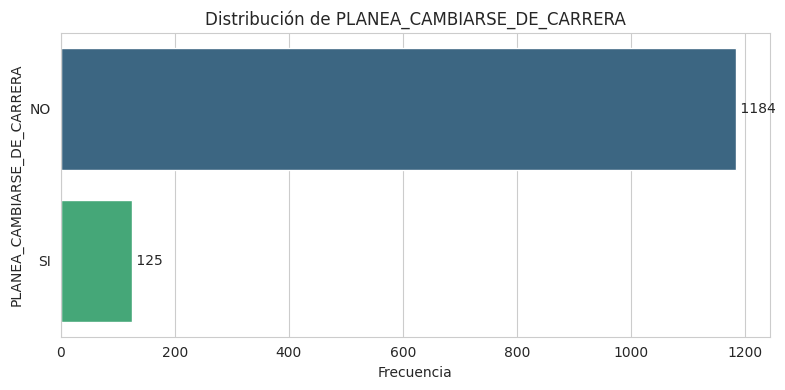


Estadísticas para PLANEA_CAMBIARSE_DE_CARRERA:
Total de categorías: 2
Total de registros: 1309

Categorías y sus frecuencias:
PLANEA_CAMBIARSE_DE_CARRERA
NO    1184
SI     125
Name: count, dtype: int64


<ipython-input-92-b704f7ceef97>:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x=value_counts.values, y=value_counts.index, orient='h', palette='viridis')


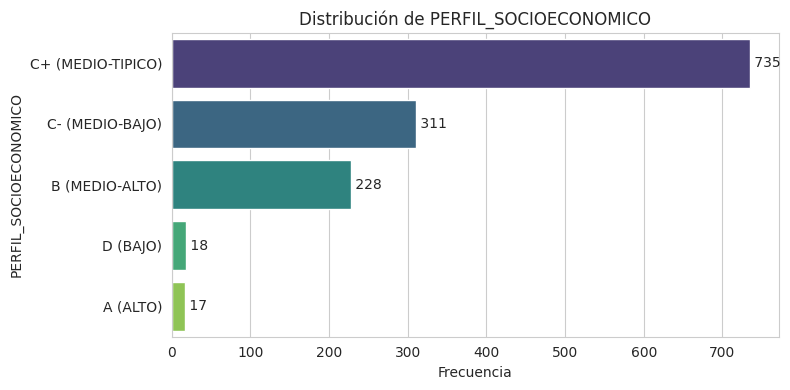


Estadísticas para PERFIL_SOCIOECONOMICO:
Total de categorías: 5
Total de registros: 1309

Categorías y sus frecuencias:
PERFIL_SOCIOECONOMICO
C+ (MEDIO-TIPICO)    735
C- (MEDIO-BAJO)      311
B (MEDIO-ALTO)       228
D (BAJO)              18
A (ALTO)              17
Name: count, dtype: int64


<ipython-input-92-b704f7ceef97>:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x=value_counts.values, y=value_counts.index, orient='h', palette='viridis')


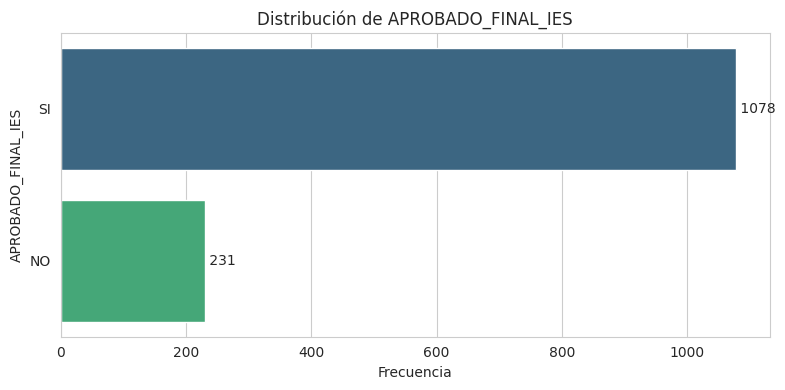


Estadísticas para APROBADO_FINAL_IES:
Total de categorías: 2
Total de registros: 1309

Categorías y sus frecuencias:
APROBADO_FINAL_IES
SI    1078
NO     231
Name: count, dtype: int64


<ipython-input-92-b704f7ceef97>:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x=value_counts.values, y=value_counts.index, orient='h', palette='viridis')


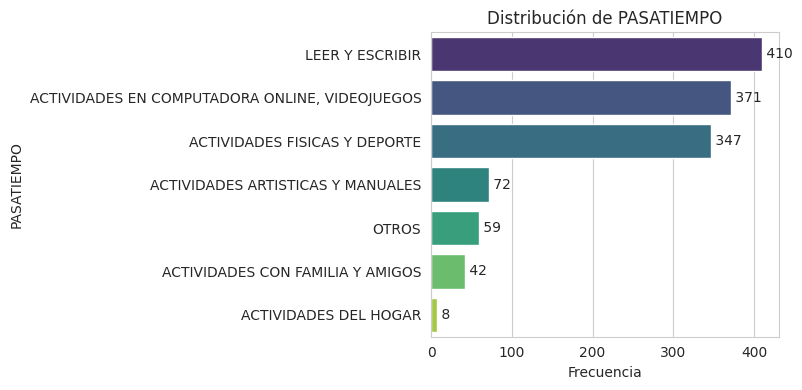


Estadísticas para PASATIEMPO:
Total de categorías: 7
Total de registros: 1309

Categorías y sus frecuencias:
PASATIEMPO
LEER Y ESCRIBIR                                   410
ACTIVIDADES EN COMPUTADORA ONLINE, VIDEOJUEGOS    371
ACTIVIDADES FISICAS Y DEPORTE                     347
ACTIVIDADES ARTISTICAS Y MANUALES                  72
OTROS                                              59
ACTIVIDADES CON FAMILIA Y AMIGOS                   42
ACTIVIDADES DEL HOGAR                               8
Name: count, dtype: int64


In [92]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

def plot_horizontal_bar(df, column):
    # Se cuenta las frecuencias de cada categoría, incluyendo NaN
    value_counts = df[column].value_counts(dropna=False)

    # Se renombra NaN a 'Sin Datos' para mejor visualización
    if pd.isna(value_counts.index).any():
        value_counts = value_counts.rename({pd.NA: 'Sin Datos'})

    # Si hay más de 9 categorías, se agrupa las menos frecuentes en "Otros"
    if len(value_counts) > 9:
        top_8 = value_counts.nlargest(8)
        others = pd.Series({'Otros': value_counts.nsmallest(len(value_counts) - 8).sum()})
        value_counts = pd.concat([top_8, others])

    # Se ordena los valores de mayor a menor, manteniendo "Otros" al final
    if 'Otros' in value_counts.index:
        others_value = value_counts['Otros']
        value_counts = value_counts.sort_values(ascending=False)
        value_counts = value_counts.drop('Otros')
        value_counts['Otros'] = others_value
    else:
        value_counts = value_counts.sort_values(ascending=False)

    # Se crea el gráfico
    plt.figure(figsize=(8, max(4, len(value_counts)*0.4)))
    ax = sns.barplot(x=value_counts.values, y=value_counts.index, orient='h', palette='viridis')

    # Se añade las etiquetas de valor en las barras
    for i, v in enumerate(value_counts.values):
        ax.text(v, i, f' {v}', va='center')

    plt.title(f'Distribución de {column}')
    plt.xlabel('Frecuencia')
    plt.ylabel(column)
    plt.tight_layout()
    plt.show()

    # Imprimir estadísticas
    print(f"\nEstadísticas para {column}:")
    print(f"Total de categorías: {len(value_counts)}")
    print(f"Total de registros: {df[column].shape[0]}")
    print("\nCategorías y sus frecuencias:")
    print(value_counts)

# Se identifica columnas categóricas
categorical_columns = df_consolidado2.select_dtypes(include=['object', 'category']).columns

# Se crea gráficos para columnas categóricas
for column in categorical_columns:
    plot_horizontal_bar(df_consolidado2, column)


##**4.1. Validación de Multicolinealidad**

In [93]:
# Valido la correlación de las variables numericas para retirar las que poseen alta colinealidad

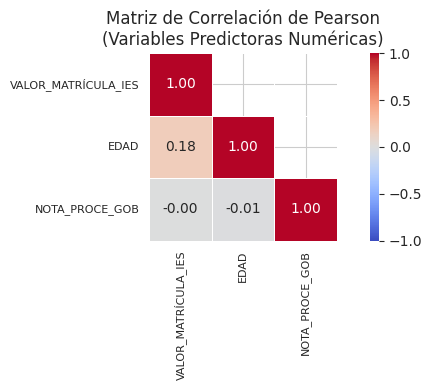

Variables predictoras numéricas con alta colinealidad (correlación > 0.7):


In [94]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Se selecciona solo las variables numéricas, excluyendo las variables objetivo y el año
numeric_columns = df_consolidado2.select_dtypes(include=['int64', 'float64']).columns
#, 'ASISTENCIA_FINA_IES', 'NOTA_FINAL_IES'
variables_objetivo = ['APROBADO_FINAL_IES']
#, 'CICLO'

variables_excluir = variables_objetivo + ['AÑO_INI_PERIODO','ID_ALUMNO', 'PORCENTAJE_DISCAPACIDAD']
predictor_columns = [col for col in numeric_columns if col not in variables_excluir]
df_numeric = df_consolidado2[predictor_columns]

# Se calcula la matriz de correlación
corr_matrix = df_numeric.corr()

# Se crea una máscara para la parte superior de la diagonal, excluyendo la diagonal principal
mask = np.triu(np.ones_like(corr_matrix, dtype=bool), k=1)

# Se crea la figura y los ejes
fig, ax = plt.subplots(figsize=(7, 4))

# Se crea el mapa de calor
sns.heatmap(corr_matrix,
            mask=mask,
            ax=ax,
            annot=True,
            fmt='.2f',
            cmap='coolwarm',
            vmin=-1,
            vmax=1,
            annot_kws={'size': 10},
            square=True,
            linewidths=0.5)

# Se ajusta el tamaño de las etiquetas de los ejes
plt.xticks(fontsize=8, rotation=90)
plt.yticks(fontsize=8, rotation=0)

# Se ajusta el título
plt.title('Matriz de Correlación de Pearson\n(Variables Predictoras Numéricas)', fontsize=12)

# Se ajusta los márgenes
plt.tight_layout()

# Se muestra el gráfico
plt.show()

# Se identifica las variables con alta colinealidad (umbral de 0.7)
high_corr = np.abs(corr_matrix) > 0.7
high_corr_vars = [(corr_matrix.index[i], corr_matrix.columns[j])
                  for i in range(len(corr_matrix.index))
                  for j in range(i+1, len(corr_matrix.columns))
                  if high_corr.iloc[i, j]]

print("Variables predictoras numéricas con alta colinealidad (correlación > 0.7):")
for var1, var2 in high_corr_vars:
    print(f"{var1} - {var2}: {corr_matrix.loc[var1, var2]:.2f}")

# Se analiza las correlaciones con las variables objetivo
for objetivo in variables_objetivo:
    if objetivo in numeric_columns:
        corr_with_target = df_consolidado2[predictor_columns + [objetivo]].corr()[objetivo].abs().sort_values(ascending=False)
        print(f"\nVariables numéricas más correlacionadas con '{objetivo}':")
        print(corr_with_target.head(10))  # Mostrando las top 10 correlaciones

        # Se visualiza las correlaciones con la variable objetivo
        plt.figure(figsize=(7, 4))
        ax = corr_with_target.head(10).plot(kind='bar')
        plt.title(f'Top 10 Variables Correlacionadas con {objetivo}', fontsize=14)
        plt.xlabel('Variables', fontsize=14)
        plt.ylabel('Correlación Absoluta', fontsize=14)
        plt.xticks(rotation=45, ha='right', fontsize=12)
        plt.tight_layout()
        plt.show()

Se identifica que no existe variables predictoras con alta correlación por lo cual no tenemos colinealidad, por lo que se conservan las variables numericas.

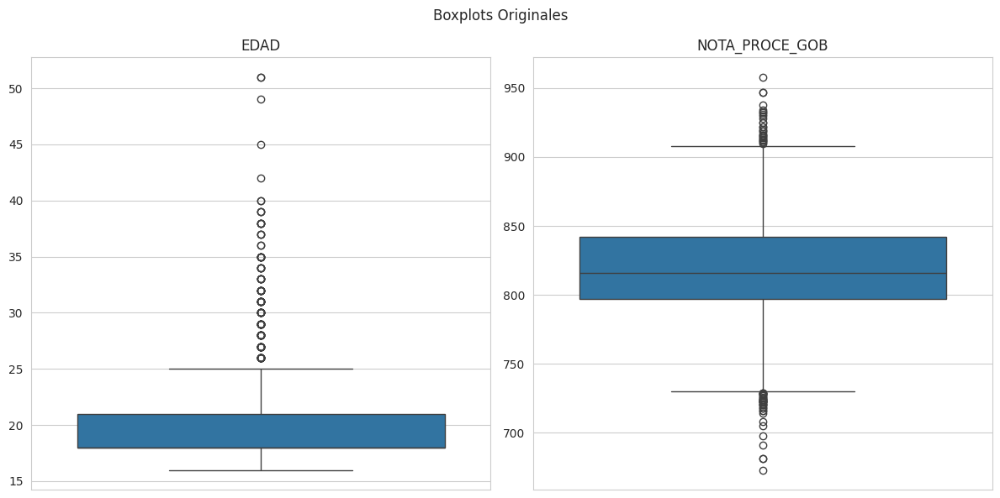

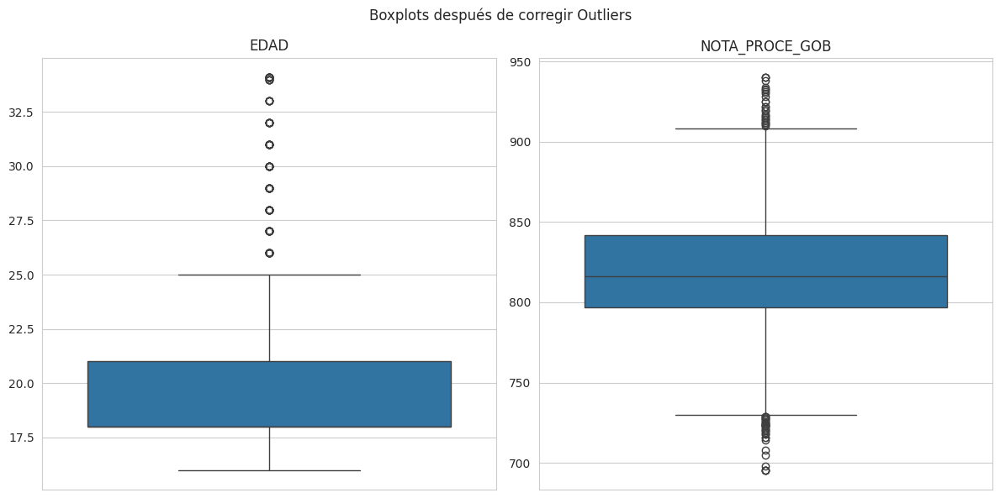

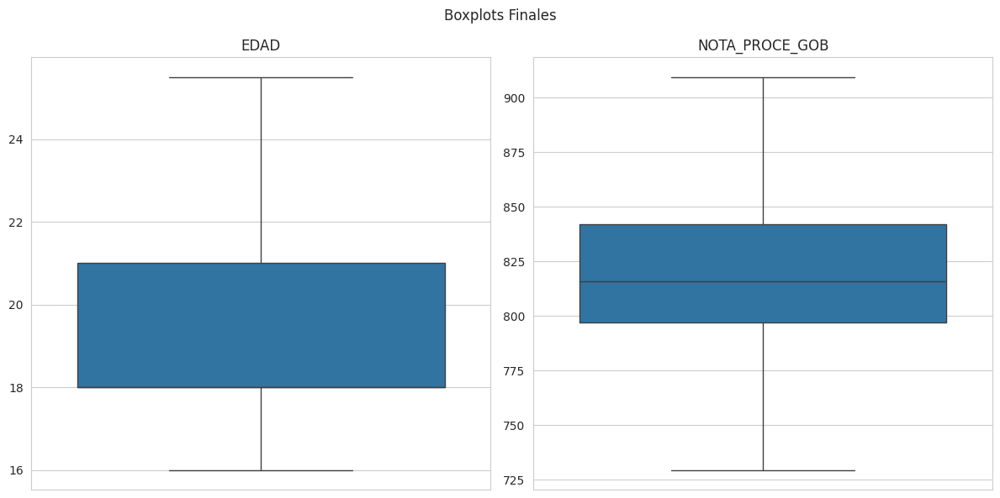

              EDAD  NOTA_PROCE_GOB
count  1309.000000     1309.000000
mean     19.728419      817.829259
std       2.897022       38.978064
min      16.000000      729.500000
25%      18.000000      797.000000
50%      18.000000      816.000000
75%      21.000000      842.000000
max      25.500000      909.500000


In [95]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

def plot_boxplots(df, columns, title):
    fig, axes = plt.subplots(1, 2, figsize=(12, 6))
    fig.suptitle(title)
    for i, col in enumerate(columns):
        sns.boxplot(y=df[col], ax=axes[i])
        axes[i].set_title(col)
        axes[i].set_ylabel('')
    plt.tight_layout()
    plt.show()

def correct_outliers(df, column, n_std=3):
    mean = df[column].mean()
    std = df[column].std()
    lower_bound = mean - n_std * std
    upper_bound = mean + n_std * std
    df[column] = np.clip(df[column], lower_bound, upper_bound)
    return df

# Columnas a corregir
columns_to_correct = ['EDAD', 'NOTA_PROCE_GOB']

# Se muestra los boxplots originales
plot_boxplots(df_consolidado2, columns_to_correct, "Boxplots Originales")

# Se correge los outliers
for col in columns_to_correct:
    df_consolidado2 = correct_outliers(df_consolidado2, col)

# Se muestra los boxplots después de corregir outliers
plot_boxplots(df_consolidado2, columns_to_correct, "Boxplots después de corregir Outliers")

# Se verifica y corrige nuevamente si es necesario
for col in columns_to_correct:
    Q1 = df_consolidado2[col].quantile(0.25)
    Q3 = df_consolidado2[col].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    df_consolidado2[col] = np.clip(df_consolidado2[col], lower_bound, upper_bound)

# Se muestra boxplots finales
plot_boxplots(df_consolidado2, columns_to_correct, "Boxplots Finales")

# Se imprime las estadísticas descriptivas
print(df_consolidado2[columns_to_correct].describe())

In [96]:
df_consolidado2.shape

(1309, 60)

In [97]:
df_consolidado2.columns

Index(['SEXO', 'ETNIA', 'DISCAPACIDAD', 'PORCENTAJE_DISCAPACIDAD',
       'JORNADA_COLEGIO', 'ZONA_COLEGIO', 'PROVINCIA_COLEGIO',
       'CANTÓN_COLEGIO', 'PARROQUIA_COLEGIO', 'TIPO_EDUCACIÓN_COLEGIO',
       'NIVEL_EDUCACIÓN_COLEGIO', 'SOSTENIMIENTO_COLEGIO', 'ÁREA_COLEGIO',
       'RÉGIMEN_ESCOLAR_COLEGIO', 'JURISDICCIÓN_COLEGIO', 'MODALIDAD_COLEGIO',
       'PARTICIPACIÓN_DOCENTE_COLEGIO', 'CARRERA_POSTULACIÓN_IES',
       'JORNADA_MTN_POSTULACIÓN_IES', 'REPETIDOR_IES', 'AULA_NIVELACIÓN_IES',
       'GRATUIDAD_IES', 'VALOR_MATRÍCULA_IES', 'EDAD', 'PROVINCIA_RESIDENCIA',
       'CANTÓN_RESIDENCIA', 'ESTADO_CIVIL', 'NOTA_PROCE_GOB',
       'PERÍODO_APLICO_IES', 'TIPO_COLEGIO_GRADUADO', 'PROMEDIO_GRADUACIÓN',
       'TIPO_BACHILLERATO', 'AÑO_GRADUACIÓN', 'POSEE_TÍTULO_IES',
       'TIPO_TÍTULO_IES_POSEE', 'PADECE_ENFERMEDAD_CRÓNICA',
       'NOM_ENFERMEDAD_CRÓNICA', 'TRABAJA', 'DEPENDENCIA_TRABAJO',
       'JORNADA_LABORAL', 'AFILIADO_IESS', 'ING_ECONÓMICO_FAMILIAR',
       'VIVE_CON',

In [98]:
##Se verifica que la codificación con LaberEnconder funcione en cada variables categoricas**
#Esto se realizo dado que se detecto que cuando llegan valores con mezcla inidial
# de numeros y luego simbolos, el cmompilados de pyhton se confunde y no lo logra,
#debiendose primero combertir el tipo de dato object a str, para que se pueda procesar.

In [99]:
import pandas as pd
import numpy as np
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split

# Paso 1: Separar las variables X y Y
X = df_consolidado2.drop('APROBADO_FINAL_IES', axis=1)
y = df_consolidado2['APROBADO_FINAL_IES']

In [100]:
from sklearn.preprocessing import LabelEncoder
import pandas as pd

# Se crea una copia del DataFrame para evitar modificar el original
df_consolidado2_encoded = df_consolidado2.copy()

# Función para codificar variables categóricas y manejar errores
def encode_column(df, column):
    try:
        le = LabelEncoder()
        df[column] = le.fit_transform(df[column])
        print(f"Éxito al codificar la columna: {column}")
    except Exception as e:
        print(f"Error al codificar la columna: {column}. Error: {e}")
        if df[column].dtype == 'object':
            print(f"Posible solución: Verificar que la columna {column} contenga valores uniformemente categóricos.")


In [101]:
# Se codifica cada columna categórica individualmente
encode_column(df_consolidado2_encoded , 'SEXO')
encode_column(df_consolidado2_encoded , 'ETNIA')
encode_column(df_consolidado2_encoded , 'JORNADA_COLEGIO')
encode_column(df_consolidado2_encoded , 'ZONA_COLEGIO')
encode_column(df_consolidado2_encoded , 'PROVINCIA_COLEGIO')
encode_column(df_consolidado2_encoded , 'CANTÓN_COLEGIO')
encode_column(df_consolidado2_encoded , 'PARROQUIA_COLEGIO')
encode_column(df_consolidado2_encoded , 'TIPO_EDUCACIÓN_COLEGIO')
encode_column(df_consolidado2_encoded , 'NIVEL_EDUCACIÓN_COLEGIO')
encode_column(df_consolidado2_encoded , 'SOSTENIMIENTO_COLEGIO')
encode_column(df_consolidado2_encoded , 'ÁREA_COLEGIO')
encode_column(df_consolidado2_encoded , 'RÉGIMEN_ESCOLAR_COLEGIO')
encode_column(df_consolidado2_encoded , 'JURISDICCIÓN_COLEGIO')
encode_column(df_consolidado2_encoded , 'MODALIDAD_COLEGIO')
encode_column(df_consolidado2_encoded , 'PARTICIPACIÓN_DOCENTE_COLEGIO')
encode_column(df_consolidado2_encoded , 'CARRERA_POSTULACIÓN_IES')
encode_column(df_consolidado2_encoded , 'JORNADA_MTN_POSTULACIÓN_IES')
encode_column(df_consolidado2_encoded , 'PROVINCIA_RESIDENCIA')
encode_column(df_consolidado2_encoded , 'CANTÓN_RESIDENCIA')
encode_column(df_consolidado2_encoded , 'ESTADO_CIVIL')
encode_column(df_consolidado2_encoded , 'TIPO_COLEGIO_GRADUADO')
encode_column(df_consolidado2_encoded , 'PROMEDIO_GRADUACIÓN')
encode_column(df_consolidado2_encoded , 'TIPO_BACHILLERATO')
encode_column(df_consolidado2_encoded , 'AÑO_GRADUACIÓN')
encode_column(df_consolidado2_encoded , 'POSEE_TÍTULO_IES')
encode_column(df_consolidado2_encoded , 'TIPO_TÍTULO_IES_POSEE')
encode_column(df_consolidado2_encoded , 'PADECE_ENFERMEDAD_CRÓNICA')
encode_column(df_consolidado2_encoded , 'NOM_ENFERMEDAD_CRÓNICA')
encode_column(df_consolidado2_encoded , 'TRABAJA')
encode_column(df_consolidado2_encoded , 'DEPENDENCIA_TRABAJO')
encode_column(df_consolidado2_encoded, 'JORNADA_LABORAL')
encode_column(df_consolidado2_encoded , 'AFILIADO_IESS')
encode_column(df_consolidado2_encoded , 'ING_ECONÓMICO_FAMILIAR')
encode_column(df_consolidado2_encoded , 'VIVE_CON')
encode_column(df_consolidado2_encoded , 'DEP_ECONOMICAMENTE_DE')
encode_column(df_consolidado2_encoded , 'PASATIEMPO_GENÉRICO')
encode_column(df_consolidado2_encoded , 'REC_ORIENTACIÓN_VOCA')
encode_column(df_consolidado2_encoded , 'OV_GUIO_ELECCIÓN_CARRERA')
encode_column(df_consolidado2_encoded , 'ACTIVIDAD_VOCACIONAL_DEL_COLEGIO')
encode_column(df_consolidado2_encoded , 'ASISTIO_EVENTOS_VOCAC')
encode_column(df_consolidado2_encoded , 'CONOCES_SISTEMA_POSTULACIÓN')
encode_column(df_consolidado2_encoded , 'ESTAS_DEACUERDO_SISTEMA_POST')
encode_column(df_consolidado2_encoded , 'AL_POSTULAR_CONOCIAS_OFERTA_ACADEMICA')
encode_column(df_consolidado2_encoded , 'MEDIO_ENTERASTE_CARRERA')
encode_column(df_consolidado2_encoded , 'ELEGIO_CARRERA_POR')
encode_column(df_consolidado2_encoded , 'MOTIVACIÓN_ELECCIÓN_CARRERA')
encode_column(df_consolidado2_encoded , 'TIENE_CUALIDADES_PARA_CARRERA')
encode_column(df_consolidado2_encoded , 'PLANEA_CAMBIARSE_DE_CARRERA')
encode_column(df_consolidado2_encoded , 'PERFIL_SOCIOECONOMICO')
encode_column(df_consolidado2_encoded , 'APROBADO_FINAL_IES')


Éxito al codificar la columna: SEXO
Éxito al codificar la columna: ETNIA
Éxito al codificar la columna: JORNADA_COLEGIO
Éxito al codificar la columna: ZONA_COLEGIO
Éxito al codificar la columna: PROVINCIA_COLEGIO
Éxito al codificar la columna: CANTÓN_COLEGIO
Éxito al codificar la columna: PARROQUIA_COLEGIO
Éxito al codificar la columna: TIPO_EDUCACIÓN_COLEGIO
Éxito al codificar la columna: NIVEL_EDUCACIÓN_COLEGIO
Éxito al codificar la columna: SOSTENIMIENTO_COLEGIO
Éxito al codificar la columna: ÁREA_COLEGIO
Éxito al codificar la columna: RÉGIMEN_ESCOLAR_COLEGIO
Éxito al codificar la columna: JURISDICCIÓN_COLEGIO
Éxito al codificar la columna: MODALIDAD_COLEGIO
Éxito al codificar la columna: PARTICIPACIÓN_DOCENTE_COLEGIO
Éxito al codificar la columna: CARRERA_POSTULACIÓN_IES
Éxito al codificar la columna: JORNADA_MTN_POSTULACIÓN_IES
Éxito al codificar la columna: PROVINCIA_RESIDENCIA
Éxito al codificar la columna: CANTÓN_RESIDENCIA
Éxito al codificar la columna: ESTADO_CIVIL
Éxito al c

In [102]:
df_consolidado2_encoded.shape

(1309, 60)

In [103]:
df_encoded_respaldo = df_consolidado2_encoded.copy()

##**4.2. Escalado de Variables numericas y Agrupación de clases**

In [104]:
"""
El uso del método Random Forest exige que para obtener resultados confiables a tener
un dataframe con datos categoricos y numericos, se debe procurar que los
categoricos posean maximo 10 clases para que el peso numerico no afecte los hallazgos.

Si bien el método se puede emplear con un dataframe con variables numericas y categoricas, se debe tener presente ciertas condiciones en los datos para mantener la confoabilidad de los  resultados encotrados.
El método exige que se cuente con variables numericas escaladas.
El método exige que se cuente con variables categoricas codificadas pero con menos de 10 clases, caso contrario primero se debe agrupar las clases a maximo 10 clases por variable categorica.
El metodo no se recomineda cuando se desea matener Variables con alto numero de clases (mayor a 10).**

Se emplea el dataframe original df_consolidado
Se realizar un barrido por las variables categoricas y en aquellas que presenta más de 10 clases de escoje las 10 más frecuentes y al resto de les pone la categoria OTRO
Se realizar un barrido por las variables numericas y se aplica StandrScaler para manejar las variables numericas  escaladas.
"""

'\nEl uso del método Random Forest exige que para obtener resultados confiables a tener\nun dataframe con datos categoricos y numericos, se debe procurar que los\ncategoricos posean maximo 10 clases para que el peso numerico no afecte los hallazgos.\n\nSi bien el método se puede emplear con un dataframe con variables numericas y categoricas, se debe tener presente ciertas condiciones en los datos para mantener la confoabilidad de los  resultados encotrados.\nEl método exige que se cuente con variables numericas escaladas.\nEl método exige que se cuente con variables categoricas codificadas pero con menos de 10 clases, caso contrario primero se debe agrupar las clases a maximo 10 clases por variable categorica.\nEl metodo no se recomineda cuando se desea matener Variables con alto numero de clases (mayor a 10).**\n\nSe emplea el dataframe original df_consolidado\nSe realizar un barrido por las variables categoricas y en aquellas que presenta más de 10 clases de escoje las 10 más frecuen

In [105]:
import pandas as pd
import numpy as np

# Se lista las variables numéricas a analizar
variables_numericas = ['PORCENTAJE_DISCAPACIDAD', 'VALOR_MATRÍCULA_IES', 'EDAD', 'NOTA_PROCE_GOB']

# Se crea un DataFrame para almacenar los resultados
resultados = pd.DataFrame(columns=['Variable', 'Cantidad de Ocurrencias', 'Valor Mínimo', 'Valor Máximo', 'Promedio', 'Desviación Estándar' ])

for variable in variables_numericas:
    # Se obtiene los datos no nulos
    datos = df_consolidado2[variable].dropna()

    # Se calcula las estadísticas
    ocurrencias = len(datos)
    minimo = datos.min()
    maximo = datos.max()
    promedio = datos.mean()
    desviacion = datos.std()

   # Se crea un nuevo DataFrame con los resultados de esta variable
    nuevo_resultado = pd.DataFrame({
        'Variable': [variable],
        'Cantidad de Ocurrencias': [ocurrencias],
        'Valor Mínimo': [minimo],
        'Valor Máximo': [maximo],
        'Promedio': [promedio],
        'Desviación Estándar': [desviacion]
    })

    # Se concatena el nuevo resultado al DataFrame de resultados
    resultados = pd.concat([resultados, nuevo_resultado], ignore_index=True)

# Se formatea los resultados para una mejor presentación
resultados['Cantidad de Ocurrencias'] = resultados['Cantidad de Ocurrencias'].astype(int)
resultados['Valor Mínimo'] = resultados['Valor Mínimo'].round(2)
resultados['Valor Máximo'] = resultados['Valor Máximo'].round(2)
resultados['Promedio'] = resultados['Promedio'].round(2)
resultados['Desviación Estándar'] = resultados['Desviación Estándar'].round(2)

# Se muestra los resultados
print(resultados.to_string(index=False))


               Variable  Cantidad de Ocurrencias Valor Mínimo Valor Máximo  Promedio  Desviación Estándar
PORCENTAJE_DISCAPACIDAD                     1309            0           87      0.26                 3.74
    VALOR_MATRÍCULA_IES                     1309          0.0        180.0      7.98                37.05
                   EDAD                     1309         16.0         25.5     19.73                 2.90
         NOTA_PROCE_GOB                     1309        729.5        909.5    817.83                38.98


<ipython-input-105-ef0a50804d86>:32: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  resultados = pd.concat([resultados, nuevo_resultado], ignore_index=True)


In [106]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler

def analizar_y_procesar_variables(df):
    df_procesado = df.copy()
    resultados = []

    for columna in df.columns:
        tipo_dato = df[columna].dtype
        n_clases = None
        propuesta_agrupacion = None

        if np.issubdtype(tipo_dato, np.number):
            # Variable numérica
            print("Estandarizando variable: ", columna)
            scaler = StandardScaler()
            df_procesado[columna] = scaler.fit_transform(df[[columna]])
            resultado = f"Variable numérica '{columna}' estandarizada."
        else:
            # Variable categórica
            n_clases = df[columna].nunique()
            if n_clases > 10:
                # Proponer agrupación
                conteo = df[columna].value_counts()
                top_9 = conteo.nlargest(9).index.tolist()
                propuesta_agrupacion = {valor: valor if valor in top_9 else 'OTROS' for valor in df[columna].unique()}
                df_procesado[columna] = df[columna].map(propuesta_agrupacion)
                resultado = f"Variable categórica '{columna}' con {n_clases} clases. Agrupada en 10 categorías."
            else:
                resultado = f"Variable categórica '{columna}' con {n_clases} clases. No requiere agrupación."

        resultados.append({
            'Variable': columna,
            'Tipo_Original': tipo_dato,
            'N_Clases_Original': n_clases,
            'Resultado': resultado,
            'Propuesta_Agrupacion': propuesta_agrupacion
        })

    return pd.DataFrame(resultados), df_procesado

# Se aplica la función al DataFrame
resultados_analisis, df_consolidado3 = analizar_y_procesar_variables(df_consolidado2)

Estandarizando variable:  PORCENTAJE_DISCAPACIDAD
Estandarizando variable:  VALOR_MATRÍCULA_IES
Estandarizando variable:  EDAD
Estandarizando variable:  NOTA_PROCE_GOB


In [107]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler

def analizar_variables_numericas(df):
    resultados = []
    variables_numericas = df.select_dtypes(include=[np.number]).columns

    for columna in variables_numericas:
        n_registros = df[columna].count()
        valores_unicos = df[columna].nunique()
        valor_minimo = df[columna].min()
        valor_maximo = df[columna].max()

        print(f"\nVariable: {columna}")
        print(f"Número de registros: {n_registros}")
        print(f"Valores únicos: {valores_unicos}")
        print(f"Valor mínimo: {valor_minimo}")
        print(f"Valor máximo: {valor_maximo}")

        resultados.append({
            'Variable': columna,
            'N_Registros': n_registros,
            'Valores_Unicos': valores_unicos,
            'Valor_Minimo': valor_minimo,
            'Valor_Maximo': valor_maximo
        })

    return pd.DataFrame(resultados)

In [108]:
df_consolidado3.head()

,SEXO,ETNIA,DISCAPACIDAD,PORCENTAJE_DISCAPACIDAD,JORNADA_COLEGIO,ZONA_COLEGIO,PROVINCIA_COLEGIO,CANTÓN_COLEGIO,PARROQUIA_COLEGIO,TIPO_EDUCACIÓN_COLEGIO,...,ESTAS_DEACUERDO_SISTEMA_POST,AL_POSTULAR_CONOCIAS_OFERTA_ACADEMICA,MEDIO_ENTERASTE_CARRERA,ELEGIO_CARRERA_POR,MOTIVACIÓN_ELECCIÓN_CARRERA,TIENE_CUALIDADES_PARA_CARRERA,PLANEA_CAMBIARSE_DE_CARRERA,PERFIL_SOCIOECONOMICO,APROBADO_FINAL_IES,PASATIEMPO
0,MASCULINO,MESTIZOS,NINGUNA,-0.06867,MATUTINA Y VESPERTINA,ZONA 8,GUAYAS,GUAYAQUIL,TARQUI,ORDINARIO,...,SI,SI,PÁGINA WEB DE LA UNIVERSIDAD DE GUAYAQUIL,PERSONAL,OPORTUNIDADES LABORALES QUE LA CARRERA OFRECE,SI,NO,C+ (MEDIO-TIPICO),SI,"ACTIVIDADES EN COMPUTADORA ONLINE, VIDEOJUEGOS"
1,MASCULINO,MESTIZOS,NINGUNA,-0.06867,MATUTINA Y VESPERTINA,ZONA 8,GUAYAS,GUAYAQUIL,XIMENA,ORDINARIO,...,SI,SI,PÁGINA WEB DE LA UNIVERSIDAD DE GUAYAQUIL,PERSONAL,OPORTUNIDADES LABORALES QUE LA CARRERA OFRECE,SI,NO,C+ (MEDIO-TIPICO),NO,"ACTIVIDADES EN COMPUTADORA ONLINE, VIDEOJUEGOS"
2,FEMENINO,MESTIZOS,NINGUNA,-0.06867,MATUTINA,ZONA 8,GUAYAS,SAMBORONDON,OTROS,ORDINARIO,...,NO,NO,EXPOSICIONES / FERIAS / CASAS ABIERTAS,PERSONAL,OPORTUNIDADES LABORALES QUE LA CARRERA OFRECE,SI,NO,C- (MEDIO-BAJO),SI,"ACTIVIDADES EN COMPUTADORA ONLINE, VIDEOJUEGOS"
3,MASCULINO,MESTIZOS,NINGUNA,-0.06867,MATUTINA Y VESPERTINA,ZONA 8,GUAYAS,GUAYAQUIL,TARQUI,ORDINARIO,...,SI,SI,PÁGINA WEB DE LA UNIVERSIDAD DE GUAYAQUIL,PERSONAL,VOCACIÓN PERSONAL,SI,NO,C- (MEDIO-BAJO),SI,"ACTIVIDADES EN COMPUTADORA ONLINE, VIDEOJUEGOS"
4,MASCULINO,MESTIZOS,NINGUNA,-0.06867,MATUTINA,ZONA 8,GUAYAS,GUAYAQUIL,TARQUI,ORDINARIO,...,SI,NO,PÁGINA WEB DE LA UNIVERSIDAD DE GUAYAQUIL,PERSONAL,OPORTUNIDADES LABORALES QUE LA CARRERA OFRECE,SI,NO,C+ (MEDIO-TIPICO),SI,"ACTIVIDADES EN COMPUTADORA ONLINE, VIDEOJUEGOS"


In [109]:
df_consolidado3.shape

(1309, 60)

In [110]:
# Se aplica las funciones al DataFrame
resultados_analisis = analizar_variables_numericas(df_consolidado3)

# Se muestra los resultados del análisis
print("\nResumen del análisis de variables numéricas:")
print(resultados_analisis)


Variable: PORCENTAJE_DISCAPACIDAD
Número de registros: 1309
Valores únicos: 8
Valor mínimo: -0.06866975879049242
Valor máximo: 23.206086611262034

Variable: VALOR_MATRÍCULA_IES
Número de registros: 1309
Valores únicos: 2
Valor mínimo: -0.2153204813116072
Valor máximo: 4.644240036565873

Variable: EDAD
Número de registros: 1309
Valores únicos: 11
Valor mínimo: -1.287474863977299
Valor máximo: 1.993007396239831

Variable: NOTA_PROCE_GOB
Número de registros: 1309
Valores únicos: 173
Valor mínimo: -2.2669935186166175
Valor máximo: 2.3527535287394246

Resumen del análisis de variables numéricas:
                  Variable  N_Registros  Valores_Unicos  Valor_Minimo  \
0  PORCENTAJE_DISCAPACIDAD         1309               8     -0.068670   
1      VALOR_MATRÍCULA_IES         1309               2     -0.215320   
2                     EDAD         1309              11     -1.287475   
3           NOTA_PROCE_GOB         1309             173     -2.266994   

   Valor_Maximo  
0     23.206087  

In [111]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler

def escalar_variables_numericas(df):
    df_procesado = df.copy()
    variables_numericas = df.select_dtypes(include=[np.number]).columns

    scaler = StandardScaler()

    for columna in variables_numericas:
        print(f"Iniciando escalado de la variable: {columna}")
        df_procesado[columna] = scaler.fit_transform(df[[columna]])
        print(f"Variable {columna} escalada exitosamente")

    return df_procesado


In [112]:
df_consolidado4 = escalar_variables_numericas(df_consolidado3)

Iniciando escalado de la variable: PORCENTAJE_DISCAPACIDAD
Variable PORCENTAJE_DISCAPACIDAD escalada exitosamente
Iniciando escalado de la variable: VALOR_MATRÍCULA_IES
Variable VALOR_MATRÍCULA_IES escalada exitosamente
Iniciando escalado de la variable: EDAD
Variable EDAD escalada exitosamente
Iniciando escalado de la variable: NOTA_PROCE_GOB
Variable NOTA_PROCE_GOB escalada exitosamente


In [113]:
# Realizo un barrido de verificacion de los máximo y minimo de los datos numericos escalados
# y las clases de las variables categoricas para constarar que existan 10 o menos clases,
#  ajuste requerido para el adecuado funcionamiento de los algoritmos basados en arboles como Random Forest.

In [114]:
import pandas as pd
import numpy as np

for columna in df_consolidado4.columns:
    print(f"\nColumna: {columna}")
    print(f"Tipo de datos: {df_consolidado4[columna].dtype}")

    if np.issubdtype(df_consolidado4[columna].dtype, np.number):
        # Para columnas numéricas
        print(f"Valor máximo: {df_consolidado4[columna].max()}")
        print(f"Valor mínimo: {df_consolidado4[columna].min()}")
    else:
        # Para columnas categóricas
        print("Distribución de clases:")
        clase_conteo = df_consolidado4[columna].value_counts()
        for clase, conteo in clase_conteo.items():
            print(f"  {clase}: {conteo}")

    print("-" * 50)  # Línea separadora para mejor legibilidad


Columna: SEXO
Tipo de datos: object
Distribución de clases:
  MASCULINO: 992
  FEMENINO: 317
--------------------------------------------------

Columna: ETNIA
Tipo de datos: object
Distribución de clases:
  MESTIZOS: 1260
  BLANCOS: 36
  INDÍGENAS: 9
  AFROECUATORIANO: 3
  MONTUBIO: 1
--------------------------------------------------

Columna: DISCAPACIDAD
Tipo de datos: object
Distribución de clases:
  NINGUNA: 1302
  FÍSICA: 5
  VISUAL: 2
--------------------------------------------------

Columna: PORCENTAJE_DISCAPACIDAD
Tipo de datos: float64
Valor máximo: 23.206086611262037
Valor mínimo: -0.06866975879049246
--------------------------------------------------

Columna: JORNADA_COLEGIO
Tipo de datos: object
Distribución de clases:
  MATUTINA Y VESPERTINA: 630
  MATUTINA: 482
  MATUTINA, VESPERTINA Y NOCTURNA: 108
  VESPERTINA: 82
  MATUTINA Y NOCTURNA: 7
--------------------------------------------------

Columna: ZONA_COLEGIO
Tipo de datos: object
Distribución de clases:
  ZONA 

In [115]:
# Se muestra la información sobre el nuevo DataFrame
print("\nInformación del DataFrame procesado (df_consolidado4):")
print(df_consolidado4.info())



Información del DataFrame procesado (df_consolidado4):
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1309 entries, 0 to 1308
Data columns (total 60 columns):
 #   Column                                 Non-Null Count  Dtype  
---  ------                                 --------------  -----  
 0   SEXO                                   1309 non-null   object 
 1   ETNIA                                  1309 non-null   object 
 2   DISCAPACIDAD                           1309 non-null   object 
 3   PORCENTAJE_DISCAPACIDAD                1309 non-null   float64
 4   JORNADA_COLEGIO                        1309 non-null   object 
 5   ZONA_COLEGIO                           1309 non-null   object 
 6   PROVINCIA_COLEGIO                      1309 non-null   object 
 7   CANTÓN_COLEGIO                         1309 non-null   object 
 8   PARROQUIA_COLEGIO                      1309 non-null   object 
 9   TIPO_EDUCACIÓN_COLEGIO                 1309 non-null   object 
 10  NIVEL_EDUCACIÓN_

In [116]:
# En este punto contamos con la data lista limplia e imputada, la numerica escalada y
# la categorica con clases agrupadas en clases mas predominantes. Esta lista para iniciar
# el empleo de métodos de selección de variables

In [117]:
df_consolidado4.shape

(1309, 60)

In [118]:
df_consolidado4.PERFIL_SOCIOECONOMICO.unique()

array(['C+ (MEDIO-TIPICO)', 'C- (MEDIO-BAJO)', 'B (MEDIO-ALTO)',
       'D (BAJO)', 'A (ALTO)'], dtype=object)

In [119]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import LabelEncoder, OrdinalEncoder

# Función para identificar columnas categóricas, incluyendo aquellas con mezcla de tipos
def identify_categorical_columns(df):
    categorical_columns = []
    for col in df.columns:
        if df[col].dtype == 'object' or (df[col].dtype.name == 'category'):
            categorical_columns.append(col)
        elif df[col].dtype in ['int64', 'float64']:
            # Verificar si la columna tiene pocos valores únicos (posiblemente categórica)
            if df[col].nunique() < 10:  # Puedes ajustar este umbral según tus necesidades
                categorical_columns.append(col)
    return categorical_columns

# Se identifica columnas categóricas
categorical_columns = identify_categorical_columns(df_consolidado4)

# Se convierte todas las columnas categóricas a string
for col in categorical_columns:
    df_consolidado4[col] = df_consolidado4[col].astype(str)

# Se restablece las variables categóricas al tipo 'category' ---
for col in categorical_columns:
    df_consolidado4[col] = df_consolidado4[col].astype('category')

# Se muestra las clases únicas de cada variable categórica
print("Clases únicas en cada variable categórica:")
for col in categorical_columns:
    print(f"\nVariable: {col}")
    print(df_consolidado4[col].unique())

# Se define el orden para las variables categóricas ordinales
ordinal_variables = {
    'PERFIL_SOCIOECONOMICO': ['A (ALTO)', 'B (MEDIO-ALTO)', 'C+ (MEDIO-TIPICO)', 'C- (MEDIO-BAJO)', 'D (BAJO)'],
    'TIENE_CUALIDADES_PARA_CARRERA': ['SI', 'NO'],
    'AL_POSTULAR_CONOCIAS_OFERTA_ACADEMICA': ['SI', 'NO'],
    'ESTAS_DEACUERDO_SISTEMA_POST': ['SI', 'NO'],
    'CONOCES_SISTEMA_POSTULACIÓN': ['MUCHO', 'POCO', 'NADA'],
    'ASISTIO_EVENTOS_VOCAC': ['SI', 'NO'],
    'REC_ORIENTACIÓN_VOCA': ['SI', 'NO'],
    'PASATIEMPO_GENÉRICO': ['ACTIVIDADES EN COMPUTADORA ONLINE, VIDEOJUEGOS', 'LEER Y ESCRIBIR', 'ACTIVIDADES FISICAS Y DEPORTE', 'ACTIVIDADES ARTISTICAS Y MANUALES', 'ACTIVIDADES DEL HOGAR', 'ACTIVIDADES CON FAMILIA Y AMIGOS', 'OTROS'],
    'ING_ECONÓMICO_FAMILIAR': ['IGUAL MÁS $2001', 'ENTRE $1001 - 2000', 'ENTRE $501 - 1000', 'MENOR O IGUAL $500'],
    'AÑO_GRADUACIÓN': ['ESTE AÑO', 'HACE UN AÑO', 'MÁS DE UN AÑO'],
    'PROMEDIO_GRADUACIÓN': ['10', '9 - 9.99', '8 - 8.99', '7 - 7.99', 'MENOS DE 7'],
    'REPETIDOR_IES': ['SI', 'NO'],
}

# Se crea un diccionario para almacenar los codificadores
encoders = {}

# Se aplica la codificación
print("\nAplicando codificación:")
for col in categorical_columns:
    if col in ordinal_variables:
        print(f"\nCodificación ordinal para {col}:")
        encoders[col] = OrdinalEncoder(categories=[ordinal_variables[col]])
        df_consolidado4[col] = encoders[col].fit_transform(df_consolidado4[[col]])
        for i, categoria in enumerate(ordinal_variables[col]):
            print(f"{i}: {categoria}")
    else:
        print(f"\nCodificación nominal para {col}")
        encoders[col] = LabelEncoder()
        df_consolidado4[col] = encoders[col].fit_transform(df_consolidado4[col])
        for i, categoria in enumerate(encoders[col].classes_):
            print(f"{i}: {categoria}")

print("\nCodificación completada.")

Clases únicas en cada variable categórica:

Variable: SEXO
['MASCULINO', 'FEMENINO']
Categories (2, object): ['FEMENINO', 'MASCULINO']

Variable: ETNIA
['MESTIZOS', 'BLANCOS', 'AFROECUATORIANO', 'INDÍGENAS', 'MONTUBIO']
Categories (5, object): ['AFROECUATORIANO', 'BLANCOS', 'INDÍGENAS', 'MESTIZOS', 'MONTUBIO']

Variable: DISCAPACIDAD
['NINGUNA', 'FÍSICA', 'VISUAL']
Categories (3, object): ['FÍSICA', 'NINGUNA', 'VISUAL']

Variable: PORCENTAJE_DISCAPACIDAD
['-0.06866975879049246', '10.632367652727911', '13.040101070319553', '7.9571082998483105', '10.899893588015871', '8.759686105712191', '23.206086611262037', '14.912782617335273']
Categories (8, object): ['-0.06866975879049246', '10.632367652727911', '10.899893588015871',
                         '13.040101070319553', '14.912782617335273', '23.206086611262037',
                         '7.9571082998483105', '8.759686105712191']

Variable: JORNADA_COLEGIO
['MATUTINA Y VESPERTINA', 'MATUTINA', 'MATUTINA, VESPERTINA Y NOCTURNA', 'VESPERTINA

<ipython-input-92-b704f7ceef97>:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x=value_counts.values, y=value_counts.index, orient='h', palette='viridis')


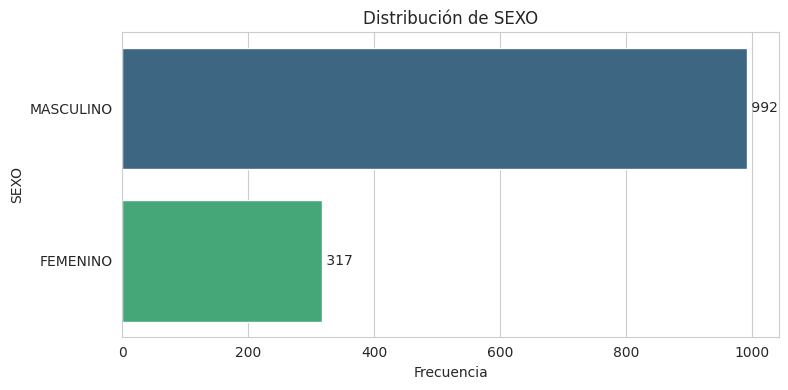


Estadísticas para SEXO:
Total de categorías: 2
Total de registros: 1309

Categorías y sus frecuencias:
SEXO
MASCULINO    992
FEMENINO     317
Name: count, dtype: int64


<ipython-input-92-b704f7ceef97>:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x=value_counts.values, y=value_counts.index, orient='h', palette='viridis')


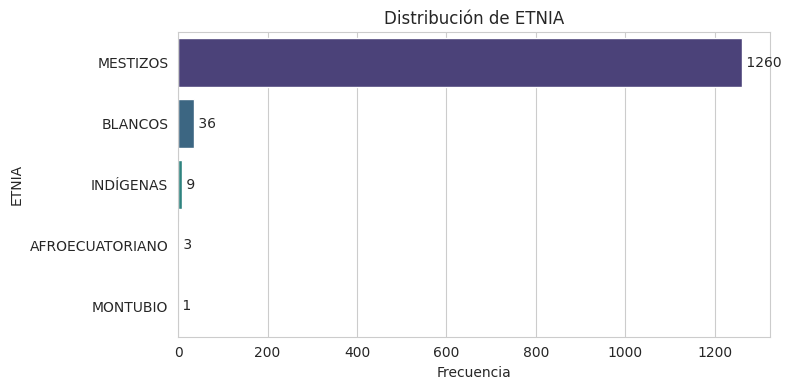


Estadísticas para ETNIA:
Total de categorías: 5
Total de registros: 1309

Categorías y sus frecuencias:
ETNIA
MESTIZOS           1260
BLANCOS              36
INDÍGENAS             9
AFROECUATORIANO       3
MONTUBIO              1
Name: count, dtype: int64


<ipython-input-92-b704f7ceef97>:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x=value_counts.values, y=value_counts.index, orient='h', palette='viridis')


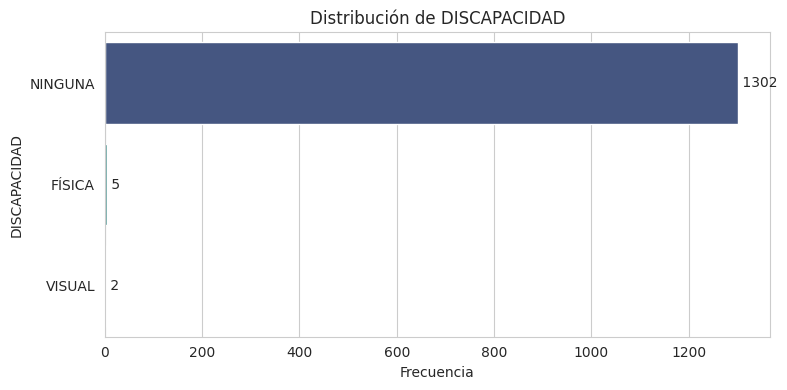


Estadísticas para DISCAPACIDAD:
Total de categorías: 3
Total de registros: 1309

Categorías y sus frecuencias:
DISCAPACIDAD
NINGUNA    1302
FÍSICA        5
VISUAL        2
Name: count, dtype: int64


<ipython-input-92-b704f7ceef97>:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x=value_counts.values, y=value_counts.index, orient='h', palette='viridis')


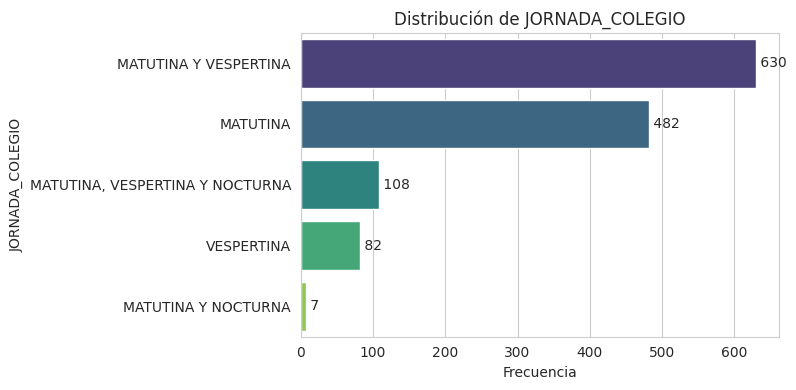


Estadísticas para JORNADA_COLEGIO:
Total de categorías: 5
Total de registros: 1309

Categorías y sus frecuencias:
JORNADA_COLEGIO
MATUTINA Y VESPERTINA              630
MATUTINA                           482
MATUTINA, VESPERTINA Y NOCTURNA    108
VESPERTINA                          82
MATUTINA Y NOCTURNA                  7
Name: count, dtype: int64


<ipython-input-92-b704f7ceef97>:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x=value_counts.values, y=value_counts.index, orient='h', palette='viridis')


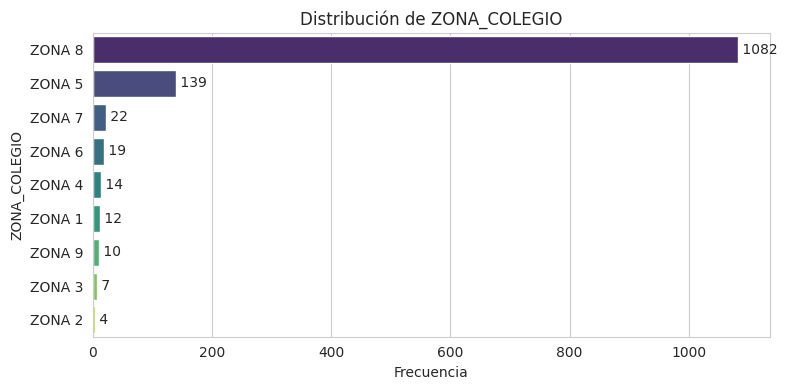


Estadísticas para ZONA_COLEGIO:
Total de categorías: 9
Total de registros: 1309

Categorías y sus frecuencias:
ZONA_COLEGIO
ZONA 8    1082
ZONA 5     139
ZONA 7      22
ZONA 6      19
ZONA 4      14
ZONA 1      12
ZONA 9      10
ZONA 3       7
ZONA 2       4
Name: count, dtype: int64


<ipython-input-92-b704f7ceef97>:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x=value_counts.values, y=value_counts.index, orient='h', palette='viridis')


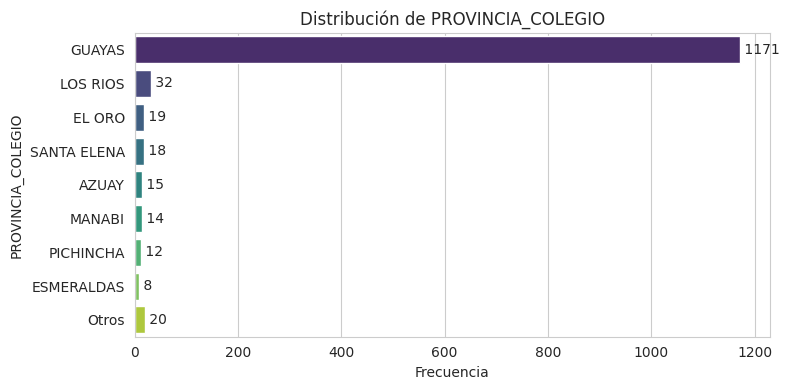


Estadísticas para PROVINCIA_COLEGIO:
Total de categorías: 9
Total de registros: 1309

Categorías y sus frecuencias:
GUAYAS         1171
LOS RIOS         32
EL ORO           19
SANTA ELENA      18
AZUAY            15
MANABI           14
PICHINCHA        12
ESMERALDAS        8
Otros            20
dtype: int64


<ipython-input-92-b704f7ceef97>:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x=value_counts.values, y=value_counts.index, orient='h', palette='viridis')


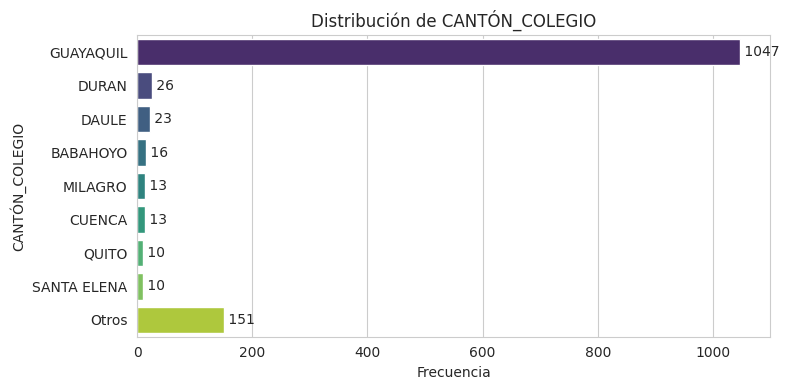


Estadísticas para CANTÓN_COLEGIO:
Total de categorías: 9
Total de registros: 1309

Categorías y sus frecuencias:
GUAYAQUIL      1047
DURAN            26
DAULE            23
BABAHOYO         16
MILAGRO          13
CUENCA           13
QUITO            10
SANTA ELENA      10
Otros           151
dtype: int64


<ipython-input-92-b704f7ceef97>:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x=value_counts.values, y=value_counts.index, orient='h', palette='viridis')


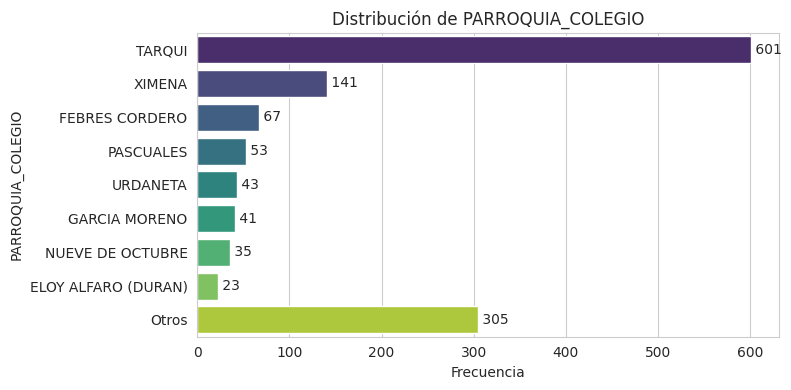


Estadísticas para PARROQUIA_COLEGIO:
Total de categorías: 9
Total de registros: 1309

Categorías y sus frecuencias:
TARQUI                 601
XIMENA                 141
FEBRES CORDERO          67
PASCUALES               53
URDANETA                43
GARCIA MORENO           41
NUEVE DE OCTUBRE        35
ELOY ALFARO (DURAN)     23
Otros                  305
dtype: int64


<ipython-input-92-b704f7ceef97>:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x=value_counts.values, y=value_counts.index, orient='h', palette='viridis')


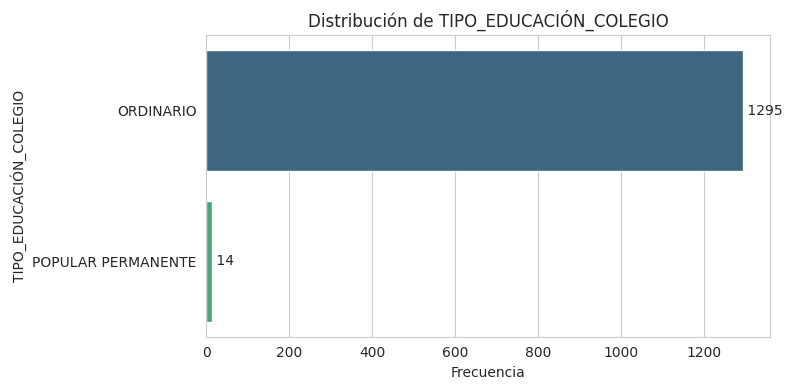


Estadísticas para TIPO_EDUCACIÓN_COLEGIO:
Total de categorías: 2
Total de registros: 1309

Categorías y sus frecuencias:
TIPO_EDUCACIÓN_COLEGIO
ORDINARIO             1295
POPULAR PERMANENTE      14
Name: count, dtype: int64


<ipython-input-92-b704f7ceef97>:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x=value_counts.values, y=value_counts.index, orient='h', palette='viridis')


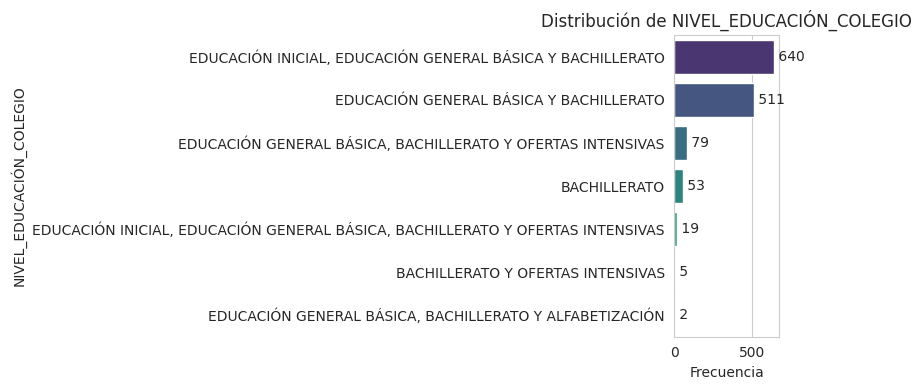


Estadísticas para NIVEL_EDUCACIÓN_COLEGIO:
Total de categorías: 7
Total de registros: 1309

Categorías y sus frecuencias:
NIVEL_EDUCACIÓN_COLEGIO
EDUCACIÓN INICIAL, EDUCACIÓN GENERAL BÁSICA Y BACHILLERATO                        640
EDUCACIÓN GENERAL BÁSICA Y BACHILLERATO                                           511
EDUCACIÓN GENERAL BÁSICA, BACHILLERATO Y OFERTAS INTENSIVAS                        79
BACHILLERATO                                                                       53
EDUCACIÓN INICIAL, EDUCACIÓN GENERAL BÁSICA, BACHILLERATO Y OFERTAS INTENSIVAS     19
BACHILLERATO Y OFERTAS INTENSIVAS                                                   5
EDUCACIÓN GENERAL BÁSICA, BACHILLERATO Y ALFABETIZACIÓN                             2
Name: count, dtype: int64


<ipython-input-92-b704f7ceef97>:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x=value_counts.values, y=value_counts.index, orient='h', palette='viridis')


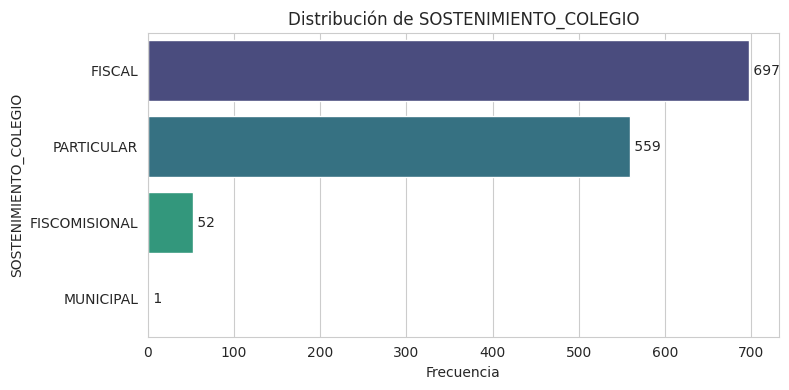


Estadísticas para SOSTENIMIENTO_COLEGIO:
Total de categorías: 4
Total de registros: 1309

Categorías y sus frecuencias:
SOSTENIMIENTO_COLEGIO
FISCAL           697
PARTICULAR       559
FISCOMISIONAL     52
MUNICIPAL          1
Name: count, dtype: int64


<ipython-input-92-b704f7ceef97>:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x=value_counts.values, y=value_counts.index, orient='h', palette='viridis')


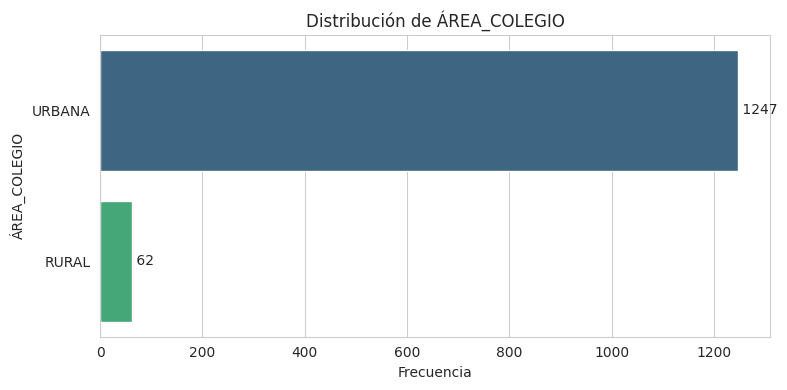


Estadísticas para ÁREA_COLEGIO:
Total de categorías: 2
Total de registros: 1309

Categorías y sus frecuencias:
ÁREA_COLEGIO
URBANA    1247
RURAL       62
Name: count, dtype: int64


<ipython-input-92-b704f7ceef97>:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x=value_counts.values, y=value_counts.index, orient='h', palette='viridis')


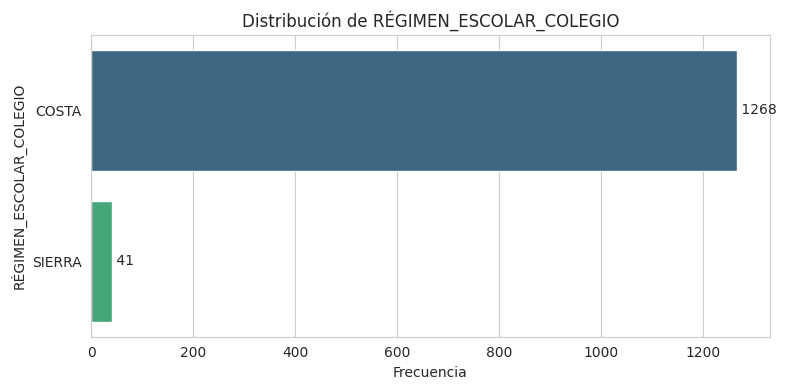


Estadísticas para RÉGIMEN_ESCOLAR_COLEGIO:
Total de categorías: 2
Total de registros: 1309

Categorías y sus frecuencias:
RÉGIMEN_ESCOLAR_COLEGIO
COSTA     1268
SIERRA      41
Name: count, dtype: int64


<ipython-input-92-b704f7ceef97>:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x=value_counts.values, y=value_counts.index, orient='h', palette='viridis')


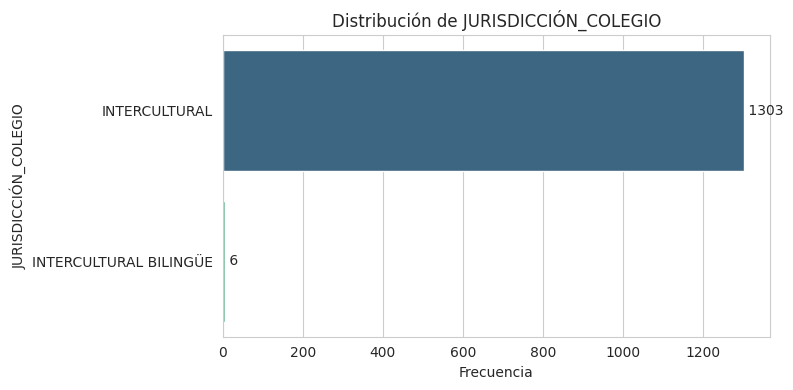


Estadísticas para JURISDICCIÓN_COLEGIO:
Total de categorías: 2
Total de registros: 1309

Categorías y sus frecuencias:
JURISDICCIÓN_COLEGIO
INTERCULTURAL             1303
INTERCULTURAL BILINGÜE       6
Name: count, dtype: int64


<ipython-input-92-b704f7ceef97>:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x=value_counts.values, y=value_counts.index, orient='h', palette='viridis')


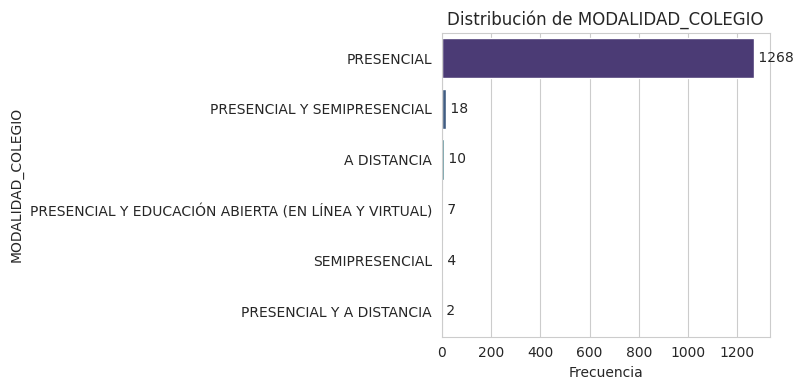


Estadísticas para MODALIDAD_COLEGIO:
Total de categorías: 6
Total de registros: 1309

Categorías y sus frecuencias:
MODALIDAD_COLEGIO
PRESENCIAL                                             1268
PRESENCIAL Y SEMIPRESENCIAL                              18
A DISTANCIA                                              10
PRESENCIAL Y EDUCACIÓN ABIERTA (EN LÍNEA Y VIRTUAL)       7
SEMIPRESENCIAL                                            4
PRESENCIAL Y A DISTANCIA                                  2
Name: count, dtype: int64


<ipython-input-92-b704f7ceef97>:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x=value_counts.values, y=value_counts.index, orient='h', palette='viridis')


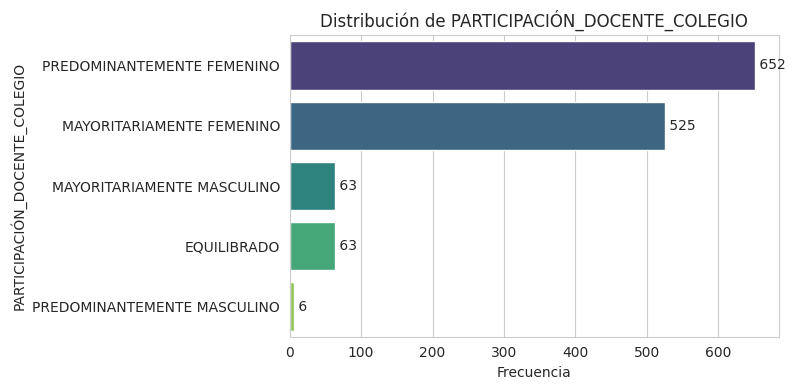


Estadísticas para PARTICIPACIÓN_DOCENTE_COLEGIO:
Total de categorías: 5
Total de registros: 1309

Categorías y sus frecuencias:
PARTICIPACIÓN_DOCENTE_COLEGIO
PREDOMINANTEMENTE FEMENINO     652
MAYORITARIAMENTE FEMENINO      525
MAYORITARIAMENTE MASCULINO      63
EQUILIBRADO                     63
PREDOMINANTEMENTE MASCULINO      6
Name: count, dtype: int64


<ipython-input-92-b704f7ceef97>:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x=value_counts.values, y=value_counts.index, orient='h', palette='viridis')


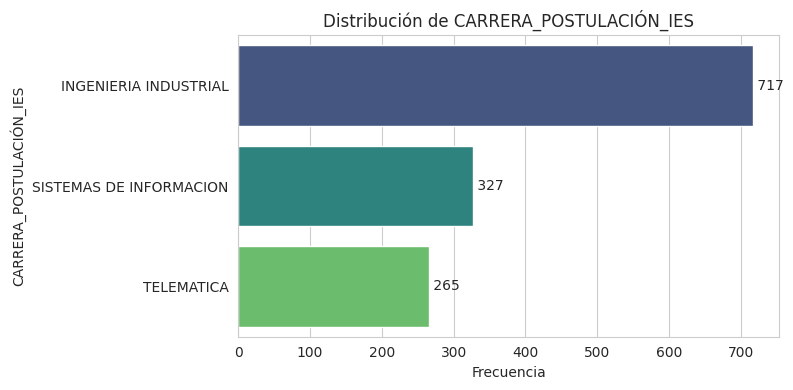


Estadísticas para CARRERA_POSTULACIÓN_IES:
Total de categorías: 3
Total de registros: 1309

Categorías y sus frecuencias:
CARRERA_POSTULACIÓN_IES
INGENIERIA INDUSTRIAL      717
SISTEMAS DE INFORMACION    327
TELEMATICA                 265
Name: count, dtype: int64


<ipython-input-92-b704f7ceef97>:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x=value_counts.values, y=value_counts.index, orient='h', palette='viridis')


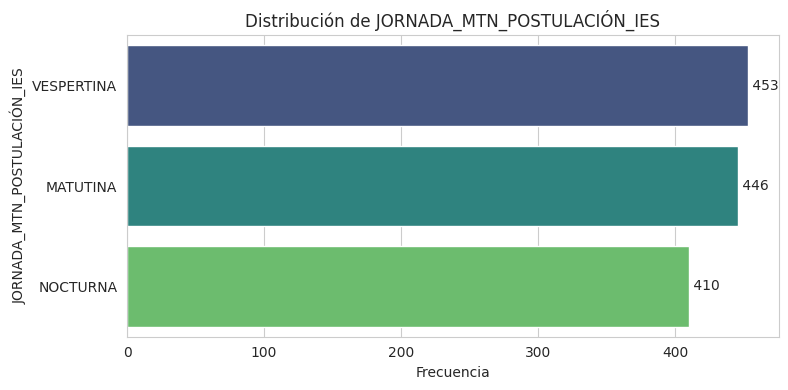


Estadísticas para JORNADA_MTN_POSTULACIÓN_IES:
Total de categorías: 3
Total de registros: 1309

Categorías y sus frecuencias:
JORNADA_MTN_POSTULACIÓN_IES
VESPERTINA    453
MATUTINA      446
NOCTURNA      410
Name: count, dtype: int64


<ipython-input-92-b704f7ceef97>:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x=value_counts.values, y=value_counts.index, orient='h', palette='viridis')


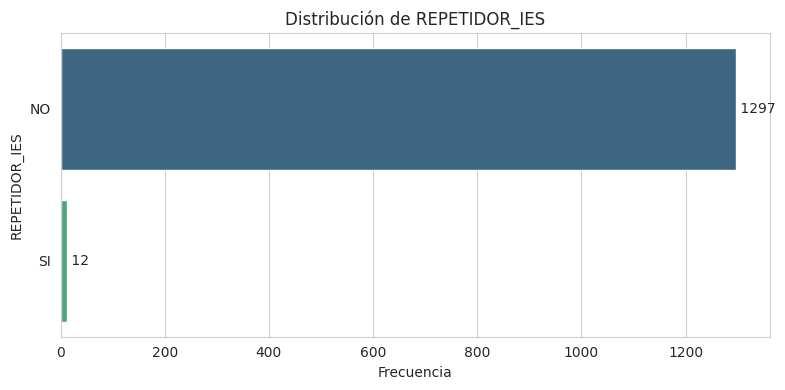


Estadísticas para REPETIDOR_IES:
Total de categorías: 2
Total de registros: 1309

Categorías y sus frecuencias:
REPETIDOR_IES
NO    1297
SI      12
Name: count, dtype: int64


<ipython-input-92-b704f7ceef97>:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x=value_counts.values, y=value_counts.index, orient='h', palette='viridis')


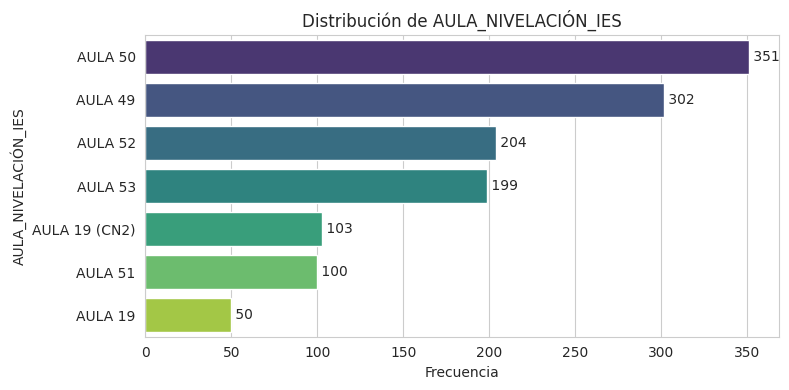


Estadísticas para AULA_NIVELACIÓN_IES:
Total de categorías: 7
Total de registros: 1309

Categorías y sus frecuencias:
AULA_NIVELACIÓN_IES
AULA 50          351
AULA 49          302
AULA 52          204
AULA 53          199
AULA 19 (CN2)    103
AULA 51          100
AULA 19           50
Name: count, dtype: int64


<ipython-input-92-b704f7ceef97>:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x=value_counts.values, y=value_counts.index, orient='h', palette='viridis')


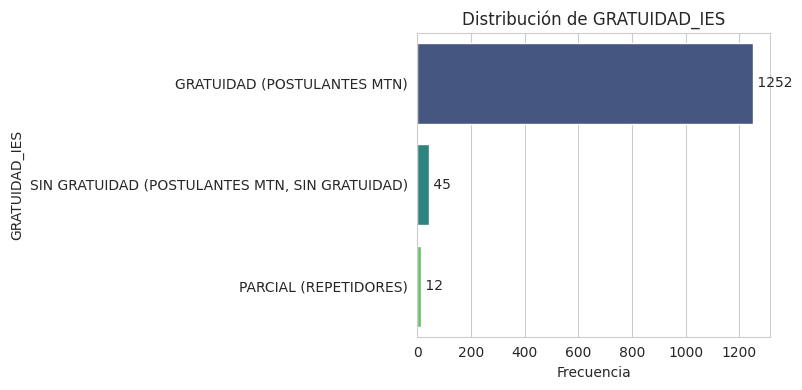


Estadísticas para GRATUIDAD_IES:
Total de categorías: 3
Total de registros: 1309

Categorías y sus frecuencias:
GRATUIDAD_IES
GRATUIDAD (POSTULANTES MTN)                       1252
SIN GRATUIDAD (POSTULANTES MTN, SIN GRATUIDAD)      45
PARCIAL (REPETIDORES)                               12
Name: count, dtype: int64


<ipython-input-92-b704f7ceef97>:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x=value_counts.values, y=value_counts.index, orient='h', palette='viridis')


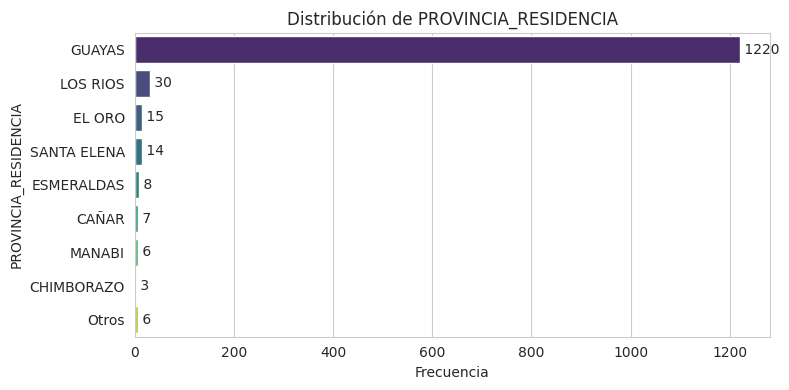


Estadísticas para PROVINCIA_RESIDENCIA:
Total de categorías: 9
Total de registros: 1309

Categorías y sus frecuencias:
GUAYAS         1220
LOS RIOS         30
EL ORO           15
SANTA ELENA      14
ESMERALDAS        8
CAÑAR             7
MANABI            6
CHIMBORAZO        3
Otros             6
dtype: int64


<ipython-input-92-b704f7ceef97>:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x=value_counts.values, y=value_counts.index, orient='h', palette='viridis')


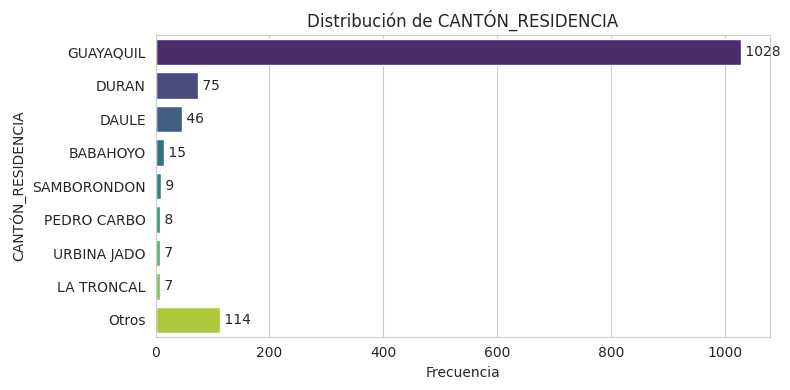


Estadísticas para CANTÓN_RESIDENCIA:
Total de categorías: 9
Total de registros: 1309

Categorías y sus frecuencias:
GUAYAQUIL      1028
DURAN            75
DAULE            46
BABAHOYO         15
SAMBORONDON       9
PEDRO CARBO       8
URBINA JADO       7
LA TRONCAL        7
Otros           114
dtype: int64


<ipython-input-92-b704f7ceef97>:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x=value_counts.values, y=value_counts.index, orient='h', palette='viridis')


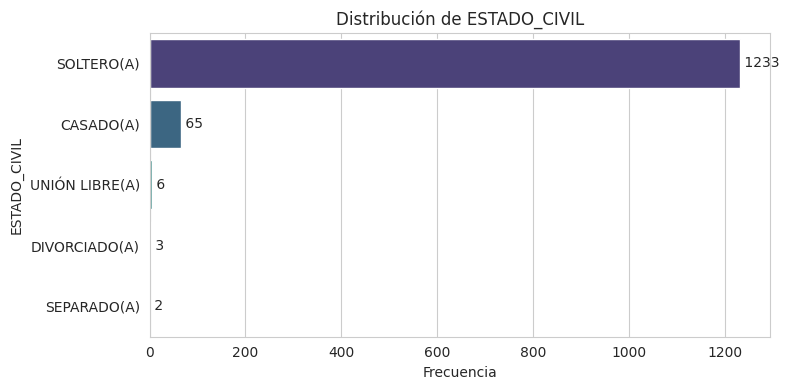


Estadísticas para ESTADO_CIVIL:
Total de categorías: 5
Total de registros: 1309

Categorías y sus frecuencias:
ESTADO_CIVIL
SOLTERO(A)        1233
CASADO(A)           65
UNIÓN LIBRE(A)       6
DIVORCIADO(A)        3
SEPARADO(A)          2
Name: count, dtype: int64


<ipython-input-92-b704f7ceef97>:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x=value_counts.values, y=value_counts.index, orient='h', palette='viridis')


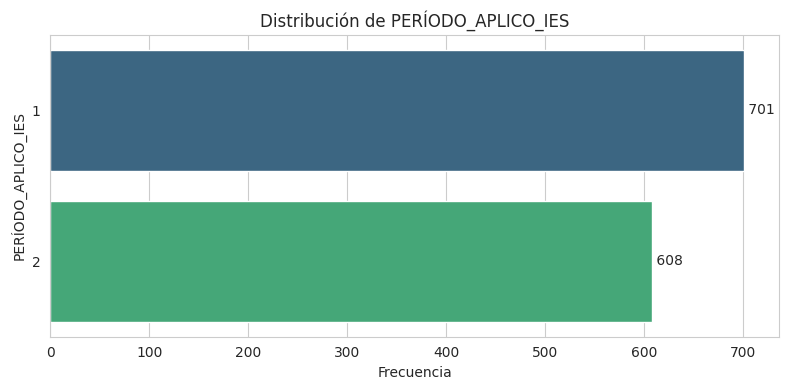


Estadísticas para PERÍODO_APLICO_IES:
Total de categorías: 2
Total de registros: 1309

Categorías y sus frecuencias:
PERÍODO_APLICO_IES
1    701
2    608
Name: count, dtype: int64


<ipython-input-92-b704f7ceef97>:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x=value_counts.values, y=value_counts.index, orient='h', palette='viridis')


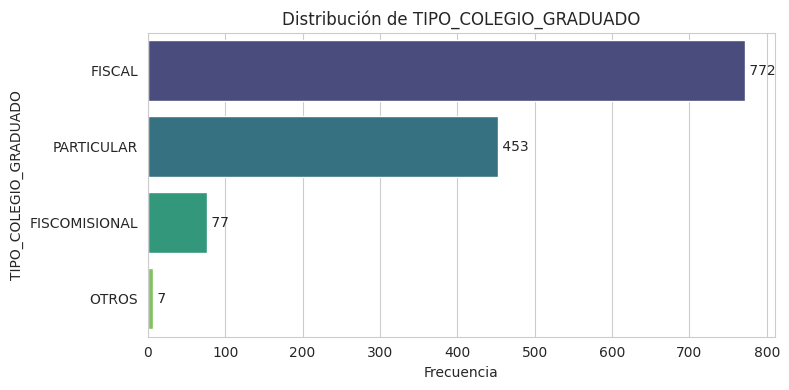


Estadísticas para TIPO_COLEGIO_GRADUADO:
Total de categorías: 4
Total de registros: 1309

Categorías y sus frecuencias:
TIPO_COLEGIO_GRADUADO
FISCAL           772
PARTICULAR       453
FISCOMISIONAL     77
OTROS              7
Name: count, dtype: int64


<ipython-input-92-b704f7ceef97>:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x=value_counts.values, y=value_counts.index, orient='h', palette='viridis')


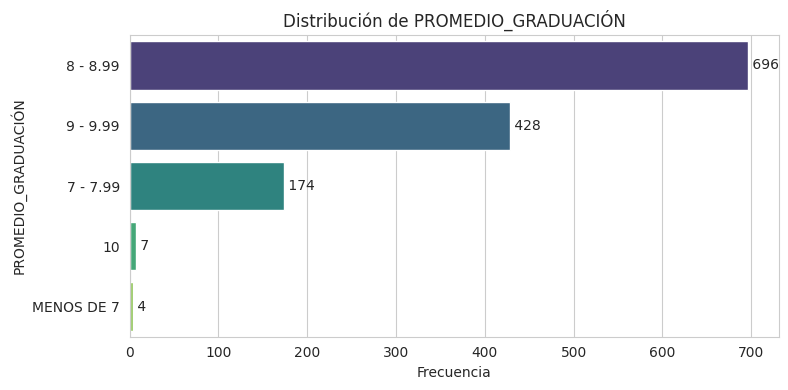


Estadísticas para PROMEDIO_GRADUACIÓN:
Total de categorías: 5
Total de registros: 1309

Categorías y sus frecuencias:
PROMEDIO_GRADUACIÓN
8 - 8.99      696
9 - 9.99      428
7 - 7.99      174
10              7
MENOS DE 7      4
Name: count, dtype: int64


<ipython-input-92-b704f7ceef97>:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x=value_counts.values, y=value_counts.index, orient='h', palette='viridis')


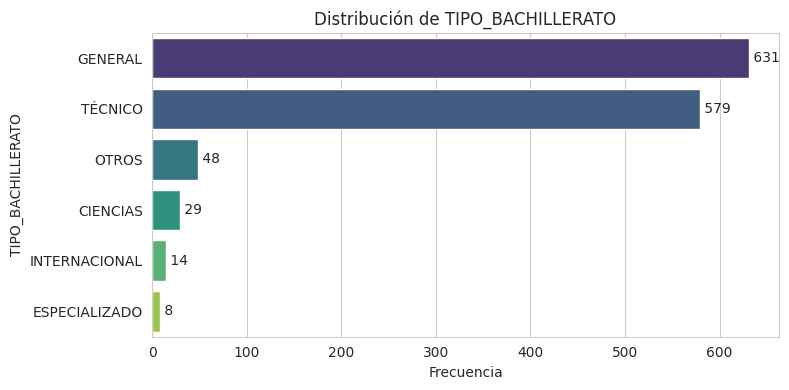


Estadísticas para TIPO_BACHILLERATO:
Total de categorías: 6
Total de registros: 1309

Categorías y sus frecuencias:
TIPO_BACHILLERATO
GENERAL          631
TÉCNICO          579
OTROS             48
CIENCIAS          29
INTERNACIONAL     14
ESPECIALIZADO      8
Name: count, dtype: int64


<ipython-input-92-b704f7ceef97>:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x=value_counts.values, y=value_counts.index, orient='h', palette='viridis')


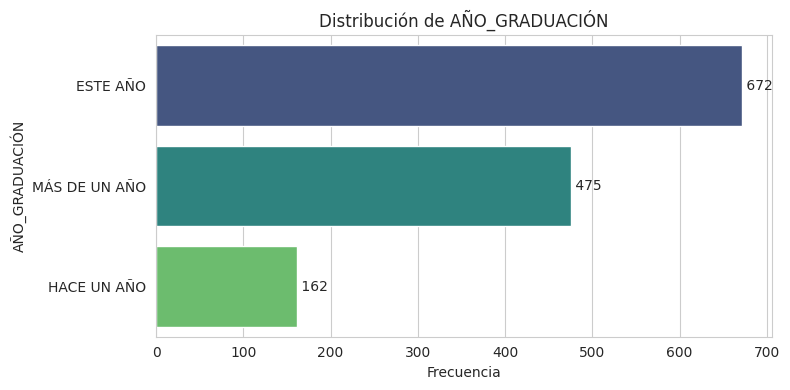


Estadísticas para AÑO_GRADUACIÓN:
Total de categorías: 3
Total de registros: 1309

Categorías y sus frecuencias:
AÑO_GRADUACIÓN
ESTE AÑO         672
MÁS DE UN AÑO    475
HACE UN AÑO      162
Name: count, dtype: int64


<ipython-input-92-b704f7ceef97>:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x=value_counts.values, y=value_counts.index, orient='h', palette='viridis')


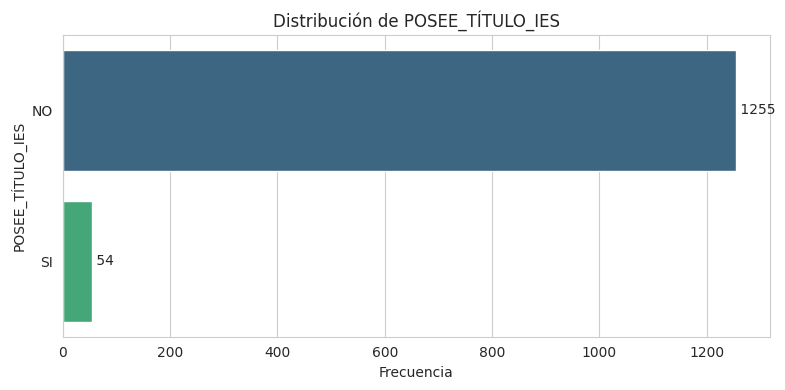


Estadísticas para POSEE_TÍTULO_IES:
Total de categorías: 2
Total de registros: 1309

Categorías y sus frecuencias:
POSEE_TÍTULO_IES
NO    1255
SI      54
Name: count, dtype: int64


<ipython-input-92-b704f7ceef97>:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x=value_counts.values, y=value_counts.index, orient='h', palette='viridis')


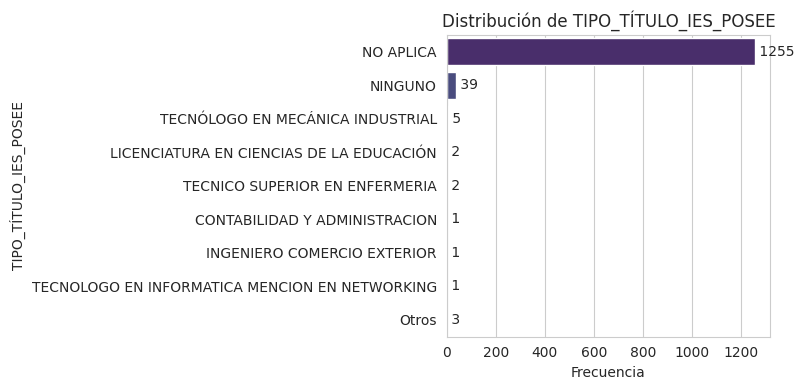


Estadísticas para TIPO_TÍTULO_IES_POSEE:
Total de categorías: 9
Total de registros: 1309

Categorías y sus frecuencias:
NO APLICA                                         1255
NINGUNO                                             39
TECNÓLOGO EN MECÁNICA INDUSTRIAL                     5
LICENCIATURA EN CIENCIAS DE LA EDUCACIÓN             2
TECNICO SUPERIOR EN ENFERMERIA                       2
CONTABILIDAD Y ADMINISTRACION                        1
INGENIERO COMERCIO EXTERIOR                          1
TECNOLOGO EN INFORMATICA MENCION EN NETWORKING       1
Otros                                                3
dtype: int64


<ipython-input-92-b704f7ceef97>:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x=value_counts.values, y=value_counts.index, orient='h', palette='viridis')


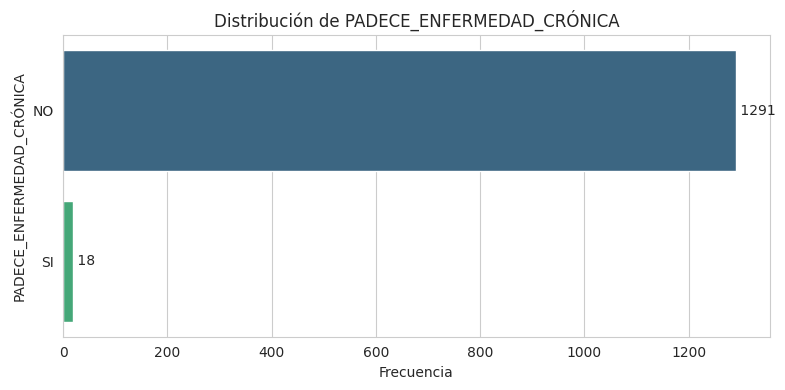


Estadísticas para PADECE_ENFERMEDAD_CRÓNICA:
Total de categorías: 2
Total de registros: 1309

Categorías y sus frecuencias:
PADECE_ENFERMEDAD_CRÓNICA
NO    1291
SI      18
Name: count, dtype: int64


<ipython-input-92-b704f7ceef97>:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x=value_counts.values, y=value_counts.index, orient='h', palette='viridis')


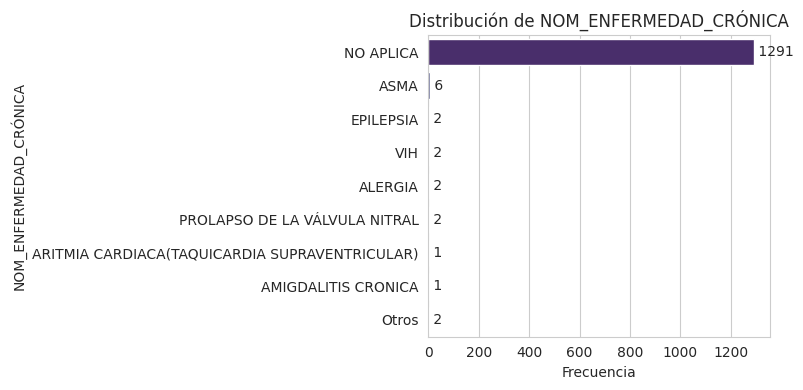


Estadísticas para NOM_ENFERMEDAD_CRÓNICA:
Total de categorías: 9
Total de registros: 1309

Categorías y sus frecuencias:
NO APLICA                                         1291
ASMA                                                 6
EPILEPSIA                                            2
VIH                                                  2
ALERGIA                                              2
PROLAPSO DE LA VÁLVULA NITRAL                        2
ARITMIA CARDIACA(TAQUICARDIA SUPRAVENTRICULAR)       1
AMIGDALITIS CRONICA                                  1
Otros                                                2
dtype: int64


<ipython-input-92-b704f7ceef97>:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x=value_counts.values, y=value_counts.index, orient='h', palette='viridis')


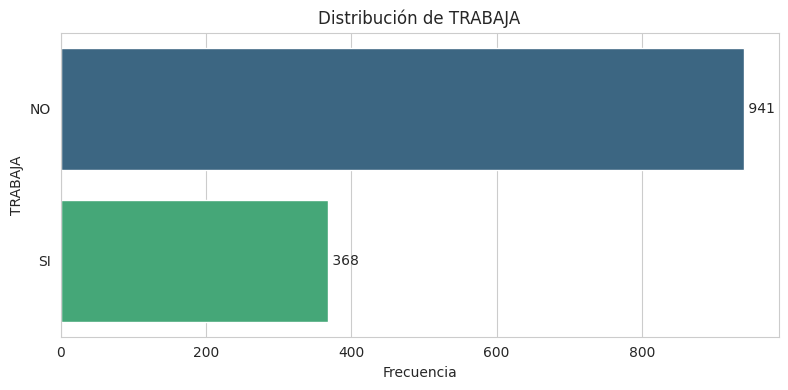


Estadísticas para TRABAJA:
Total de categorías: 2
Total de registros: 1309

Categorías y sus frecuencias:
TRABAJA
NO    941
SI    368
Name: count, dtype: int64


<ipython-input-92-b704f7ceef97>:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x=value_counts.values, y=value_counts.index, orient='h', palette='viridis')


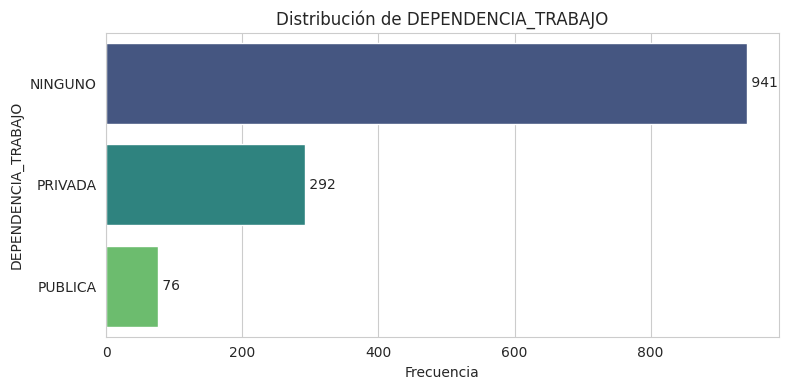


Estadísticas para DEPENDENCIA_TRABAJO:
Total de categorías: 3
Total de registros: 1309

Categorías y sus frecuencias:
DEPENDENCIA_TRABAJO
NINGUNO    941
PRIVADA    292
PUBLICA     76
Name: count, dtype: int64


<ipython-input-92-b704f7ceef97>:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x=value_counts.values, y=value_counts.index, orient='h', palette='viridis')


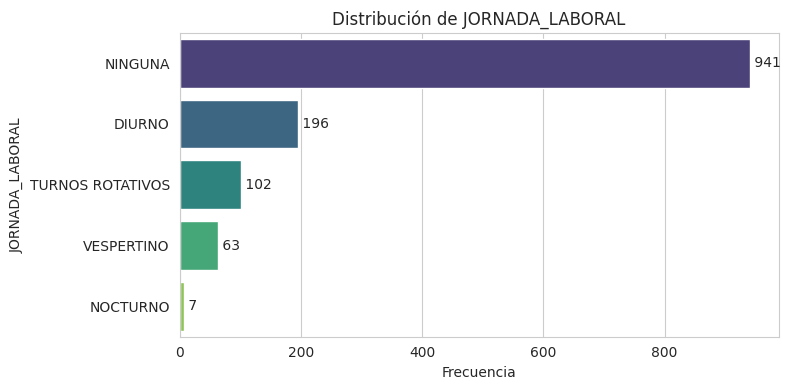


Estadísticas para JORNADA_LABORAL:
Total de categorías: 5
Total de registros: 1309

Categorías y sus frecuencias:
JORNADA_LABORAL
NINGUNA             941
DIURNO              196
TURNOS ROTATIVOS    102
VESPERTINO           63
NOCTURNO              7
Name: count, dtype: int64


<ipython-input-92-b704f7ceef97>:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x=value_counts.values, y=value_counts.index, orient='h', palette='viridis')


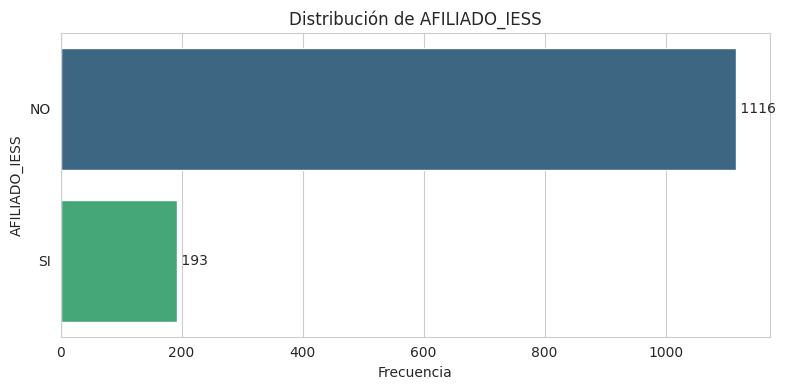


Estadísticas para AFILIADO_IESS:
Total de categorías: 2
Total de registros: 1309

Categorías y sus frecuencias:
AFILIADO_IESS
NO    1116
SI     193
Name: count, dtype: int64


<ipython-input-92-b704f7ceef97>:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x=value_counts.values, y=value_counts.index, orient='h', palette='viridis')


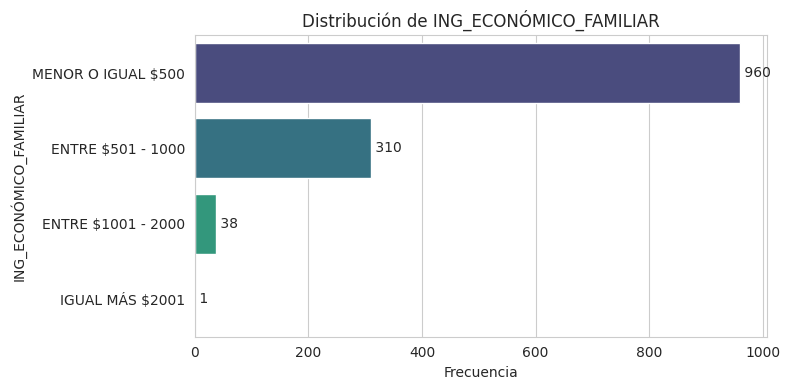


Estadísticas para ING_ECONÓMICO_FAMILIAR:
Total de categorías: 4
Total de registros: 1309

Categorías y sus frecuencias:
ING_ECONÓMICO_FAMILIAR
MENOR O IGUAL $500    960
ENTRE $501 - 1000     310
ENTRE $1001 - 2000     38
IGUAL MÁS $2001         1
Name: count, dtype: int64


<ipython-input-92-b704f7ceef97>:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x=value_counts.values, y=value_counts.index, orient='h', palette='viridis')


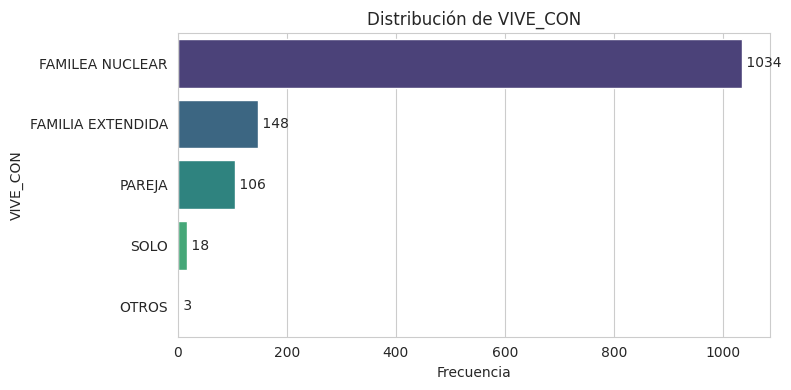


Estadísticas para VIVE_CON:
Total de categorías: 5
Total de registros: 1309

Categorías y sus frecuencias:
VIVE_CON
FAMILEA NUCLEAR      1034
FAMILIA EXTENDIDA     148
PAREJA                106
SOLO                   18
OTROS                   3
Name: count, dtype: int64


<ipython-input-92-b704f7ceef97>:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x=value_counts.values, y=value_counts.index, orient='h', palette='viridis')


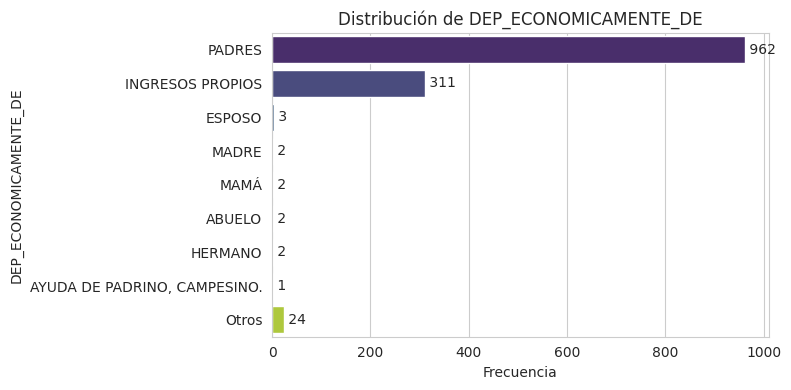


Estadísticas para DEP_ECONOMICAMENTE_DE:
Total de categorías: 9
Total de registros: 1309

Categorías y sus frecuencias:
PADRES                          962
INGRESOS PROPIOS                311
ESPOSO                            3
MADRE                             2
MAMÁ                              2
ABUELO                            2
HERMANO                           2
AYUDA DE PADRINO, CAMPESINO.      1
Otros                            24
dtype: int64


<ipython-input-92-b704f7ceef97>:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x=value_counts.values, y=value_counts.index, orient='h', palette='viridis')


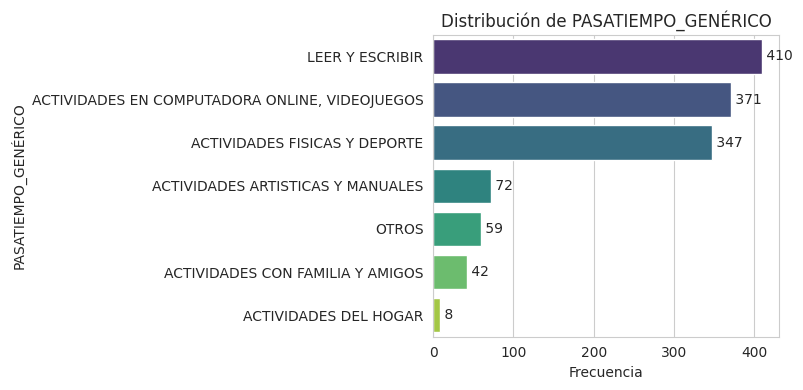


Estadísticas para PASATIEMPO_GENÉRICO:
Total de categorías: 7
Total de registros: 1309

Categorías y sus frecuencias:
PASATIEMPO_GENÉRICO
LEER Y ESCRIBIR                                   410
ACTIVIDADES EN COMPUTADORA ONLINE, VIDEOJUEGOS    371
ACTIVIDADES FISICAS Y DEPORTE                     347
ACTIVIDADES ARTISTICAS Y MANUALES                  72
OTROS                                              59
ACTIVIDADES CON FAMILIA Y AMIGOS                   42
ACTIVIDADES DEL HOGAR                               8
Name: count, dtype: int64


<ipython-input-92-b704f7ceef97>:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x=value_counts.values, y=value_counts.index, orient='h', palette='viridis')


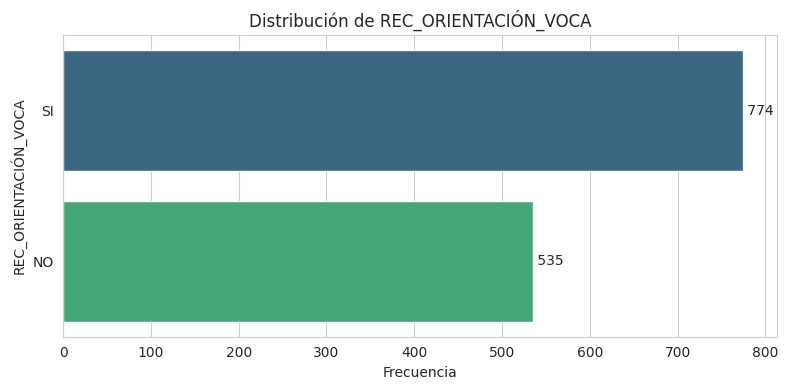


Estadísticas para REC_ORIENTACIÓN_VOCA:
Total de categorías: 2
Total de registros: 1309

Categorías y sus frecuencias:
REC_ORIENTACIÓN_VOCA
SI    774
NO    535
Name: count, dtype: int64


<ipython-input-92-b704f7ceef97>:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x=value_counts.values, y=value_counts.index, orient='h', palette='viridis')


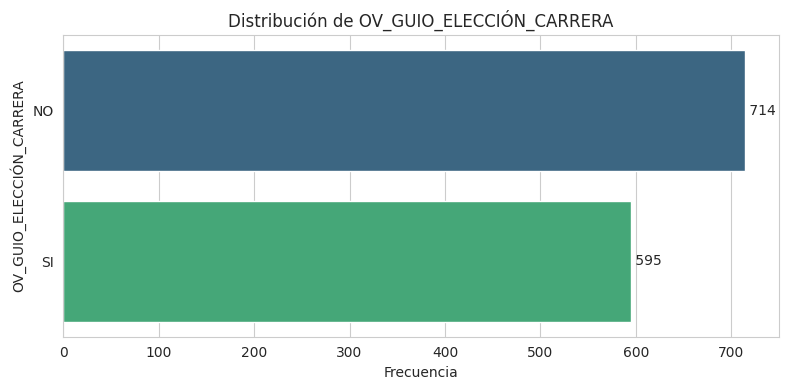


Estadísticas para OV_GUIO_ELECCIÓN_CARRERA:
Total de categorías: 2
Total de registros: 1309

Categorías y sus frecuencias:
OV_GUIO_ELECCIÓN_CARRERA
NO    714
SI    595
Name: count, dtype: int64


<ipython-input-92-b704f7ceef97>:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x=value_counts.values, y=value_counts.index, orient='h', palette='viridis')


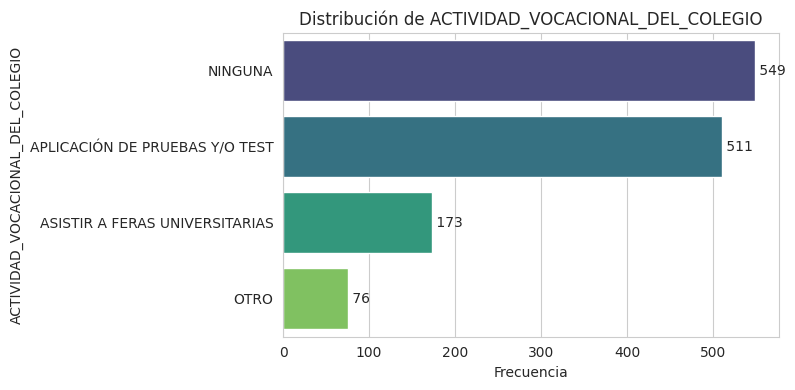


Estadísticas para ACTIVIDAD_VOCACIONAL_DEL_COLEGIO:
Total de categorías: 4
Total de registros: 1309

Categorías y sus frecuencias:
ACTIVIDAD_VOCACIONAL_DEL_COLEGIO
NINGUNA                           549
APLICACIÓN DE PRUEBAS Y/O TEST    511
ASISTIR A FERAS UNIVERSITARIAS    173
OTRO                               76
Name: count, dtype: int64


<ipython-input-92-b704f7ceef97>:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x=value_counts.values, y=value_counts.index, orient='h', palette='viridis')


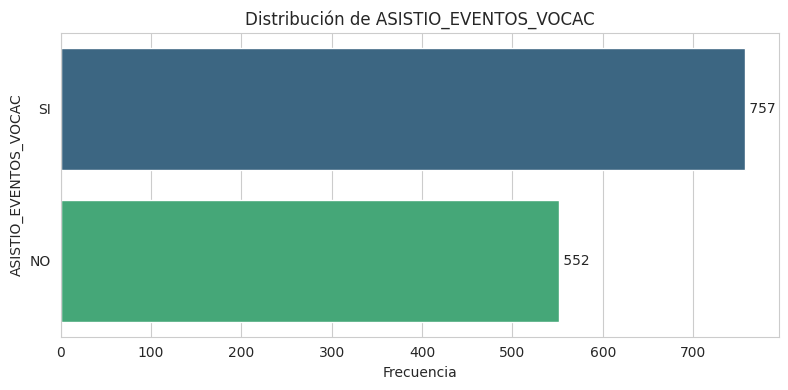


Estadísticas para ASISTIO_EVENTOS_VOCAC:
Total de categorías: 2
Total de registros: 1309

Categorías y sus frecuencias:
ASISTIO_EVENTOS_VOCAC
SI    757
NO    552
Name: count, dtype: int64


<ipython-input-92-b704f7ceef97>:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x=value_counts.values, y=value_counts.index, orient='h', palette='viridis')


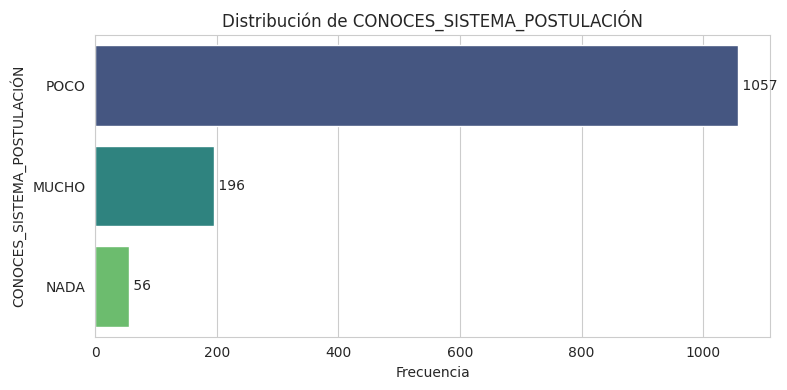


Estadísticas para CONOCES_SISTEMA_POSTULACIÓN:
Total de categorías: 3
Total de registros: 1309

Categorías y sus frecuencias:
CONOCES_SISTEMA_POSTULACIÓN
POCO     1057
MUCHO     196
NADA       56
Name: count, dtype: int64


<ipython-input-92-b704f7ceef97>:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x=value_counts.values, y=value_counts.index, orient='h', palette='viridis')


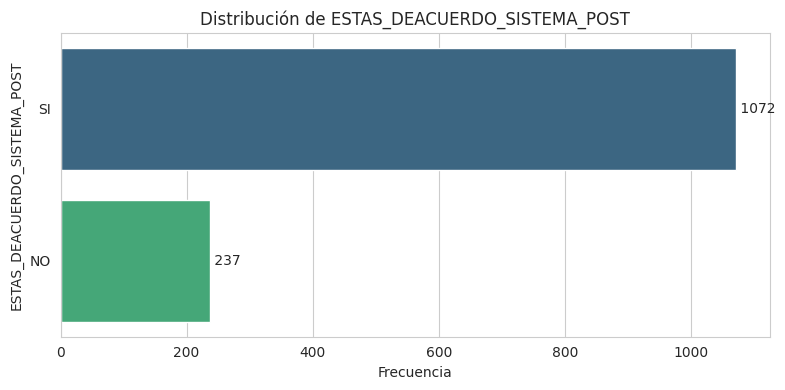


Estadísticas para ESTAS_DEACUERDO_SISTEMA_POST:
Total de categorías: 2
Total de registros: 1309

Categorías y sus frecuencias:
ESTAS_DEACUERDO_SISTEMA_POST
SI    1072
NO     237
Name: count, dtype: int64


<ipython-input-92-b704f7ceef97>:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x=value_counts.values, y=value_counts.index, orient='h', palette='viridis')


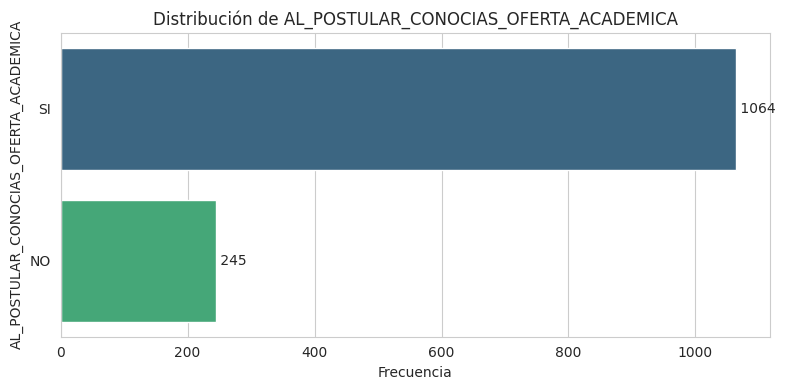


Estadísticas para AL_POSTULAR_CONOCIAS_OFERTA_ACADEMICA:
Total de categorías: 2
Total de registros: 1309

Categorías y sus frecuencias:
AL_POSTULAR_CONOCIAS_OFERTA_ACADEMICA
SI    1064
NO     245
Name: count, dtype: int64


<ipython-input-92-b704f7ceef97>:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x=value_counts.values, y=value_counts.index, orient='h', palette='viridis')


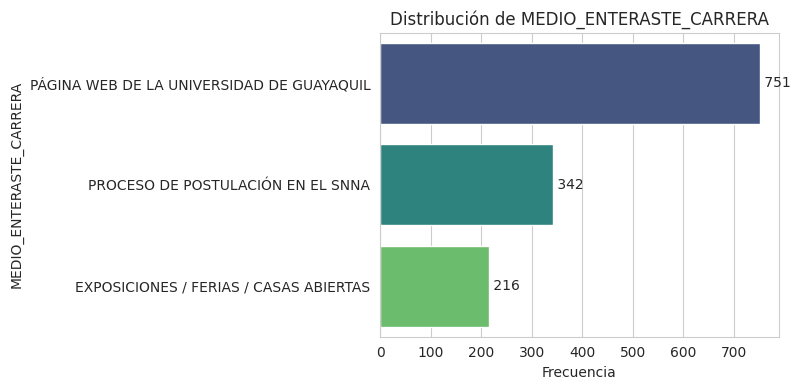


Estadísticas para MEDIO_ENTERASTE_CARRERA:
Total de categorías: 3
Total de registros: 1309

Categorías y sus frecuencias:
MEDIO_ENTERASTE_CARRERA
PÁGINA WEB DE LA UNIVERSIDAD DE GUAYAQUIL    751
PROCESO DE POSTULACIÓN EN EL SNNA            342
EXPOSICIONES / FERIAS / CASAS ABIERTAS       216
Name: count, dtype: int64


<ipython-input-92-b704f7ceef97>:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x=value_counts.values, y=value_counts.index, orient='h', palette='viridis')


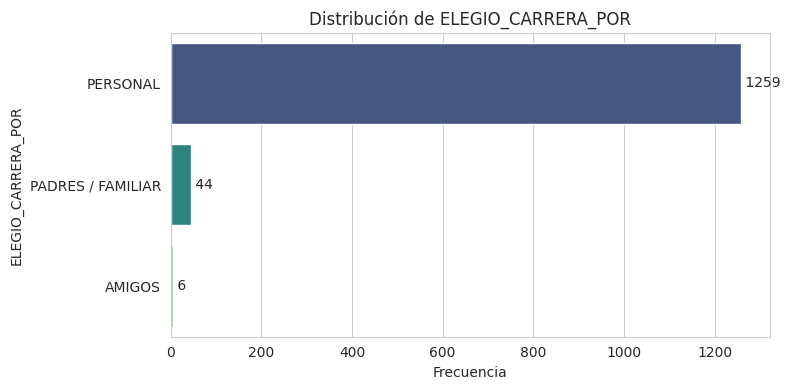


Estadísticas para ELEGIO_CARRERA_POR:
Total de categorías: 3
Total de registros: 1309

Categorías y sus frecuencias:
ELEGIO_CARRERA_POR
PERSONAL             1259
PADRES / FAMILIAR      44
AMIGOS                  6
Name: count, dtype: int64


<ipython-input-92-b704f7ceef97>:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x=value_counts.values, y=value_counts.index, orient='h', palette='viridis')


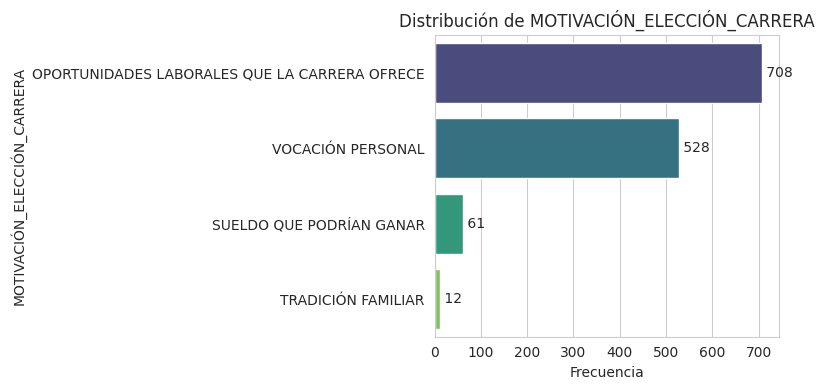


Estadísticas para MOTIVACIÓN_ELECCIÓN_CARRERA:
Total de categorías: 4
Total de registros: 1309

Categorías y sus frecuencias:
MOTIVACIÓN_ELECCIÓN_CARRERA
OPORTUNIDADES LABORALES QUE LA CARRERA OFRECE    708
VOCACIÓN PERSONAL                                528
SUELDO QUE PODRÍAN GANAR                          61
TRADICIÓN FAMILIAR                                12
Name: count, dtype: int64


<ipython-input-92-b704f7ceef97>:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x=value_counts.values, y=value_counts.index, orient='h', palette='viridis')


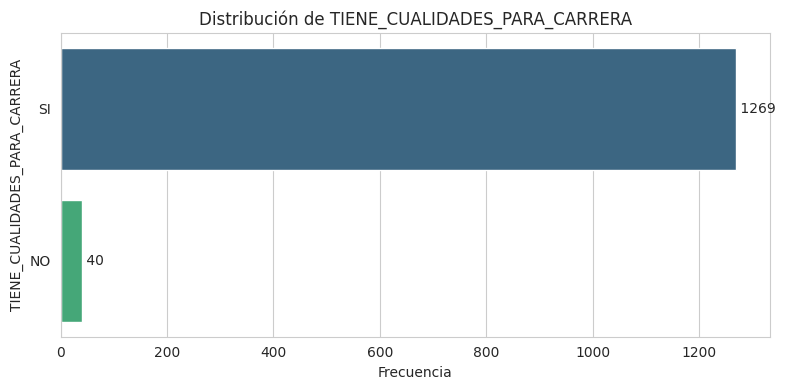


Estadísticas para TIENE_CUALIDADES_PARA_CARRERA:
Total de categorías: 2
Total de registros: 1309

Categorías y sus frecuencias:
TIENE_CUALIDADES_PARA_CARRERA
SI    1269
NO      40
Name: count, dtype: int64


<ipython-input-92-b704f7ceef97>:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x=value_counts.values, y=value_counts.index, orient='h', palette='viridis')


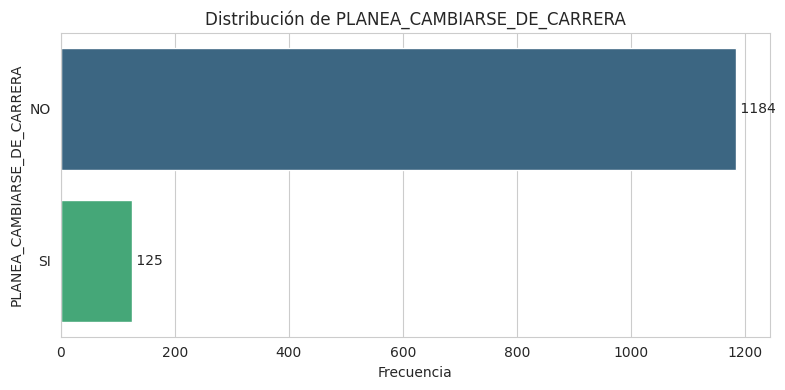


Estadísticas para PLANEA_CAMBIARSE_DE_CARRERA:
Total de categorías: 2
Total de registros: 1309

Categorías y sus frecuencias:
PLANEA_CAMBIARSE_DE_CARRERA
NO    1184
SI     125
Name: count, dtype: int64


<ipython-input-92-b704f7ceef97>:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x=value_counts.values, y=value_counts.index, orient='h', palette='viridis')


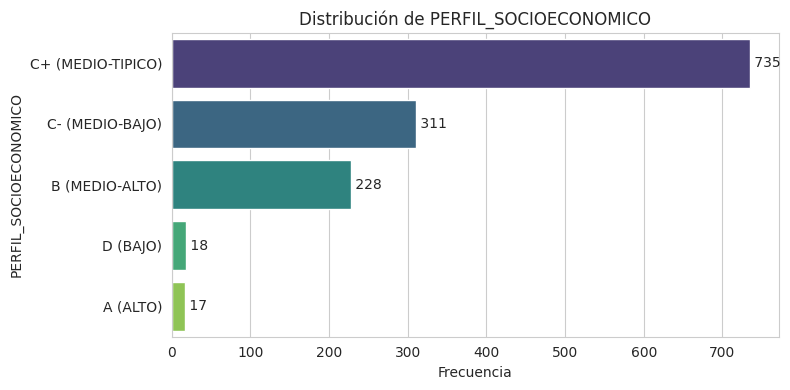


Estadísticas para PERFIL_SOCIOECONOMICO:
Total de categorías: 5
Total de registros: 1309

Categorías y sus frecuencias:
PERFIL_SOCIOECONOMICO
C+ (MEDIO-TIPICO)    735
C- (MEDIO-BAJO)      311
B (MEDIO-ALTO)       228
D (BAJO)              18
A (ALTO)              17
Name: count, dtype: int64


<ipython-input-92-b704f7ceef97>:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x=value_counts.values, y=value_counts.index, orient='h', palette='viridis')


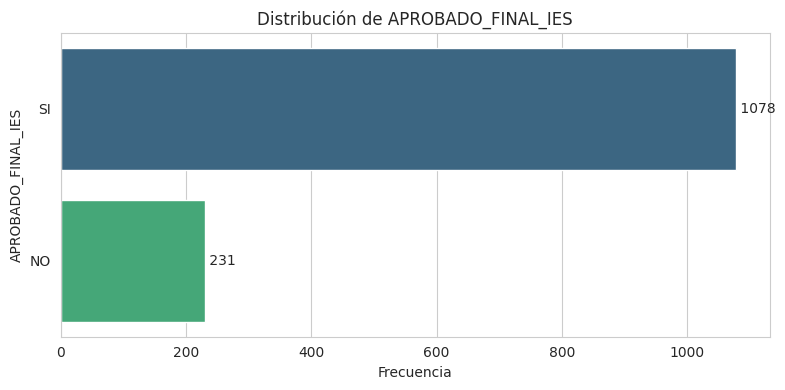


Estadísticas para APROBADO_FINAL_IES:
Total de categorías: 2
Total de registros: 1309

Categorías y sus frecuencias:
APROBADO_FINAL_IES
SI    1078
NO     231
Name: count, dtype: int64


<ipython-input-92-b704f7ceef97>:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x=value_counts.values, y=value_counts.index, orient='h', palette='viridis')


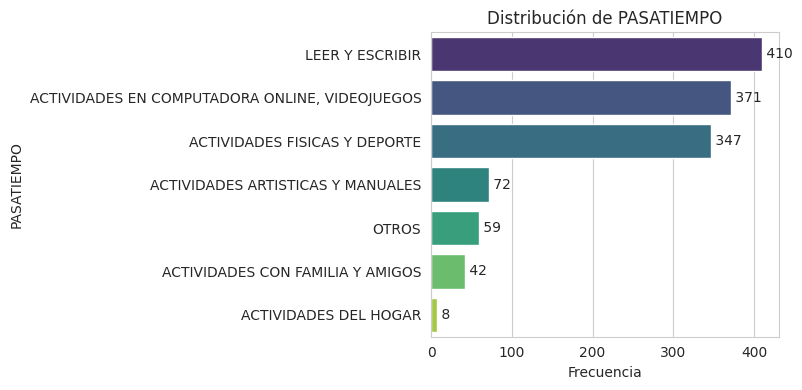


Estadísticas para PASATIEMPO:
Total de categorías: 7
Total de registros: 1309

Categorías y sus frecuencias:
PASATIEMPO
LEER Y ESCRIBIR                                   410
ACTIVIDADES EN COMPUTADORA ONLINE, VIDEOJUEGOS    371
ACTIVIDADES FISICAS Y DEPORTE                     347
ACTIVIDADES ARTISTICAS Y MANUALES                  72
OTROS                                              59
ACTIVIDADES CON FAMILIA Y AMIGOS                   42
ACTIVIDADES DEL HOGAR                               8
Name: count, dtype: int64


In [120]:
# Se identifica columnas categóricas
categorical_columns = df_consolidado2.select_dtypes(include=['object', 'category']).columns

# Se crea gráficos para columnas categóricas
for column in categorical_columns:
    plot_horizontal_bar(df_consolidado2, column)

<ipython-input-121-4e10ba93c5ed>:54: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  ax.annotate(f"{carrera_nombre}\n{conteo_final[i]} ({porcentajes[i]:.1f}%)",


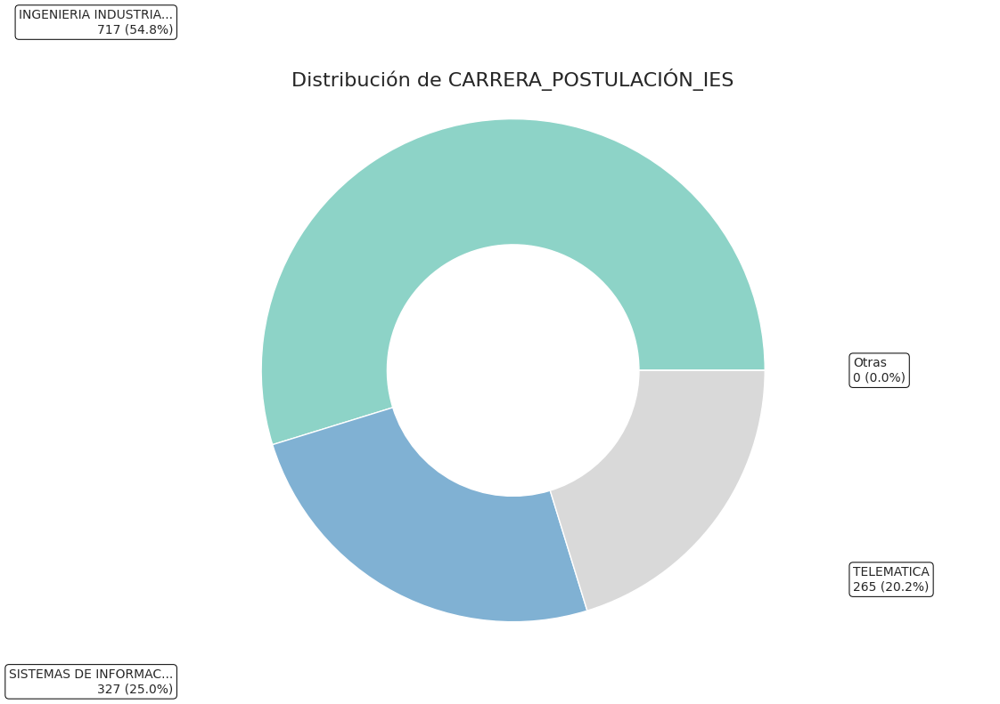

In [121]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# Se cuenta las ocurrencias de cada carrera
conteo = df_consolidado2['CARRERA_POSTULACIÓN_IES'].value_counts()

# Se selecciona las 10 carreras más frecuentes y agrupar el resto como "Otras"
top_carreras = conteo.nlargest(10)
otras = pd.Series({'Otras': conteo.iloc[10:].sum()})
conteo_final = pd.concat([top_carreras, otras])

# Se calcula los porcentajes
porcentajes = conteo_final / len(df_consolidado2) * 100

# Se crea la figura y los ejes
fig, ax = plt.subplots(figsize=(12, 8))  # Aumentamos el tamaño para mejor legibilidad

# Se genera una paleta de colores
colores = plt.cm.Set3(np.linspace(0, 1, len(conteo_final)))

# Se define el radio interno y el grosor
radio_interno = 0.25  # Reducido a la mitad (era 0.5)
grosor = 0.5

# Se crea el gráfico de pastel
wedges, texts, autotexts = ax.pie(conteo_final,
                                  colors=colores,
                                  autopct='',
                                  pctdistance=0.85,
                                  wedgeprops=dict(width=grosor, edgecolor='white'),
                                  radius=1)

# Se añade un círculo en el centro para crear un efecto de donut
centre_circle = plt.Circle((0,0), radio_interno, fc='white')
fig.gca().add_artist(centre_circle)

# Se configura las etiquetas externas
bbox_props = dict(boxstyle="round,pad=0.3", fc="w", ec="k", lw=0.72)
kw = dict(arrowprops=dict(arrowstyle="-"),
          bbox=bbox_props, zorder=0, va="center")

for i, p in enumerate(wedges):
    ang = (p.theta2 - p.theta1) / 2. + p.theta1
    y = np.sin(np.deg2rad(ang))
    x = np.cos(np.deg2rad(ang))
    horizontalalignment = {-1: "right", 1: "left"}[int(np.sign(x))]
    connectionstyle = f"angle,angleA=0,angleB={ang}"
    kw["arrowprops"].update({"connectionstyle": connectionstyle})

    # Se acorta el nombre de la carrera si es muy largo
    carrera_nombre = conteo_final.index[i][:20] + '...' if len(conteo_final.index[i]) > 20 else conteo_final.index[i]

    ax.annotate(f"{carrera_nombre}\n{conteo_final[i]} ({porcentajes[i]:.1f}%)",
                xy=(x, y), xytext=(1.35*np.sign(x), 1.4*y),
                horizontalalignment=horizontalalignment, **kw)

# Se ajusta el diseño y mostrar el gráfico
plt.title('Distribución de CARRERA_POSTULACIÓN_IES', fontsize=16)
plt.axis('equal')
plt.tight_layout()
plt.show()

##**4.2. Balanceo de datos 1309 filas con 60 columnas empleando SMOTENC para fase de Selección de Variables**

In [122]:
df_consolidado4.shape

(1309, 60)

<ipython-input-123-f00792060c06>:15: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x=aprobado_counts.index, y=aprobado_counts.values, palette='viridis')


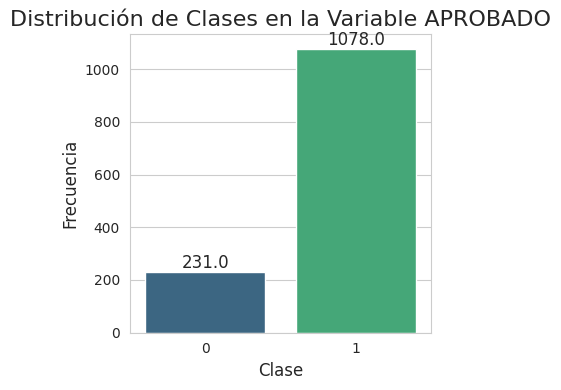

In [123]:
# Se balancea la data de entrenamiento con 1309 filas y 69 columnas

# Se conserva sin balancear la data de pruebas (test)
# para que test se mantengan datos similiares a los escenarios reales

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Se cuenta las ocurrencias de cada clase en la variable 'APROBADO'
aprobado_counts = df_consolidado4['APROBADO_FINAL_IES'].value_counts()

# Se crea el gráfico de barras con colores diferentes para cada clase
plt.figure(figsize=(4, 4))
ax = sns.barplot(x=aprobado_counts.index, y=aprobado_counts.values, palette='viridis')

# Se añade los valores en la cima de cada barra
for p in ax.patches:
    ax.annotate(f'{p.get_height()}',
                (p.get_x() + p.get_width() / 2, p.get_height()),
                ha='center', va='bottom', fontsize=12)

# Se configura títulos y etiquetas
plt.title('Distribución de Clases en la Variable APROBADO', fontsize=16)
plt.xlabel('Clase', fontsize=12)
plt.ylabel('Frecuencia', fontsize=12)

# Se muestra el gráfico
plt.tight_layout()
plt.show()


In [124]:
# Se identifica las columnas numéricas
numeric_columns = X.select_dtypes(include=[np.number]).columns

# Se identifica las columnas categóricas
categorical_columns = X.select_dtypes(exclude=[np.number]).columns

In [125]:
df_consolidado3.shape

(1309, 60)

In [126]:
df_consolidado4.shape

(1309, 60)

In [127]:
type(categorical_columns)

pandas.core.indexes.base.Index

In [128]:
categorical_columns

Index(['SEXO', 'ETNIA', 'DISCAPACIDAD', 'JORNADA_COLEGIO', 'ZONA_COLEGIO',
       'PROVINCIA_COLEGIO', 'CANTÓN_COLEGIO', 'PARROQUIA_COLEGIO',
       'TIPO_EDUCACIÓN_COLEGIO', 'NIVEL_EDUCACIÓN_COLEGIO',
       'SOSTENIMIENTO_COLEGIO', 'ÁREA_COLEGIO', 'RÉGIMEN_ESCOLAR_COLEGIO',
       'JURISDICCIÓN_COLEGIO', 'MODALIDAD_COLEGIO',
       'PARTICIPACIÓN_DOCENTE_COLEGIO', 'CARRERA_POSTULACIÓN_IES',
       'JORNADA_MTN_POSTULACIÓN_IES', 'REPETIDOR_IES', 'AULA_NIVELACIÓN_IES',
       'GRATUIDAD_IES', 'PROVINCIA_RESIDENCIA', 'CANTÓN_RESIDENCIA',
       'ESTADO_CIVIL', 'PERÍODO_APLICO_IES', 'TIPO_COLEGIO_GRADUADO',
       'PROMEDIO_GRADUACIÓN', 'TIPO_BACHILLERATO', 'AÑO_GRADUACIÓN',
       'POSEE_TÍTULO_IES', 'TIPO_TÍTULO_IES_POSEE',
       'PADECE_ENFERMEDAD_CRÓNICA', 'NOM_ENFERMEDAD_CRÓNICA', 'TRABAJA',
       'DEPENDENCIA_TRABAJO', 'JORNADA_LABORAL', 'AFILIADO_IESS',
       'ING_ECONÓMICO_FAMILIAR', 'VIVE_CON', 'DEP_ECONOMICAMENTE_DE',
       'PASATIEMPO_GENÉRICO', 'REC_ORIENTACIÓN_VOCA',
   

In [129]:
# Se convierte categorical_columns a una lista
categorical_features = categorical_columns.tolist()

In [130]:
# Se selecciona todas las columnas excepto 'APROBADO_FINAL_IES' para X
X = df_consolidado4.drop('APROBADO_FINAL_IES', axis=1)

# Se separa la variable objetivo
y = df_consolidado4['APROBADO_FINAL_IES']

In [131]:
from sklearn.model_selection import train_test_split
from imblearn.over_sampling import SMOTENC

def balance_data_with_smote(X, y, categorical_features, test_size=0.2, random_state=42):
    """
    Balancea los datos utilizando SMOTENC.

    Parámetros:
    - X: DataFrame de características.
    - y: Serie de etiquetas.
    - categorical_features: Lista de índices de características categóricas.
    - test_size: Porcentaje de datos a reservar para pruebas.
    - random_state: Semilla para la aleatorización.

    Devuelve:
    - X_train_balanced: DataFrame de características de entrenamiento balanceadas.
    - X_test: DataFrame de características de prueba sin balancear.
    - y_train_balanced: Serie de etiquetas de entrenamiento balanceadas.
    - y_test: Serie de etiquetas de prueba sin balancear.
    """

    # Dividir los datos en conjuntos de entrenamiento y prueba
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=test_size, random_state=random_state)

    # Crear el objeto SMOTENC
    smote_nc = SMOTENC(categorical_features=categorical_features, random_state=random_state)

    # Balancear solo los datos de entrenamiento
    X_train_balanced, y_train_balanced = smote_nc.fit_resample(X_train, y_train)

    return X_train_balanced, X_test, y_train_balanced, y_test


In [257]:
from sklearn.model_selection import train_test_split
from imblearn.over_sampling import SMOTENC

def balance_data_with_smote(X, y, categorical_features, test_size=0.2, random_state=42):
    """
    Balancea los datos utilizando SMOTENC, aumentando cada clase a 10000 registros.

    Parámetros:
    - X: DataFrame de características.
    - y: Serie de etiquetas.
    - categorical_features: Lista de índices de características categóricas.
    - test_size: Porcentaje de datos a reservar para pruebas.
    - random_state: Semilla para la aleatorización.

    Devuelve:
    - X_train_balanced: DataFrame de características de entrenamiento balanceadas.
    - X_test: DataFrame de características de prueba sin balancear.
    - y_train_balanced: Serie de etiquetas de entrenamiento balanceadas.
    - y_test: Serie de etiquetas de prueba sin balancear.
    """

    # Dividir los datos en conjuntos de entrenamiento y prueba
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=test_size, random_state=random_state)

    # Crear el objeto SMOTENC con sampling_strategy personalizado
    sampling_strategy = {0: 10000, 1: 10000}
    smote_nc = SMOTENC(sampling_strategy=sampling_strategy, categorical_features=categorical_features, random_state=random_state)

    # Balancear solo los datos de entrenamiento
    X_train_balanced, y_train_balanced = smote_nc.fit_resample(X_train, y_train)

    return X_train_balanced, X_test, y_train_balanced, y_test

In [258]:
X_train_balanced, X_test_unbalanced, y_train_balanced, y_test_unbalanced = balance_data_with_smote(X, y, categorical_features, test_size=0.2, random_state=42)

In [259]:
# Se valida que los datos de train este balanceados para que los modelos puedan mejorar sus resultados
# evitando aprendan de manera sesgada por la presencia de una clase mayoritaria en la variable objetivo
X_train_balanced.shape

(20000, 59)

In [260]:
y_train_balanced.shape

(20000,)

In [261]:
# Se corrobora que los datos de test se encientran con la distribucion balanceada previa los entrenamientos
y_train_balanced.value_counts()

,count
APROBADO_FINAL_IES,
1,10000
0,10000


In [262]:
X_test_unbalanced.shape

(262, 59)

In [263]:
y_test_unbalanced.shape

(262,)

In [264]:
# Se corrobora que los datos de test se encientran con la distribucion debalanceada del mundo real
y_test_unbalanced.value_counts()

,count
APROBADO_FINAL_IES,
1,213
0,49


#**5. Selección de Caracteristicas**

##**5.1. - GRUPO 1 - Métodos de Selección de Caracteristicas basados en Disminución de Impureza (MDI):: RF MDI, GB MDI, XGB MDI**

In [265]:
#GRUPO 1 - Métodos de Selección de Caracteristicas basados en Disminución de Impureza (MDI)

###**Método 1.1: Selección de Variables Relevantes mediante Random Forest: Método de Importancia basado en Impureza (MDI) (Gini Importance)**

Se conoce comúnmente como "Feature Importance" o "Importancia de Características", o Importancia de Variables en Random Forest usando Gini Importance

**Proceso:**
Para cada árbol en el bosque, se calcula cuánto mejora la medida de impureza (generalmente el índice Gini para clasificación) en cada nodo de decisión.
Esta mejora se pondera por el número de muestras que alcanza ese nodo.
Se suman estas mejoras ponderadas para cada característica en todos los árboles.
Se normalizan los valores para que sumen 1.

**Cómo determina las variables relevantes:**
Las variables que más frecuentemente se usan para hacer divisiones importantes (que reducen significativamente la impureza) en los árboles se consideran más relevantes.

In [266]:
df_consolidado4.shape

(1309, 60)

In [267]:
# Se trasalada una copia de los datos de Vista minable a nombres estandares empleado en el resto del proceso
X_train = X_train_balanced.copy()
y_train = y_train_balanced.copy()
X_test =  X_test_unbalanced.copy()
y_test =  y_test_unbalanced.copy()

<ipython-input-268-add377b12dcb>:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Importancia', y='Variable', data=rfmdi_feature_importance_df.head(30), palette='viridis')


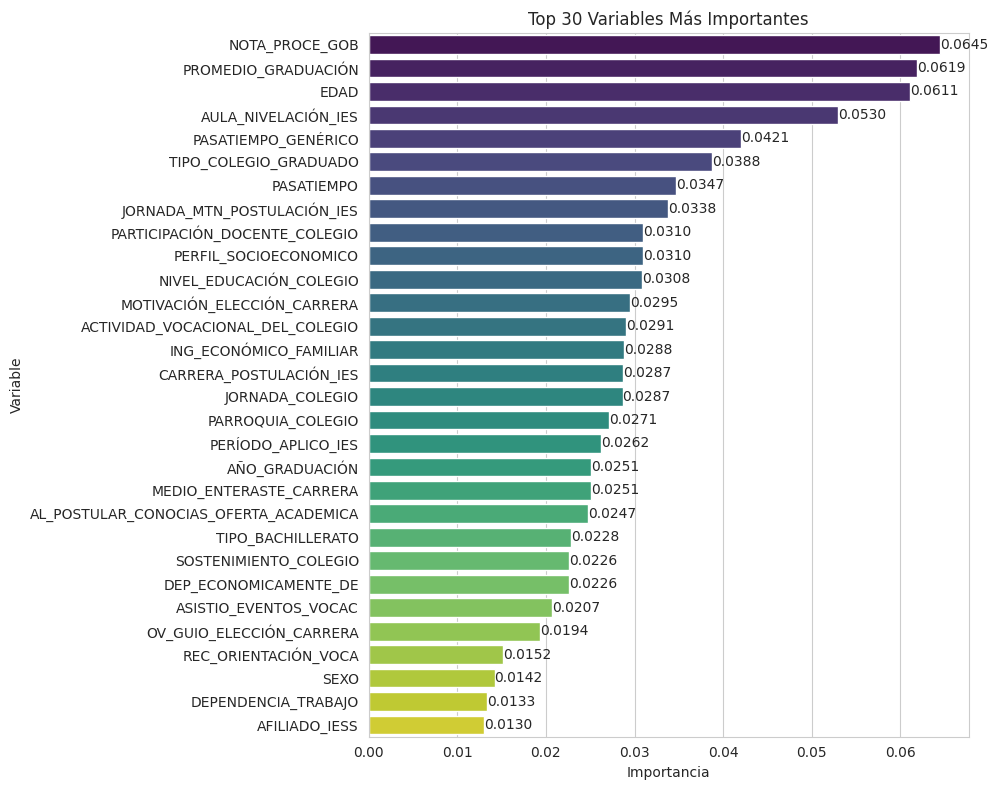


Los resultados completos se han guardado en 'importancia_variables_random_forest.csv'

El ranking de Random Forest se ha guardado en 'rf_ranking.csv'


In [268]:
import pandas as pd
import numpy as np
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import seaborn as sns

# Se identifica las columnas numéricas y categóricas
numeric_columns = X.select_dtypes(include=[np.number]).columns
categorical_columns = X.select_dtypes(exclude=[np.number]).columns

# Se entrena el modelo de Random Forest
rfmdi_model = RandomForestClassifier(n_estimators=100, random_state=42)
rfmdi_model.fit(X_train, y_train)

# Se obtiene la importancia de las variables
rfmdi_importances = rfmdi_model.feature_importances_

# Se crea un DataFrame con las importancias
rfmdi_feature_importance_df = pd.DataFrame({
    'Variable': X.columns,
    'Importancia': rfmdi_importances
}).sort_values(by='Importancia', ascending=False)

# Se calcula el ranking de las variables
rfmdi_feature_importance_df['Ranking'] = rfmdi_feature_importance_df['Importancia'].rank(ascending=False)

# Se visualiza las 30 variables más importantes con valor al final de la barra
plt.figure(figsize=(10, 8))
sns.barplot(x='Importancia', y='Variable', data=rfmdi_feature_importance_df.head(30), palette='viridis')

# Se añade los valores al final de cada barra
for index, value in enumerate(rfmdi_feature_importance_df['Importancia'].head(30)):
    plt.text(value, index, f'{value:.4f}', va='center')  # Mostrar el valor al final de la barra

plt.title('Top 30 Variables Más Importantes')
plt.xlabel('Importancia')
plt.ylabel('Variable')
plt.tight_layout()
plt.show()

# Se guarda los resultados en un archivo CSV
rfmdi_feature_importance_df.to_csv('importancia_variables_random_forest.csv', index=False)
print("\nLos resultados completos se han guardado en 'importancia_variables_random_forest.csv'")

# Se prepara los datos para el ranking agregado
rfmdi_ranking = rfmdi_feature_importance_df[['Variable', 'Ranking']].set_index('Variable')
rfmdi_ranking.columns = ['RF_Ranking']

# Se guarda el ranking para su uso posterior
rfmdi_ranking.to_csv('rf_ranking.csv')
print("\nEl ranking de Random Forest se ha guardado en 'rf_ranking.csv'")


###**Método 1.2: Selección de Variables Relevantes mediante Gradient Boosting: Método de Importancia de Características (MDI)(gain)**

Este código utiliza el método de importancia de características incorporado en GradientBoostingClassifier de scikit-learn, que se basa en la reducción de impureza (similar al método MDI en Random Forest).


Las 30 características más importantes según Gradient Boosting:
                                  feature  importance  ranking
0                     PROMEDIO_GRADUACIÓN    0.134486      1.0
1                   DEP_ECONOMICAMENTE_DE    0.059752      2.0
2                  ING_ECONÓMICO_FAMILIAR    0.058217      3.0
3                   TIPO_COLEGIO_GRADUADO    0.057286      4.0
4                                    EDAD    0.052096      5.0
5                 NIVEL_EDUCACIÓN_COLEGIO    0.050742      6.0
6   AL_POSTULAR_CONOCIAS_OFERTA_ACADEMICA    0.045167      7.0
7                 CARRERA_POSTULACIÓN_IES    0.044578      8.0
8        ACTIVIDAD_VOCACIONAL_DEL_COLEGIO    0.041723      9.0
9                     AULA_NIVELACIÓN_IES    0.036192     10.0
10            JORNADA_MTN_POSTULACIÓN_IES    0.035300     11.0
11                    PASATIEMPO_GENÉRICO    0.033800     12.0
12            MOTIVACIÓN_ELECCIÓN_CARRERA    0.033383     13.0
13                     PERÍODO_APLICO_IES    0.030651 

<ipython-input-269-faa8ea823586>:31: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='importance', y='feature', data=gbmdi_feature_importances.head(30), palette='viridis')


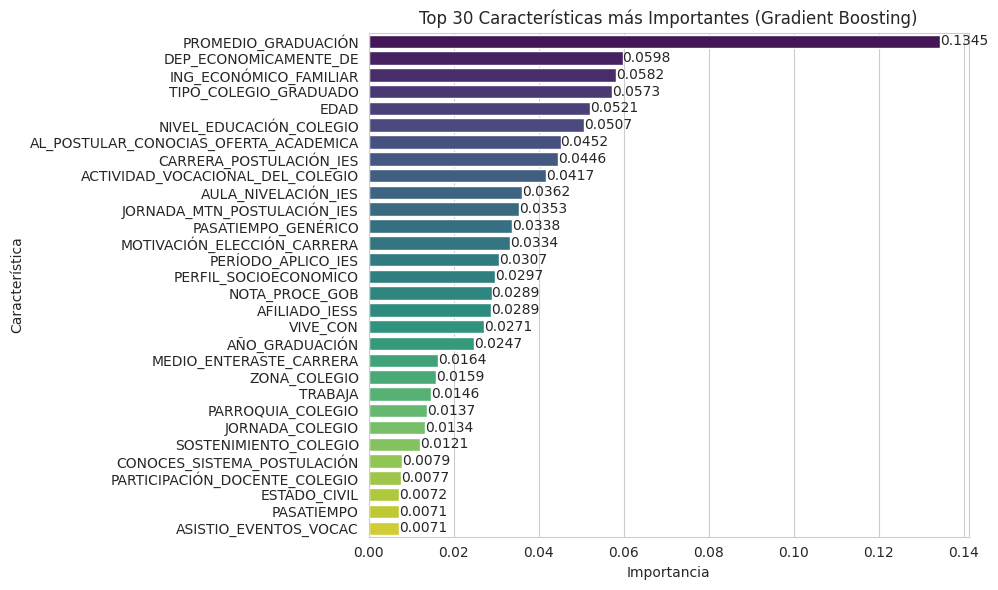


Precisión del modelo: 0.7557

El ranking de Gradient Boosting se ha guardado en 'gb_ranking.csv'

Características seleccionadas:
PROMEDIO_GRADUACIÓN
DEP_ECONOMICAMENTE_DE
ING_ECONÓMICO_FAMILIAR
TIPO_COLEGIO_GRADUADO
EDAD
NIVEL_EDUCACIÓN_COLEGIO
AL_POSTULAR_CONOCIAS_OFERTA_ACADEMICA
CARRERA_POSTULACIÓN_IES
ACTIVIDAD_VOCACIONAL_DEL_COLEGIO
AULA_NIVELACIÓN_IES
JORNADA_MTN_POSTULACIÓN_IES
PASATIEMPO_GENÉRICO
MOTIVACIÓN_ELECCIÓN_CARRERA
PERÍODO_APLICO_IES
PERFIL_SOCIOECONOMICO
NOTA_PROCE_GOB
AFILIADO_IESS
VIVE_CON
AÑO_GRADUACIÓN
MEDIO_ENTERASTE_CARRERA
ZONA_COLEGIO
TRABAJA
PARROQUIA_COLEGIO
JORNADA_COLEGIO
SOSTENIMIENTO_COLEGIO
CONOCES_SISTEMA_POSTULACIÓN
PARTICIPACIÓN_DOCENTE_COLEGIO
ESTADO_CIVIL
PASATIEMPO
ASISTIO_EVENTOS_VOCAC

Las características seleccionadas se han guardado en 'selected_features_gradient_boosting.csv'

Precisión del modelo con características seleccionadas: 0.7519


In [269]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.metrics import accuracy_score
import seaborn as sns

numeric_columns = X.select_dtypes(include=[np.number]).columns
categorical_columns = X.select_dtypes(exclude=[np.number]).columns

# Se crea y entrenar el modelo Gradient Boosting
gbmdi_model = GradientBoostingClassifier(n_estimators=100, learning_rate=0.1, max_depth=3, random_state=42)
gbmdi_model.fit(X_train, y_train)

# Se calcula la importancia de las características
gbmdi_importances = gbmdi_model.feature_importances_
gbmdi_feature_importances = pd.DataFrame({'feature': X.columns, 'importance': gbmdi_importances})
gbmdi_feature_importances = gbmdi_feature_importances.sort_values('importance', ascending=False).reset_index(drop=True)

# Se calcula el ranking de las características
gbmdi_feature_importances['ranking'] = gbmdi_feature_importances['importance'].rank(ascending=False)

# Se muestra las 30 características más importantes
print("Las 30 características más importantes según Gradient Boosting:")
print(gbmdi_feature_importances.head(30))

# Se visualiza la importancia de las características
plt.figure(figsize=(10, 6))
sns.barplot(x='importance', y='feature', data=gbmdi_feature_importances.head(30), palette='viridis')

# Se añade los valores al final de cada barra
for index, value in enumerate(gbmdi_feature_importances['importance'].head(30)):
    plt.text(value, index, f'{value:.4f}', va='center')  # Mostrar el valor al final de la barra

plt.title('Top 30 Características más Importantes (Gradient Boosting)')
plt.xlabel('Importancia')
plt.ylabel('Característica')
plt.tight_layout()
plt.show()

# Se evalua el modelo
y_pred = gbmdi_model.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)
print(f"\nPrecisión del modelo: {accuracy:.4f}")

# Se prepara el ranking para el cálculo agregado
gbmdi_feature_importances['GB_Ranking'] = gbmdi_feature_importances['importance'].rank(ascending=False)

# Se guarda el ranking para su uso posterior
gbmdi_feature_importances.to_csv('gb_ranking.csv')
print("\nEl ranking de Gradient Boosting se ha guardado en 'gb_ranking.csv'")

gbmdi_ranking = gbmdi_feature_importances[['feature', 'GB_Ranking']].set_index('feature')

# Se selecciona las características más importantes (por ejemplo, las top 30)
top_features = gbmdi_feature_importances['feature'][:30].tolist()

# Se crea un nuevo DataFrame con las características seleccionadas
X_selected = X[top_features]

print("\nCaracterísticas seleccionadas:")
for feature in top_features:
    print(feature)

# Se guarda las características seleccionadas en un archivo
pd.DataFrame({'selected_features': top_features}).to_csv('selected_features_gradient_boosting.csv', index=False)
print("\nLas características seleccionadas se han guardado en 'selected_features_gradient_boosting.csv'")

# Se evalua el modelo con las características seleccionadas
X_train_selected = X_train[top_features]
X_test_selected = X_test[top_features]

gbmdi_selected = GradientBoostingClassifier(n_estimators=100, learning_rate=0.1, max_depth=3, random_state=42)
gbmdi_selected.fit(X_train_selected, y_train)

y_pred_selected = gbmdi_selected.predict(X_test_selected)
accuracy_selected = accuracy_score(y_test, y_pred_selected)
print(f"\nPrecisión del modelo con características seleccionadas: {accuracy_selected:.4f}")


###**Método 1.3: Selección de Variables con XGBoost: basado en Análisis de la importancia de las características**


Las 30 características más importantes según XGBoost:
                                  feature  importance  ranking
0                     PROMEDIO_GRADUACIÓN    0.054113      1.0
1                   TIPO_COLEGIO_GRADUADO    0.052357      2.0
2                                VIVE_CON    0.048695      3.0
3                   DEP_ECONOMICAMENTE_DE    0.045982      4.0
4                  ING_ECONÓMICO_FAMILIAR    0.040247      5.0
5                 NIVEL_EDUCACIÓN_COLEGIO    0.037719      6.0
6                   ASISTIO_EVENTOS_VOCAC    0.035717      7.0
7   AL_POSTULAR_CONOCIAS_OFERTA_ACADEMICA    0.033250      8.0
8                 CARRERA_POSTULACIÓN_IES    0.033057      9.0
9             MOTIVACIÓN_ELECCIÓN_CARRERA    0.032586     10.0
10                    PASATIEMPO_GENÉRICO    0.032386     11.0
11                           ZONA_COLEGIO    0.030048     12.0
12       ACTIVIDAD_VOCACIONAL_DEL_COLEGIO    0.029799     13.0
13            PLANEA_CAMBIARSE_DE_CARRERA    0.029569     14.0
1

<ipython-input-270-29670aeddee6>:31: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='importance', y='feature', data=xgbmdi_df_feature_importances.head(30), palette='viridis')


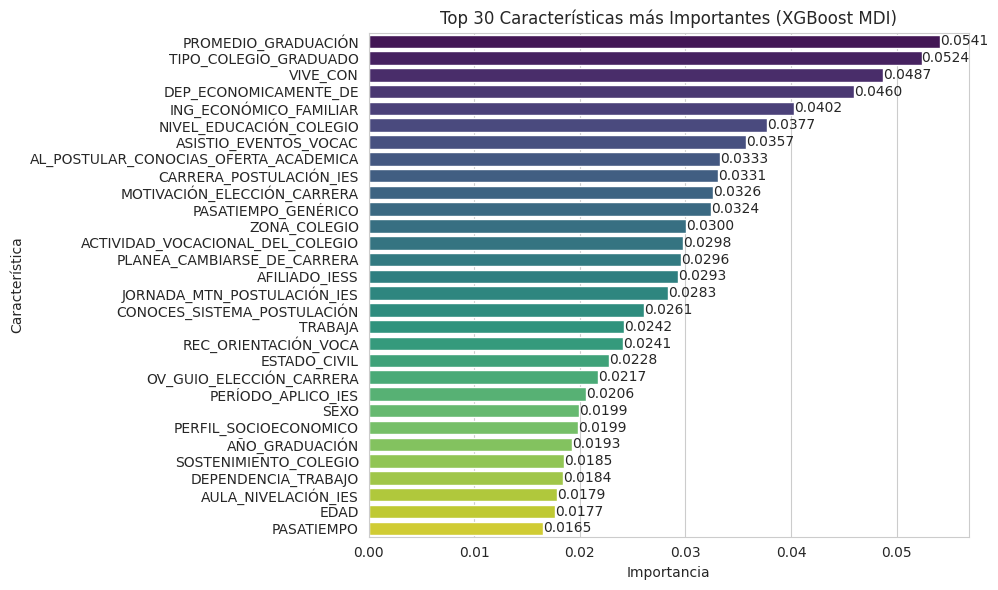


El ranking de XGBoost MDI se ha guardado en 'xgbmdi_ranking.csv'

Características seleccionadas:
PROMEDIO_GRADUACIÓN
TIPO_COLEGIO_GRADUADO
VIVE_CON
DEP_ECONOMICAMENTE_DE
ING_ECONÓMICO_FAMILIAR
NIVEL_EDUCACIÓN_COLEGIO
ASISTIO_EVENTOS_VOCAC
AL_POSTULAR_CONOCIAS_OFERTA_ACADEMICA
CARRERA_POSTULACIÓN_IES
MOTIVACIÓN_ELECCIÓN_CARRERA
PASATIEMPO_GENÉRICO
ZONA_COLEGIO
ACTIVIDAD_VOCACIONAL_DEL_COLEGIO
PLANEA_CAMBIARSE_DE_CARRERA
AFILIADO_IESS
JORNADA_MTN_POSTULACIÓN_IES
CONOCES_SISTEMA_POSTULACIÓN
TRABAJA
REC_ORIENTACIÓN_VOCA
ESTADO_CIVIL
OV_GUIO_ELECCIÓN_CARRERA
PERÍODO_APLICO_IES
SEXO
PERFIL_SOCIOECONOMICO
AÑO_GRADUACIÓN
SOSTENIMIENTO_COLEGIO
DEPENDENCIA_TRABAJO
AULA_NIVELACIÓN_IES
EDAD
PASATIEMPO

Las características seleccionadas se han guardado en 'selected_features_xgbmdi.csv'

Precisión del modelo con características seleccionadas: 0.7786


In [270]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from xgboost import XGBClassifier
from sklearn.metrics import accuracy_score
import seaborn as sns

# Se crea y entrena el modelo XGBoost
xgbmdi_model = XGBClassifier(n_estimators=100, learning_rate=0.1, max_depth=3, random_state=42)
xgbmdi_model.fit(X_train, y_train)

# Se calcula la importancia de las características
xgbmdi_feature_importances = xgbmdi_model.feature_importances_

# Se formatea los datos a estructura de dataframe
xgbmdi_df_feature_importances = pd.DataFrame({'feature': X.columns, 'importance': xgbmdi_feature_importances})

# Se ordena por importancia descentente
xgbmdi_df_feature_importances = xgbmdi_df_feature_importances.sort_values('importance', ascending=False).reset_index(drop=True)

# Se calcula el ranking de las características
xgbmdi_df_feature_importances['ranking'] = xgbmdi_df_feature_importances['importance'].rank(ascending=False)

# Se muestra y visualiza las 30 características más importantes
print("Las 30 características más importantes según XGBoost:")
print(xgbmdi_df_feature_importances.head(30))

plt.figure(figsize=(10, 6))
sns.barplot(x='importance', y='feature', data=xgbmdi_df_feature_importances.head(30), palette='viridis')

# Se añade los valores al final de cada barra
for index, value in enumerate(xgbmdi_df_feature_importances['importance'].head(30)):
    plt.text(value, index, f'{value:.4f}', va='center')  # Mostrar el valor al final de la barra

plt.title('Top 30 Características más Importantes (XGBoost MDI)')
plt.xlabel('Importancia')
plt.ylabel('Característica')
plt.tight_layout()
plt.show()

# Se prepara el ranking para el cálculo agregado
xgbmdi_ranking = xgbmdi_df_feature_importances[['feature', 'ranking']].set_index('feature')
xgbmdi_ranking.columns = ['XGBMDI_Ranking']

# Se guarda el ranking para su uso posterior
xgbmdi_ranking.to_csv('xgbmdi_ranking.csv')
print("\nEl ranking de XGBoost MDI se ha guardado en 'xgbmdi_ranking.csv'")

# Se selecciona las características más importantes (por ejemplo, las top 30)
top_features = xgbmdi_df_feature_importances['feature'][:30].tolist()

# Se crea un nuevo DataFrame con las características seleccionadas
X_selected = X[top_features]

print("\nCaracterísticas seleccionadas:")
for feature in top_features:
    print(feature)

# Se guarda las características seleccionadas en un archivo
pd.DataFrame({'selected_features': top_features}).to_csv('selected_features_xgbmdi.csv', index=False)
print("\nLas características seleccionadas se han guardado en 'selected_features_xgbmdi.csv'")

# Se evalua el modelo con las características seleccionadas
X_train_selected = X_train[top_features]
X_test_selected = X_test[top_features]

xgbmdi_selected = XGBClassifier(n_estimators=100, learning_rate=0.1, max_depth=3, random_state=42)
xgbmdi_selected.fit(X_train_selected, y_train)

y_pred_selected = xgbmdi_selected.predict(X_test_selected)
accuracy_selected = accuracy_score(y_test, y_pred_selected)
print(f"\nPrecisión del modelo con características seleccionadas: {accuracy_selected:.4f}")

###**Ranking Agregado para Grupo 1 - Metodos basados disminucion de Impureza: RF MDI, GB MDI, XGB MDI****

Top 30 variables según el ranking agregado:
                                       RF_Ranking  GB_Ranking  XGB_Ranking  \
PROMEDIO_GRADUACIÓN                           2.0         1.0          1.0   
TIPO_COLEGIO_GRADUADO                         6.0         4.0          2.0   
DEP_ECONOMICAMENTE_DE                        24.0         2.0          4.0   
EDAD                                          3.0         5.0         29.0   
ING_ECONÓMICO_FAMILIAR                       14.0         3.0          5.0   
NIVEL_EDUCACIÓN_COLEGIO                      11.0         6.0          6.0   
AL_POSTULAR_CONOCIAS_OFERTA_ACADEMICA        21.0         7.0          8.0   
CARRERA_POSTULACIÓN_IES                      15.0         8.0          9.0   
AULA_NIVELACIÓN_IES                           4.0        10.0         28.0   
PASATIEMPO_GENÉRICO                           5.0        12.0         11.0   
JORNADA_MTN_POSTULACIÓN_IES                   8.0        11.0         16.0   
MOTIVACIÓN_ELECCIÓN_

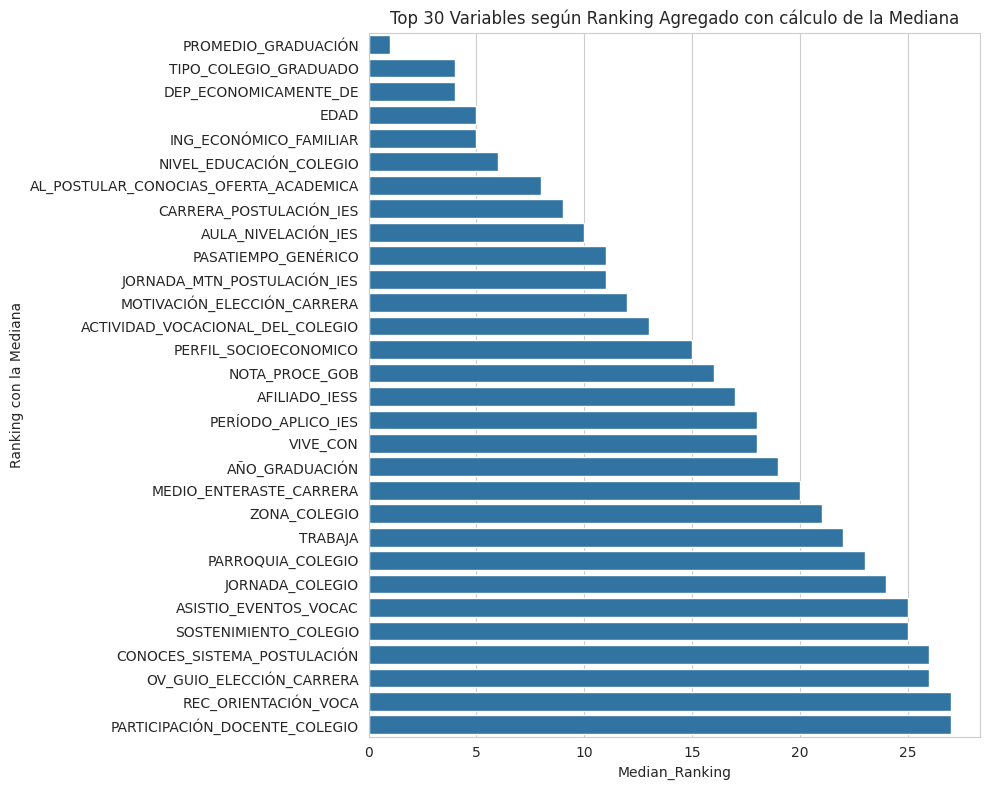


Matríz de correlación entre rankings:
                RF_Ranking  GB_Ranking  XGB_Ranking  Median_Ranking
RF_Ranking        1.000000    0.557077    -0.133203        0.581306
GB_Ranking        0.557077    1.000000     0.474391        0.971931
XGB_Ranking      -0.133203    0.474391     1.000000        0.539066
Median_Ranking    0.581306    0.971931     0.539066        1.000000


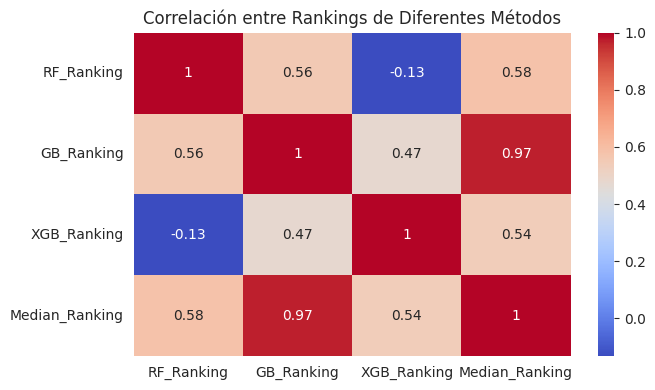


Variables consistentemente importantes en los 5 métodos:
                                       RF_Ranking  GB_Ranking  XGB_Ranking  \
PROMEDIO_GRADUACIÓN                           2.0         1.0          1.0   
TIPO_COLEGIO_GRADUADO                         6.0         4.0          2.0   
DEP_ECONOMICAMENTE_DE                        24.0         2.0          4.0   
EDAD                                          3.0         5.0         29.0   
ING_ECONÓMICO_FAMILIAR                       14.0         3.0          5.0   
NIVEL_EDUCACIÓN_COLEGIO                      11.0         6.0          6.0   
AL_POSTULAR_CONOCIAS_OFERTA_ACADEMICA        21.0         7.0          8.0   
CARRERA_POSTULACIÓN_IES                      15.0         8.0          9.0   
AULA_NIVELACIÓN_IES                           4.0        10.0         28.0   
PASATIEMPO_GENÉRICO                           5.0        12.0         11.0   
JORNADA_MTN_POSTULACIÓN_IES                   8.0        11.0         16.0   
MOTIVA

In [271]:
# Se cálcula el Ranking Agregado con 3 Métodos de Grupo 1: RF MDI, GB MDI, XGB MDI
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Se combina los rankings en un solo DataFrame
combined_rankings = pd.concat([rfmdi_ranking, gbmdi_ranking, xgbmdi_ranking], axis=1, join='outer')

# Se renombra las columnas para claridad
combined_rankings.columns = ['RF_Ranking', 'GB_Ranking', 'XGB_Ranking']

# Se calcula el ranking promedio empleando la variante de Mediana para mejores resultados
#combined_rankings['Average_Ranking'] = combined_rankings.mean(axis=1)
combined_rankings['Median_Ranking'] = combined_rankings.median(axis=1)

# Se ordena por el ranking promedio
final_ranking = combined_rankings.sort_values('Median_Ranking')

# Se selecciona las top 30 variables
top_30_variables = final_ranking.head(30)

print("Top 30 variables según el ranking agregado:")
print(top_30_variables)

# Se guarda los resultados
top_30_variables.to_csv('top_30_variables_ranking_agregado.csv')
print("\nLos resultados se han guardado en 'top_30_variables_ranking_agregado.csv'")

# Se realizar un análisis adicional
print("\nEstadísticas del ranking agregado:")
print(top_30_variables['Median_Ranking'].describe())

# Se visualiza del ranking agregado barras horizontales
plt.figure(figsize=(10, 8))
ax = sns.barplot(x='Median_Ranking', y=top_30_variables.index, data=top_30_variables)
plt.title('Top 30 Variables según Ranking Agregado con cálculo de la Mediana')
plt.ylabel('Ranking con la Mediana')
plt.tight_layout()
plt.show()

# Se compara el rankings entre métodos
correlation_matrix = top_30_variables[combined_rankings.columns].corr()

print("\nMatríz de correlación entre rankings:")
print(correlation_matrix)

# Se visualiza la matriz de correlación
plt.figure(figsize=(7, 4))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')
plt.title('Correlación entre Rankings de Diferentes Métodos')
plt.tight_layout()
plt.show()

# Se identificar variables consistentemente importantes
consistent_variables = top_30_variables[
    (top_30_variables['RF_Ranking'] <= 30) &
    (top_30_variables['GB_Ranking'] <= 30) &
    (top_30_variables['XGB_Ranking'] <= 30)
]

print("\nVariables consistentemente importantes en los 5 métodos:")
print(consistent_variables)

##**5.2. GRUPO 2 - Métodos de selección de caracteristicas basados en Permutación de Importancia: RF PI, GB PI, XGB PI**

###**Método 2.1: Selección de Variables Relevantes mediante Random Forest: Método de Permutación de Importancias (Permutation Importance)**

Método de Permutación de Importancias (Permutation Importance):
Este un método mejorados.

**Proceso**:
Se entrena el modelo con todas las características.
Para cada característica:
Se permutan aleatoriamente sus valores en el conjunto de validación.
Se hace una predicción con el modelo usando estos datos permutados.
Se calcula la disminución en el rendimiento del modelo (por ejemplo, en precisión).
Se repite este proceso varias veces para cada característica para obtener una estimación estable.

**Cómo determina las variables relevantes**:
Las variables cuya permutación causa la mayor disminución en el rendimiento del modelo se consideran las más importantes.

Las 30 variables más relevantes según la importancia basada en permutaciones:
                                  feature  importance       std  ranking
0                          NOTA_PROCE_GOB    0.012595  0.007048      1.0
1                  ING_ECONÓMICO_FAMILIAR    0.009924  0.007672      2.0
2                   DEP_ECONOMICAMENTE_DE    0.008015  0.008088      3.0
3                         JORNADA_LABORAL    0.006489  0.001749      4.0
4                     DEPENDENCIA_TRABAJO    0.006107  0.003053      5.0
5                                    SEXO    0.005725  0.004267      6.0
6                                VIVE_CON    0.004962  0.002981      7.0
7                            ZONA_COLEGIO    0.004198  0.003170      8.0
8            ESTAS_DEACUERDO_SISTEMA_POST    0.004198  0.001145      9.0
9                      PERÍODO_APLICO_IES    0.003817  0.003817     10.5
10                  TIPO_COLEGIO_GRADUADO    0.003817  0.006611     10.5
11                      CANTÓN_RESIDENCIA    0

<ipython-input-272-9c5d831a4a18>:48: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x='importance', y='feature', data=rfpi_importances.head(10), palette='viridis')


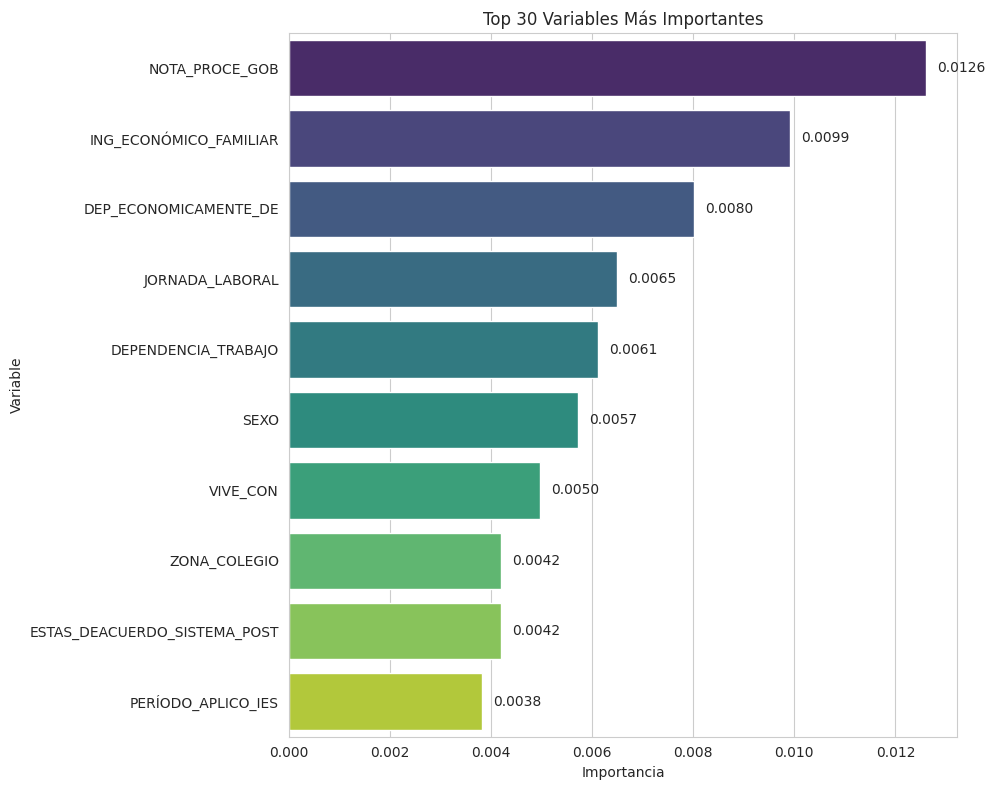

In [272]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.inspection import permutation_importance
from sklearn.preprocessing import LabelEncoder
import matplotlib.pyplot as plt
import seaborn as sns

# La división realizada YX y Y en train y test se conserva del método RF MDI

# Crear y entrenar el modelo Random Forest
rfpi_model = RandomForestClassifier(n_estimators=100, random_state=42)
rfpi_model.fit(X_train, y_train)

# Se calcula la importancia basada en permutaciones
rfpi_result = permutation_importance(rfpi_model, X_test, y_test, n_repeats=10, random_state=42, n_jobs=-1)

# Se crea un DataFrame con los resultados
rfpi_importances = pd.DataFrame({
    'feature': X.columns,
    'importance': rfpi_result.importances_mean,
    'std': rfpi_result.importances_std
})

# Se ordena las características por importancia
rfpi_importances = rfpi_importances.sort_values('importance', ascending=False).reset_index(drop=True)

# Se calcula el ranking de las variables
rfpi_importances['ranking'] = rfpi_importances['importance'].rank(ascending=False)

# Se muestr las 30 características más importantes
print("Las 30 variables más relevantes según la importancia basada en permutaciones:")
print(rfpi_importances.head(30))

# Se crea un DataFrame con el ranking para el cálculo agregado
rfpi_ranking = rfpi_importances[['feature', 'ranking']].set_index('feature')
rfpi_ranking.columns = ['RF_Permutation_Ranking']

# Se Selecciona las características más importantes (por ejemplo, las top 30)
top_features = rfpi_importances['feature'][:30].tolist()

# Se crea un nuevo DataFrame con las características seleccionadas
X_selected = X[top_features]

# Se visualiza las 30 variables más importantes con valores en la parte superior de las barras verticales
plt.figure(figsize=(10, 8))
ax = sns.barplot(x='importance', y='feature', data=rfpi_importances.head(10), palette='viridis')
plt.title('Top 30 Variables Más Importantes')
plt.xlabel('Importancia')
plt.ylabel('Variable')

# Se añade los valores al final de cada barra (en la parte superior) con un desplazamiento adicional de 8 píxeles a la derecha
for p in ax.patches:
    ax.annotate(f'{p.get_width():.4f}',
                (p.get_width(), p.get_y() + p.get_height() / 2),
                ha='left', va='center',
                xytext=(8, 0),  # Desplazamos 8 píxeles a la derecha
                textcoords='offset points')

plt.tight_layout()
plt.show()

In [273]:
# Función para añadir etiquetas en las barras horizontales
def add_value_labels(ax, spacing=5):
    for rect in ax.patches:
        # Get X and Y placement of label from rect.
        x_value = rect.get_width()
        y_value = rect.get_y() + rect.get_height() / 2

        # Number of points between bar and label. Change to your liking.
        space = spacing
        # Vertical alignment for positive values
        ha = 'left'

        # If value of bar is negative: Place label left of bar
        if x_value < 0:
            # Invert space to place label to the left
            space *= -1
            # Horizontally align label at right
            ha = 'right'

        # Use X value as label and format number with one decimal place
        label = "{:.2f}".format(x_value)

        # Create annotation
        plt.annotate(
            label,                      # Use `label` as label
            (x_value, y_value),         # Place label at end of the bar
            xytext=(space, 0),          # Horizontally shift label by `space`
            textcoords="offset points", # Interpret `xytext` as offset in points
            va='center',                # Vertically center label
            ha=ha)                      # Horizontally align label differently for
                                        # positive and negative values.


In [274]:
# Función para añadir etiquetas en las barras verticales
def add_BarVertical_value_labels(ax, spacing=5):
    for rect in ax.patches:
        # Obtener la altura de la barra
        height = rect.get_height()

        # Calcular la posición x e y para la etiqueta
        x_value = rect.get_x() + rect.get_width() / 2
        y_value = height

        # Formatear el valor con dos decimales
        label = f"{height:.2f}"

        # Añadir la etiqueta
        ax.annotate(label,
                    (x_value, y_value),
                    xytext=(0, spacing),  # Desplazamiento vertical
                    textcoords="offset points",
                    ha='center',
                    va='bottom')

###**Método 2.2: Selección de Variables Relevantes mediante Gradient Boosting basado en permutaciones**

Las 30 características más importantes según Gradient Boosting (Permutación):
                                  feature    importance  ranking
0                   DEP_ECONOMICAMENTE_DE  2.366412e-02      1.0
1                  ING_ECONÓMICO_FAMILIAR  2.022901e-02      2.0
2                          NOTA_PROCE_GOB  1.374046e-02      3.0
3                   TIPO_COLEGIO_GRADUADO  1.335878e-02      4.0
4                                    EDAD  1.068702e-02      5.0
5                 CARRERA_POSTULACIÓN_IES  1.030534e-02      6.0
6                     PROMEDIO_GRADUACIÓN  1.030534e-02      7.0
7                 MEDIO_ENTERASTE_CARRERA  9.541985e-03      8.0
8   AL_POSTULAR_CONOCIAS_OFERTA_ACADEMICA  8.396947e-03      9.0
9                          AÑO_GRADUACIÓN  8.015267e-03     10.0
10                      PARROQUIA_COLEGIO  7.633588e-03     11.5
11                  SOSTENIMIENTO_COLEGIO  7.633588e-03     11.5
12                    PASATIEMPO_GENÉRICO  7.251908e-03     13.0
13          

<ipython-input-275-d74f116e8f5f>:32: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='importance', y='feature', data=gbpi_feature_importances.head(10), palette='viridis')


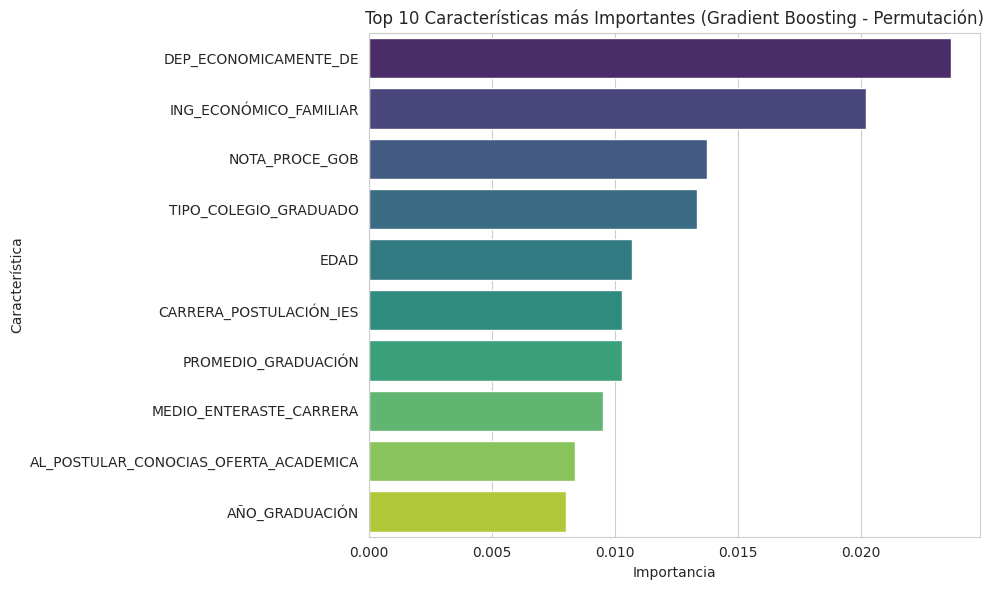


El ranking de Gradient Boosting con Permutación se ha guardado en 'gb_permutation_ranking.csv'

Precisión del modelo: 0.7557

Características seleccionadas:
DEP_ECONOMICAMENTE_DE
ING_ECONÓMICO_FAMILIAR
NOTA_PROCE_GOB
TIPO_COLEGIO_GRADUADO
EDAD
CARRERA_POSTULACIÓN_IES
PROMEDIO_GRADUACIÓN
MEDIO_ENTERASTE_CARRERA
AL_POSTULAR_CONOCIAS_OFERTA_ACADEMICA
AÑO_GRADUACIÓN

Precisión del modelo con características seleccionadas: 0.7023


In [275]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.inspection import permutation_importance
from sklearn.metrics import accuracy_score
import seaborn as sns

# Se crea y entrena el modelo Gradient Boosting
gbpi = GradientBoostingClassifier(n_estimators=100, learning_rate=0.1, max_depth=3, random_state=42)
gbpi.fit(X_train, y_train)

# Se calcula la importancia de las características usando permutación
gbpi_result = permutation_importance(gbpi, X_test, y_test, n_repeats=10, random_state=42)

gbpi_feature_importances = pd.DataFrame({
    'feature': X.columns,
    'importance': gbpi_result.importances_mean
})
gbpi_feature_importances = gbpi_feature_importances.sort_values('importance', ascending=False).reset_index(drop=True)

# Se calcula el ranking de las características
gbpi_feature_importances['ranking'] = gbpi_feature_importances['importance'].rank(ascending=False)

# Se muestra las 30 características más importantes
print("Las 30 características más importantes según Gradient Boosting (Permutación):")
print(gbpi_feature_importances.head(30))

plt.figure(figsize=(10, 6))
sns.barplot(x='importance', y='feature', data=gbpi_feature_importances.head(10), palette='viridis')
plt.title('Top 10 Características más Importantes (Gradient Boosting - Permutación)')
plt.xlabel('Importancia')
plt.ylabel('Característica')
plt.tight_layout()
plt.show()

# Se prepara el ranking para el cálculo agregado
gbpi_ranking = gbpi_feature_importances[['feature', 'ranking']].set_index('feature')
gbpi_ranking.columns = ['GB_Permutation_Ranking']

# Se guarda el ranking para su uso posterior
gbpi_ranking.to_csv('gb_permutation_ranking.csv')
print("\nEl ranking de Gradient Boosting con Permutación se ha guardado en 'gb_permutation_ranking.csv'")

# Se evalua el modelo
y_pred = gbpi.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)
print(f"\nPrecisión del modelo: {accuracy:.4f}")

# Se selecciona las características más importantes (por ejemplo, las top 30)
top_features = gbpi_feature_importances['feature'][:10].tolist()

# Se crea un nuevo DataFrame con las características seleccionadas
X_selected = X[top_features]

print("\nCaracterísticas seleccionadas:")
for feature in top_features:
    print(feature)

# Se evalua el modelo con las características seleccionadas
X_train_selected = X_train[top_features]
X_test_selected = X_test[top_features]

gbpi_selected = GradientBoostingClassifier(n_estimators=100, learning_rate=0.1, max_depth=3, random_state=42)
gbpi_selected.fit(X_train_selected, y_train)

y_pred_selected = gbpi_selected.predict(X_test_selected)
accuracy_selected = accuracy_score(y_test, y_pred_selected)
print(f"\nPrecisión del modelo con características seleccionadas: {accuracy_selected:.4f}")

In [276]:
import shap

###**Método 2.3: Selección de Variables con XGBoost: Método basado en permutación de importancias.**

Las 30 características más importantes según XGBoost (Permutación):
                                  feature  importance       std  ranking
43                  DEP_ECONOMICAMENTE_DE    0.025954  0.009626      1.0
30                    PROMEDIO_GRADUACIÓN    0.017557  0.011973      2.0
41                 ING_ECONÓMICO_FAMILIAR    0.014504  0.011801      3.0
44                    PASATIEMPO_GENÉRICO    0.014504  0.009776      4.0
51  AL_POSTULAR_CONOCIAS_OFERTA_ACADEMICA    0.014122  0.010529      5.0
5                            ZONA_COLEGIO    0.012214  0.008500      6.0
27                         NOTA_PROCE_GOB    0.012214  0.013527      7.0
29                  TIPO_COLEGIO_GRADUADO    0.011069  0.006489      8.0
17                CARRERA_POSTULACIÓN_IES    0.009924  0.004250      9.0
52                MEDIO_ENTERASTE_CARRERA    0.009160  0.006432     10.0
11                  SOSTENIMIENTO_COLEGIO    0.007634  0.006154     11.0
25                      CANTÓN_RESIDENCIA    0.005725  0

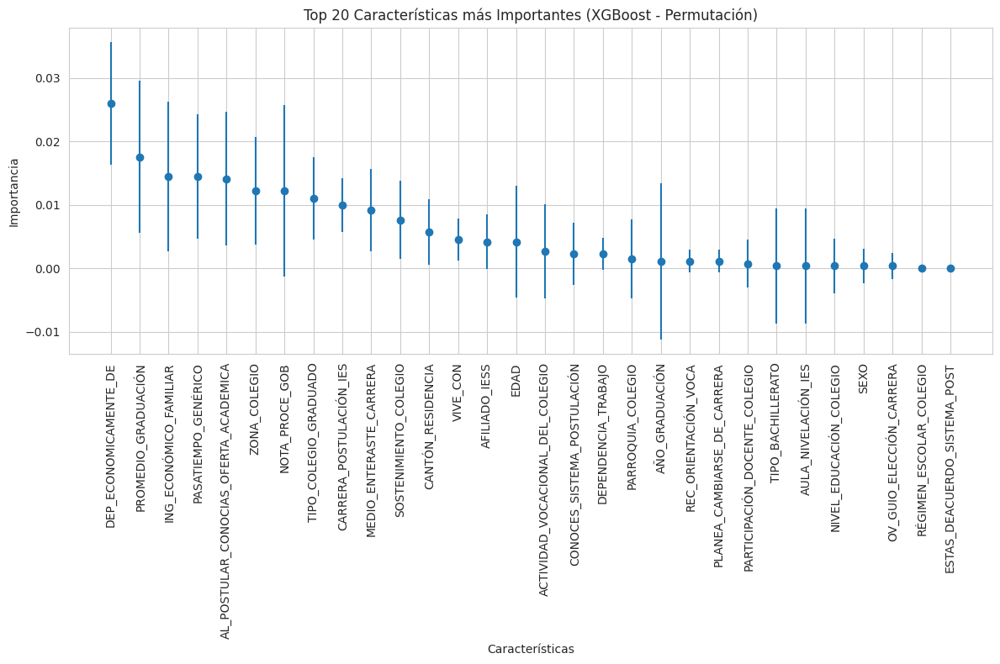


Precisión del modelo: 0.7634

Las características seleccionadas se han guardado en 'selected_features_xgboost_permutation.csv'

El ranking de XGBoost con Permutación se ha guardado en 'xgbpi_ranking.csv'

Primeras filas del ranking de XGBoost con Permutación:
                                       XGBPI_Ranking
feature                                             
DEP_ECONOMICAMENTE_DE                            1.0
PROMEDIO_GRADUACIÓN                              2.0
ING_ECONÓMICO_FAMILIAR                           3.0
PASATIEMPO_GENÉRICO                              4.0
AL_POSTULAR_CONOCIAS_OFERTA_ACADEMICA            5.0


In [277]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from xgboost import XGBClassifier
from sklearn.inspection import permutation_importance
from sklearn.metrics import accuracy_score

# Se crea y entrenar el modelo XGBoost
xgbpi_model = XGBClassifier(n_estimators=100, learning_rate=0.1, max_depth=3, random_state=42)
xgbpi_model.fit(X_train, y_train)

# Se calcula la importancia de las características usando permutación
result = permutation_importance(xgbpi_model, X_test, y_test, n_repeats=10, random_state=42)

# Se crea un DataFrame con los resultados
xgbpi_df_feature_importance = pd.DataFrame({
    'feature': X.columns,
    'importance': result.importances_mean,
    'std': result.importances_std
}).sort_values('importance', ascending=False)

# Se calcula el ranking de las características
xgbpi_df_feature_importance['ranking'] = xgbpi_df_feature_importance['importance'].rank(ascending=False)


# Se muestra las 30 características más importantes
print("Las 30 características más importantes según XGBoost (Permutación):")
print(xgbpi_df_feature_importance.head(30))

# Se visualiza las 30 características más importantes
plt.figure(figsize=(12, 8))
plt.errorbar(range(30), xgbpi_df_feature_importance['importance'][:30], yerr=xgbpi_df_feature_importance['std'][:30], fmt='o')
plt.xticks(range(30), xgbpi_df_feature_importance['feature'][:30], rotation=90)
plt.title('Top 20 Características más Importantes (XGBoost - Permutación)')
plt.xlabel('Características')
plt.ylabel('Importancia')
plt.tight_layout()
plt.show()

# Evaluar el modelo
y_pred = xgbpi_model.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)
print(f"\nPrecisión del modelo: {accuracy:.4f}")

# Seleccionar las características más importantes (por ejemplo, las top 30)
top_features = xgbpi_df_feature_importance['feature'][:30].tolist()

# Guardar las características seleccionadas en un archivo
pd.DataFrame({'selected_features': top_features}).to_csv('selected_features_xgboost_permutation.csv', index=False)
print("\nLas características seleccionadas se han guardado en 'selected_features_xgboost_permutation.csv'")

# Preparar el ranking para el cálculo agregado
xgbpi_ranking = xgbpi_df_feature_importance[['feature', 'ranking']].set_index('feature')
xgbpi_ranking.columns = ['XGBPI_Ranking']

# Guardar el ranking para su uso posterior
xgbpi_ranking.to_csv('xgbpi_ranking.csv')
print("\nEl ranking de XGBoost con Permutación se ha guardado en 'xgbpi_ranking.csv'")

# Opcional: Mostrar las primeras filas del ranking
print("\nPrimeras filas del ranking de XGBoost con Permutación:")
print(xgbpi_ranking.head())

###**Ranking Agregado del Grupo 2 - Métodos con Permutación: RF PI, GB PI, XGB PI**

Top 30 variables según el ranking agregado basado en Mediana:
                                       RF_Permutation_Ranking  \
feature                                                         
DEP_ECONOMICAMENTE_DE                                     3.0   
ING_ECONÓMICO_FAMILIAR                                    2.0   
NOTA_PROCE_GOB                                            1.0   
PROMEDIO_GRADUACIÓN                                      33.0   
ZONA_COLEGIO                                              8.0   
TIPO_COLEGIO_GRADUADO                                    10.5   
CARRERA_POSTULACIÓN_IES                                  57.0   
AL_POSTULAR_CONOCIAS_OFERTA_ACADEMICA                    19.0   
MEDIO_ENTERASTE_CARRERA                                  19.0   
SOSTENIMIENTO_COLEGIO                                    26.5   
CANTÓN_RESIDENCIA                                        12.0   
PASATIEMPO_GENÉRICO                                      32.0   
VIVE_CON                    

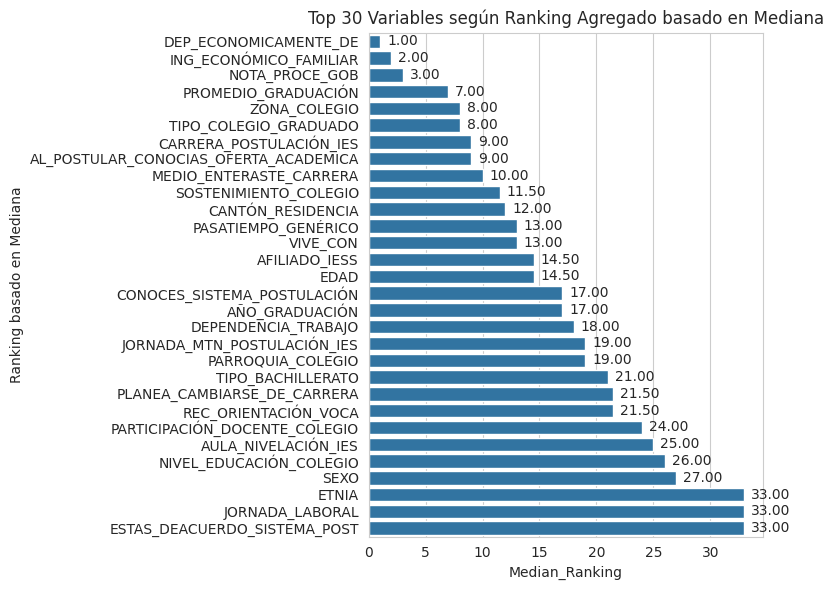


Matriz de correlación entre rankings:
                         RF_Permutation_Ranking  GB_Permutation_Ranking  \
RF_Permutation_Ranking                 1.000000               -0.216902   
GB_Permutation_Ranking                -0.216902                1.000000   
XGB_Permutation_Ranking               -0.033317                0.433573   
Median_Ranking                         0.093906                0.616528   

                         XGB_Permutation_Ranking  Median_Ranking  
RF_Permutation_Ranking                 -0.033317        0.093906  
GB_Permutation_Ranking                  0.433573        0.616528  
XGB_Permutation_Ranking                 1.000000        0.845216  
Median_Ranking                          0.845216        1.000000  


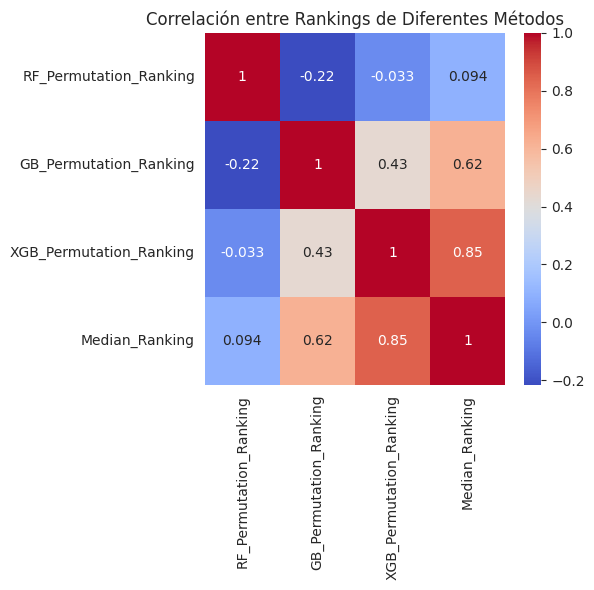


Variables consistentemente importantes en los 3 métodos basados en Permutación:
                                       RF_Permutation_Ranking  \
feature                                                         
DEP_ECONOMICAMENTE_DE                                     3.0   
ING_ECONÓMICO_FAMILIAR                                    2.0   
NOTA_PROCE_GOB                                            1.0   
ZONA_COLEGIO                                              8.0   
TIPO_COLEGIO_GRADUADO                                    10.5   
AL_POSTULAR_CONOCIAS_OFERTA_ACADEMICA                    19.0   
MEDIO_ENTERASTE_CARRERA                                  19.0   
SOSTENIMIENTO_COLEGIO                                    26.5   
VIVE_CON                                                  7.0   
EDAD                                                     29.0   
CONOCES_SISTEMA_POSTULACIÓN                              15.0   
AÑO_GRADUACIÓN                                           17.0   
TIPO_BACH

In [278]:
# Se cálcula del Ranking Agregado con 4 Métodos: RF MDI, RF PI, GB MDI, GB PI, XGB MDI
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Se procesa los ranking de los modelos rfpi_ranking, gbpi_ranking, y xgbpi_ranking

# Se combina los rankings en un solo DataFrame
combined_rankings = pd.concat([rfpi_ranking, gbpi_ranking, xgbpi_ranking], axis=1, join='outer')

# Se renombra las columnas para claridad
combined_rankings.columns = ['RF_Permutation_Ranking', 'GB_Permutation_Ranking', 'XGB_Permutation_Ranking']

# Se calcula el ranking basado en la mediana
combined_rankings['Median_Ranking'] = combined_rankings.median(axis=1)

# Se ordena por el ranking promedio
final_ranking = combined_rankings.sort_values('Median_Ranking')

# Se selecciona las top 30 variables
top_30_variables = final_ranking.head(30)

print("Top 30 variables según el ranking agregado basado en Mediana:")
print(top_30_variables)

# Se realizar un análisis adicional
print("\nEstadísticas del ranking agregado:")
print(top_30_variables['Median_Ranking'].describe())

# Se visualiza el ranking agregado barras horizontales
plt.figure(figsize=(8, 6))
ax = sns.barplot(x='Median_Ranking', y=top_30_variables.index, data=top_30_variables)
plt.title('Top 30 Variables según Ranking Agregado basado en Mediana')
plt.ylabel('Ranking basado en Mediana')
add_value_labels(ax)
plt.tight_layout()
plt.show()

# Se compara los rankings entre métodos
correlation_matrix = top_30_variables[combined_rankings.columns].corr()

print("\nMatriz de correlación entre rankings:")
print(correlation_matrix)

# Se visualiza la matriz de correlación
plt.figure(figsize=(6, 6))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')
plt.title('Correlación entre Rankings de Diferentes Métodos')
plt.tight_layout()
plt.show()

# Se identifica las variables consistentemente importantes
consistent_variables = top_30_variables[
    (top_30_variables['RF_Permutation_Ranking'] <= 30) &
    (top_30_variables['GB_Permutation_Ranking'] <= 30) &
    (top_30_variables['XGB_Permutation_Ranking'] <= 30)
]

print("\nVariables consistentemente importantes en los 3 métodos basados en Permutación:")
print(consistent_variables)


#**6. Modelado de Predicción**

##**6.1 - Construcción del Modelos de Predicción: Grupo A: Regresion Logistica, XGBoost y Red Neuronal MLP de 2 Capas Ocultas sin balanceo de datos**

###**6.1.1. Importación de Líbrerias**

In [279]:
!pip install --upgrade tensorflow

In [280]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score
from xgboost import XGBClassifier

import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense

from sklearn.inspection import permutation_importance

In [281]:
# S restaura los datos con las 60 columnas para escoger las seleccionadas

X_train = X_train_balanced.copy()
y_train = y_train_balanced.copy()

X_test =  X_test_unbalanced.copy()
y_test =  y_test_unbalanced.copy()

In [282]:
X_train.shape

(20000, 59)

In [283]:
X_test.shape

(262, 59)

In [284]:
# Función para separar solo las variables elegidas de X_train y X_test

def prepare_data2(X_train_all, X_test_all, y_train, y_test, features_selected):

    X_train_selected = X_train_all[features_selected]
    X_test_selected =  X_test_all[features_selected]

    return  X_train_selected, X_test_selected, y_train, y_test

In [285]:
#Se empleara en modelos de Clasificación son salida de predicción porcentual de aproación**

In [286]:
# Función para evaluar el modelo
def evaluate_model(model, X_test, y_test):
    y_pred = model.predict(X_test)
    y_pred_proba = model.predict_proba(X_test)[:, 1]

    return {
        'accuracy': accuracy_score(y_test, y_pred),
        'precision': precision_score(y_test, y_pred, average='weighted'),
        'recall': recall_score(y_test, y_pred, average='weighted'),
        'f1': f1_score(y_test, y_pred, average='weighted'),
        'auc': roc_auc_score(y_test, y_pred_proba)
    }

Metodos para Entrenar el Modelos de Regresión Logistica, XGBosoing, y Red Neuronal

In [287]:
class NNWrapper:
    def __init__(self, model):
        self.model = model
    def fit(self, X, y, epochs=50, batch_size=32):
        self.model.fit(X, y, epochs=epochs, batch_size=batch_size, verbose=0)
    def predict(self, X):
        return (self.model.predict(X) > 0.5).astype(int).ravel()
    def predict_proba(self, X):
        return np.column_stack((1 - self.model.predict(X).ravel(), self.model.predict(X).ravel()))
    def score(self, X, y):
        return accuracy_score(y, self.predict(X))

In [288]:
# Función para entrenar y evaluar modelos
def train_and_evaluate(X_train, X_test, y_train, y_test):
    results = {}

    # Regresión Logística
    lr = LogisticRegression(random_state=42)
    lr.fit(X_train, y_train)
    results['Logistic Regression'] = evaluate_model(lr, X_test, y_test)

    # XGBoost
    xgb = XGBClassifier(random_state=42)
    xgb.fit(X_train, y_train)
    results['XGBoost'] = evaluate_model(xgb, X_test, y_test)

    # Red Neuronal
    nn = Sequential([
        Dense(64, activation='relu', input_shape=(X_train.shape[1],)),
        Dense(32, activation='relu'),
        Dense(1, activation='sigmoid')
    ])
    nn.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
    nn.fit(X_train, y_train, epochs=50, batch_size=32, verbose=0)

    # Crear una función de predicción compatible con sklearn para la red neuronal
    nn_predict = lambda X: nn.predict(X).ravel()
    nn_predict_proba = lambda X: np.column_stack((1 - nn.predict(X).ravel(), nn.predict(X).ravel()))

    nn_wrapper = NNWrapper(nn)
    results['Neural Network'] = evaluate_model(nn_wrapper, X_test, y_test)

    return results, lr, xgb, nn_wrapper

In [289]:
#**Variables a cosiderar por Ranking Agregado menor a 30 y Cosistencia entre Rankings**

In [343]:
# Variables consistentesm con Tanking grupal promedio menor a 27
# Salieron JORNADA_COLEGIO, 'PARTICIPACIÓN_DOCENTE_COLEGIO','MEDIO_ENTERASTE_CARRERA', 'DEPENDENCIA_TRABAJO, 'ASISTIO_EVENTOS_VOCAC', MOTIVACIÓN_ELECCIÓN_CARRERA',

variables_ranking_30 = ['ING_ECONÓMICO_FAMILIAR','AÑO_GRADUACIÓN','TIPO_COLEGIO_GRADUADO',
                        'CARRERA_POSTULACIÓN_IES','CANTÓN_RESIDENCIA','NIVEL_EDUCACIÓN_COLEGIO',
                        'CONOCES_SISTEMA_POSTULACIÓN','JORNADA_MTN_POSTULACIÓN_IES',
                        'EDAD','AULA_NIVELACIÓN_IES','PROMEDIO_GRADUACIÓN','NOTA_PROCE_GOB',
                        'PERÍODO_APLICO_IES','AFILIADO_IESS','PARROQUIA_COLEGIO',
                        'PLANEA_CAMBIARSE_DE_CARRERA','ACTIVIDAD_VOCACIONAL_DEL_COLEGIO','PASATIEMPO_GENÉRICO',
                        'AL_POSTULAR_CONOCIAS_OFERTA_ACADEMICA','JORNADA_COLEGIO','ESTAS_DEACUERDO_SISTEMA_POST',
                        'SOSTENIMIENTO_COLEGIO','PERFIL_SOCIOECONOMICO','DEPENDENCIA_TRABAJO',
                        'ZONA_COLEGIO','SEXO','DEP_ECONOMICAMENTE_DE',
                        'TIPO_BACHILLERATO','POSEE_TÍTULO_IES','MOTIVACIÓN_ELECCIÓN_CARRERA'
]




# Variables con rankin agregafo promerio menor a 15 -
variables_consistentes = ['ING_ECONÓMICO_FAMILIAR','AÑO_GRADUACIÓN','TIPO_COLEGIO_GRADUADO',
                          'CARRERA_POSTULACIÓN_IES','CANTÓN_RESIDENCIA','NIVEL_EDUCACIÓN_COLEGIO',
                          'CONOCES_SISTEMA_POSTULACIÓN','JORNADA_MTN_POSTULACIÓN_IES','EDAD',
                          'AULA_NIVELACIÓN_IES','PROMEDIO_GRADUACIÓN','NOTA_PROCE_GOB','PERÍODO_APLICO_IES',
                          'AFILIADO_IESS','PARROQUIA_COLEGIO'
]


In [344]:
print(variables_ranking_30)

['ING_ECONÓMICO_FAMILIAR', 'AÑO_GRADUACIÓN', 'TIPO_COLEGIO_GRADUADO', 'CARRERA_POSTULACIÓN_IES', 'CANTÓN_RESIDENCIA', 'NIVEL_EDUCACIÓN_COLEGIO', 'CONOCES_SISTEMA_POSTULACIÓN', 'JORNADA_MTN_POSTULACIÓN_IES', 'EDAD', 'AULA_NIVELACIÓN_IES', 'PROMEDIO_GRADUACIÓN', 'NOTA_PROCE_GOB', 'PERÍODO_APLICO_IES', 'AFILIADO_IESS', 'PARROQUIA_COLEGIO', 'PLANEA_CAMBIARSE_DE_CARRERA', 'ACTIVIDAD_VOCACIONAL_DEL_COLEGIO', 'PASATIEMPO_GENÉRICO', 'AL_POSTULAR_CONOCIAS_OFERTA_ACADEMICA', 'JORNADA_COLEGIO', 'ESTAS_DEACUERDO_SISTEMA_POST', 'SOSTENIMIENTO_COLEGIO', 'PERFIL_SOCIOECONOMICO', 'DEPENDENCIA_TRABAJO', 'ZONA_COLEGIO', 'SEXO', 'DEP_ECONOMICAMENTE_DE', 'TIPO_BACHILLERATO', 'POSEE_TÍTULO_IES', 'MOTIVACIÓN_ELECCIÓN_CARRERA']


In [345]:
!pip install unidecode

In [346]:
import unidecode
def normalize_column_names(names):
    return [unidecode.unidecode(col.strip().upper()) for col in names]

In [347]:
import pandas as pd
import unidecode

def prepare_data3(X_train_all, X_test_all, y_train, y_test, features_selected):
    """
    Preparo los datos para el entrenamiento del modelo, seleccionando las características especificadas.

    Args:
        X_train_all: DataFrame con todos los datos de entrenamiento.
        X_test_all: DataFrame con todos los datos de prueba.
        y_train: Series con las etiquetas de entrenamiento.
        y_test: Series con las etiquetas de prueba.
        features_selected: Lista de nombres de características a seleccionar.

    Returns:
        X_train_selected: DataFrame con los datos de entrenamiento seleccionados.
        X_test_selected: DataFrame con los datos de prueba seleccionados.
        y_train: Series con las etiquetas de entrenamiento.
        y_test: Series con las etiquetas de prueba.
    """

    # Normalizar nombres de columnas en X_train_all
    X_train_all.columns = normalize_column_names(X_train_all.columns)

    # Normalizar nombres de columnas en X_test_all
    X_test_all.columns = normalize_column_names(X_train_all.columns)

    # Normalizar nombres en features_selected
    features_selected = normalize_column_names(features_selected)

    common_columns = list(set(features_selected) & set(X_train_all.columns))

    # Inicializar DataFrames vacíos para las columnas seleccionadas
    X_train_selected = pd.DataFrame()
    X_test_selected = pd.DataFrame()

    # Procesar cada columna una a la vez
    for column in common_columns:
       #print(f"Procesando la columna: {column}")
        X_train_selected[column] = X_train_all[column]
        X_test_selected[column] = X_test_all[column]
       # print("Procesado con éxito")

    return X_train_selected, X_test_selected, y_train, y_test

In [348]:
###**Se realiza la división de los datos Xs y Ys de entrenamiento y pruebas con las 30 variables mas relevantes elegidas y con las variables consistentes halladas con el método combinado**

###**6.1.2. Separación de datos en Entrenamiento (Train) y Pruebas (Test)**

In [349]:
# Se pepara los datos y entrenar modelos con variables de ranking <= 30
# Se emplea datos que ya fueron balanceados para la fase de selección

X_train_30, X_test_30, y_train, y_test = prepare_data3(X_train, X_test, y_train, y_test, variables_ranking_30)
results_30, lr_30, xgb_30, nn_30 = train_and_evaluate(X_train_30, X_test_30, y_train, y_test)

# Se pepara los datos y entrenar modelos con variables consistentes
X_train_cons, X_test_cons, y_train, y_test = prepare_data3(X_train, X_test, y_train, y_test, variables_consistentes)
results_cons, lr_cons, xgb_cons, nn_cons = train_and_evaluate(X_train_cons, X_test_cons, y_train, y_test)

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 


###**6.1.3. Evaluación de los primeros modelos de predicción escogidos**

In [350]:
# Se muestra los resultados
print("Resultados con variables de ranking <= 30:")
for model, metrics in results_30.items():
    print(f"{model}:")
    for metric, value in metrics.items():
        print(f"  {metric}: {value:.4f}")
    print()

print("\nResultados con variables consistentes:")
for model, metrics in results_cons.items():
    print(f"{model}:")
    for metric, value in metrics.items():
        print(f"  {metric}: {value:.4f}")
    print()

# Se identifica el mejor modelo
best_model_30 = max(results_30, key=lambda x: results_30[x]['auc'])
best_model_cons = max(results_cons, key=lambda x: results_cons[x]['auc'])

print(f"Mejor modelo con variables de ranking <= 30: {best_model_30}")
print(f"Mejor modelo con variables consistentes: {best_model_cons}")

Resultados con variables de ranking <= 30:
Logistic Regression:
  accuracy: 0.6985
  precision: 0.7354
  recall: 0.6985
  f1: 0.7145
  auc: 0.6188

XGBoost:
  accuracy: 0.7901
  precision: 0.7506
  recall: 0.7901
  f1: 0.7633
  auc: 0.6226

Neural Network:
  accuracy: 0.7634
  precision: 0.7357
  recall: 0.7634
  f1: 0.7474
  auc: 0.6460


Resultados con variables consistentes:
Logistic Regression:
  accuracy: 0.6641
  precision: 0.7273
  recall: 0.6641
  f1: 0.6896
  auc: 0.6149

XGBoost:
  accuracy: 0.7786
  precision: 0.7456
  recall: 0.7786
  f1: 0.7582
  auc: 0.6476

Neural Network:
  accuracy: 0.7443
  precision: 0.7253
  recall: 0.7443
  f1: 0.7340
  auc: 0.6677

Mejor modelo con variables de ranking <= 30: Neural Network
Mejor modelo con variables consistentes: Neural Network


###**6.1.4. Análisis influyencia de las variables en la predicción del modelo XGBoost**

In [351]:
# Se calcula la importancia de variables para el mejor modelo
def get_feature_importance(model, X, y):
    if isinstance(model, LogisticRegression):
        return pd.Series(abs(model.coef_[0]), index=X.columns)
    elif isinstance(model, XGBClassifier):
        return pd.Series(model.feature_importances_, index=X.columns)
    else:  # Para la red neuronal, usamos permutation importance
        perm_importance = permutation_importance(model, X, y, n_repeats=10, random_state=42)
        return pd.Series(perm_importance.importances_mean, index=X.columns)

# Se calcular y muestra la importancia de variables para el mejor modelo con variables de ranking <= 30
if best_model_30 == 'Logistic Regression':
    best_model_30_obj = lr_30
elif best_model_30 == 'XGBoost':
    best_model_30_obj = xgb_30
else:
    best_model_30_obj = nn_30
importance_30 = get_feature_importance(best_model_30_obj, X_test_30, y_test)

print(f"\nImportancia de variables para {best_model_30} (variables de ranking <= 30):")
print(importance_30.sort_values(ascending=False))

# Se calcular y muestra la importancia de variables para el mejor modelo con variables consistentes
if best_model_cons == 'Logistic Regression':
    best_model_cons_obj = lr_cons
elif best_model_cons == 'XGBoost':
    best_model_cons_obj = xgb_cons
else:
    best_model_cons_obj = nn_cons
importance_cons = get_feature_importance(best_model_cons_obj, X_test_cons, y_test)
print(f"\nImportancia de variables para {best_model_cons} (variables consistentes):")
print(importance_cons.sort_values(ascending=False))


9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step  
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step  
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step  
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
9/9 ━━━━━

##**6.2 - Construcción del Modelos de Predicción: Grupo B: Regresion Logistica, Gradient Boosting, XGBoost, Light Boosting  y Red Neuronal MLP de 4 Capas Ocultas con balanceo de datos**

###**6.2.1. Balanceo de datos con SMOTENC para fase de Modelado de Predicción con 27 variables predictoras**

In [352]:
# SMOTE esta diseñado paradatos numericas continuos desvalanceados
# no funciona adcuadamente para datos categoricos codificados porque creara datos sinteticos
# de clases que no existren en el mindo real

# Para balancear uina data quye posee una dataset co variables mixtas: numericas, categoricas nominales y categoricas ordinales
# Para usar SMOTENC en lugar de SMOTE, se especificr qué columnas son categóricas. Dado que ya has escalado las variables numéricas
# y codificado las categóricas, puedes modificar tu código de la siguiente manera:

# Importar SMOTENC.
# Identificar las columnas categóricas.
# Modificar la instancia de SMOTENC para incluir las columnas categóricas.


In [353]:
#Para usar SMOTENC correctamente
# SMOTENC requiere que las variables categóricas ya estén codificadas. Por lo tanto, debes usar las columnas
# que ya has codificado con LabelEncoder y OrdinalEncoder. No uses los datos originales con valores de texto.
# Identificación de Variables Categóricas:
# SMOTENC no necesita que separes las variables categóricas nominales de las ordinales. Solo necesita saber cuáles columnas son categóricas. Ya que has usado LabelEncoder y OrdinalEncoder, puedes incluir todas las columnas categóricas en la lista categorical_features.


In [354]:
# Se crea una lista de variables numéricas a analizar
variables_numericas = ['PORCENTAJE_DISCAPACIDAD', 'VALOR_MATRÍCULA_IES', 'EDAD', 'NOTA_PROCE_GOB']

In [355]:
print('Numericas finales df4', variables_numericas)

Numericas finales df4 ['PORCENTAJE_DISCAPACIDAD', 'VALOR_MATRÍCULA_IES', 'EDAD', 'NOTA_PROCE_GOB']


In [356]:
# Se crear una lista de variables categóricas originales que sobreviven en df_consolidado4

categoricas_en_30_seleccionadas = [
   'ING_ECONÓMICO_FAMILIAR','AÑO_GRADUACIÓN','TIPO_COLEGIO_GRADUADO','CARRERA_POSTULACIÓN_IES','CANTÓN_RESIDENCIA',
   'NIVEL_EDUCACIÓN_COLEGIO','CONOCES_SISTEMA_POSTULACIÓN','JORNADA_MTN_POSTULACIÓN_IES','EDAD','AULA_NIVELACIÓN_IES',
   'PROMEDIO_GRADUACIÓN','NOTA_PROCE_GOB','PERÍODO_APLICO_IES','AFILIADO_IESS','PARROQUIA_COLEGIO',
   'PLANEA_CAMBIARSE_DE_CARRERA','ACTIVIDAD_VOCACIONAL_DEL_COLEGIO','PASATIEMPO_GENÉRICO',
   'AL_POSTULAR_CONOCIAS_OFERTA_ACADEMICA','JORNADA_COLEGIO','ESTAS_DEACUERDO_SISTEMA_POST','SOSTENIMIENTO_COLEGIO',
   'PERFIL_SOCIOECONOMICO','DEPENDENCIA_TRABAJO','ZONA_COLEGIO','SEXO','DEP_ECONOMICAMENTE_DE'
]

# Se crear una lista de las 15 variables categóricas mas rankeadas

categoricas_en_15_seleccionadas = [
   'EDAD','ING_ECONÓMICO_FAMILIAR','PROMEDIO_GRADUACIÓN','NOTA_PROCE_GOB','AÑO_GRADUACIÓN',
   'PARROQUIA_COLEGIO','ACTIVIDAD_VOCACIONAL_DEL_COLEGIO','TIPO_COLEGIO_GRADUADO','PASATIEMPO_GENÉRICO',
   'CARRERA_POSTULACIÓN_IES','ESTAS_DEACUERDO_SISTEMA_POST','CANTÓN_RESIDENCIA',
   'PERFIL_SOCIOECONOMICO','NIVEL_EDUCACIÓN_COLEGIO','ZONA_COLEGIO']

In [357]:
from imblearn.over_sampling import SMOTENC
from sklearn.model_selection import train_test_split

In [358]:
"""
def prepare_data_with_smotenc(df, features, categorical_features):
    # Se normaliza los nombres de columnas en df
    df.columns = normalize_column_names(df.columns)

    # Se normaliza los nombres en features y categorical_features
    features = normalize_column_names(features)
    categorical_features = normalize_column_names(categorical_features)

    # Se verifica que todas las variables se encuentren en el DataFrame
    features = [f for f in features if f in df.columns]

    X = df[features]
    y = df['APROBADO_FINAL_IES']

    categorical_features = [col for col in categorical_features if col in X.columns]

    # Se identifica las columnas categóricas
    categorical_indices = [X.columns.get_loc(col) for col in categorical_features]

    # Se aplica SMOTENC para balancear las clases
    smotenc = SMOTENC(categorical_features=categorical_indices, random_state=42)
    X_res, y_res = smotenc.fit_resample(X, y)

    return train_test_split(X_res, y_res, test_size=0.2, random_state=42)
"""

"\ndef prepare_data_with_smotenc(df, features, categorical_features):\n    # Se normaliza los nombres de columnas en df\n    df.columns = normalize_column_names(df.columns)\n\n    # Se normaliza los nombres en features y categorical_features\n    features = normalize_column_names(features)\n    categorical_features = normalize_column_names(categorical_features)\n\n    # Se verifica que todas las variables se encuentren en el DataFrame\n    features = [f for f in features if f in df.columns]\n\n    X = df[features]\n    y = df['APROBADO_FINAL_IES']\n\n    categorical_features = [col for col in categorical_features if col in X.columns]\n\n    # Se identifica las columnas categóricas\n    categorical_indices = [X.columns.get_loc(col) for col in categorical_features]\n\n    # Se aplica SMOTENC para balancear las clases\n    smotenc = SMOTENC(categorical_features=categorical_indices, random_state=42)\n    X_res, y_res = smotenc.fit_resample(X, y)\n\n    return train_test_split(X_res, y_res,

In [359]:
# Se normaliza los nombres de las variables
#variables_ranking_30 = normalize_column_names(variables_ranking_30)
#categoricas_en_30_seleccionadas = normalize_column_names(categoricas_en_30_seleccionadas)
#categoricas_en_15_seleccionadas = normalize_column_names(categoricas_en_15_seleccionadas)

In [360]:
# Se prepara los datos con variables de ranking <= 30 usando SMOTENC
#X_train_30, X_test_30, y_train, y_test = prepare_data_with_smotenc(df_consolidado4, variables_ranking_30, categoricas_en_30_seleccionadas)

# Se prepara los datos con variables consistentes usando SMOTENC
#X_train_cons, X_test_cons, y_train, y_test = prepare_data_with_smotenc(df_consolidado4, variables_consistentes, categoricas_en_15_seleccionadas)

###**6.2.2. Creación de modelos con Gradient Boosting, LightGBM y Red Neuronal con 4 Capas Ocultas**

In [361]:
from sklearn.ensemble import GradientBoostingClassifier
from lightgbm import LGBMClassifier

def train_and_evaluate_with_additional_models(X_train, X_test, y_train, y_test):
    results = {}

    # Regresión Logística
    lr = LogisticRegression(random_state=42)
    lr.fit(X_train, y_train)
    results['Logistic Regression'] = evaluate_model(lr, X_test, y_test)

    # XGBoost
    xgb = XGBClassifier(random_state=42)
    xgb.fit(X_train, y_train)
    results['XGBoost'] = evaluate_model(xgb, X_test, y_test)

    # Gradient Boosting
    gb = GradientBoostingClassifier(random_state=42)
    gb.fit(X_train, y_train)
    results['Gradient Boosting'] = evaluate_model(gb, X_test, y_test)

    # LightGBM
    lgb = LGBMClassifier(random_state=42)
    lgb.fit(X_train, y_train)
    results['LightGBM'] = evaluate_model(lgb, X_test, y_test)

    # Red Neuronal Compleja
    nn_complex = Sequential([
        Dense(128, activation='relu', input_shape=(X_train.shape[1],)),
        Dense(64, activation='relu'),
        Dense(32, activation='relu'),
        Dense(1, activation='sigmoid')
    ])
    nn_complex.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
    nn_complex.fit(X_train, y_train, epochs=50, batch_size=32, verbose=0)

    nn_wrapper = NNWrapper(nn_complex)
    results['Neural Network Complex'] = evaluate_model(nn_wrapper, X_test, y_test)

    return results, lr, xgb, gb, lgb, nn_wrapper

# Se entrena y evalua los modelos con variables de ranking <= 30
results_30, lr_30, xgb_30, gb_30, lgb_30, nn_complex_30 = train_and_evaluate_with_additional_models(X_train_30, X_test_30, y_train, y_test)

# Se entrena y evalua los modelos con variables consistentes (15)
results_cons, lr_cons, xgb_cons, gb_cons, lgb_cons, nn_complex_cons = train_and_evaluate_with_additional_models(X_train_cons, X_test_cons, y_train, y_test)


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


[LightGBM] [Info] Number of positive: 10000, number of negative: 10000
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004890 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 623
[LightGBM] [Info] Number of data points in the train set: 20000, number of used features: 27
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
[LightGBM] [Info] Number of positive: 10000, number of negative: 10000
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002559 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 572
[LightGBM] [Info] Number of data points in the train set: 20000, number of used features: 15
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 


###**6.2.3. Evaluación del los Modelos del Grupo B**

In [362]:
# Se muestra los resultados
print("Resultados con variables de ranking <= 30:")
for model, metrics in results_30.items():
    print(f"{model}:")
    for metric, value in metrics.items():
        print(f"  {metric}: {value:.4f}")
    print()

print("\nResultados con variables consistentes:")
for model, metrics in results_cons.items():
    print(f"{model}:")
    for metric, value in metrics.items():
        print(f"  {metric}: {value:.4f}")
    print()

# Se identifica el mejor modelo
best_model_30 = max(results_30, key=lambda x: results_30[x]['auc'])
best_model_cons = max(results_cons, key=lambda x: results_cons[x]['auc'])

print(f"Mejor modelo con variables de ranking <= 30: {best_model_30}")
print(f"Mejor modelo con variables consistentes: {best_model_cons}")

Resultados con variables de ranking <= 30:
Logistic Regression:
  accuracy: 0.6985
  precision: 0.7354
  recall: 0.6985
  f1: 0.7145
  auc: 0.6188

XGBoost:
  accuracy: 0.7901
  precision: 0.7506
  recall: 0.7901
  f1: 0.7633
  auc: 0.6226

Gradient Boosting:
  accuracy: 0.7634
  precision: 0.7481
  recall: 0.7634
  f1: 0.7550
  auc: 0.6188

LightGBM:
  accuracy: 0.7901
  precision: 0.7581
  recall: 0.7901
  f1: 0.7693
  auc: 0.6315

Neural Network Complex:
  accuracy: 0.7824
  precision: 0.7399
  recall: 0.7824
  f1: 0.7547
  auc: 0.6415


Resultados con variables consistentes:
Logistic Regression:
  accuracy: 0.6641
  precision: 0.7273
  recall: 0.6641
  f1: 0.6896
  auc: 0.6149

XGBoost:
  accuracy: 0.7786
  precision: 0.7456
  recall: 0.7786
  f1: 0.7582
  auc: 0.6476

Gradient Boosting:
  accuracy: 0.7634
  precision: 0.7596
  recall: 0.7634
  f1: 0.7614
  auc: 0.6470

LightGBM:
  accuracy: 0.7863
  precision: 0.7513
  recall: 0.7863
  f1: 0.7636
  auc: 0.6497

Neural Network Comp

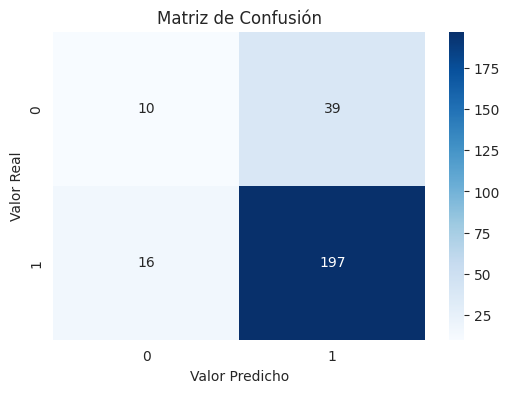

In [363]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix, accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, roc_curve
import seaborn as sns

# Se realiza las predicciones con el conjunto de prueba
y_pred = xgb_30.predict(X_test_30)
y_pred_proba = xgb_30.predict_proba(X_test_30)[:, 1]

# Se calcular las métricas
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)
auc = roc_auc_score(y_test, y_pred_proba)

# Se crea y muestra la matriz de confusión
cm = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(6, 4))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.title('Matriz de Confusión')
plt.ylabel('Valor Real')
plt.xlabel('Valor Predicho')
plt.show()

In [364]:
print("Matriz de Confusión:")
print(f"Verdaderos Negativos (TN): {cm[0,0]}")
print(f"Falsos Positivos (FP): {cm[0,1]}")
print(f"Falsos Negativos (FN): {cm[1,0]}")
print(f"Verdaderos Positivos (TP): {cm[1,1]}")

Matriz de Confusión:
Verdaderos Negativos (TN): 10
Falsos Positivos (FP): 39
Falsos Negativos (FN): 16
Verdaderos Positivos (TP): 197


In [365]:
# Se muestra los valores de las métricas con data de prueba
print(f"Accuracy: {accuracy:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1-score: {f1:.4f}")
print(f"AUC: {auc:.4f}")

Accuracy: 0.7901
Precision: 0.8347
Recall: 0.9249
F1-score: 0.8775
AUC: 0.6226


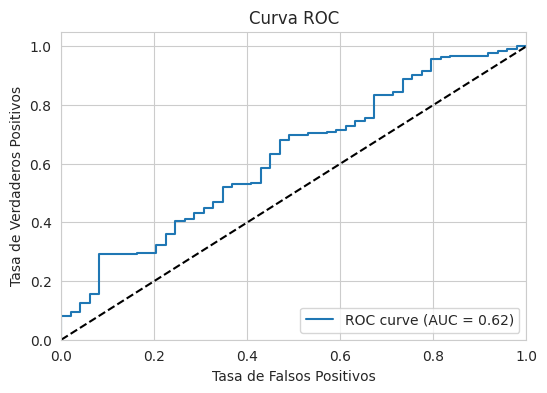

In [366]:
# Se generar la curva ROC empleando las probabilidades predichas
fpr, tpr, _ = roc_curve(y_test, y_pred_proba)
plt.figure(figsize=(6, 4))
plt.plot(fpr, tpr, label=f'ROC curve (AUC = {auc:.2f})')
plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('Tasa de Falsos Positivos')
plt.ylabel('Tasa de Verdaderos Positivos')
plt.title('Curva ROC')
plt.legend(loc="lower right")
plt.show()

##**6.3. Optimización del Modelo elegido como el más adecuado**

In [367]:
#Se elije el Modelo XGBoost con 27 Variables predictoras**

###**6.3.1. Mejora 1 a XGHBoot: Búsqueda de hiperparámetros con RandomizedSearchCV, Validaci[on Cruzada y Regularizacion L1 y L2**

In [315]:

from sklearn.model_selection import RandomizedSearchCV
from xgboost import XGBClassifier
from sklearn.metrics import make_scorer, accuracy_score, precision_score, recall_score, f1_score, roc_auc_score
import numpy as np

# Se inicializa el diccionario results
results = {}

# Se define el espacio de búsqueda de hiperparámetros
param_dist = {
    'n_estimators': [100, 200, 300, 400, 500],
    'max_depth': [3, 4, 5, 6, 7, 8],
    'learning_rate': [0.01, 0.1, 0.2, 0.3],
    'subsample': [0.5, 0.6, 0.7, 0.8, 0.9, 1.0],
    'colsample_bytree': [0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0],
    'gamma': [0, 0.1, 0.2, 0.3, 0.4],
    'reg_alpha': [0, 0.1, 0.5, 1, 2],  # L1 regularization
    'reg_lambda': [0, 0.1, 0.5, 1, 2]  # L2 regularization
}

# Se define el modelo base  xgb_30
xgb_2 = XGBClassifier(random_state=42)

# Se define las métricas de evaluación
scoring = {
    'accuracy': make_scorer(accuracy_score),
    'precision': make_scorer(precision_score),
    'recall': make_scorer(recall_score),
    'f1': make_scorer(f1_score)
}

# Se configura y ejecuta RandomizedSearchCV
random_search = RandomizedSearchCV(
    xgb_2, param_distributions=param_dist, n_iter=100,
    cv=10, scoring=scoring, refit='f1', random_state=42, n_jobs=-1, verbose=1
)

print("Iniciando búsqueda de hiperparámetros...")
random_search.fit(X_train_30, y_train)
print("Búsqueda de hiperparámetros completada.")

# Se imprime los mejores hiperparámetros encontrados
print("\nMejores hiperparámetros encontrados:")
for param, value in random_search.best_params_.items():
    print(f"{param}: {value}")

# Se obtiene el mejor modelo
best_xgb = random_search.best_estimator_

# Se evalua el mejor modelo en el conjunto de prueba
y_pred = best_xgb.predict(X_test_30)
y_pred_proba = best_xgb.predict_proba(X_test_30)[:, 1]

results['XGBoost_Tuned'] = {
    'accuracy': accuracy_score(y_test, y_pred),
    'precision': precision_score(y_test, y_pred),
    'recall': recall_score(y_test, y_pred),
    'f1': f1_score(y_test, y_pred),
    'auc': roc_auc_score(y_test, y_pred_proba)
}

# Se imprime los resultados
print("\nResultados del mejor modelo XGBoost en el conjunto de prueba:")
for metric, value in results['XGBoost_Tuned'].items():
    print(f"{metric}: {value:.4f}")

# Se imprime las mejores puntuaciones de validación cruzada
print("\nMejores puntuaciones de validación cruzada:")
for metric in scoring.keys():
    mean_score = random_search.cv_results_[f'mean_test_{metric}'][random_search.best_index_]
    std_score = random_search.cv_results_[f'std_test_{metric}'][random_search.best_index_]
    print(f"{metric}: {mean_score:.4f} (+/- {std_score * 2:.4f})")

# Se compara con el modelo XGBoost original (si está disponible)
if 'XGBoost' in results:
    print("\nComparación con el modelo XGBoost original:")
    for metric in results['XGBoost'].keys():
        original = results['XGBoost'][metric]
        tuned = results['XGBoost_Tuned'][metric]
        improvement = (tuned - original) / original * 100
        print(f"{metric}: Original: {original:.4f}, Tuned: {tuned:.4f}, Mejora: {improvement:.2f}%")




Iniciando búsqueda de hiperparámetros...
Fitting 10 folds for each of 100 candidates, totalling 1000 fits
Búsqueda de hiperparámetros completada.

Mejores hiperparámetros encontrados:
subsample: 1.0
reg_lambda: 0
reg_alpha: 0
n_estimators: 500
max_depth: 8
learning_rate: 0.2
gamma: 0
colsample_bytree: 0.5

Resultados del mejor modelo XGBoost en el conjunto de prueba:
accuracy: 0.7786
precision: 0.8326
recall: 0.9108
f1: 0.8700
auc: 0.5950

Mejores puntuaciones de validación cruzada:
accuracy: 0.9909 (+/- 0.0407)
precision: 0.9900 (+/- 0.0558)
recall: 0.9923 (+/- 0.0229)
f1: 0.9911 (+/- 0.0395)


###**6.3.2. Mejora 2 a XGBoost: Combinación de XGBoost con LightGBM**

In [316]:

from lightgbm import LGBMClassifier
from sklearn.ensemble import VotingClassifier

# Se usa el mejor modelo XGBoost de la búsqueda anterior
best_xgb = random_search.best_estimator_

# Se configura LightGBM
lgbm = LGBMClassifier(random_state=42)

# Se crea un ensamblaje con votación suave
ensemble = VotingClassifier(
    estimators=[('xgb', best_xgb), ('lgbm', lgbm)],
    voting='soft'
)

# Se entrena el ensamblaje
ensemble.fit(X_train_30, y_train)

# Se evalua el ensamblaje
results['Ensemble_XGB_LGBM'] = evaluate_model(ensemble, X_test_30, y_test)


[LightGBM] [Info] Number of positive: 10000, number of negative: 10000
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004586 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 623
[LightGBM] [Info] Number of data points in the train set: 20000, number of used features: 27
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000


##**6.3.3. Métricas y Curva ROC del Modelo XGBoost antes de optimizar**

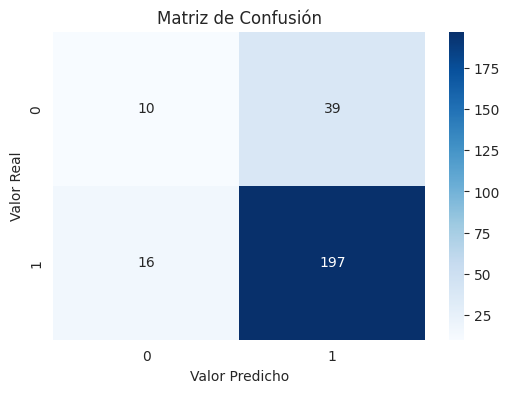

Matriz de Confusión:
Verdaderos Negativos (TN): 10
Falsos Positivos (FP): 39
Falsos Negativos (FN): 16
Verdaderos Positivos (TP): 197

Métricas del modelo:
Accuracy: 0.7901
Precision: 0.8347
Recall: 0.9249
F1-score: 0.8775
AUC: 0.6226


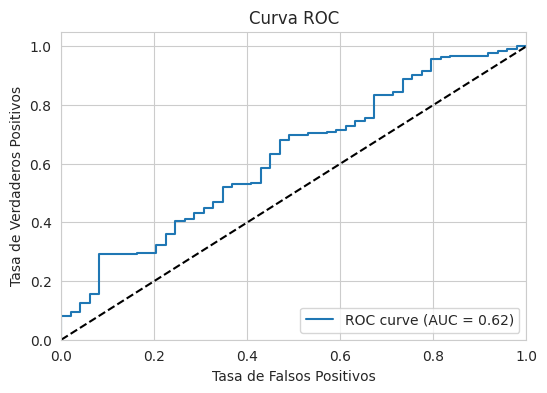

In [317]:
#**Métricas y Curva ROC del Modelo XGBoost antes de optimizar**
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix, accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, roc_curve
import seaborn as sns

# Se realiza predicciones en el conjunto de prueba
y_pred = xgb_30.predict(X_test_30)
y_pred_proba = xgb_30.predict_proba(X_test_30)[:, 1]

# Se calcula las métricas de1 predicción
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)
auc = roc_auc_score(y_test, y_pred_proba)

# Se crea y muestra la matriz de confusión
cm = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(6, 4))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.title('Matriz de Confusión')
plt.ylabel('Valor Real')
plt.xlabel('Valor Predicho')
plt.show()

# Se imprime la matriz de confusión en texto
print("Matriz de Confusión:")
print(f"Verdaderos Negativos (TN): {cm[0,0]}")
print(f"Falsos Positivos (FP): {cm[0,1]}")
print(f"Falsos Negativos (FN): {cm[1,0]}")
print(f"Verdaderos Positivos (TP): {cm[1,1]}")

# Se calcula las métricas
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)
auc = roc_auc_score(y_test, y_pred_proba)

# Se imprime las métricas
print("\nMétricas del modelo:")
print(f"Accuracy: {accuracy:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1-score: {f1:.4f}")
print(f"AUC: {auc:.4f}")


# Opcional: Se calcula la Curva ROC
from sklearn.metrics import roc_curve

fpr, tpr, _ = roc_curve(y_test, y_pred_proba)
plt.figure(figsize=(6, 4))
plt.plot(fpr, tpr, label=f'ROC curve (AUC = {auc:.2f})')
plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('Tasa de Falsos Positivos')
plt.ylabel('Tasa de Verdaderos Positivos')
plt.title('Curva ROC')
plt.legend(loc="lower right")
plt.show()

##**6.3.4. Métricas y Curva ROC del Modelo XGBoost despues de optimizar**

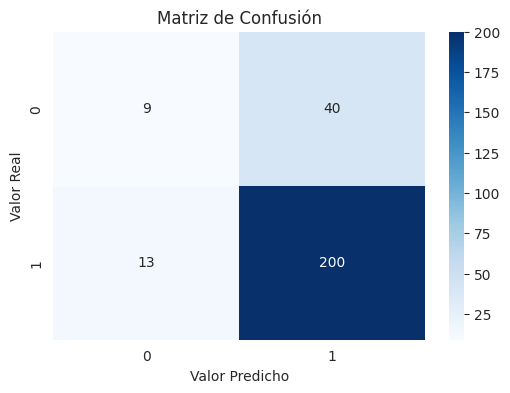

Matriz de Confusión:
Verdaderos Negativos (TN): 9
Falsos Positivos (FP): 40
Falsos Negativos (FN): 13
Verdaderos Positivos (TP): 200

Métricas del modelo:
Accuracy: 0.7977
Precision: 0.8333
Recall: 0.9390
F1-score: 0.8830
AUC: 0.6256


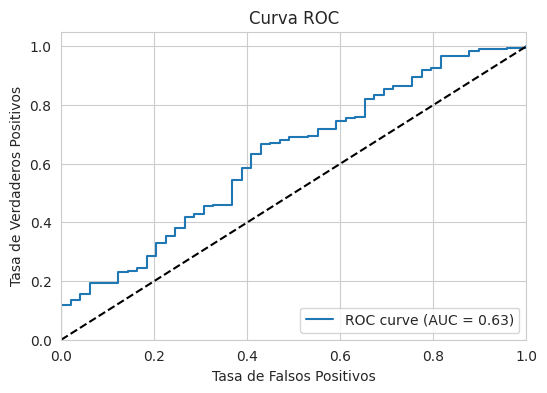

In [318]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix, accuracy_score, precision_score, recall_score, f1_score, roc_auc_score

# Se considera que 'ensemble_reg' es el modelo final mejorado
final_model = ensemble

# Se realiza las predicciones
y_pred = final_model.predict(X_test_30)
y_pred_proba = final_model.predict_proba(X_test_30)[:, 1]

# Se calcula la matriz de confusión
cm = confusion_matrix(y_test, y_pred)

# Se visualiza la matriz de confusión
plt.figure(figsize=(6, 4))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.title('Matriz de Confusión')
plt.ylabel('Valor Real')
plt.xlabel('Valor Predicho')
plt.show()

# Se imprime la matriz de confusión en texto
print("Matriz de Confusión:")
print(f"Verdaderos Negativos (TN): {cm[0,0]}")
print(f"Falsos Positivos (FP): {cm[0,1]}")
print(f"Falsos Negativos (FN): {cm[1,0]}")
print(f"Verdaderos Positivos (TP): {cm[1,1]}")

# Se calcula las métricas de predicción
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)
auc = roc_auc_score(y_test, y_pred_proba)

# Se imprime las métricas
print("\nMétricas del modelo:")
print(f"Accuracy: {accuracy:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1-score: {f1:.4f}")
print(f"AUC: {auc:.4f}")

# Opcional: Se calcula la curva ROC
from sklearn.metrics import roc_curve

fpr, tpr, _ = roc_curve(y_test, y_pred_proba)
plt.figure(figsize=(6, 4))
plt.plot(fpr, tpr, label=f'ROC curve (AUC = {auc:.2f})')
plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('Tasa de Falsos Positivos')
plt.ylabel('Tasa de Verdaderos Positivos')
plt.title('Curva ROC')
plt.legend(loc="lower right")
plt.show()

#**7. Analisis de impacto de las variables en la predicción del Modelo XGBoost**

##**7.1. Cálculo de la Importancia de las características**

In [319]:
# Se calcula la importancia de variables para el mejor modelo
def get_feature_importance(model, X, y):
    if isinstance(model, LogisticRegression):
        return pd.Series(abs(model.coef_[0]), index=X.columns)
    elif isinstance(model, XGBClassifier):
        return pd.Series(model.feature_importances_, index=X.columns)
    else:  # Para la red neuronal, usamos permutation importance
        perm_importance = permutation_importance(model, X, y, n_repeats=10, random_state=42)
        return pd.Series(perm_importance.importances_mean, index=X.columns)

# Se calcula y muestra la importancia de variables para el mejor modelo con variables de ranking <= 30
if best_model_30 == 'Logistic Regression':
    best_model_30_obj = lr_30
elif best_model_30 == 'Gradient Boosting':
    best_model_30_obj = gb_30
elif best_model_30 == 'XGBoost':
    best_model_30_obj = xgb_30
else:
    best_model_30_obj = nn_30

importance_30 = get_feature_importance(best_model_30_obj, X_test_30, y_test)

print(f"\nImportancia de variables para {best_model_30} (variables de ranking <= 30):")
print(importance_30.sort_values(ascending=False))


9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
9/9 ━━━━━━━━

In [320]:
##**7.2. Cálculo de la importancia de las variables consistentes en el Modelo LightBoosting  con SHAP (15 variables)**

# Se calcular y muesrta la importancia de variables para el mejor modelo con variables consistentes (15)
"""
if best_model_cons == 'Logistic Regression':
    best_model_cons_obj = lr_cons
elif best_model_cons == 'Gradient Boosting':
    best_model_cons_obj = gb_cons
elif best_model_cons == 'XGBoost':
    best_model_cons_obj = xgb_cons
else:
    best_model_cons_obj = nn_cons

importance_cons = get_feature_importance(best_model_cons_obj, X_test_cons, y_test)

print(f"\nImportancia de variables para {best_model_cons} (variables consistentes):")
print(importance_cons.sort_values(ascending=False))
"""

'\nif best_model_cons == \'Logistic Regression\':\n    best_model_cons_obj = lr_cons\nelif best_model_cons == \'Gradient Boosting\':\n    best_model_cons_obj = gb_cons\nelif best_model_cons == \'XGBoost\':\n    best_model_cons_obj = xgb_cons\nelse:\n    best_model_cons_obj = nn_cons\n\nimportance_cons = get_feature_importance(best_model_cons_obj, X_test_cons, y_test)\n\nprint(f"\nImportancia de variables para {best_model_cons} (variables consistentes):")\nprint(importance_cons.sort_values(ascending=False))\n'

##**7.2. Cálculo de Explainer y SHAP para XGBoost con 27 variables**

In [321]:
import shap
import matplotlib.pyplot as plt
import numpy as np

# Se convierte los datos a matrices NumPy
X_train_30_np = X_train_30.to_numpy()
X_test_30_np = X_test_30.to_numpy()

# Se calcula valores SHAP utilizando TreeExplainer
explainer_xgb = shap.TreeExplainer(xgb_30)
shap_values_xgb = explainer_xgb.shap_values(X_test_30_np)

Explicación SHAP para la instancia 0 - XGBoosting


<Figure size 1000x600 with 0 Axes>

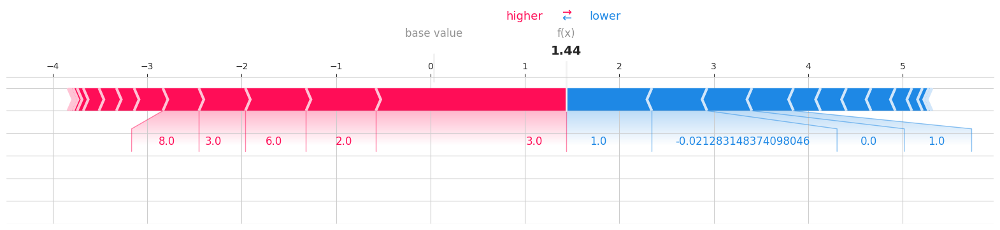

In [322]:
# Influencia de las variables en una predicción individual mediante shap.TreeExplainer
i = 0  # Índice de la instancia a explicar
print(f'Explicación SHAP para la instancia {i} - XGBoosting')
plt.figure(figsize=(10, 6))
shap.force_plot(explainer_xgb.expected_value, shap_values_xgb[i], X_test_30_np[i], matplotlib=True)

In [323]:
# Se guarda las características más importantes según SHAP
feature_importance_xgb = pd.DataFrame(list(zip(X_test_30.columns, np.abs(shap_values_xgb).mean(0))),
                                     columns=['feature', 'shap_importance'])
feature_importance_xgb = feature_importance_xgb.sort_values('shap_importance', ascending=False)
feature_importance_xgb.head(30).to_csv('top_30_features_shap_xgb.csv', index=False)
print("\nLas 30 características más importantes según SHAP se han guardado en 'top_30_features_shap_xgb.csv'")


Las 30 características más importantes según SHAP se han guardado en 'top_30_features_shap_xgb.csv'


##**7.3. SHAP Summary Plot (Dot Plot)**

Este gráfico muestra la importancia de las características y el efecto de cada característica en la predicción. Cada punto representa un valor SHAP para una característica en una instancia de los datos.

Cuándo usarlo:

Para obtener una visión general de la importancia de las características.

Para ver cómo las características afectan las predicciones en general.

In [324]:
X_test_30.columns

Index(['PARROQUIA_COLEGIO', 'TIPO_COLEGIO_GRADUADO', 'PASATIEMPO_GENERICO',
       'CONOCES_SISTEMA_POSTULACION', 'ANO_GRADUACION',
       'ACTIVIDAD_VOCACIONAL_DEL_COLEGIO', 'DEPENDENCIA_TRABAJO',
       'AULA_NIVELACION_IES', 'PERIODO_APLICO_IES',
       'ESTAS_DEACUERDO_SISTEMA_POST', 'EDAD', 'ZONA_COLEGIO',
       'DEP_ECONOMICAMENTE_DE', 'CARRERA_POSTULACION_IES',
       'ING_ECONOMICO_FAMILIAR', 'JORNADA_MTN_POSTULACION_IES',
       'NOTA_PROCE_GOB', 'NIVEL_EDUCACION_COLEGIO', 'PROMEDIO_GRADUACION',
       'JORNADA_COLEGIO', 'SEXO', 'PERFIL_SOCIOECONOMICO', 'AFILIADO_IESS',
       'PLANEA_CAMBIARSE_DE_CARRERA', 'AL_POSTULAR_CONOCIAS_OFERTA_ACADEMICA',
       'CANTON_RESIDENCIA', 'SOSTENIMIENTO_COLEGIO'],
      dtype='object')

In [325]:
len(X_test_30.columns)

27

In [326]:
X_test_30_np.shape

(262, 27)

In [327]:
shap_values_xgb.shape

(262, 27)

SHAP Summary Plot (Dot Plot) - XGBoost


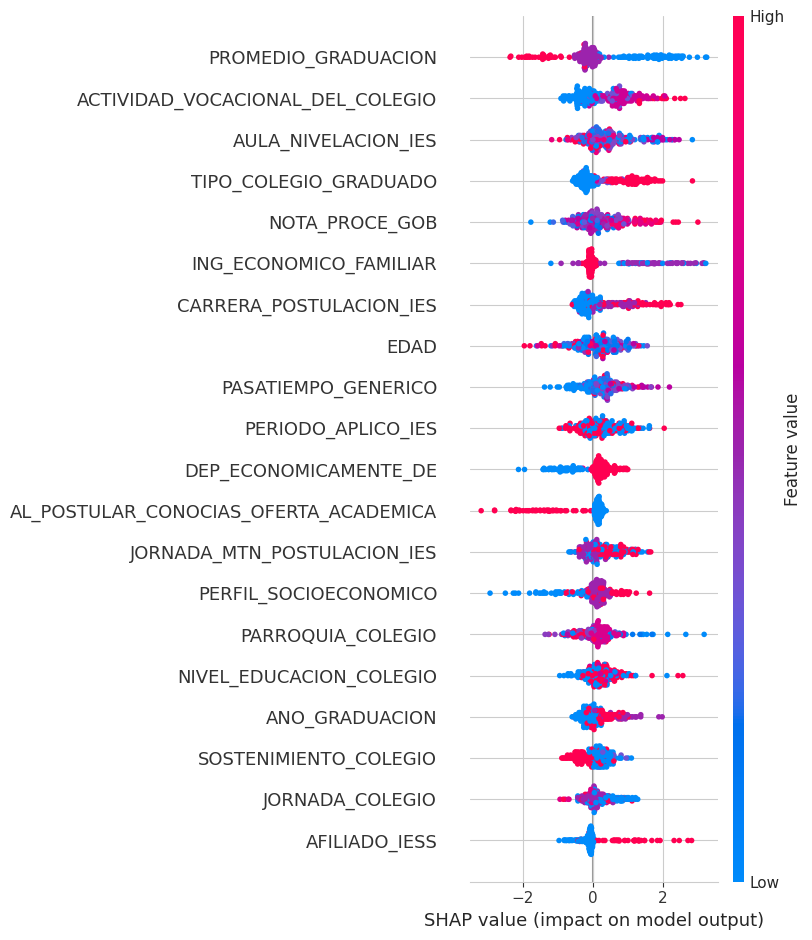

In [328]:
print('SHAP Summary Plot (Dot Plot) - XGBoost')
plt.figure(figsize=(10, 8))
shap.summary_plot(shap_values_xgb, X_test_30_np, feature_names=X_test_30.columns)

##**7.4. SHAP Interaction Values and Interaction Plot**
Este gráfico muestra las interacciones entre las características. Los valores de interacción SHAP indican cómo la combinación de dos características afecta la predicción.

Cuándo usarlo:

Para entender las interacciones entre características.

Para identificar pares de características que tienen un efecto combinado significativo en la predicción.

SHAP Interaction Plot - XGBoost


<Figure size 1200x800 with 0 Axes>

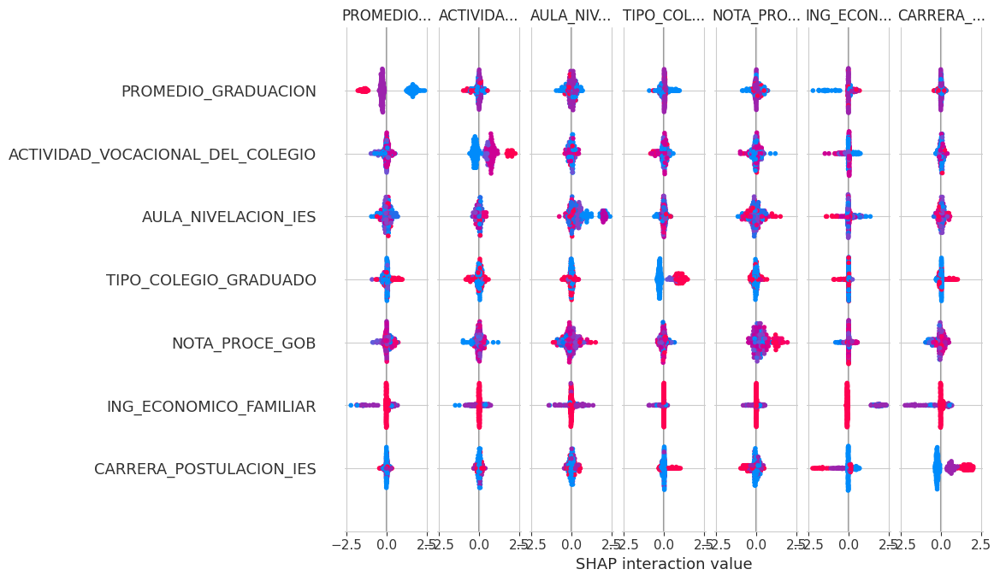

In [329]:
import shap
import matplotlib.pyplot as plt
import numpy as np

# Calcular valores de interacción SHAP
shap_interaction_values = explainer_xgb.shap_interaction_values(X_test_30_np)

# Gráfico de interacción SHAP
print('SHAP Interaction Plot - XGBoost')
plt.figure(figsize=(12, 8))
shap.summary_plot(shap_interaction_values, X_test_30_np, feature_names=X_test_30.columns)

In [330]:
feature_importance_xgb

,feature,shap_importance
18,PROMEDIO_GRADUACION,0.825980
5,ACTIVIDAD_VOCACIONAL_DEL_COLEGIO,0.665002
7,AULA_NIVELACION_IES,0.605363
1,TIPO_COLEGIO_GRADUADO,0.574583
16,NOTA_PROCE_GOB,0.549537
14,ING_ECONOMICO_FAMILIAR,0.537047
13,CARRERA_POSTULACION_IES,0.532059
10,EDAD,0.481547
2,PASATIEMPO_GENERICO,0.447902
8,PERIODO_APLICO_IES,0.435654


##**7.5. SHAP Dependence Plot with Interaction**
Este gráfico muestra la relación entre una característica y el valor SHAP, y cómo esta relación cambia con respecto a otra característica.

Cuándo usarlo:

Para explorar la relación entre una característica y la predicción.

Para ver cómo la interacción con otra característica afecta esta relación.

In [331]:
feature_importance = feature_importance_xgb['feature'].tolist()

SHAP Dependence Plot para la PROMEDIO_GRADUACION y su impacto en la prediccion del XGBoost


<Figure size 1000x600 with 0 Axes>

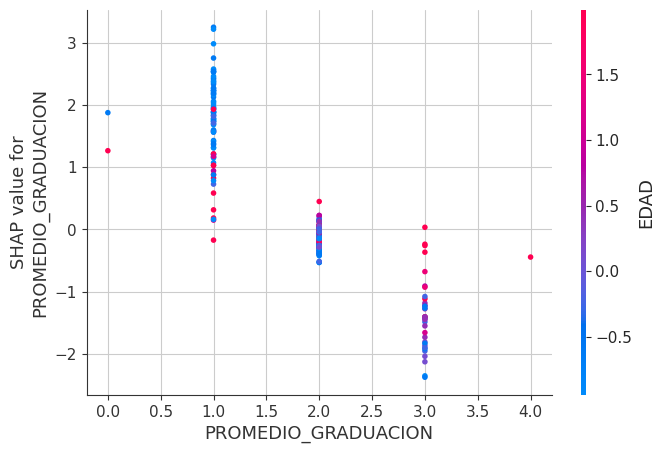

<Figure size 640x480 with 0 Axes>

SHAP Dependence Plot para la ACTIVIDAD_VOCACIONAL_DEL_COLEGIO y su impacto en la prediccion del XGBoost


<Figure size 1000x600 with 0 Axes>

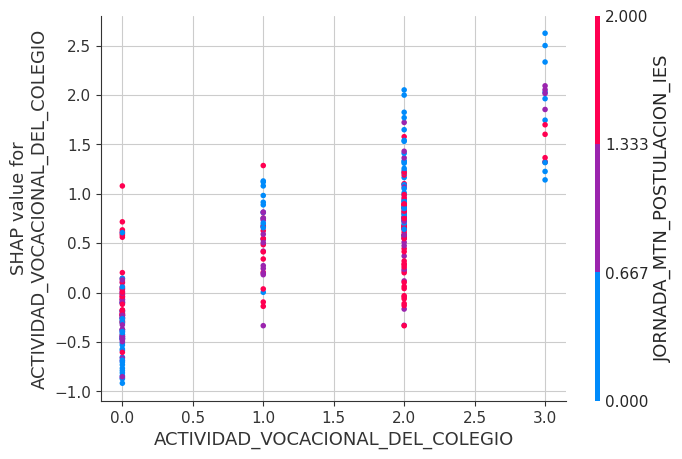

<Figure size 640x480 with 0 Axes>

SHAP Dependence Plot para la AULA_NIVELACION_IES y su impacto en la prediccion del XGBoost


<Figure size 1000x600 with 0 Axes>

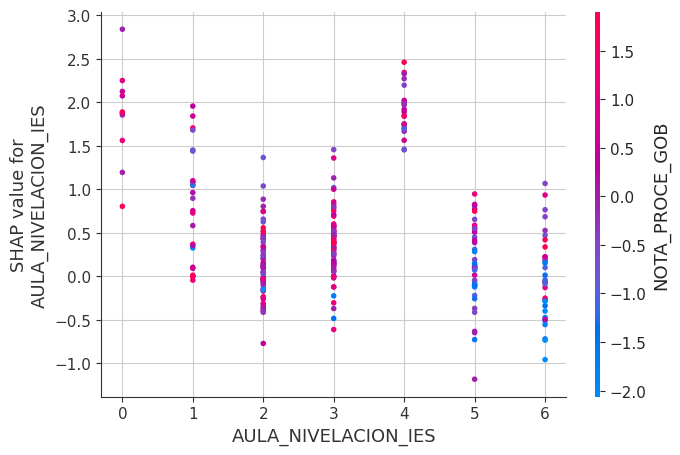

<Figure size 640x480 with 0 Axes>

SHAP Dependence Plot para la TIPO_COLEGIO_GRADUADO y su impacto en la prediccion del XGBoost


<Figure size 1000x600 with 0 Axes>

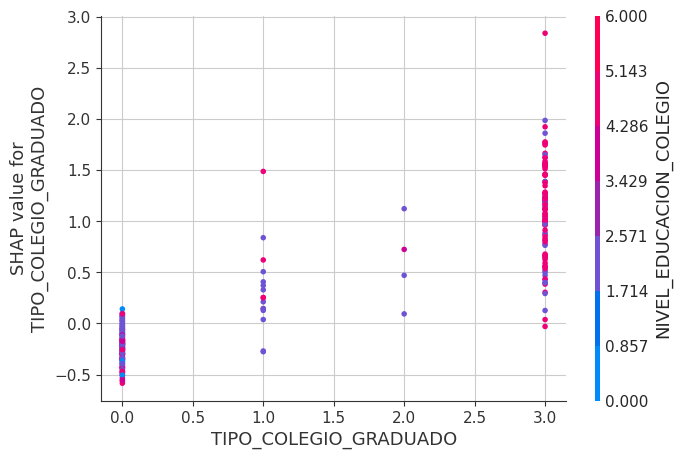

<Figure size 640x480 with 0 Axes>

SHAP Dependence Plot para la NOTA_PROCE_GOB y su impacto en la prediccion del XGBoost


<Figure size 1000x600 with 0 Axes>

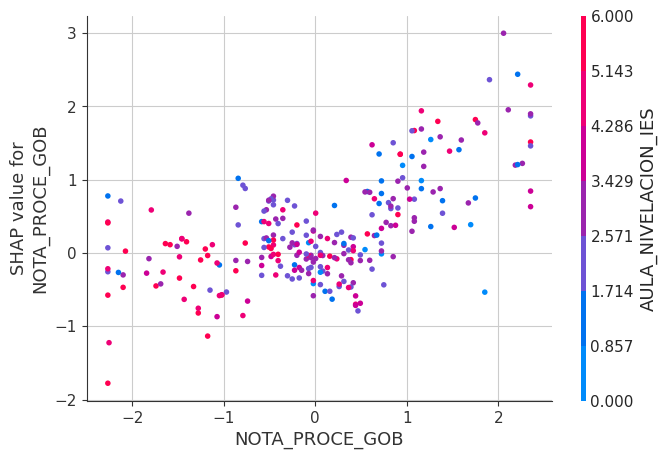

<Figure size 640x480 with 0 Axes>

SHAP Dependence Plot para la ING_ECONOMICO_FAMILIAR y su impacto en la prediccion del XGBoost


<Figure size 1000x600 with 0 Axes>

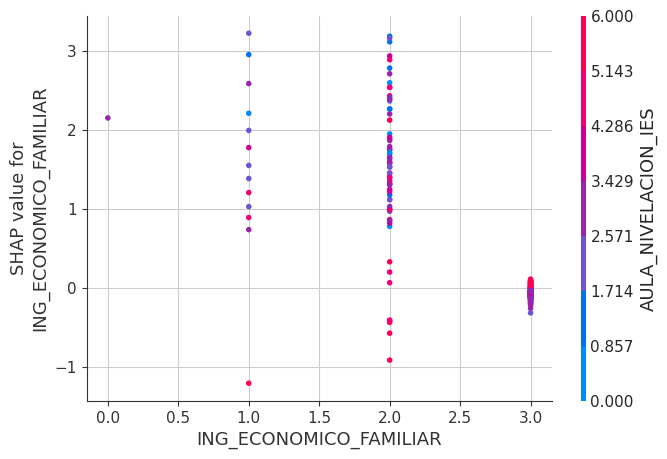

<Figure size 640x480 with 0 Axes>

SHAP Dependence Plot para la CARRERA_POSTULACION_IES y su impacto en la prediccion del XGBoost


<Figure size 1000x600 with 0 Axes>

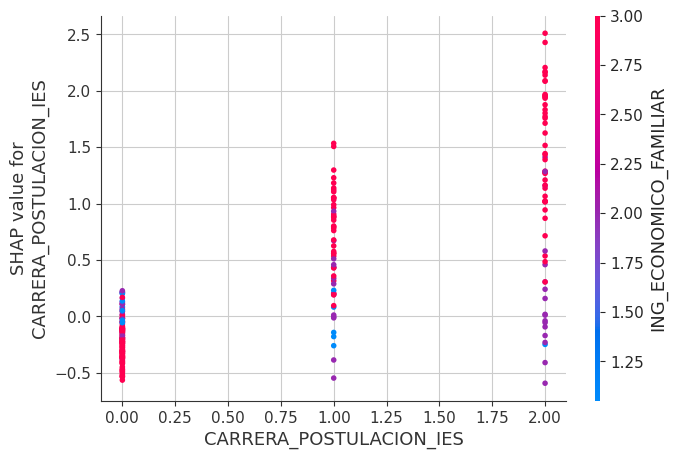

<Figure size 640x480 with 0 Axes>

SHAP Dependence Plot para la EDAD y su impacto en la prediccion del XGBoost


<Figure size 1000x600 with 0 Axes>

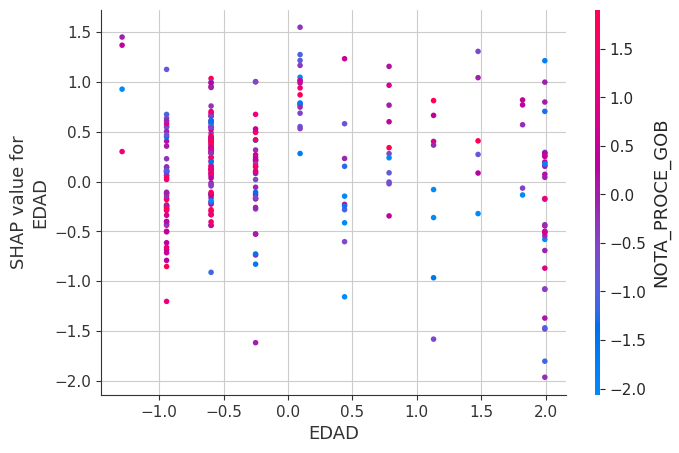

<Figure size 640x480 with 0 Axes>

SHAP Dependence Plot para la PASATIEMPO_GENERICO y su impacto en la prediccion del XGBoost


<Figure size 1000x600 with 0 Axes>

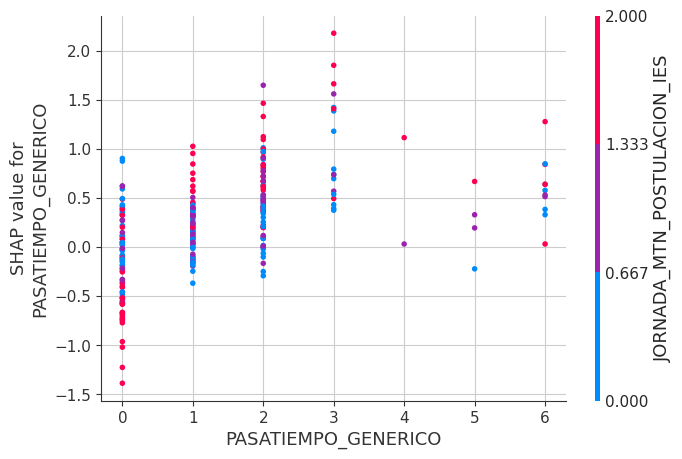

<Figure size 640x480 with 0 Axes>

SHAP Dependence Plot para la PERIODO_APLICO_IES y su impacto en la prediccion del XGBoost


<Figure size 1000x600 with 0 Axes>

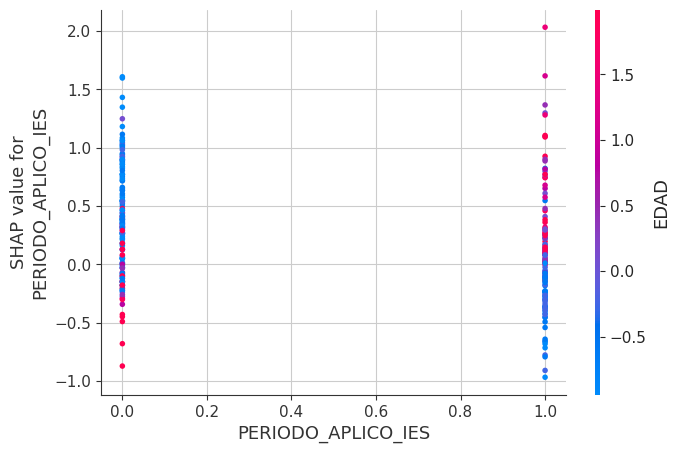

<Figure size 640x480 with 0 Axes>

SHAP Dependence Plot para la DEP_ECONOMICAMENTE_DE y su impacto en la prediccion del XGBoost


<Figure size 1000x600 with 0 Axes>

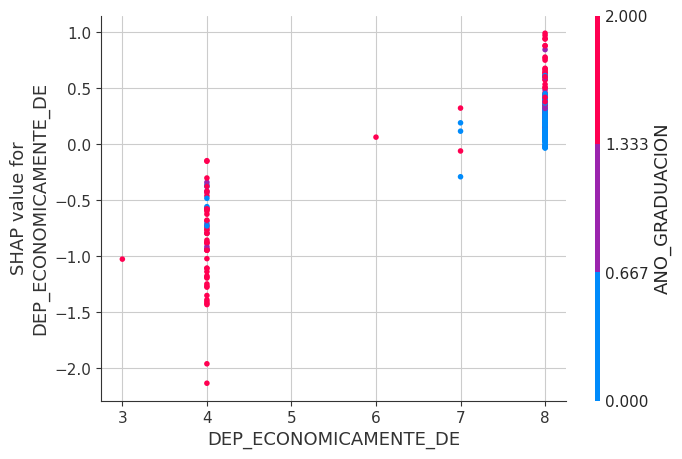

<Figure size 640x480 with 0 Axes>

SHAP Dependence Plot para la AL_POSTULAR_CONOCIAS_OFERTA_ACADEMICA y su impacto en la prediccion del XGBoost


<Figure size 1000x600 with 0 Axes>

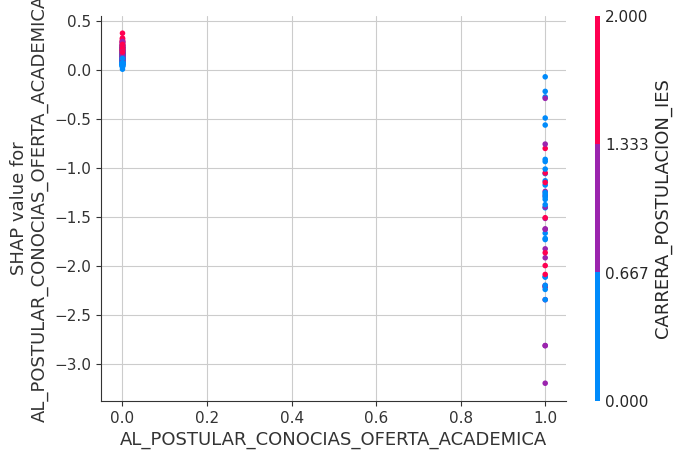

<Figure size 640x480 with 0 Axes>

SHAP Dependence Plot para la JORNADA_MTN_POSTULACION_IES y su impacto en la prediccion del XGBoost


<Figure size 1000x600 with 0 Axes>

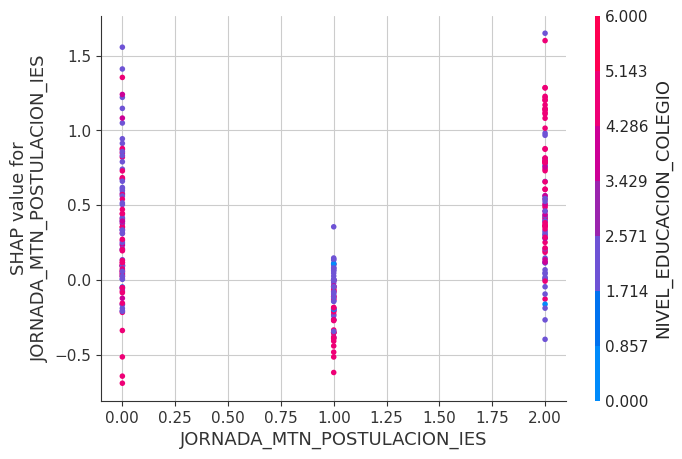

<Figure size 640x480 with 0 Axes>

SHAP Dependence Plot para la PERFIL_SOCIOECONOMICO y su impacto en la prediccion del XGBoost


<Figure size 1000x600 with 0 Axes>

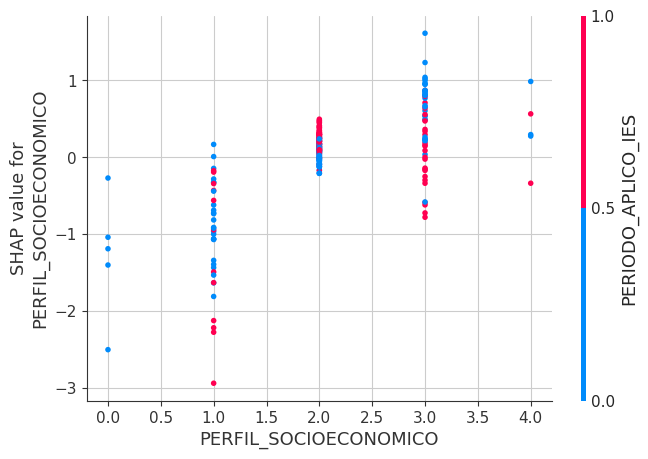

<Figure size 640x480 with 0 Axes>

SHAP Dependence Plot para la PARROQUIA_COLEGIO y su impacto en la prediccion del XGBoost


<Figure size 1000x600 with 0 Axes>

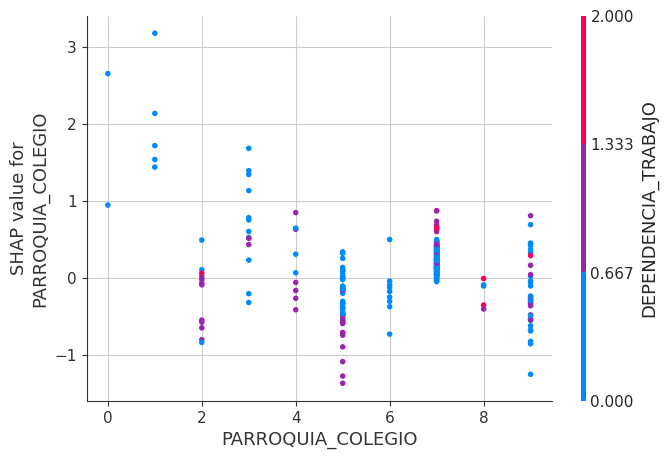

<Figure size 640x480 with 0 Axes>

SHAP Dependence Plot para la NIVEL_EDUCACION_COLEGIO y su impacto en la prediccion del XGBoost


<Figure size 1000x600 with 0 Axes>

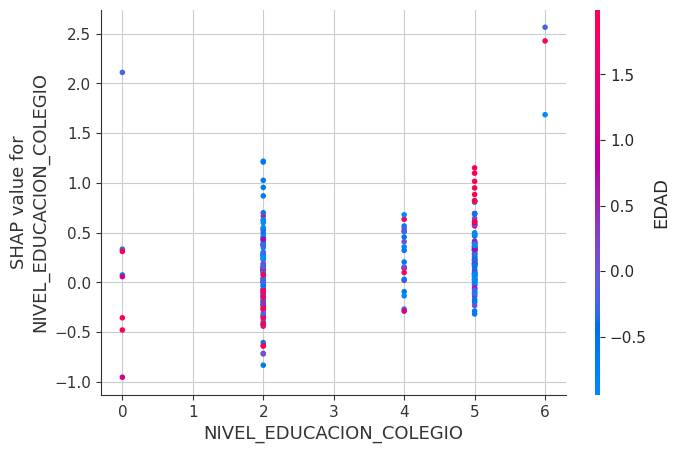

<Figure size 640x480 with 0 Axes>

SHAP Dependence Plot para la ANO_GRADUACION y su impacto en la prediccion del XGBoost


<Figure size 1000x600 with 0 Axes>

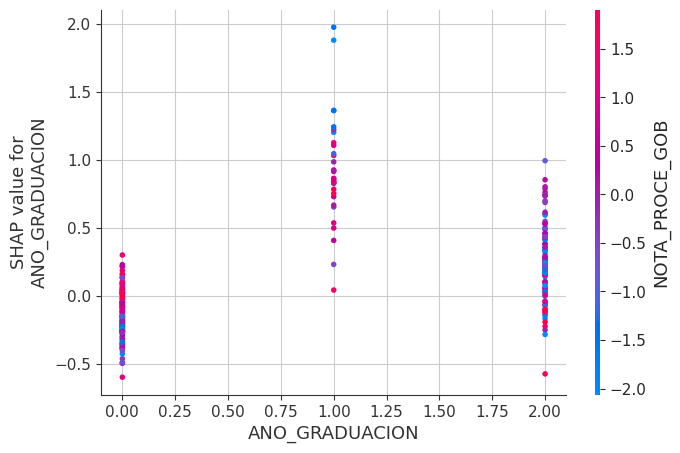

<Figure size 640x480 with 0 Axes>

SHAP Dependence Plot para la SOSTENIMIENTO_COLEGIO y su impacto en la prediccion del XGBoost


<Figure size 1000x600 with 0 Axes>

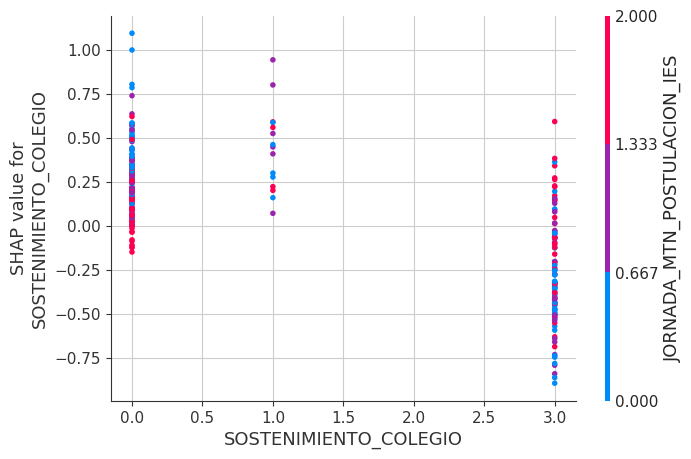

<Figure size 640x480 with 0 Axes>

SHAP Dependence Plot para la JORNADA_COLEGIO y su impacto en la prediccion del XGBoost


<Figure size 1000x600 with 0 Axes>

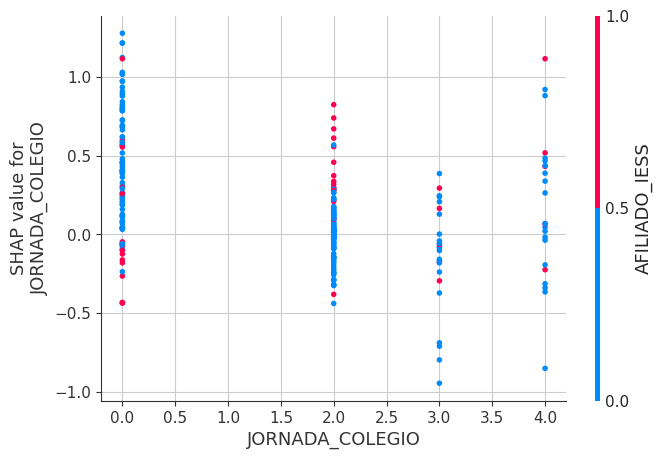

<Figure size 640x480 with 0 Axes>

SHAP Dependence Plot para la AFILIADO_IESS y su impacto en la prediccion del XGBoost


<Figure size 1000x600 with 0 Axes>

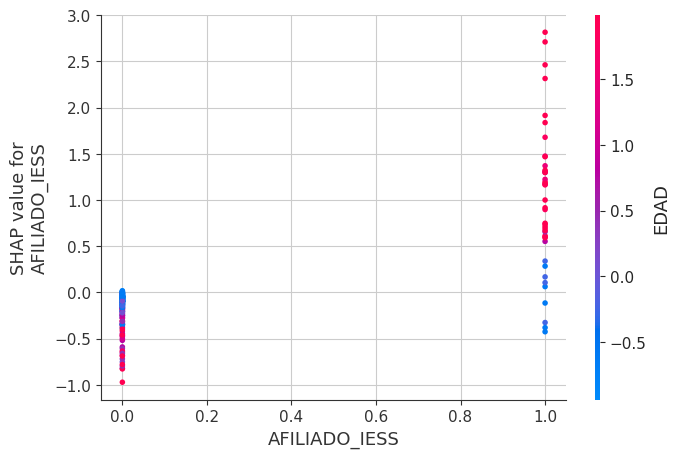

<Figure size 640x480 with 0 Axes>

SHAP Dependence Plot para la DEPENDENCIA_TRABAJO y su impacto en la prediccion del XGBoost


<Figure size 1000x600 with 0 Axes>

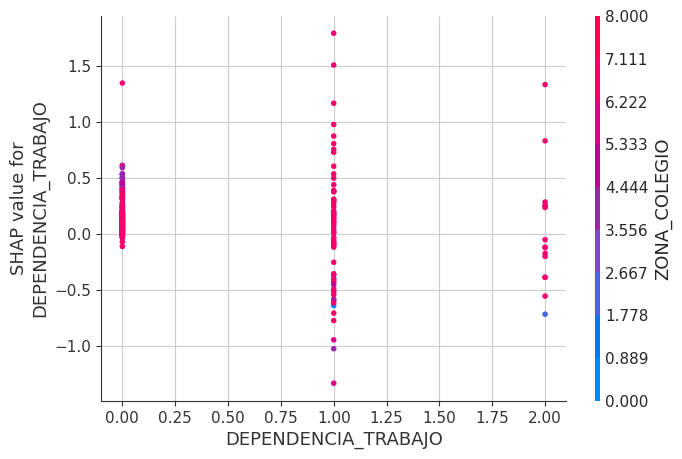

<Figure size 640x480 with 0 Axes>

SHAP Dependence Plot para la ZONA_COLEGIO y su impacto en la prediccion del XGBoost


<Figure size 1000x600 with 0 Axes>

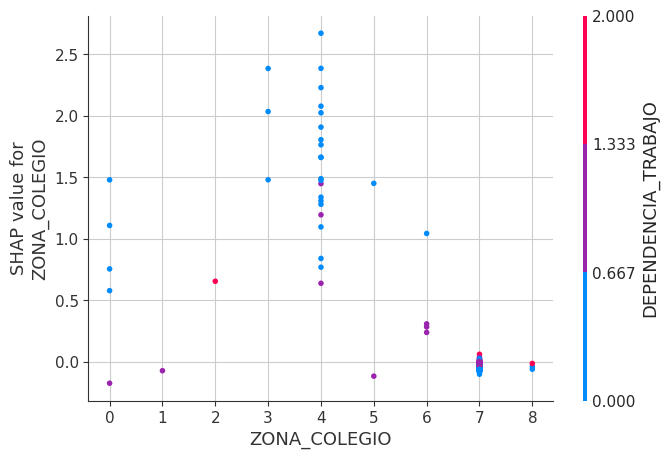

<Figure size 640x480 with 0 Axes>

SHAP Dependence Plot para la SEXO y su impacto en la prediccion del XGBoost


<Figure size 1000x600 with 0 Axes>

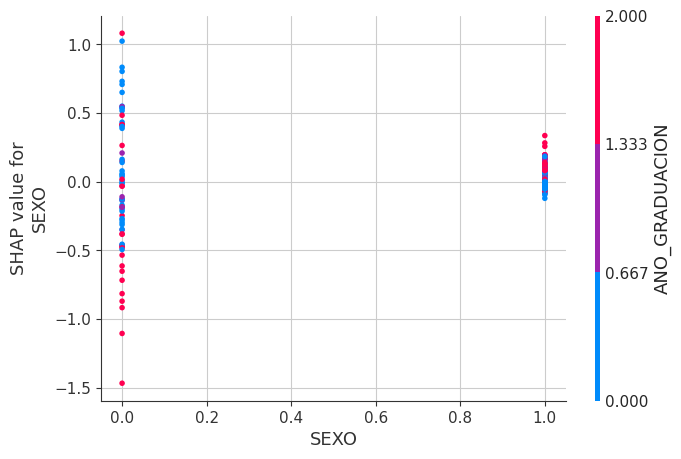

<Figure size 640x480 with 0 Axes>

SHAP Dependence Plot para la CONOCES_SISTEMA_POSTULACION y su impacto en la prediccion del XGBoost


<Figure size 1000x600 with 0 Axes>

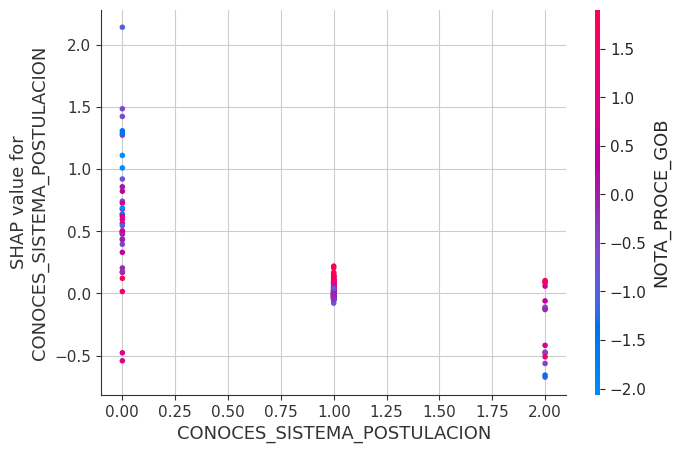

<Figure size 640x480 with 0 Axes>

SHAP Dependence Plot para la CANTON_RESIDENCIA y su impacto en la prediccion del XGBoost


<Figure size 1000x600 with 0 Axes>

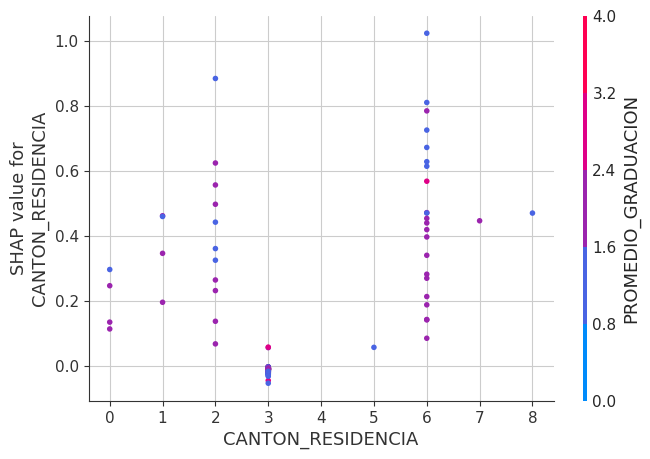

<Figure size 640x480 with 0 Axes>

SHAP Dependence Plot para la PLANEA_CAMBIARSE_DE_CARRERA y su impacto en la prediccion del XGBoost


<Figure size 1000x600 with 0 Axes>

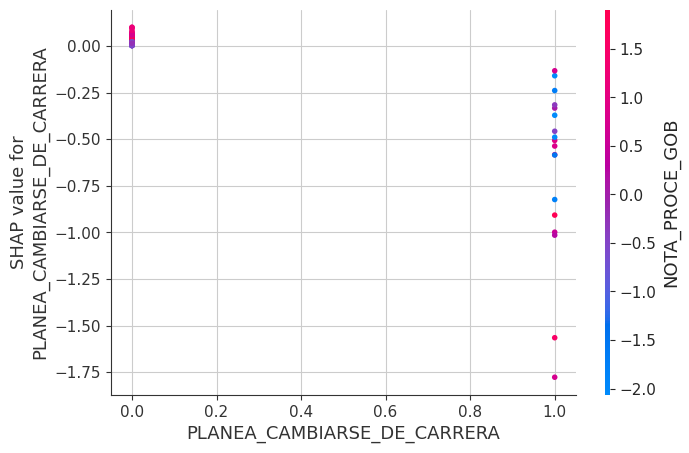

<Figure size 640x480 with 0 Axes>

SHAP Dependence Plot para la ESTAS_DEACUERDO_SISTEMA_POST y su impacto en la prediccion del XGBoost


<Figure size 1000x600 with 0 Axes>

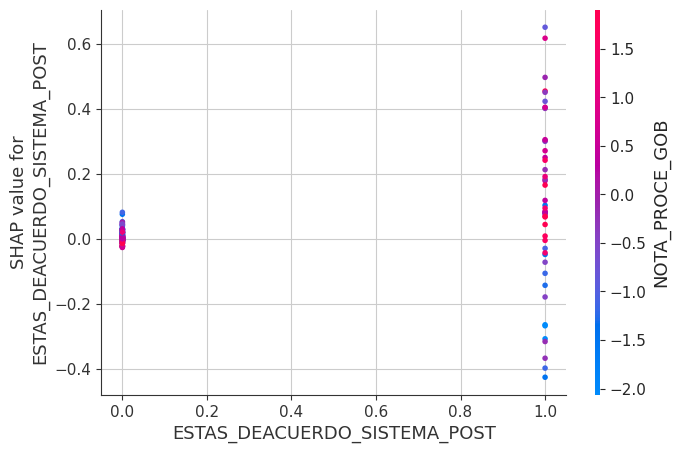

<Figure size 640x480 with 0 Axes>

In [332]:
for feature in feature_importance:
    print(f'SHAP Dependence Plot para la {feature} y su impacto en la prediccion del XGBoost')
    plt.figure(figsize=(10, 6))
    shap.dependence_plot(feature, shap_values_xgb, X_test_30_np, interaction_index='auto', feature_names=X_test_30.columns)
    plt.tight_layout()
    plt.show()

##**7.6. SHAP Force Plot**

Este gráfico muestra cómo cada característica contribuye a una predicción individual. Es útil para explicar una predicción específica.

Cuándo usarlo:

Para explicar una predicción individual en detalle.

Para ver cómo cada característica influye en una predicción específica.

<Figure size 1000x600 with 0 Axes>

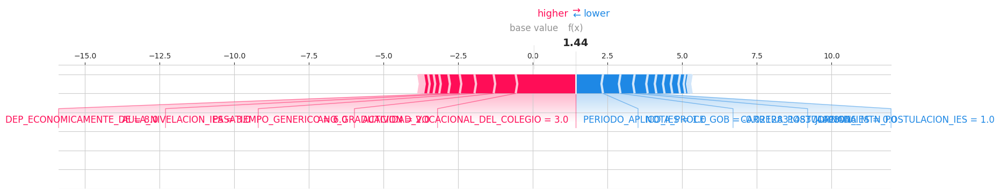

In [333]:
i = 0  # Índice de la instancia a explicar
plt.figure(figsize=(10, 6))
shap.force_plot(explainer_xgb.expected_value, shap_values_xgb[i], X_test_30_np[i], feature_names=X_test_30.columns, matplotlib=True)
#plt.title(f'Explicación SHAP para la instancia {i} - XGBoosting')
#plt.tight_layout()
#plt.show()


##**7.7. - Explicabilidad de impacto de las variables para una Instancia**

Mediante TreeExplain que permite explicar el efecto en una instancia (la  instancia id 0).
Mecanismo diseñnado para modelos basados en XGBoost

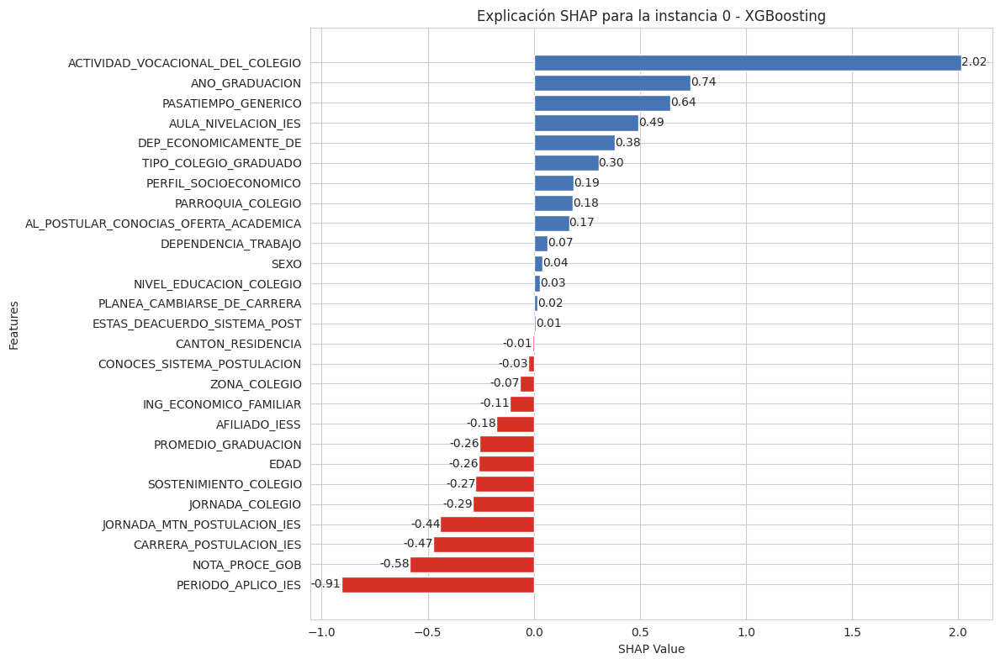

In [334]:
import shap
import matplotlib.pyplot as plt
import numpy as np

# Se converte los datos a matrices NumPy
X_train_30_np = X_train_30.to_numpy()
X_test_30_np = X_test_30.to_numpy()

# Se calcula valores SHAP utilizando TreeExplainer
explainer_xgb = shap.TreeExplainer(xgb_30)
shap_values_xgb = explainer_xgb.shap_values(X_test_30_np)

# Se ordena los valores SHAP y los nombres de las características
sorted_indices = np.argsort(shap_values_xgb[0])
sorted_shap_values = shap_values_xgb[0][sorted_indices]
sorted_feature_names = X_test_30.columns[sorted_indices]

# Se crea el gráfico de barras con nombres de variables ajustados y colores azul y rojo
plt.figure(figsize=(12, 8))
y_pos = np.arange(len(sorted_shap_values))
colors = ['#4575b4' if val > 0 else '#d73027' for val in sorted_shap_values]  # Azul para positivos, rojo para negativos
plt.barh(y_pos, sorted_shap_values, align='center', color=colors)

# Se muestra el valor de las barras al costado de estas
for j, value in enumerate(sorted_shap_values):
    plt.text(value, y_pos[j], f'{value:.2f}', va='center', ha='left' if value >= 0 else 'right')

plt.xlabel('SHAP Value')
plt.ylabel('Features')
plt.title(f'Explicación SHAP para la instancia {i} - XGBoosting')
plt.yticks(y_pos, sorted_feature_names)
plt.tight_layout()
plt.show()

##**7.8 - Explicabilidad del impacto promedio de las vcariables usando el conjunto completo de test**

In [335]:
import shap
import matplotlib.pyplot as plt
import numpy as np

# Se crea el explainer usando TreeExplainer
explainer = shap.TreeExplainer(xgb_30)

# Se calcula los valores SHAP para todo el conjunto de datos
shap_values = explainer.shap_values(X_test_30)

# Se calcula el impacto promedio absoluto de cada característica
shap_values_mean_abs = np.abs(shap_values).mean(0)

# Se ordena las características por importancia
feature_importance = pd.DataFrame(list(zip(X_test_30.columns, shap_values_mean_abs)), columns=['col_name','feature_importance_vals'])
feature_importance = feature_importance.sort_values('feature_importance_vals', ascending=False).reset_index(drop=True)

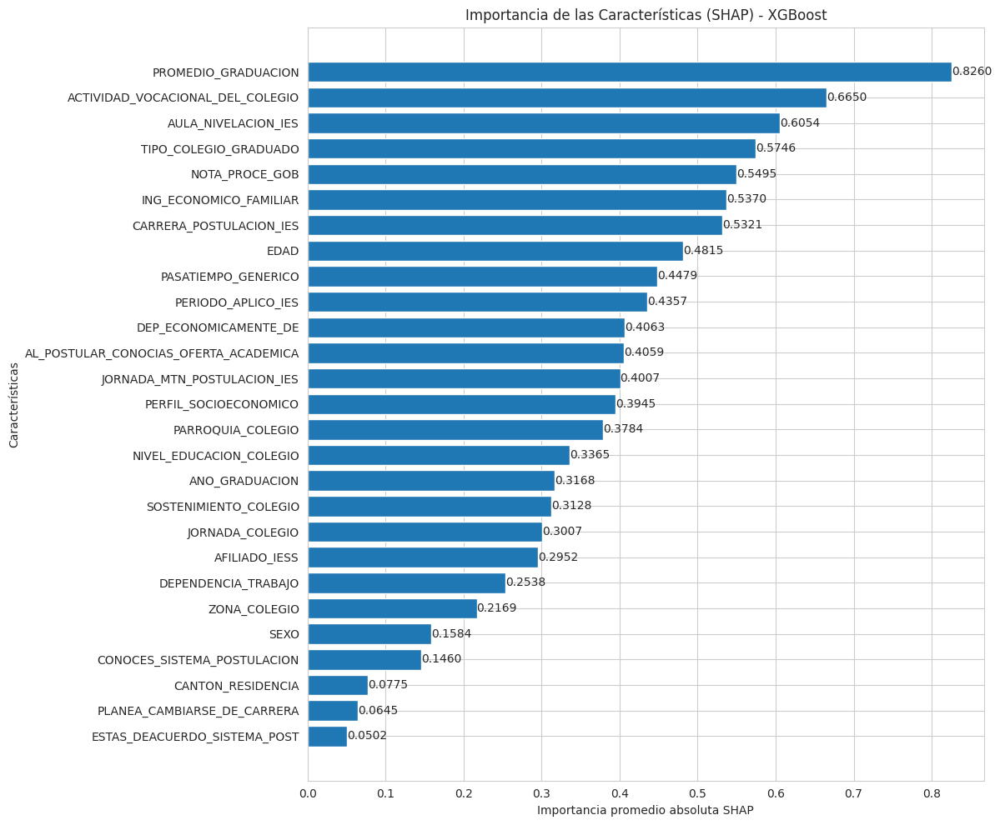

In [336]:
# Se crea el gráfico de barras horizontales
plt.figure(figsize=(12, 10))
bars = plt.barh(feature_importance['col_name'], feature_importance['feature_importance_vals'])
plt.xlabel('Importancia promedio absoluta SHAP')
plt.ylabel('Características')
plt.title('Importancia de las Características (SHAP) - XGBoost')
plt.tight_layout()

# Se añade los valores a las barras
for i, bar in enumerate(bars):
    width = bar.get_width()
    plt.text(width, bar.get_y() + bar.get_height()/2, f'{width:.4f}',
             ha='left', va='center')

# Se invierte el orden de las características para que la más importante esté arriba
plt.gca().invert_yaxis()

plt.show()

##**7.9. SHAP Decision Plot**
Este gráfico muestra cómo las características afectan la predicción a lo largo del camino de decisión del modelo.

Cuándo usarlo: Para entender el proceso de decisión del modelo.
Para ver cómo las características contribuyen a la predicción en diferentes etapas del modelo.

Analiza la contribucion de cada variable em una predicción especifica

SHAP Decision Plot para la instancia 0 - XGBoosting


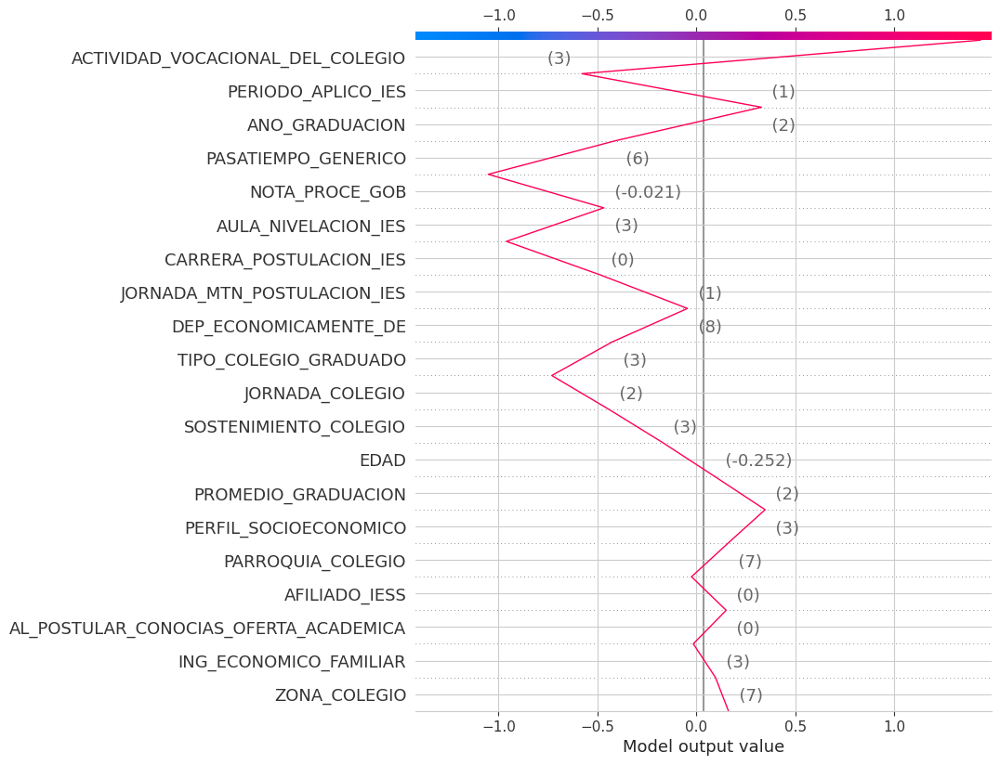

In [337]:
import shap
import matplotlib.pyplot as plt

# Se convierte los datos a matrices NumPy
X_train_30_np = X_train_30.to_numpy()
X_test_30_np = X_test_30.to_numpy()

# Se calcula valores SHAP utilizando TreeExplainer
explainer_xgb = shap.TreeExplainer(xgb_30)
shap_values_xgb = explainer_xgb.shap_values(X_test_30_np)

# Se verifica que feature_names sea una lista
feature_names = X_test_30.columns.tolist()

# Se crea el SHAP decision plot
i = 0  # Se define el índice de la instancia que quieres visualizar
print(f'SHAP Decision Plot para la instancia {i} - XGBoosting')
shap.decision_plot(explainer_xgb.expected_value, shap_values_xgb[i], X_test_30_np[i], feature_names=feature_names)


In [338]:
#https://shap.readthedocs.io/en/latest/index.html

In [339]:
#https://shap.readthedocs.io/en/latest/generated/shap.Explainer.html

SHAP Decision Plot para la instancia 1 - XGBoosting


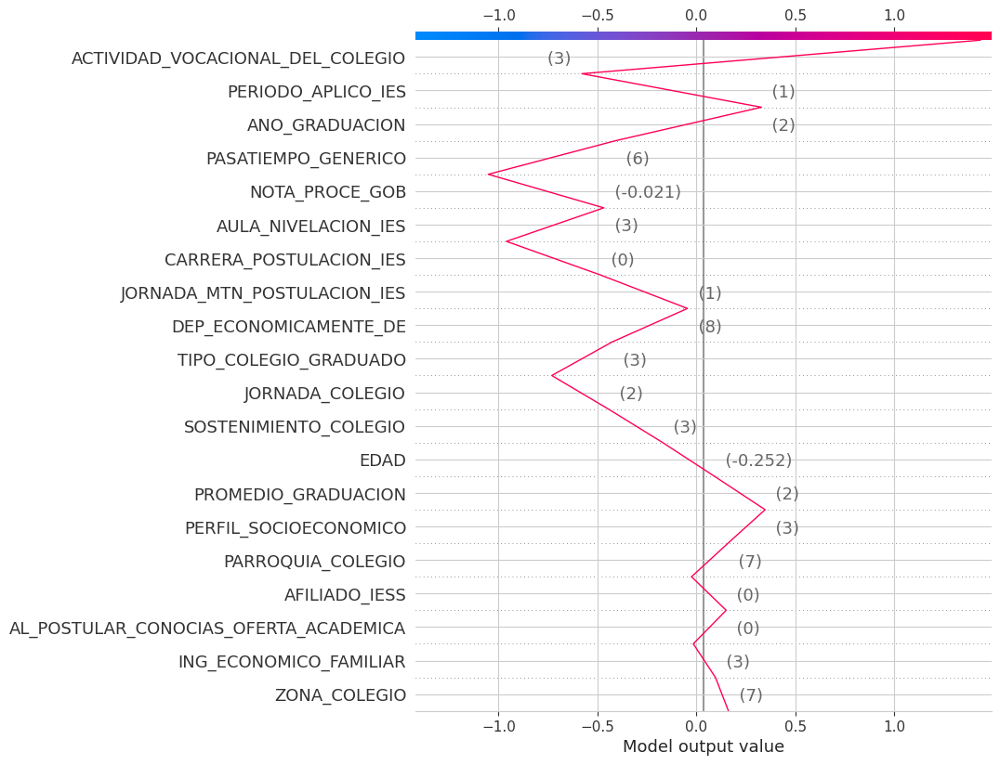

Instancia 0:
Predicción del modelo: 1
Valor real: 0
--------------------
SHAP Decision Plot para la instancia 2 - XGBoosting


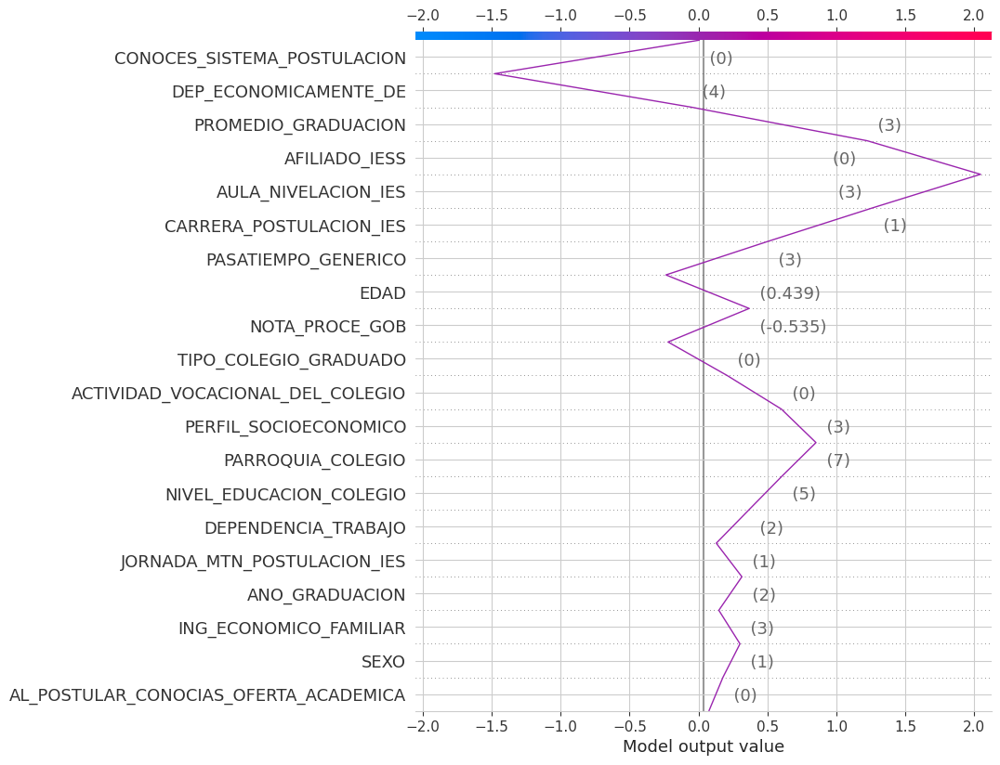

Instancia 1:
Predicción del modelo: 1
Valor real: 1
--------------------
SHAP Decision Plot para la instancia 3 - XGBoosting


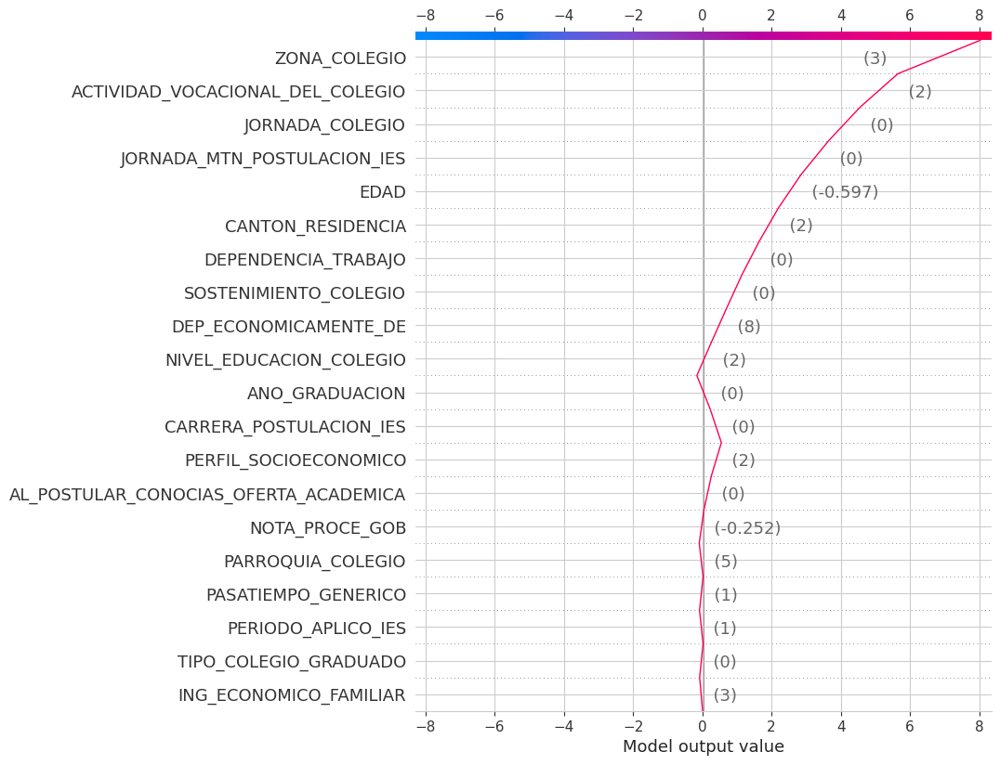

Instancia 2:
Predicción del modelo: 1
Valor real: 1
--------------------
SHAP Decision Plot para la instancia 4 - XGBoosting


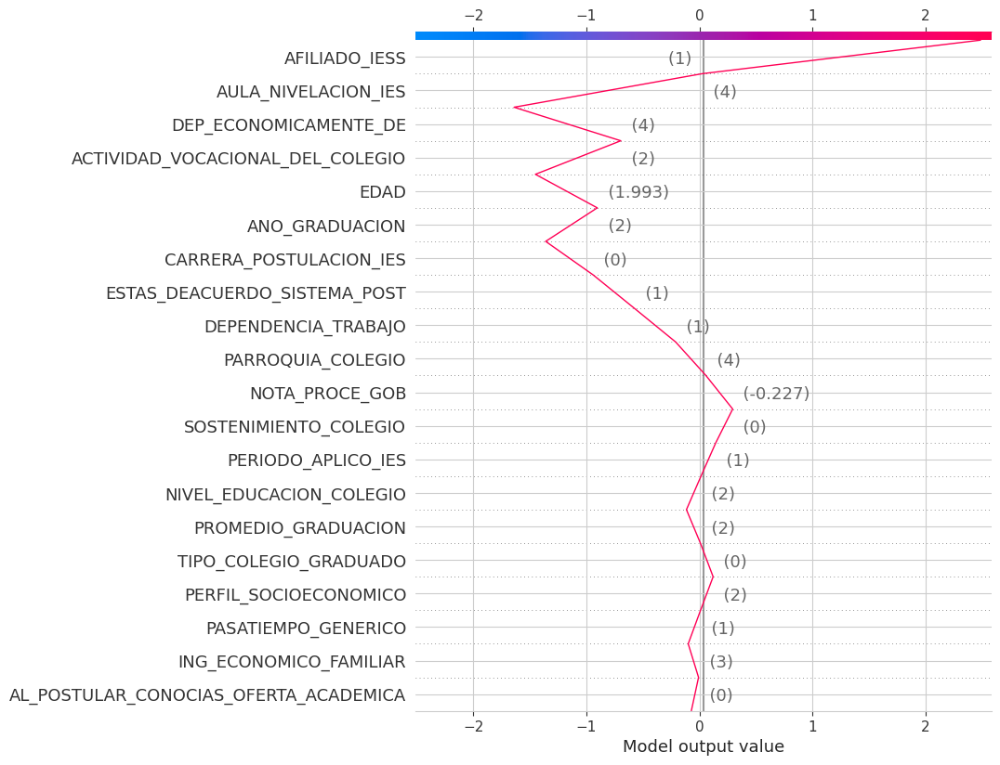

Instancia 3:
Predicción del modelo: 1
Valor real: 1
--------------------
SHAP Decision Plot para la instancia 5 - XGBoosting


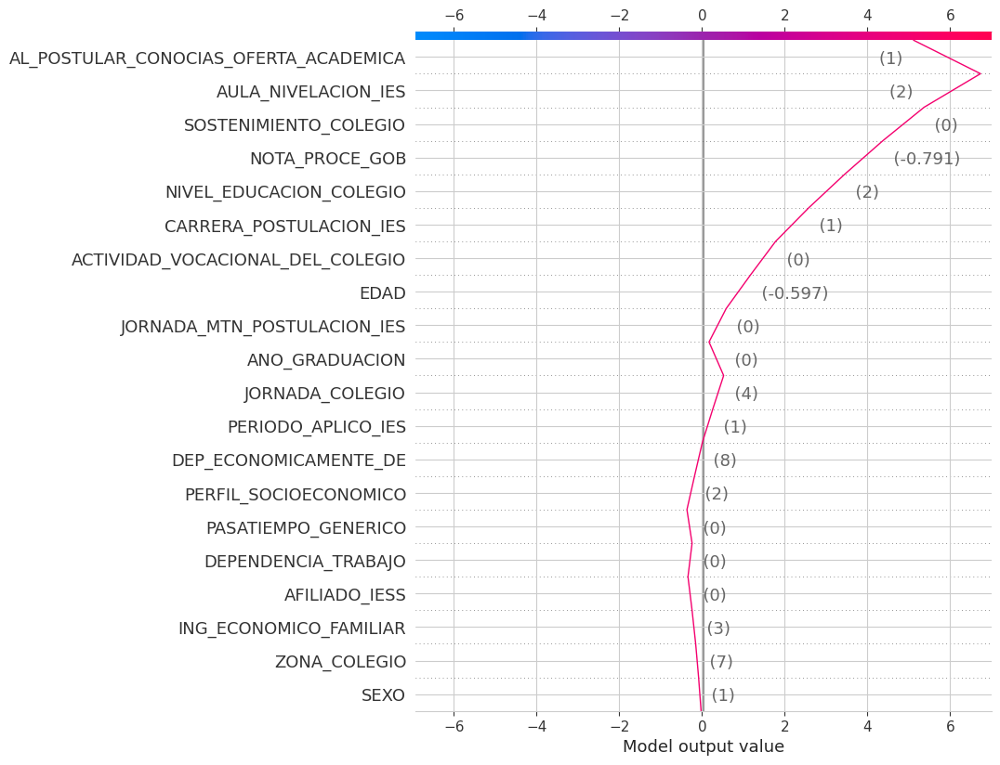

Instancia 4:
Predicción del modelo: 1
Valor real: 1
--------------------
SHAP Decision Plot para la instancia 6 - XGBoosting


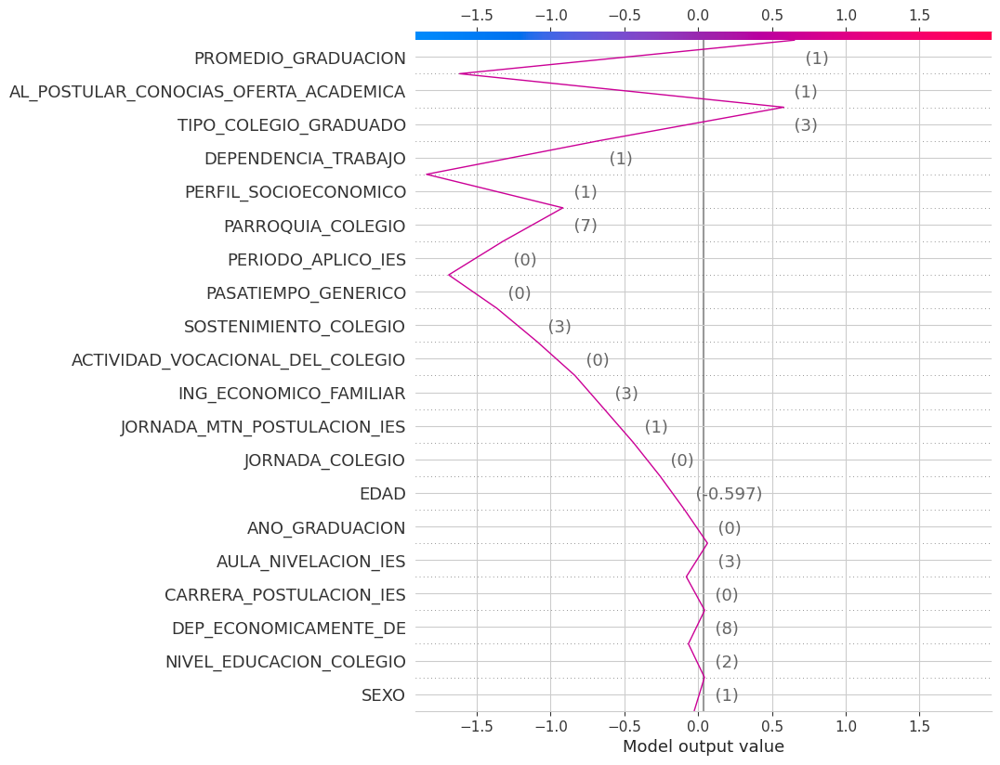

Instancia 5:
Predicción del modelo: 1
Valor real: 1
--------------------
SHAP Decision Plot para la instancia 7 - XGBoosting


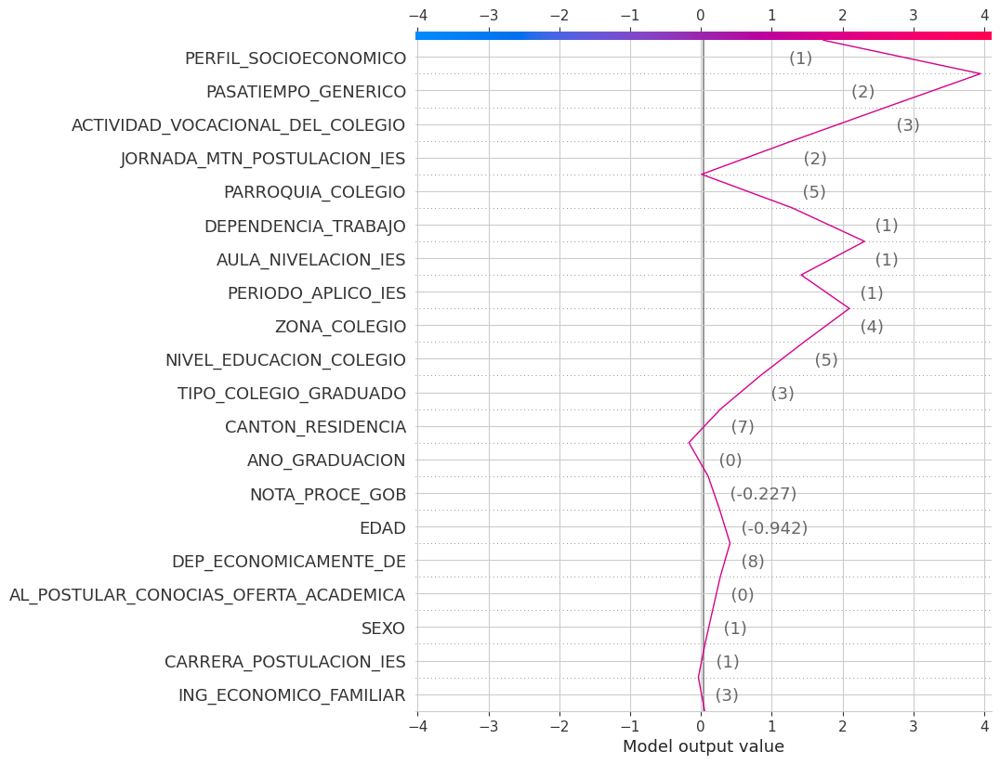

Instancia 6:
Predicción del modelo: 1
Valor real: 1
--------------------
SHAP Decision Plot para la instancia 8 - XGBoosting


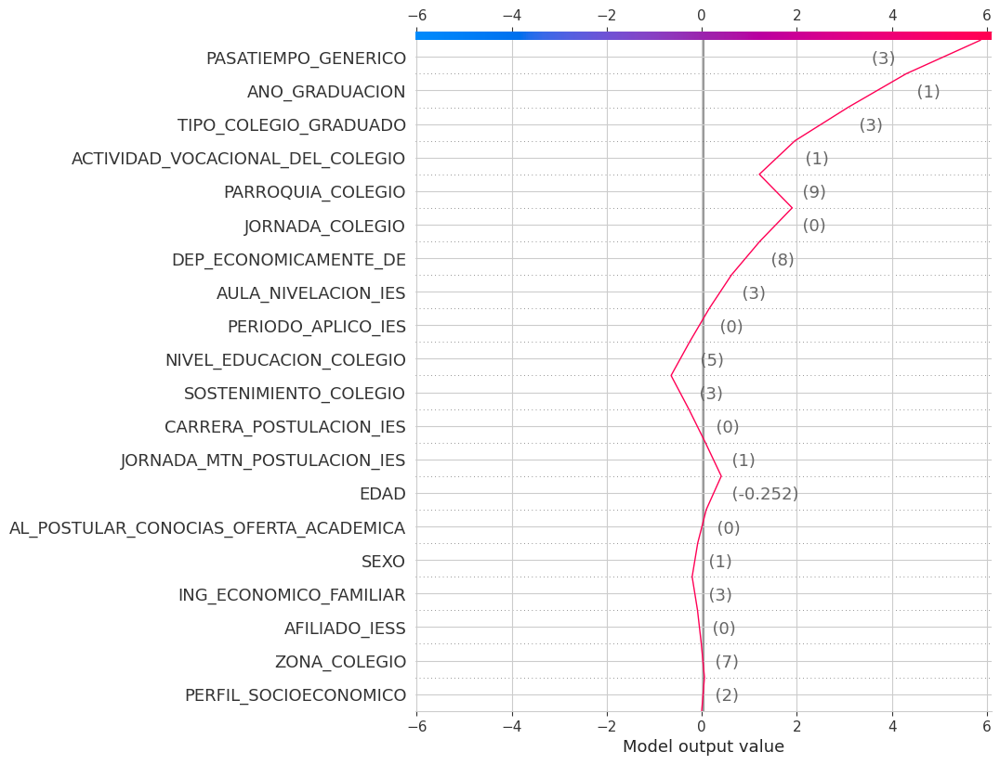

Instancia 7:
Predicción del modelo: 1
Valor real: 1
--------------------
SHAP Decision Plot para la instancia 9 - XGBoosting


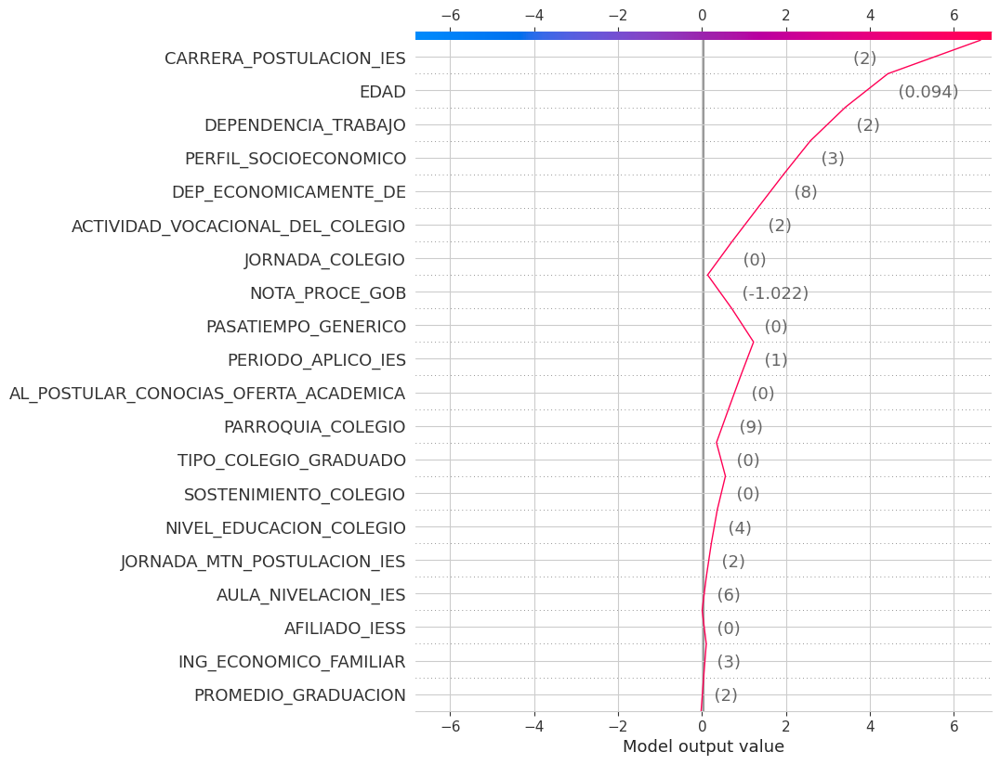

Instancia 8:
Predicción del modelo: 1
Valor real: 0
--------------------
SHAP Decision Plot para la instancia 10 - XGBoosting


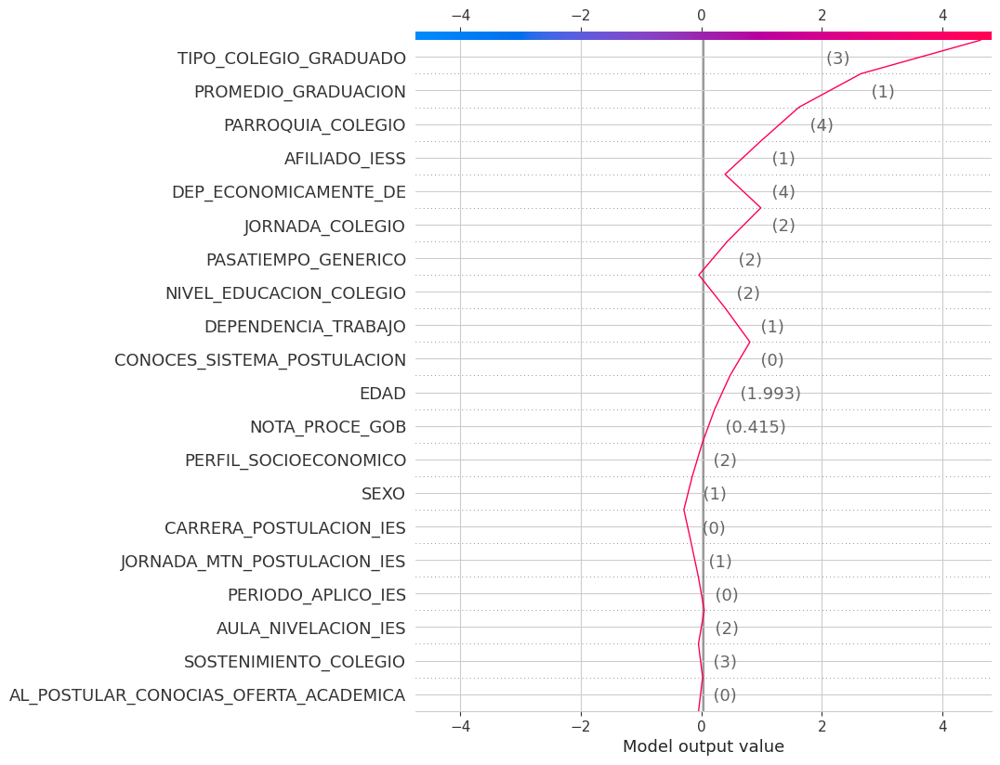

Instancia 9:
Predicción del modelo: 1
Valor real: 1
--------------------
SHAP Decision Plot para la instancia 11 - XGBoosting


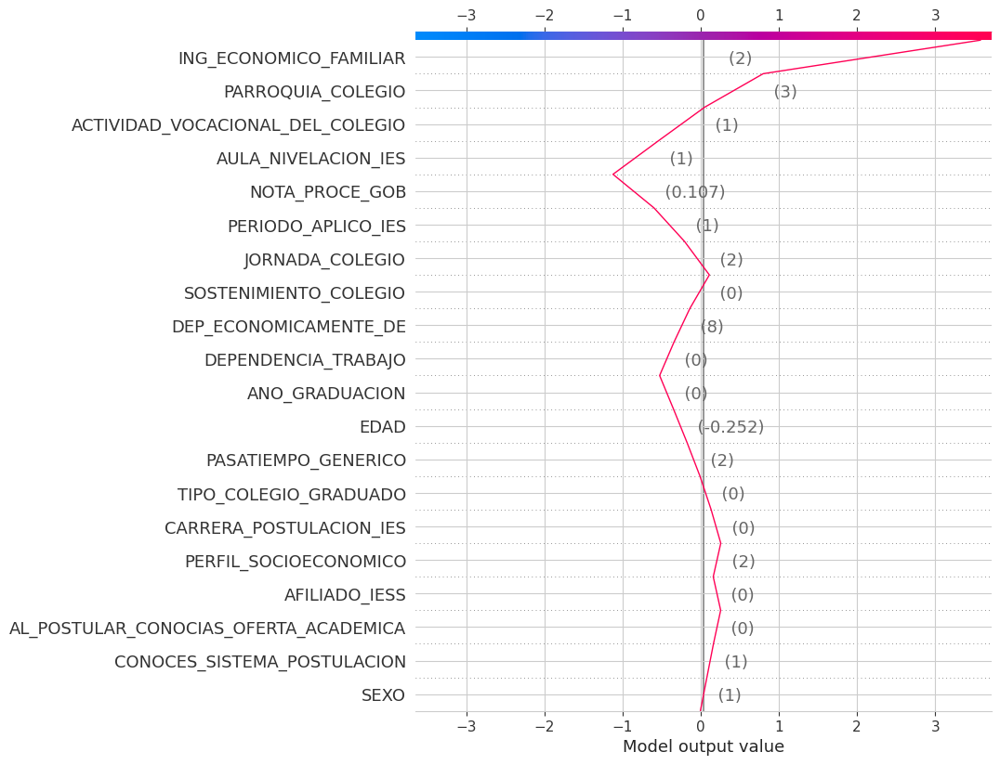

Instancia 10:
Predicción del modelo: 1
Valor real: 0
--------------------
SHAP Decision Plot para la instancia 12 - XGBoosting


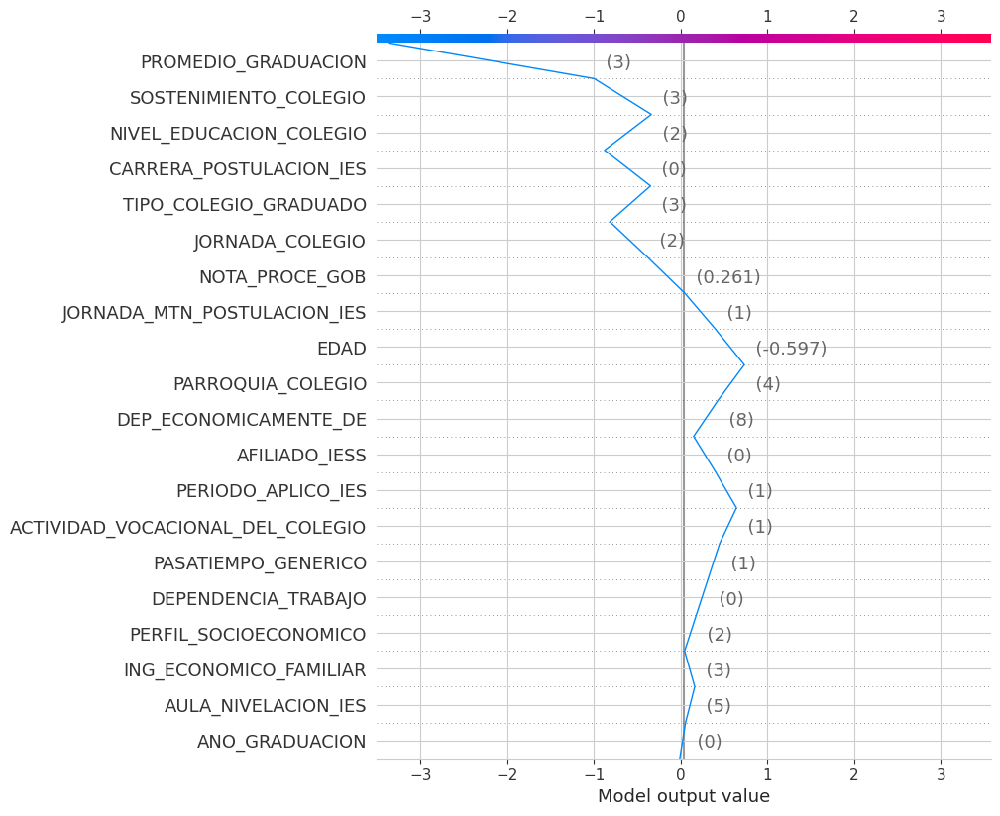

Instancia 11:
Predicción del modelo: 0
Valor real: 1
--------------------
SHAP Decision Plot para la instancia 13 - XGBoosting


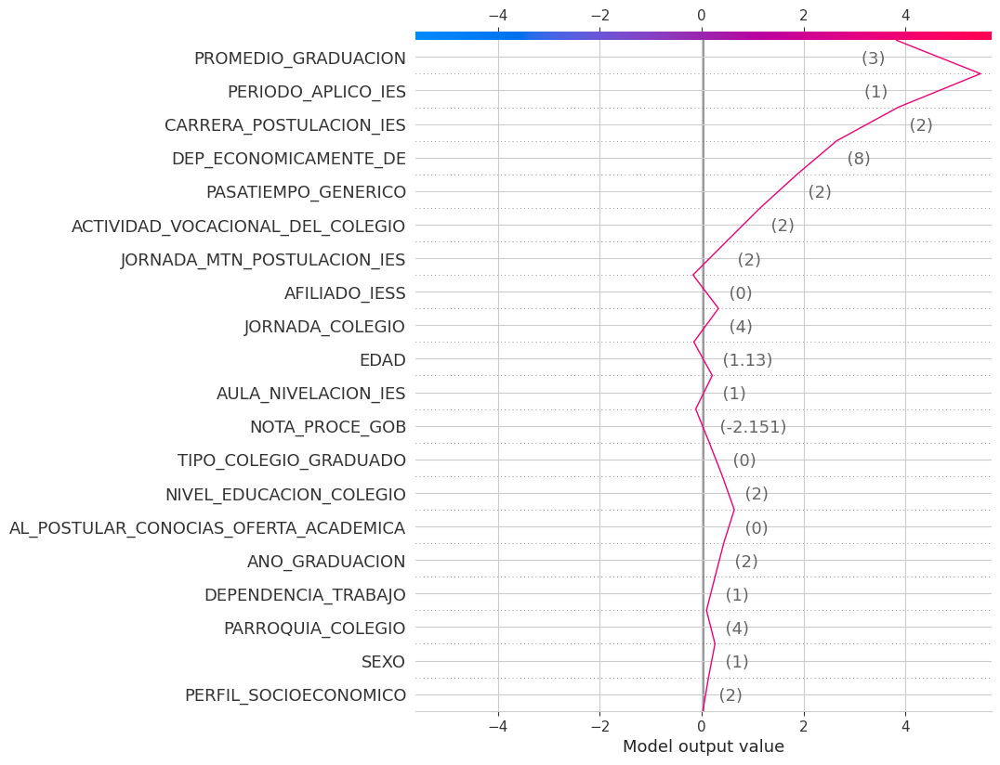

Instancia 12:
Predicción del modelo: 1
Valor real: 0
--------------------
SHAP Decision Plot para la instancia 14 - XGBoosting


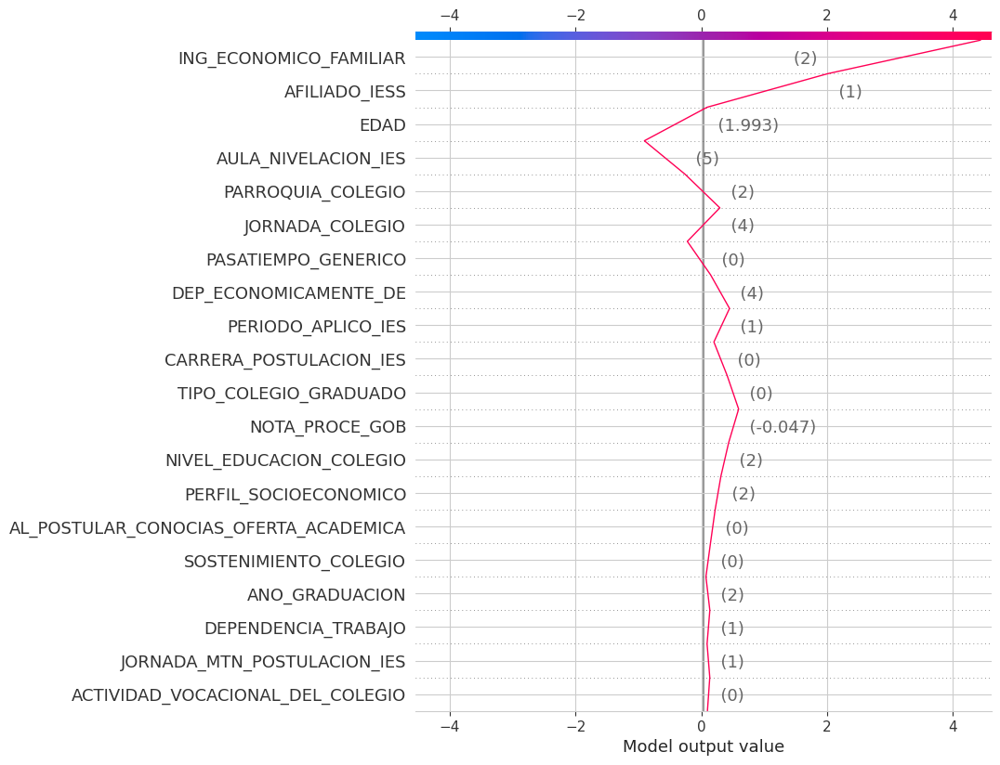

Instancia 13:
Predicción del modelo: 1
Valor real: 1
--------------------
SHAP Decision Plot para la instancia 15 - XGBoosting


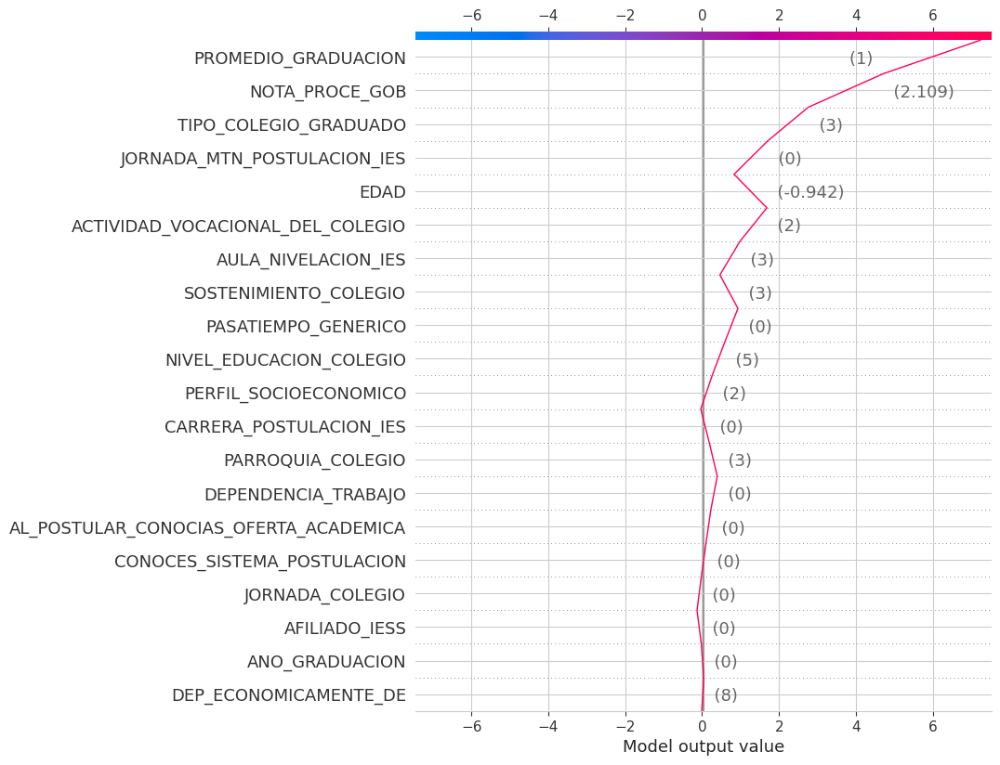

Instancia 14:
Predicción del modelo: 1
Valor real: 1
--------------------
SHAP Decision Plot para la instancia 16 - XGBoosting


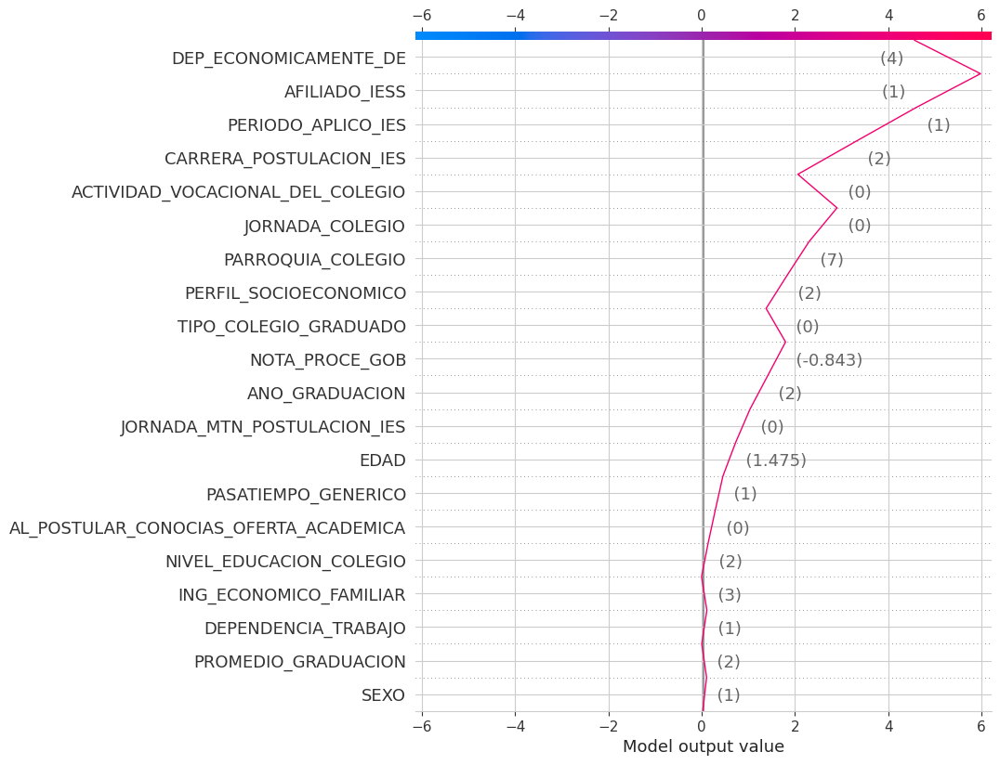

Instancia 15:
Predicción del modelo: 1
Valor real: 0
--------------------
SHAP Decision Plot para la instancia 17 - XGBoosting


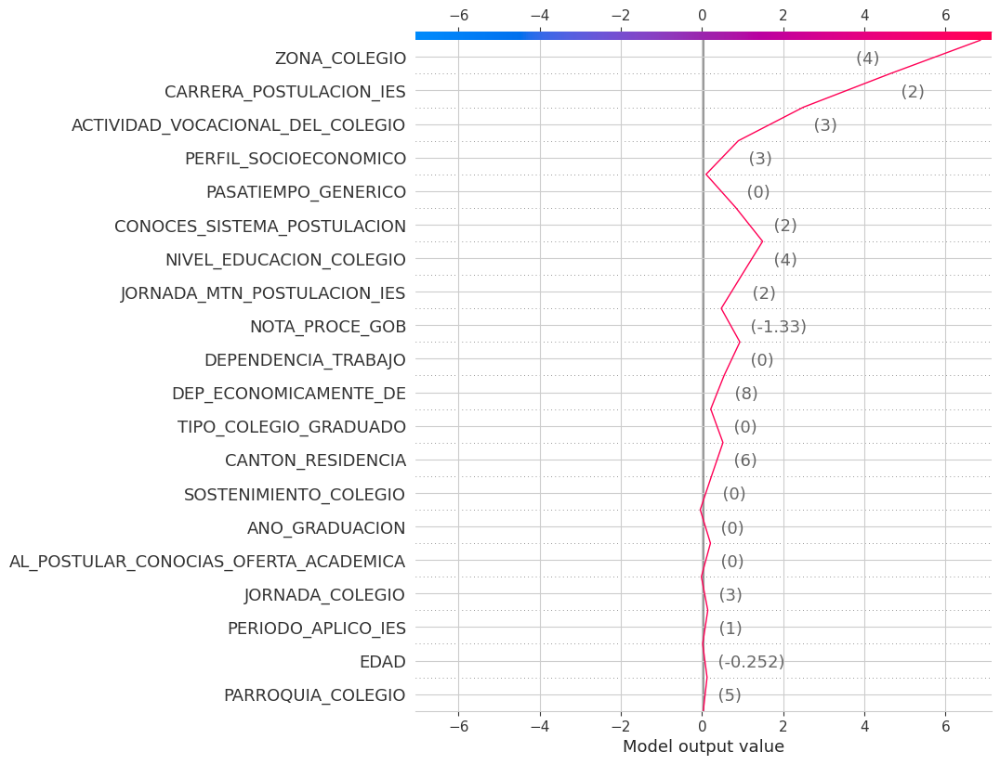

Instancia 16:
Predicción del modelo: 1
Valor real: 1
--------------------
SHAP Decision Plot para la instancia 18 - XGBoosting


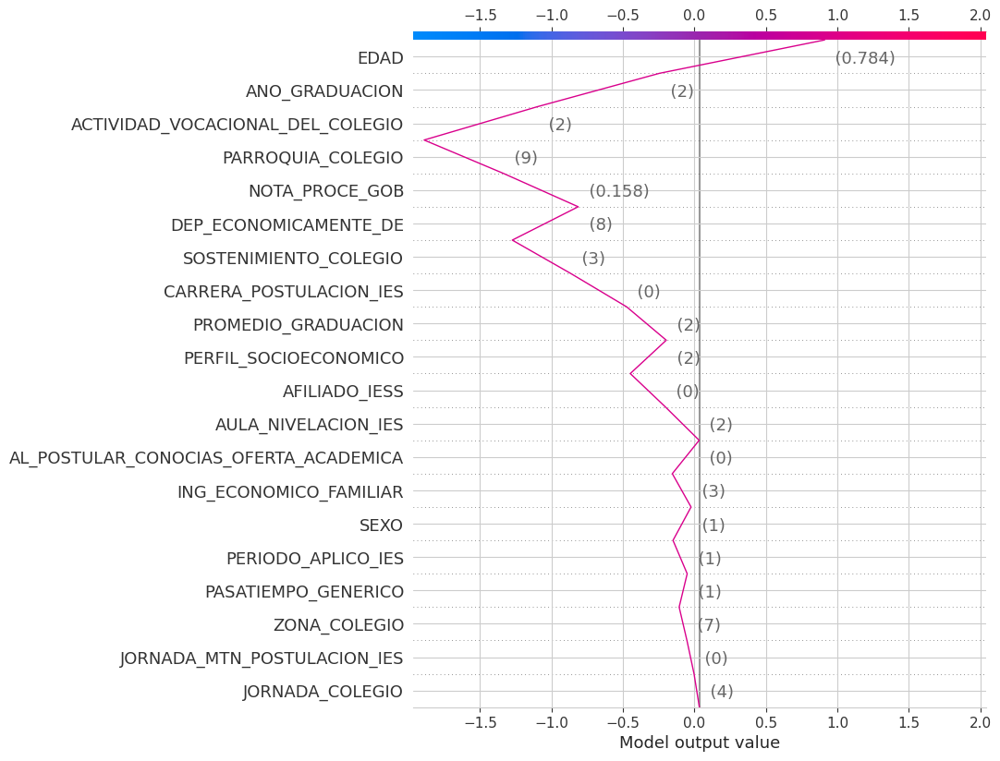

Instancia 17:
Predicción del modelo: 1
Valor real: 1
--------------------
SHAP Decision Plot para la instancia 19 - XGBoosting


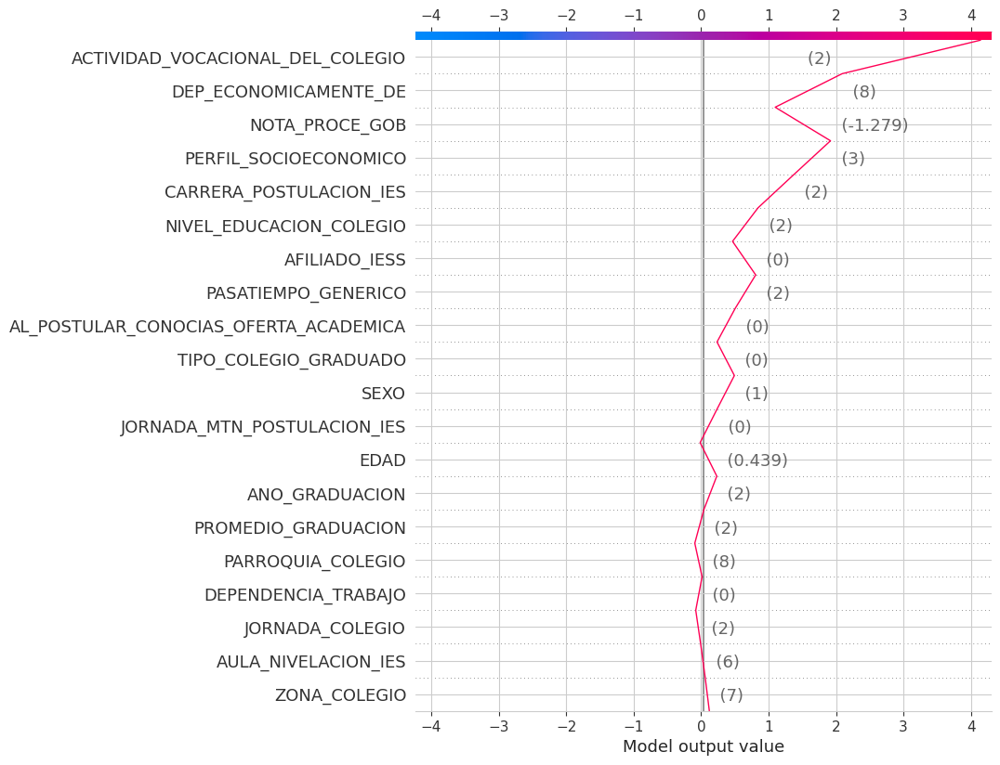

Instancia 18:
Predicción del modelo: 1
Valor real: 1
--------------------
SHAP Decision Plot para la instancia 20 - XGBoosting


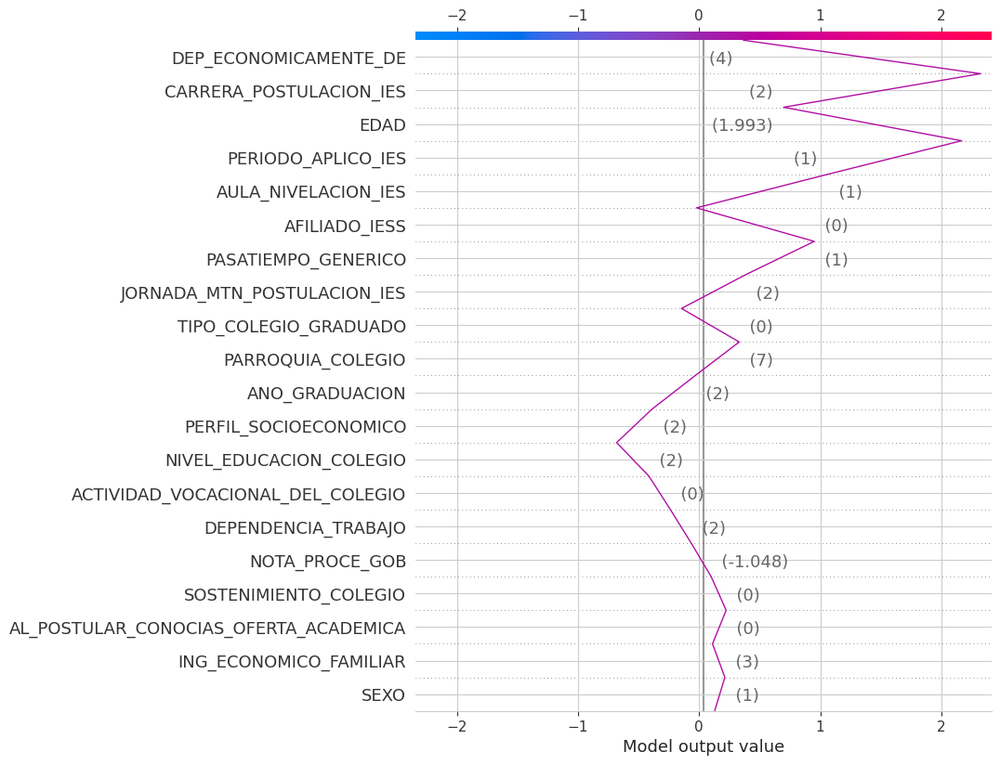

Instancia 19:
Predicción del modelo: 1
Valor real: 0
--------------------


In [340]:
import shap
import matplotlib.pyplot as plt

# Se convierte los datos a matrices NumPy
X_train_30_np = X_train_30.to_numpy()
X_test_30_np = X_test_30.to_numpy()

# Se calcula valores SHAP utilizando TreeExplainer
explainer_xgb = shap.TreeExplainer(xgb_30)
shap_values_xgb = explainer_xgb.shap_values(X_test_30_np[:20])  # Calcular para los primeros 20 registros

# Se valida que feature_names sea una lista
feature_names = X_test_30.columns.tolist()

# Se crear el SHAP decision plot para cada una de las primeras 20 instancias
for i in range(20):
    plt.figure(figsize=(8, 4))
    print(f'SHAP Decision Plot para la instancia {i+1} - XGBoosting')
    shap.decision_plot(explainer_xgb.expected_value, shap_values_xgb[i], X_test_30_np[i],
                       feature_names=feature_names)

    #plt.title(f'SHAP Decision Plot para la instancia {i+1} - XGBoosting')
    #plt.tight_layout()
    #plt.show()
        # Opcional: Imprimir información adicional sobre la instancia
    print(f"Instancia {i}:")
    print(f"Predicción del modelo: {xgb_30.predict(X_test_30_np[i].reshape(1, -1))[0]}")
    print(f"Valor real: {y_test.iloc[i]}")
    print("--------------------")

20 Instancias aleatoreas

SHAP Decision Plot para la instancia aleatoria 171 - XGBoosting


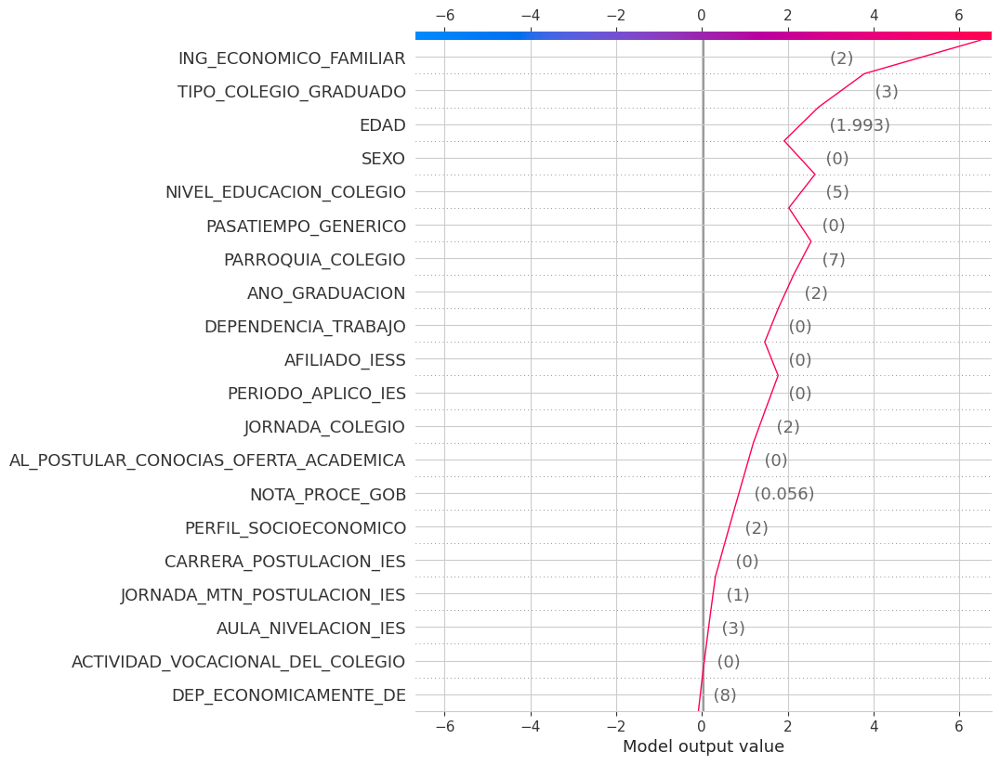

Instancia 171:
Predicción del modelo: 1
Valor real: 0
--------------------
SHAP Decision Plot para la instancia aleatoria 173 - XGBoosting


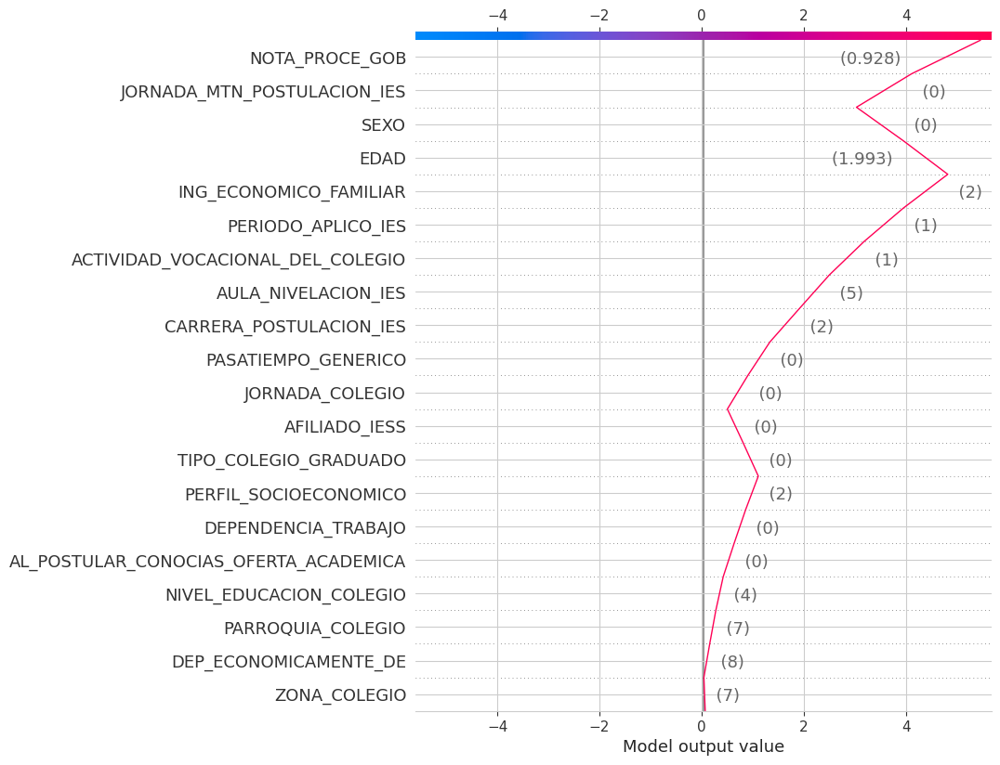

Instancia 173:
Predicción del modelo: 1
Valor real: 1
--------------------
SHAP Decision Plot para la instancia aleatoria 208 - XGBoosting


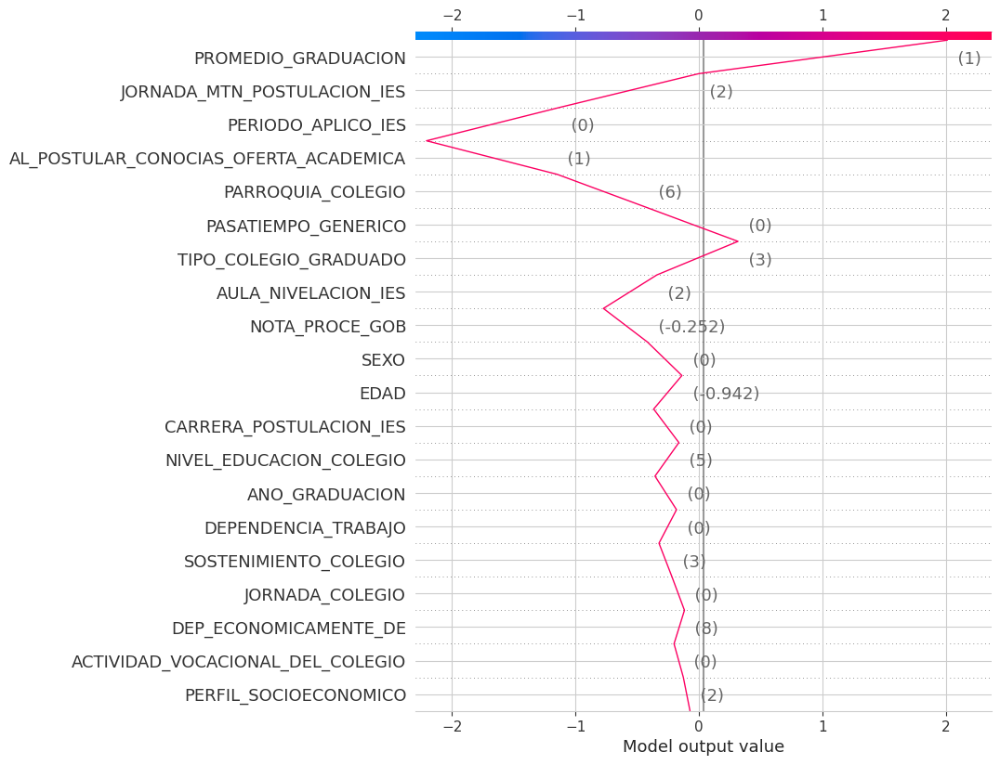

Instancia 208:
Predicción del modelo: 1
Valor real: 1
--------------------
SHAP Decision Plot para la instancia aleatoria 227 - XGBoosting


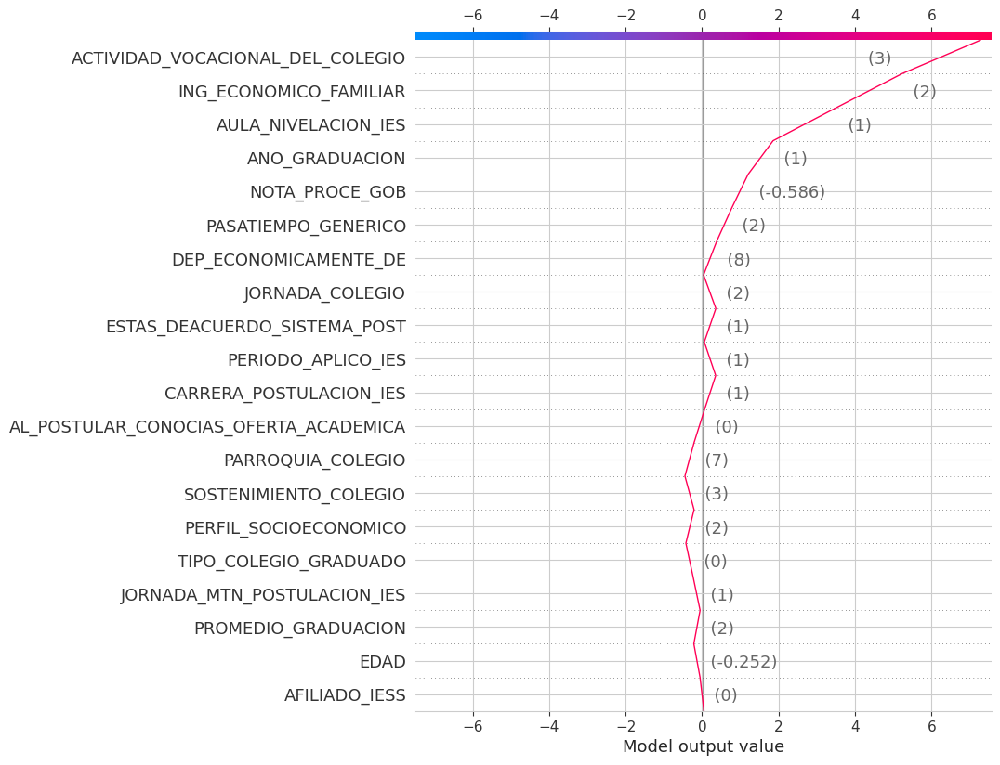

Instancia 227:
Predicción del modelo: 1
Valor real: 1
--------------------
SHAP Decision Plot para la instancia aleatoria 61 - XGBoosting


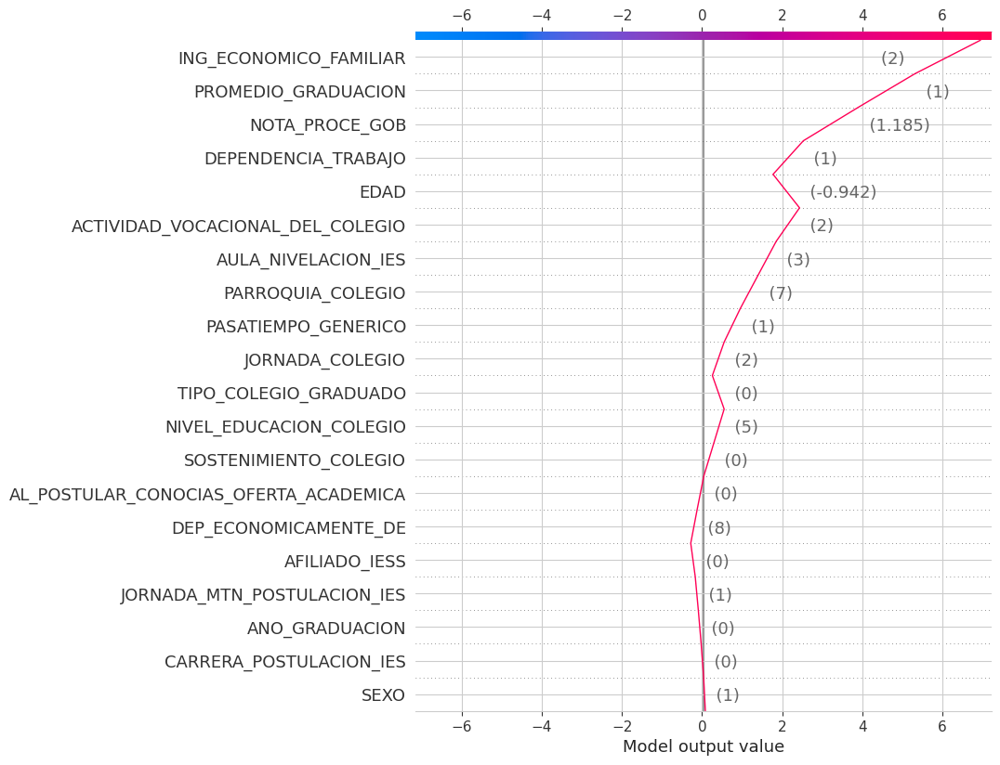

Instancia 61:
Predicción del modelo: 1
Valor real: 1
--------------------
SHAP Decision Plot para la instancia aleatoria 136 - XGBoosting


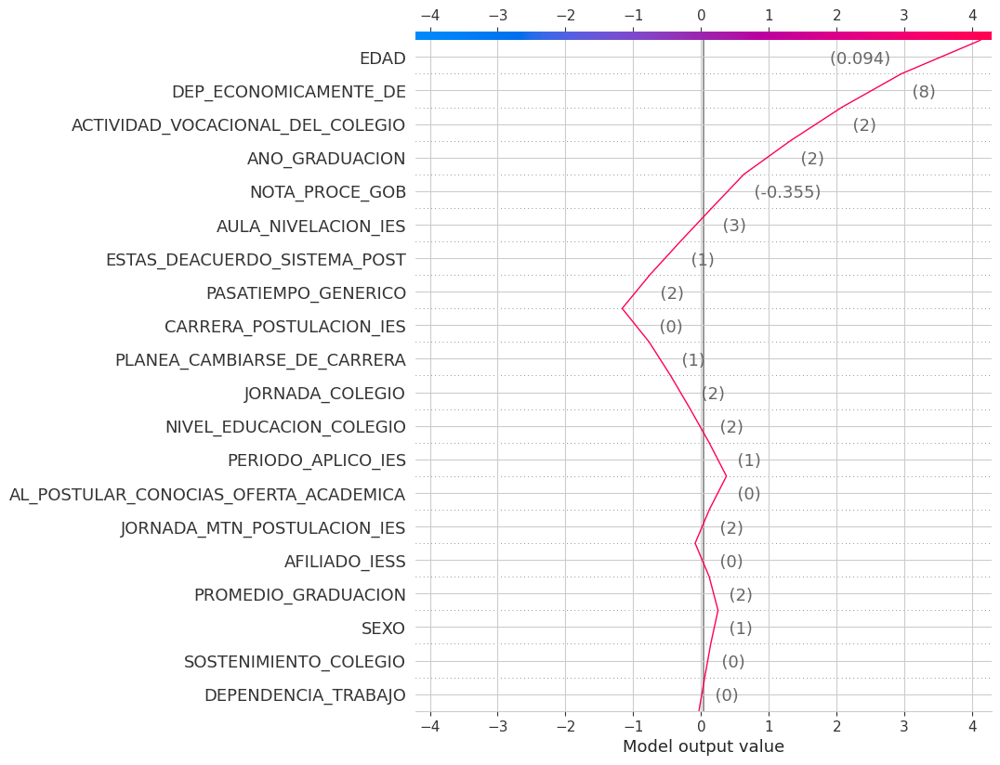

Instancia 136:
Predicción del modelo: 1
Valor real: 1
--------------------
SHAP Decision Plot para la instancia aleatoria 5 - XGBoosting


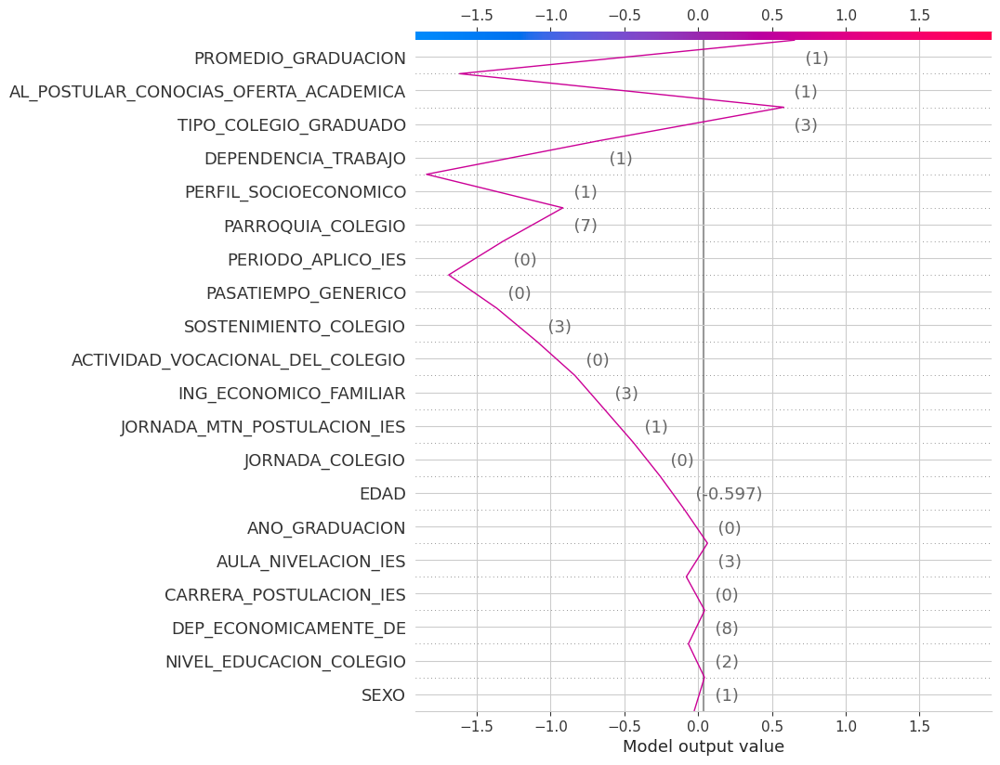

Instancia 5:
Predicción del modelo: 1
Valor real: 1
--------------------
SHAP Decision Plot para la instancia aleatoria 194 - XGBoosting


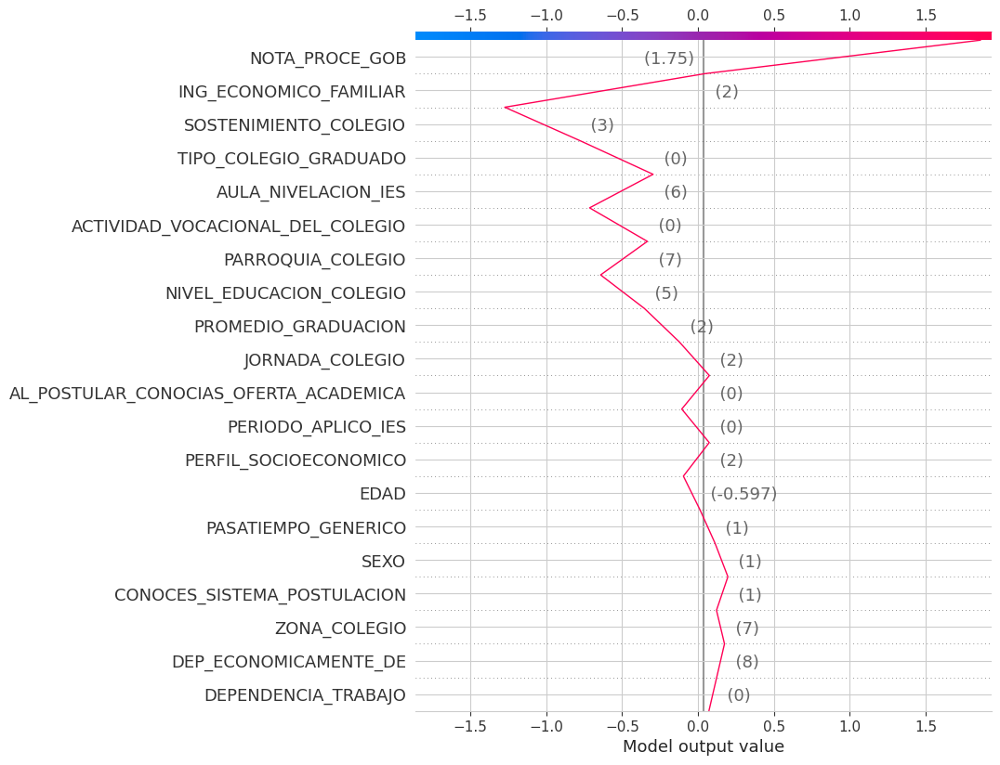

Instancia 194:
Predicción del modelo: 1
Valor real: 1
--------------------
SHAP Decision Plot para la instancia aleatoria 118 - XGBoosting


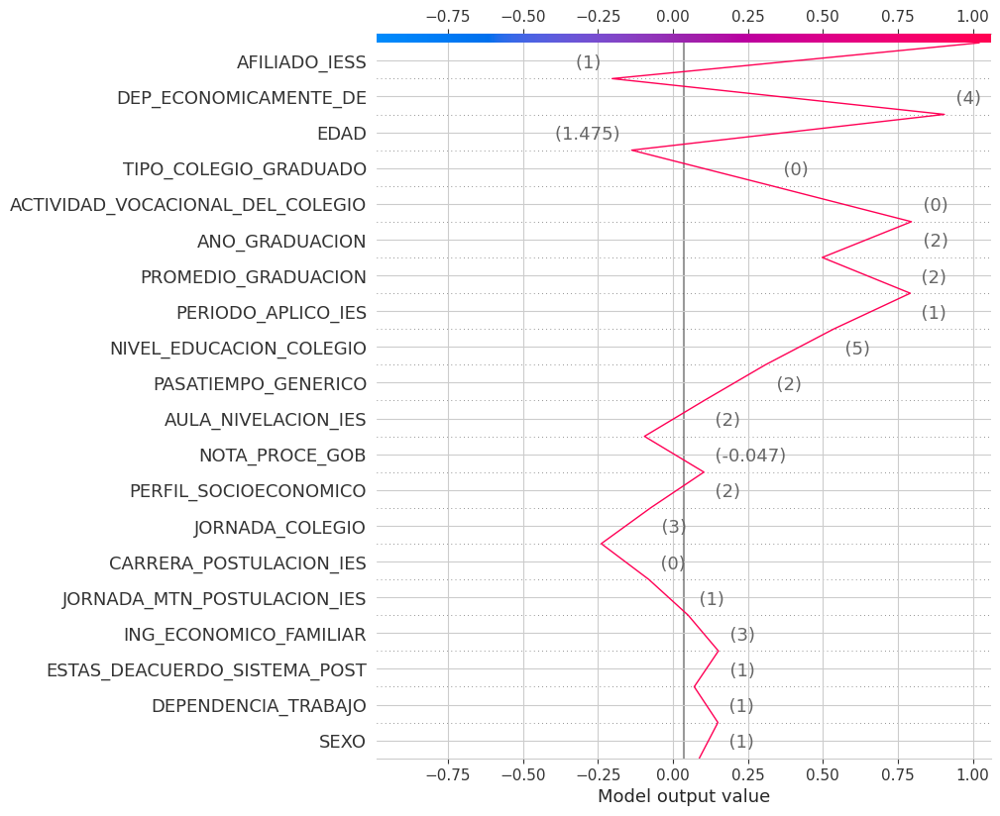

Instancia 118:
Predicción del modelo: 1
Valor real: 1
--------------------
SHAP Decision Plot para la instancia aleatoria 11 - XGBoosting


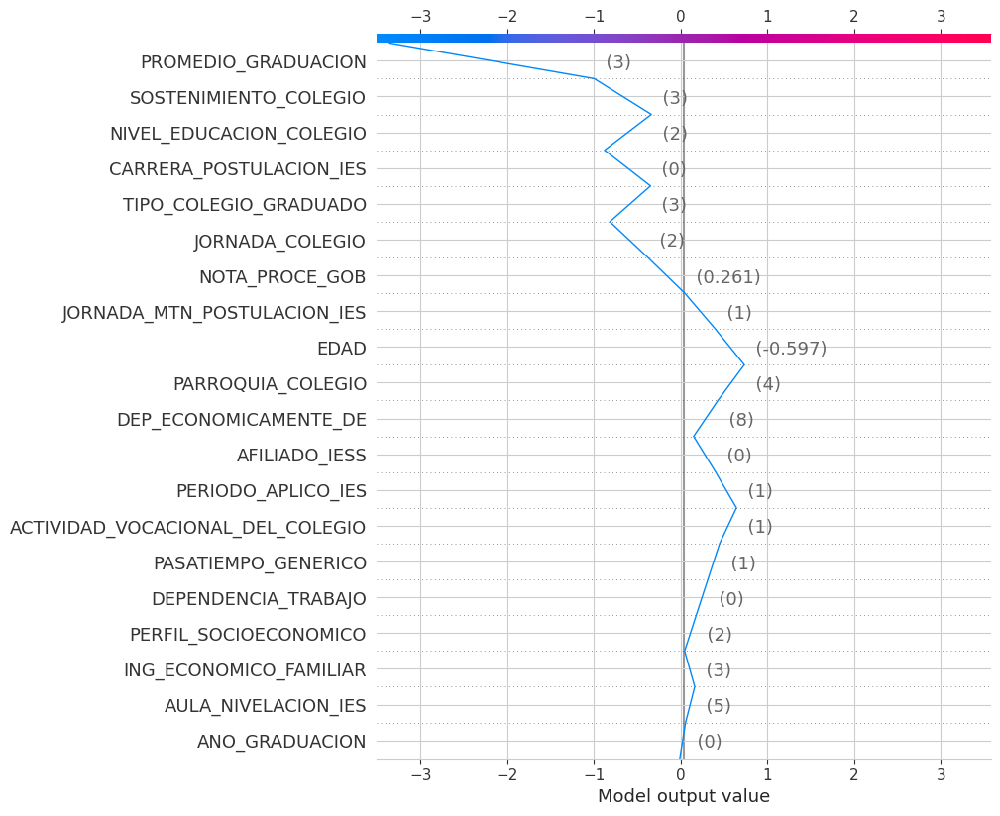

Instancia 11:
Predicción del modelo: 0
Valor real: 1
--------------------
SHAP Decision Plot para la instancia aleatoria 159 - XGBoosting


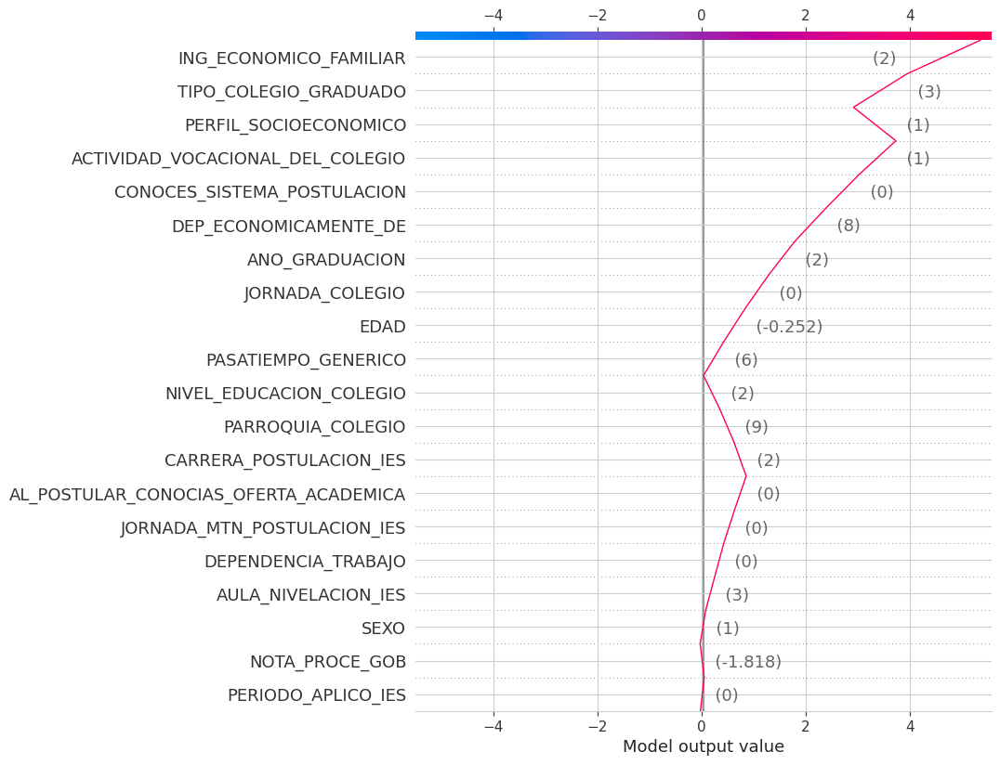

Instancia 159:
Predicción del modelo: 1
Valor real: 1
--------------------
SHAP Decision Plot para la instancia aleatoria 24 - XGBoosting


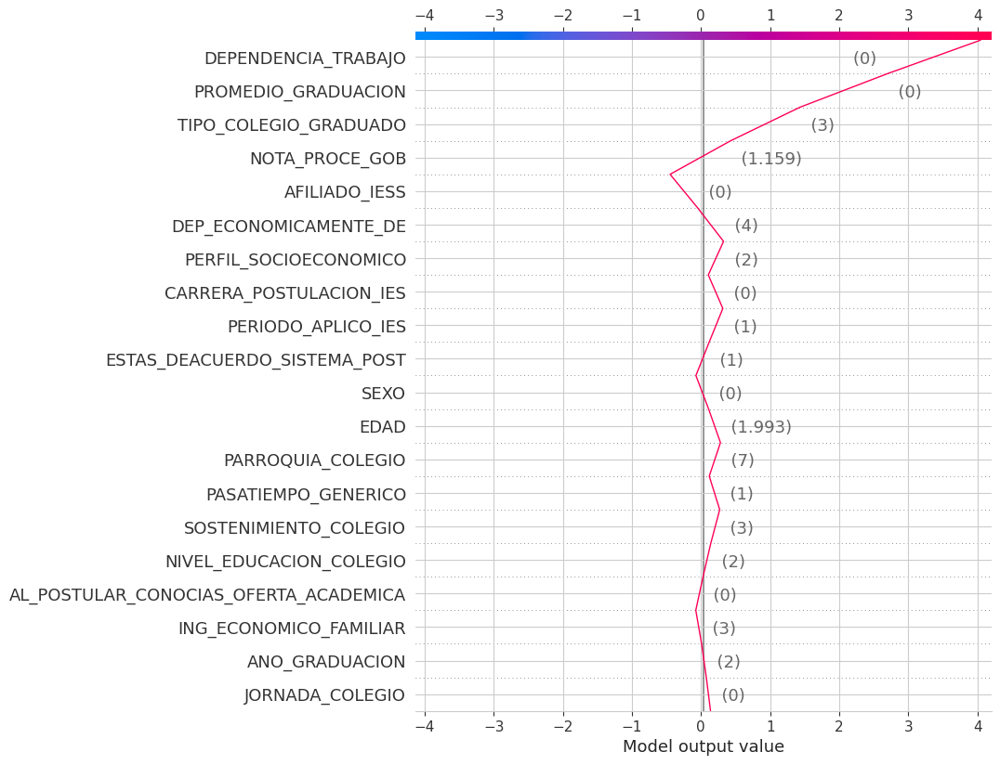

Instancia 24:
Predicción del modelo: 1
Valor real: 1
--------------------
SHAP Decision Plot para la instancia aleatoria 178 - XGBoosting


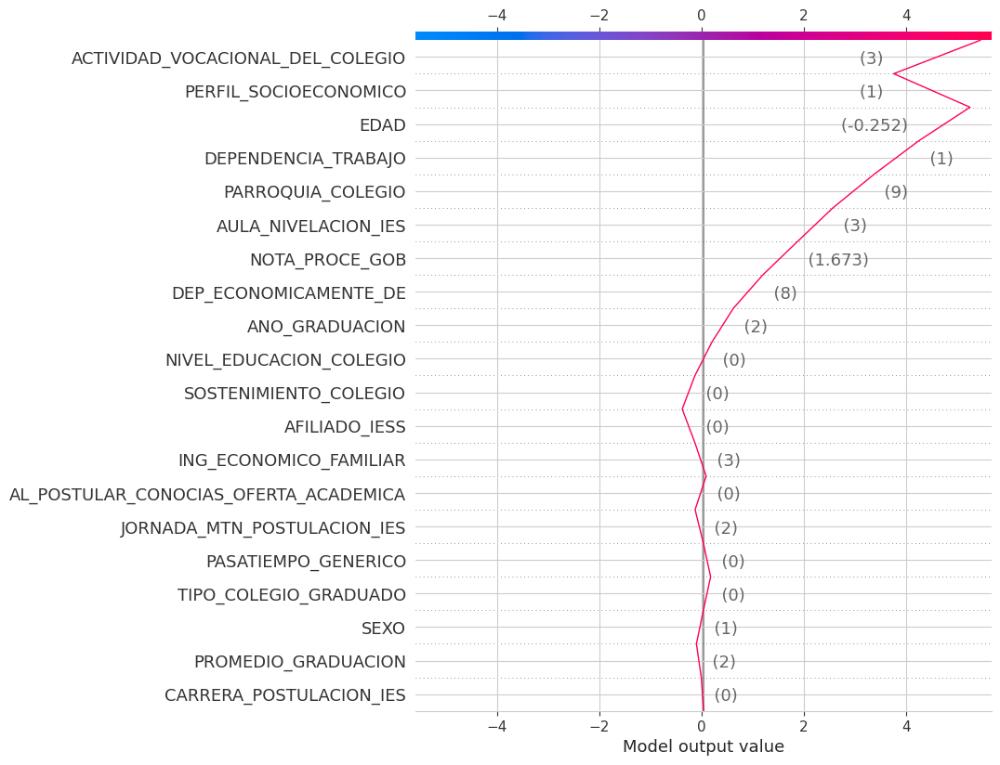

Instancia 178:
Predicción del modelo: 1
Valor real: 0
--------------------
SHAP Decision Plot para la instancia aleatoria 187 - XGBoosting


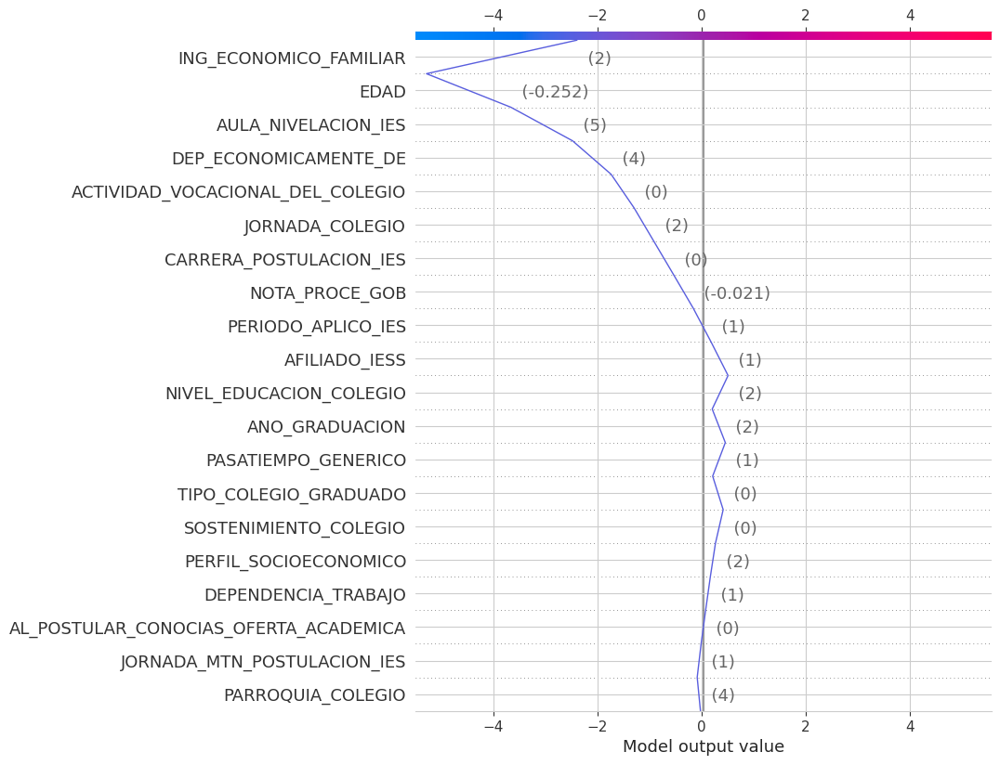

Instancia 187:
Predicción del modelo: 0
Valor real: 1
--------------------
SHAP Decision Plot para la instancia aleatoria 142 - XGBoosting


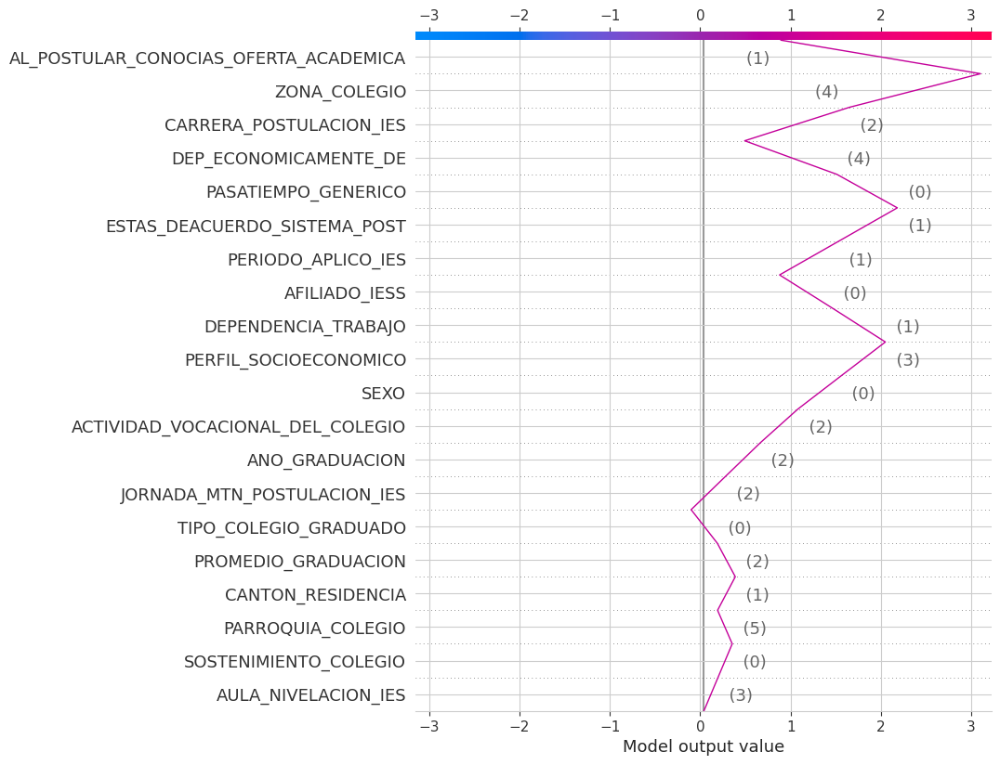

Instancia 142:
Predicción del modelo: 1
Valor real: 1
--------------------
SHAP Decision Plot para la instancia aleatoria 137 - XGBoosting


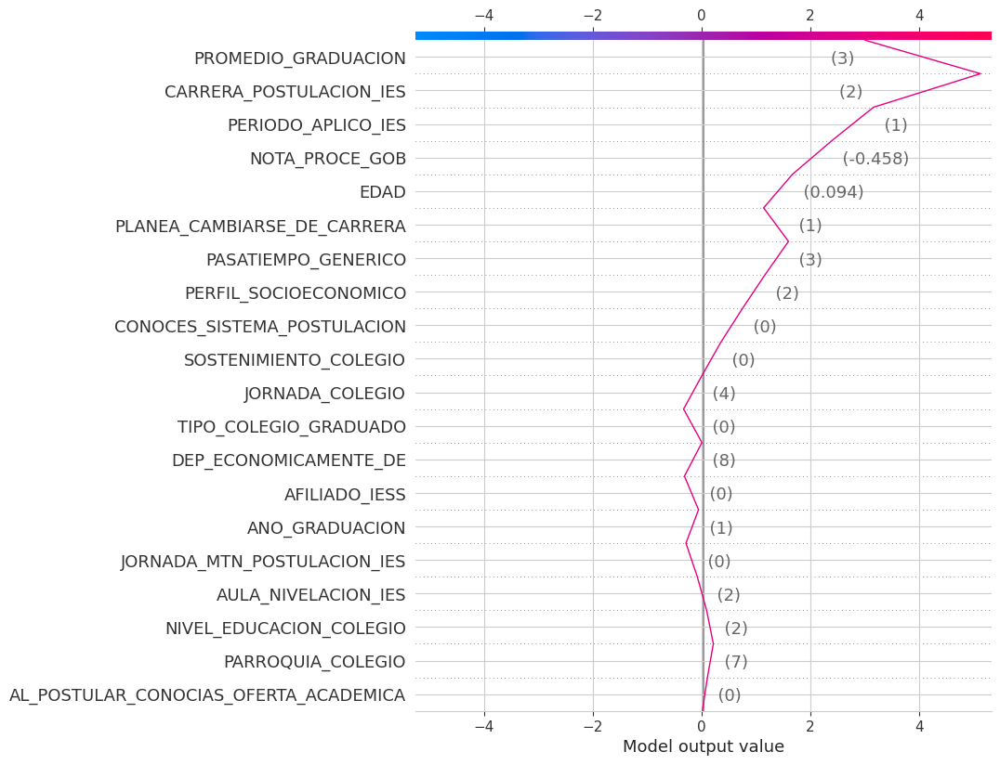

Instancia 137:
Predicción del modelo: 1
Valor real: 0
--------------------
SHAP Decision Plot para la instancia aleatoria 228 - XGBoosting


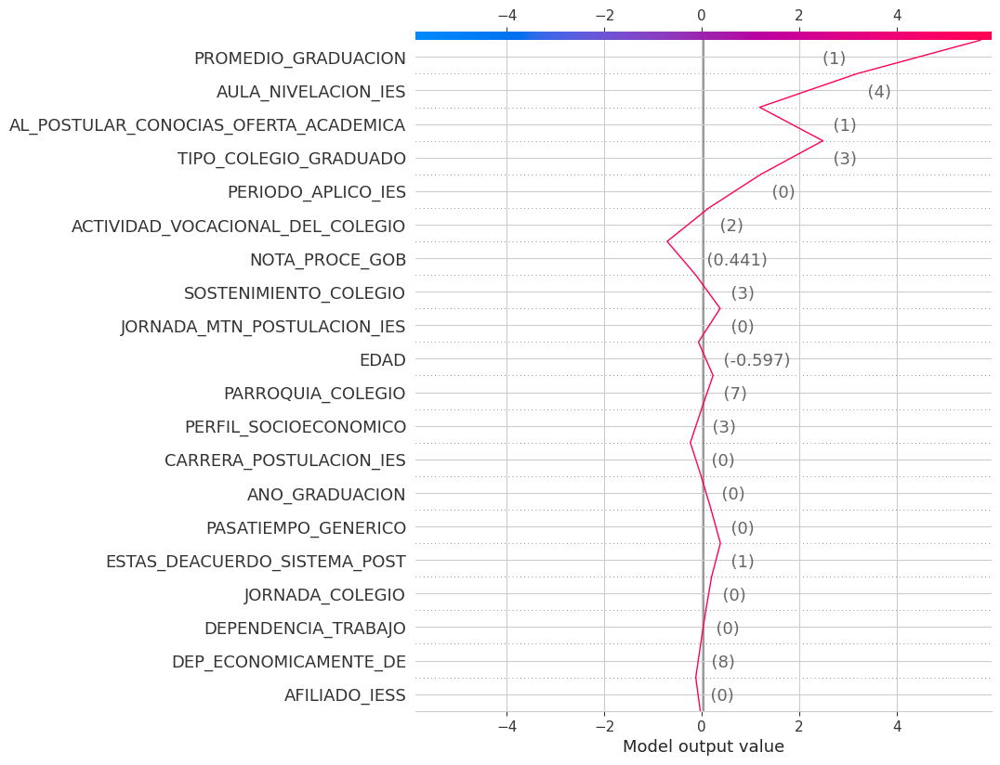

Instancia 228:
Predicción del modelo: 1
Valor real: 1
--------------------
SHAP Decision Plot para la instancia aleatoria 81 - XGBoosting


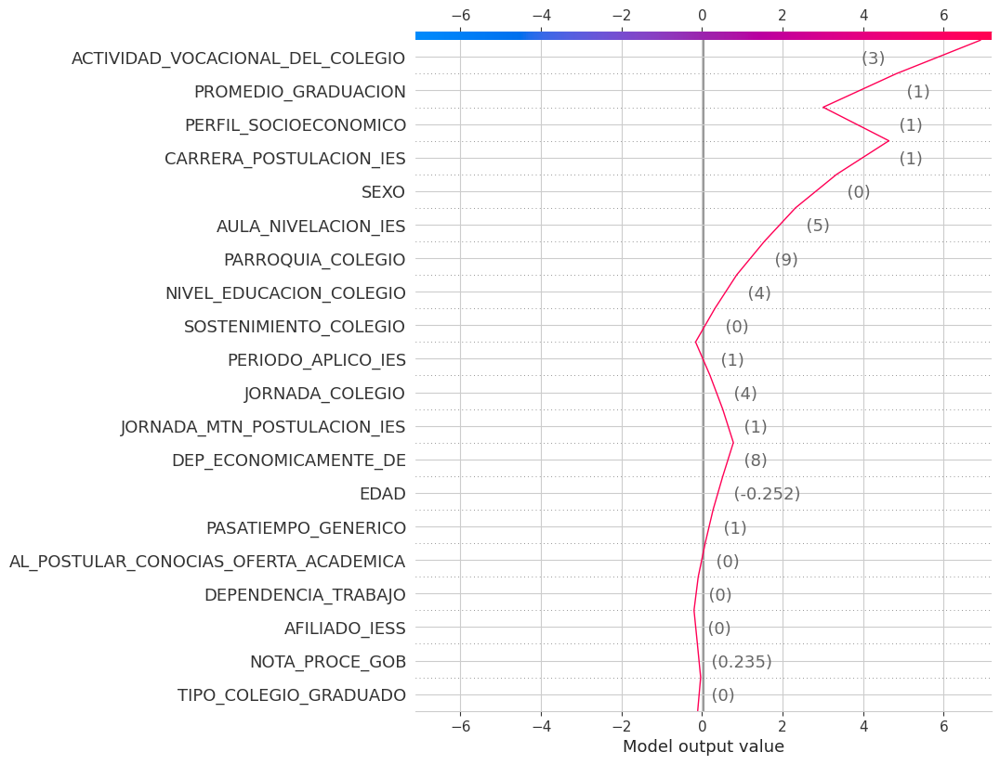

Instancia 81:
Predicción del modelo: 1
Valor real: 1
--------------------
SHAP Decision Plot para la instancia aleatoria 42 - XGBoosting


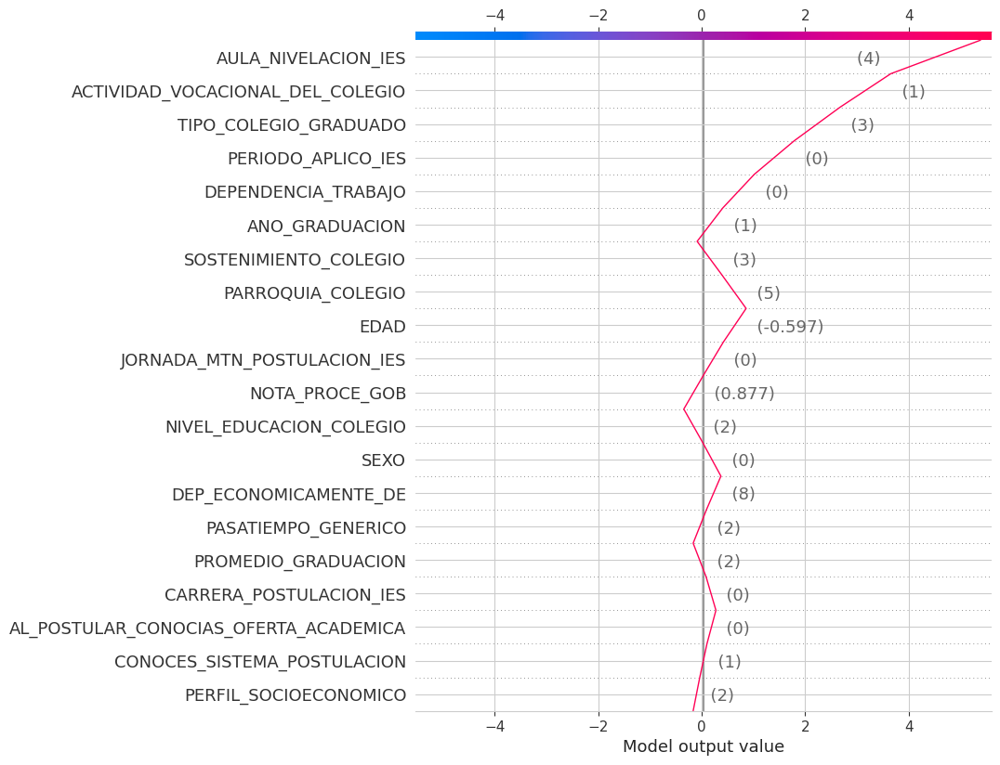

Instancia 42:
Predicción del modelo: 1
Valor real: 1
--------------------
SHAP Decision Plot para la instancia aleatoria 197 - XGBoosting


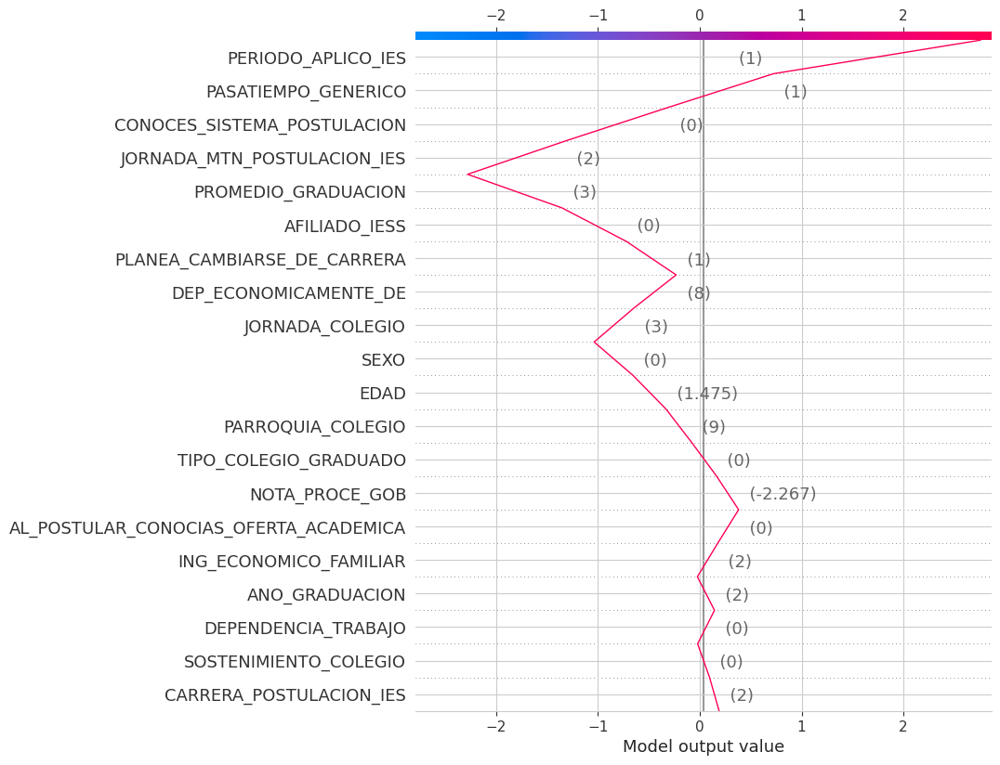

Instancia 197:
Predicción del modelo: 1
Valor real: 1
--------------------


In [341]:
import shap
import matplotlib.pyplot as plt
import numpy as np

# Se convierte los datos a matrices NumPy
X_test_30_np = X_test_30.to_numpy()

# Se seleccionar 20 índices aleatorios
random_indices = np.random.choice(X_test_30_np.shape[0], 20, replace=False)

# Se calcula los valores SHAP utilizando TreeExplainer para las instancias aleatorias
explainer_xgb = shap.TreeExplainer(xgb_30)
shap_values_xgb = explainer_xgb.shap_values(X_test_30_np[random_indices])

# Se verifica que feature_names sea una lista
feature_names = X_test_30.columns.tolist()

# Se crea el SHAP decision plot para cada una de las 20 instancias aleatorias
for i, idx in enumerate(random_indices):
    plt.figure(figsize=(8, 4))
    print(f'SHAP Decision Plot para la instancia aleatoria {idx} - XGBoosting')
    shap.decision_plot(explainer_xgb.expected_value, shap_values_xgb[i], X_test_30_np[idx],
                       feature_names=feature_names)
    # Opcional: Imprimir información adicional sobre la instancia
    print(f"Instancia {idx}:")
    print(f"Predicción del modelo: {xgb_30.predict(X_test_30_np[idx].reshape(1, -1))[0]}")
    print(f"Valor real: {y_test.iloc[idx]}")
    print("--------------------")

In [342]:
X_train = X_train_30.copy()
X_test =  X_test_30.copy()